# Importing Python Libraries

In [1]:
import os
import sys
import os.path
import numpy as np
import gc
import keras
import random
import h5py
import json
import itertools
import pickle as pkl
from shutil import copy2
from matplotlib import pyplot as plt
from keras.models import model_from_json
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from keras.models import Sequential
from keras.models import load_model
from keras.optimizers import SGD, RMSprop, Adam
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
from keras.preprocessing.image import save_img
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.externals import joblib
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

Using TensorFlow backend.


# Defining I/O Functions

In [2]:
def loadDataset(FD, NFD):
    gc.collect()
    Food = []
    counter1 = 0
    skip1 = 0
    counter2 = 0
    skip2 = 0
    print('Starting stage 1 of 4:')
    print('Loading food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            img_array = img_to_array(img)
            Food.append(img_array)
            counter1 += 1
        else:
            skip1 += 1
        if(counter1 % 100 == 0):
            print('%d images have been loaded so far...' %(counter1))
    print('%d food images were loaded. %d food images were skipped' %(counter1, skip1))
    print('Starting stage 2 of 4:')
    print('Loading non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            img_array = img_to_array(img)
            Food.append(img_array)
            counter2 += 1
        else:
            skip2 += 1
        if(counter2 % 100 == 0):
            print('%d images have been loaded so far...' %(counter2))
    print('%d non food images were loaded. %d non food images were skipped' %(counter2, skip2))
    print('Starting stage 3 of 4:')
    print('Converting food images to array...')
    XF = np.array(Food)
    print('Converted...')
    print('Starting stage 4 of 4:')
    print('Cleaning up Memory...')
    del Food
    gc.collect()
    print('Done.')
    return XF, counter1, counter2
        
def loadFoodDataset(FD):
    gc.collect()
    Food = []
    counter1 = 0
    skip1 = 0
    print('Starting stage 1 of 3:')
    print('Loading food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            img_array = img_to_array(img)
            Food.append(img_array)
            counter1 += 1
        else:
            skip1 += 1
        if(counter1 % 100 == 0):
            print('%d images have been loaded so far...' %(counter1))
    print('%d food images were loaded. %d food images were skipped' %(counter1, skip1))
    print('Starting stage 2 of 3:')
    print('Converting food images to arrays...')
    XF = np.array(Food)
    print('Converted...')
    print('Starting stage 3 of 3:')
    print('Cleaning up Memory...')
    del Food
    gc.collect()
    print('Done.')
    return XF

def loadNonFoodDataset(NFD):
    gc.collect()
    NoFood = []
    counter2 = 0
    skip2 = 0
    print('Starting stage 1 of 3:')
    print('Loading non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            img_array = img_to_array(img)
            NoFood.append(img_array)
            counter2 += 1
        else:
            skip2 += 1
        if(counter2 % 100 == 0):
            print('%d images have been loaded so far...' %(counter2))
    print('%d non food images were loaded. %d non food images were skipped' %(counter2, skip2))
    print('Starting stage 2 of 3:')
    print('Converting food images to arrays...')
    XNF = np.array(NoFood)
    print('Converted...')
    print('Starting stage 3 of 3:')
    print('Cleaning up Memory...')
    del NoFood
    gc.collect()
    print('Done.')
    return XNF

def loadY_Split(XF, XNF):
    print('Loading Y...')
    yf = []
    for i in range(XF.shape[0]):
        yf.append(1)
    ynf = []
    for j in range(XNF.shape[0]):
        ynf.append(0)
    YF = np.array(yf)
    YNF = np.array(ynf)
    del yf
    del ynf
    gc.collect()
    print('Done Loading Y.')
    return YF, YNF

def loadY(XF, XNF):
    print('Loading Y...')
    yf = []
    for i in range(XF.shape[0]):
        yf.append(1)
    for j in range(XNF.shape[0]):
        yf.append(0)
    YF = np.array(yf)
    del yf
    gc.collect()
    print('Done Loading Y.')
    return YF

def generateY(counter1, counter2):
    print('Loading Y...')
    yf = []
    for i in range(counter1):
        yf.append(1)
    for j in range(counter2):
        yf.append(0)
    YF = np.array(yf)
    del yf
    gc.collect()
    print('Done Loading Y.')
    return YF

def mergeY(YF, YNF):
    temp = []
    if(YF.shape[0] < YNF.shape[0]):
        for i in range(YF.shape[0]):
            temp.append(YF[i])
            temp.append(YNF[i])
        for j in range (YNF.shape[0] - YF.shape[0]):
            temp.append(YNF[j + YF.shape[0]])
    else:
        for i in range(YNF.shape[0]):
            temp.append(YF[i])
            temp.append(YNF[i])
        for j in range (YF.shape[0] - YNF.shape[0]):
            temp.append(YF[j + YNF.shape[0]])
    Y = np.array(temp)
    del temp
    gc.collect()
    return Y

def mergeY_Simple(YF, YNF):
    temp = []
    for i in range(YF.shape[0]):
        temp.append(YF[i])
    for j in range (YNF.shape[0]):
        temp.append(YNF[j])
    Y = np.array(temp)
    del temp
    gc.collect()
    return Y
    
def mergeX(XF, XNF):
    temp = []
    if(XF.shape[0] < XNF.shape[0]):
        for i in range(XF.shape[0]):
            temp.append(XF[i])
            temp.append(XNF[i])
        for j in range (XNF.shape[0] - XF.shape[0]):
            temp.append(XNF[j + XF.shape[0]])
    else:
        for i in range(XNF.shape[0]):
            temp.append(XF[i])
            temp.append(XNF[i])
        for j in range (XF.shape[0] - XNF.shape[0]):
            temp.append(XF[j + XNF.shape[0]])
    X = np.array(temp)
    del temp
    gc.collect()
    return X

def mergeX_Simple(XF, XNF):
    temp = []
    for i in range(XF.shape[0]):
        temp.append(XF[i])
    for j in range (XNF.shape[0]):
        temp.append(XNF[j])
    X = np.array(temp)
    del temp
    gc.collect()
    return X

In [3]:
def FastDatasetLoading_16bit_train_test_validation_categorical_shuffle(FD, NFD, ratio1, ratio2):
    if(ratio1 > 0.99 or ratio2 > 0.99 or ratio1 + ratio2 > 0.99):
        print('Invalid Ratio Values!!!')
        return -1
    gc.collect()
    counter1 = 0
    counter2 = 0
    skip1 = 0
    skip2 = 0
    num = 0
    food = True
    image = []
    print('Starting stage 1 of 10:')
    print('Querying food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            if(counter1 < 1):
                img_array = img_to_array(img)
                image.append(img_array)
            counter1 += 1 
        else:
            skip1 += 1
    print('%d food images are available, %d are Skipped...' %(counter1, skip1))
    print('Starting stage 2 of 10:')
    print('Querying non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            counter2 += 1 
        else:
            skip2 += 1
    print('%d non food images are available, %d are Skipped...' %(counter2, skip2))
    print('Starting stage 3 of 10:')
    print('Balancing dataset classes...')
    if (counter1 < counter2):
        food = False
        num = counter1
    else:
        food = True
        num = counter2
    print('Dataset classes balanced: %d images each' %(num))
    print('Starting stage 4 of 10:')
    print('Initializing loading procedure...')
    test_size = int(2*num*ratio1)
    val_size = int(2*num*ratio2)
    train_size = int(2*num - (test_size + val_size))
    if(train_size % 2 != 0):
        train_size += 1
        test_size -= 1
    if(test_size % 2 != 0):
        test_size += 1
        val_size -= 1
    if(val_size % 2 != 0):
        print('fixing proportions...')
        val_size -= 1
    print('%d training images will be loaded: %d for food, %d for non food.' %(train_size, train_size/2, train_size/2))
    print('%d testing images will be loaded: %d for food, %d for non food.' %(test_size, test_size/2, test_size/2))
    print('%d validation images will be loaded: %d for food, %d for non food.' %(val_size, val_size/2, val_size/2))
    pic = np.array(image)
    X_train = np.empty ((train_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    X_test = np.empty ((test_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    X_val = np.empty ((val_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    Y_train = np.empty (train_size, np.int16)
    Y_test = np.empty (test_size, np.int16)
    Y_val = np.empty (val_size, np.int16)
    SHUFFLE = np.arange(num)
    np.random.shuffle(SHUFFLE)
    index1 = []
    index2 = []
    if(not food):
        for i in range(num):
            index2.append(i)
        while (True):
            r = random.randint(0,counter1)
            if r not in index1: 
                index1.append(r)
            if(len(index1) == num):
                break
    else:
        for i in range(num):
            index1.append(i)
        while (True):
            r = random.randint(0,counter2)
            if r not in index2: 
                index2.append(r)
            if(len(index2) == num):
                break
    print('Loading Procedure Initialized Succesfully.')
    print('Starting stage 5 of 10:')
    print('Loading and Normalizing food exposure images...')
    if(not food):
        i = 0
        a = 0
        b = 0
        v = 0
        s1 = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                if(SHUFFLE[i] < (train_size / 2)):
                    X_train[b] = img_array
                    Y_train[b] = 1
                    b += 1
                elif(SHUFFLE[i] >= (train_size / 2) and SHUFFLE[i] < ((train_size + test_size) / 2)):
                    X_test[a] = img_array
                    Y_test[a] = 1
                    a += 1
                else:
                    X_val[v] = img_array
                    Y_val[v] = 1
                    v += 1
                i += 1
            else:
                s1 += 1
            if(i % 1000 == 0):
                print('%d food images have been loaded so far...' %(i))
        print('%d food images were loaded. %d food images were skipped.' %(i, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(b, a, v))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(i == num and i == counter1 and b == int(train_size/2) and a == int(test_size/2) and v == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(b, train_size/2))
            print('%d test images loaded, %d expected.' %(a, test_size/2))
            print('%d validation images loaded, %d expected.' %(v, val_size/2))
            print('%d total images loaded, %d expected.' %(i, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading and Normalizing non food exposure images...')
        j = int(train_size / 2)
        k = 0
        n = 0
        m = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        f = int(val_size / 2)
        g = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                m += 1
                if k in index2:
                    img_array = img_to_array(img)
                    img_array = img_array / 255.0
                    if(SHUFFLE[n] < (train_size / 2)):
                        X_train[c] = img_array
                        Y_train[c] = 0
                        c += 1
                    elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                        X_test[d] = img_array
                        Y_test[d] = 0
                        d += 1
                        e += 1
                    else:
                        X_val[f] = img_array
                        Y_val[f] = 0
                        f += 1
                        g += 1
                    j += 1
                    n += 1
                k += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d validation non food images were loaded.' %(c - int(train_size / 2), e, g))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and m == counter2 and c == train_size and e == int(test_size/2) and g == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(g, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    else:
        j = 0
        k = 0
        s1 = 0
        a = 0
        b = 0
        f = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None: 
                if k in index2:
                    img_array = img_to_array(img)
                    img_array = img_array / 255.0
                    if(SHUFFLE[j] < (train_size / 2)):
                        X_train[a] = img_array
                        Y_train[a] = 1
                        a += 1
                    elif(SHUFFLE[j] >= (train_size / 2) and SHUFFLE[j] < ((train_size + test_size) / 2)):
                        X_test[b] = img_array
                        Y_test[b] = 1
                        b += 1
                    else:
                        X_val[f] = img_array
                        Y_val[f] = 1
                        f += 1
                    j += 1
                k += 1
            else:
                s1 += 1
            if(j % 1000 == 0):
                print('%d food images have been loaded so far...' %(j))
        print('%d food images were loaded. %d food images were skipped' %(j, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(a, b, f))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(j == num and k == counter1 and a == int(train_size/2) and b == int(test_size/2) and f == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(a, train_size/2))
            print('%d test images loaded, %d expected.' %(b, test_size/2))
            print('%d validation images loaded, %d expected.' %(f, val_size/2))
            print('%d total images loaded, %d expected.' %(j, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading and Normalizing non food exposure images...')
        i = int(train_size / 2)
        n = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        v = int(val_size / 2)
        w = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                if(SHUFFLE[n] < (train_size / 2)):
                    X_train[c] = img_array
                    Y_train[c] = 0
                    c += 1
                elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                    X_test[d] = img_array
                    Y_test[d] = 0
                    d += 1
                    e += 1
                else:
                    X_val[v] = img_array
                    Y_val[v] = 0
                    v += 1
                    w += 1
                i += 1
                n += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non food images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d Validation non food images were loaded.' %(c - int(train_size / 2), e, w))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and n == counter2 and c == train_size and e == int(test_size/2) and w == int (val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(w, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    y_train = keras.utils.to_categorical(Y_train, 2)
    y_test = keras.utils.to_categorical(Y_test, 2) 
    y_val = keras.utils.to_categorical(Y_val, 2)
    print('Dataset Loading Process Terminated Sucessfully.')
    gc.collect()
    return X_train, y_train, X_test, y_test, X_val, y_val, SHUFFLE, Y_train, Y_test, Y_val

In [4]:
def FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(FD, NFD, ratio1, ratio2):
    if(ratio1 > 1 or ratio2 > 1 or ratio1 + ratio2 > 1):
        print('Invalid Ratio Values!!!')
        return -1
    gc.collect()
    counter1 = 0
    counter2 = 0
    skip1 = 0
    skip2 = 0
    num = 0
    food = True
    equal = False
    image = []
    print('Starting stage 1 of 10:')
    print('Querying food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            if(counter1 < 1):
                img_array = img_to_array(img)
                image.append(img_array)
            counter1 += 1 
        else:
            skip1 += 1
    print('%d food images are available, %d are Skipped...' %(counter1, skip1))
    print('Starting stage 2 of 10:')
    print('Querying non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            counter2 += 1 
        else:
            skip2 += 1
    print('%d non food images are available, %d are Skipped...' %(counter2, skip2))
    print('Starting stage 3 of 10:')
    print('Balancing dataset classes...')
    if (counter1 < counter2):
        food = False
        num = counter1
    elif (counter1 > counter2):
        food = True
        num = counter2
    else:
        equal = True
        num = counter1
    print('Dataset classes balanced: %d images each' %(num))
    print('Starting stage 4 of 10:')
    print('Initializing loading procedure...')
    test_size = int(2*num*ratio1)
    val_size = int(2*num*ratio2)
    train_size = int(2*num - (test_size + val_size))
    if(train_size % 2 != 0):
        train_size += 1
        test_size -= 1
    if(test_size % 2 != 0):
        test_size += 1
        val_size -= 1
    if(val_size % 2 != 0):
        print('fixing proportions...')
        val_size -= 1
    print('%d training images will be loaded: %d for food, %d for non food.' %(train_size, train_size/2, train_size/2))
    print('%d testing images will be loaded: %d for food, %d for non food.' %(test_size, test_size/2, test_size/2))
    print('%d validation images will be loaded: %d for food, %d for non food.' %(val_size, val_size/2, val_size/2))
    pic = np.array(image)
    X_train = np.empty ((train_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    X_test = np.empty ((test_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    X_val = np.empty ((val_size, pic.shape[1], pic.shape[2], pic.shape[3]), np.float16)
    Y_train = np.empty (train_size, np.int16)
    Y_test = np.empty (test_size, np.int16)
    Y_val = np.empty (val_size, np.int16)
    SHUFFLE = np.arange(num)
    np.random.shuffle(SHUFFLE)
    index1 = []
    index2 = []
    if(not food and not equal):
        for i in range(num):
            index2.append(i)
        while (True):
            r = random.randint(0,counter1)
            if r not in index1: 
                index1.append(r)
            if(len(index1) == num):
                break
    elif(food and not equal):
        for i in range(num):
            index1.append(i)
        while (True):
            r = random.randint(0,counter2)
            if r not in index2: 
                index2.append(r)
            if(len(index2) == num):
                break
    print('Loading Procedure Initialized Succesfully.')
    print('Starting stage 5 of 10:')
    print('Loading and Normalizing food exposure images...')
    if(not food and not equal):
        i = 0
        a = 0
        b = 0
        v = 0
        s1 = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                if(SHUFFLE[i] < (train_size / 2)):
                    X_train[b] = img_array
                    Y_train[b] = 1
                    b += 1
                elif(SHUFFLE[i] >= (train_size / 2) and SHUFFLE[i] < ((train_size + test_size) / 2)):
                    X_test[a] = img_array
                    Y_test[a] = 1
                    a += 1
                else:
                    X_val[v] = img_array
                    Y_val[v] = 1
                    v += 1
                i += 1
            else:
                s1 += 1
            if(i % 1000 == 0):
                print('%d food images have been loaded so far...' %(i))
        print('%d food images were loaded. %d food images were skipped.' %(i, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(b, a, v))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(i == num and i == counter1 and b == int(train_size/2) and a == int(test_size/2) and v == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(b, train_size/2))
            print('%d test images loaded, %d expected.' %(a, test_size/2))
            print('%d validation images loaded, %d expected.' %(v, val_size/2))
            print('%d total images loaded, %d expected.' %(i, num))
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading and Normalizing non food exposure images...')
        j = int(train_size / 2)
        k = 0
        n = 0
        m = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        f = int(val_size / 2)
        g = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                m += 1
                if k in index2:
                    img_array = img_to_array(img)
                    img_array = img_array / 255.0
                    if(SHUFFLE[n] < (train_size / 2)):
                        X_train[c] = img_array
                        Y_train[c] = 0
                        c += 1
                    elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                        X_test[d] = img_array
                        Y_test[d] = 0
                        d += 1
                        e += 1
                    else:
                        X_val[f] = img_array
                        Y_val[f] = 0
                        f += 1
                        g += 1
                    j += 1
                    n += 1
                k += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d validation non food images were loaded.' %(c - int(train_size / 2), e, g))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and m == counter2 and c == train_size and e == int(test_size/2) and g == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(g, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    elif(food and not equal):
        j = 0
        k = 0
        s1 = 0
        a = 0
        b = 0
        f = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None: 
                if k in index2:
                    img_array = img_to_array(img)
                    img_array = img_array / 255.0
                    if(SHUFFLE[j] < (train_size / 2)):
                        X_train[a] = img_array
                        Y_train[a] = 1
                        a += 1
                    elif(SHUFFLE[j] >= (train_size / 2) and SHUFFLE[j] < ((train_size + test_size) / 2)):
                        X_test[b] = img_array
                        Y_test[b] = 1
                        b += 1
                    else:
                        X_val[f] = img_array
                        Y_val[f] = 1
                        f += 1
                    j += 1
                k += 1
            else:
                s1 += 1
            if(j % 1000 == 0):
                print('%d food images have been loaded so far...' %(j))
        print('%d food images were loaded. %d food images were skipped' %(j, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(a, b, f))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(j == num and k == counter1 and a == int(train_size/2) and b == int(test_size/2) and f+1 == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(a, train_size/2))
            print('%d test images loaded, %d expected.' %(b, test_size/2))
            print('%d validation images loaded, %d expected.' %(f, val_size/2))
            print('%d total images loaded, %d expected.' %(j, num))
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading and Normalizing non food exposure images...')
        i = int(train_size / 2)
        n = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        v = int(val_size / 2)
        w = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                if(SHUFFLE[n] < (train_size / 2)):
                    X_train[c] = img_array
                    Y_train[c] = 0
                    c += 1
                elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                    X_test[d] = img_array
                    Y_test[d] = 0
                    d += 1
                    e += 1
                else:
                    X_val[v] = img_array
                    Y_val[v] = 0
                    v += 1
                    w += 1
                i += 1
                n += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non food images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d Validation non food images were loaded.' %(c - int(train_size / 2), e, w))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and n == counter2 and c == train_size and e == int(test_size/2) and w == int (val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(w, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    else:
        n = 0
        s1 = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                X_val[n] = img_array
                Y_val[n] = 1 
                n += 1
            else:
                s1 += 1
            if(n % 1000 == 0):           
                print('%d non images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s1))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        print('Verification Completed Sucessfully...')
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading and Normalizing non food exposure images...')
        m = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                img_array = img_to_array(img)
                img_array = img_array / 255.0
                X_val[n] = img_array
                Y_val[n] = 0
                m += 1
                n += 1
            else:
                s2 += 1
            if(m % 1000 == 0):           
                print('%d non images have been loaded so far...' %(m))
        print('%d non food images were loaded. %d non food images were skipped' %(m, s2))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        print('Verification Completed Sucessfully...')
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()     
    y_train = keras.utils.to_categorical(Y_train, 2)
    y_test = keras.utils.to_categorical(Y_test, 2) 
    y_val = keras.utils.to_categorical(Y_val, 2)
    print('Dataset Loading Process Terminated Sucessfully.')
    gc.collect()
    return X_train, y_train, X_test, y_test, X_val, y_val, SHUFFLE, Y_train, Y_test, Y_val

In [5]:
def FastDatasetSorting_train_test_validation_shuffled(FD, NFD, ratio1, ratio2):
    if(ratio1 > 0.99 or ratio2 > 0.99 or ratio1 + ratio2 > 0.99):
        print('Invalid Ratio Values!!!')
        return -1
    gc.collect()
    counter1 = 0
    counter2 = 0
    skip1 = 0
    skip2 = 0
    num = 0
    food = True
    image = []
    MAIN_DIR = 'D:/Training Dataset/'
    TRAIN_DIR = MAIN_DIR + 'train/'
    TEST_DIR = MAIN_DIR + 'test/'
    VAL_DIR = MAIN_DIR + 'validation/'
    TRFD = TRAIN_DIR + 'food/'
    TRNFD = TRAIN_DIR + 'no food/'
    TSFD = TEST_DIR + 'food/'
    TSNFD = TEST_DIR + 'no food/'
    VLFD = VAL_DIR + 'food/'
    VLNFD = VAL_DIR + 'no food/'
    if not os.path.exists(MAIN_DIR):
        os.makedirs(MAIN_DIR)
    if not os.path.exists(TRAIN_DIR):
        os.makedirs(TRAIN_DIR)
    if not os.path.exists(TEST_DIR):
        os.makedirs(TEST_DIR)
    if not os.path.exists(VAL_DIR):
        os.makedirs(VAL_DIR)
    if not os.path.exists(TRFD):
        os.makedirs(TRFD)
    if not os.path.exists(TRNFD):
        os.makedirs(TRNFD)
    if not os.path.exists(TSFD):
        os.makedirs(TSFD)
    if not os.path.exists(TSNFD):
        os.makedirs(TSNFD)
    if not os.path.exists(VLFD):
        os.makedirs(VLFD)
    if not os.path.exists(VLNFD):
        os.makedirs(VLNFD)
    print('Starting stage 1 of 10:')
    print('Querying food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            counter1 += 1 
        else:
            skip1 += 1
    print('%d food images are available, %d are Skipped...' %(counter1, skip1))
    print('Starting stage 2 of 10:')
    print('Querying non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            counter2 += 1 
        else:
            skip2 += 1
    print('%d non food images are available, %d are Skipped...' %(counter2, skip2))
    print('Starting stage 3 of 10:')
    print('Balancing dataset classes...')
    if (counter1 < counter2):
        food = False
        num = counter1
    else:
        food = True
        num = counter2
    print('Dataset classes balanced: %d images each' %(num))
    print('Starting stage 4 of 10:')
    print('Initializing loading procedure...')
    test_size = int(2*num*ratio1)
    val_size = int(2*num*ratio2)
    train_size = int(2*num - (test_size + val_size))
    if(train_size % 2 != 0):
        train_size += 1
        test_size -= 1
    if(test_size % 2 != 0):
        test_size += 1
        val_size -= 1
    if(val_size % 2 != 0):
        print('fixing proportions...')
        val_size -= 1
    print('%d training images will be loaded: %d for food, %d for non food.' %(train_size, train_size/2, train_size/2))
    print('%d testing images will be loaded: %d for food, %d for non food.' %(test_size, test_size/2, test_size/2))
    print('%d validation images will be loaded: %d for food, %d for non food.' %(val_size, val_size/2, val_size/2))
    SHUFFLE = np.arange(num)
    np.random.shuffle(SHUFFLE)
    index1 = []
    index2 = []
    if(not food):
        for i in range(num):
            index2.append(i)
        while (True):
            r = random.randint(0,counter1)
            if r not in index1: 
                index1.append(r)
            if(len(index1) == num):
                break
    else:
        for i in range(num):
            index1.append(i)
        while (True):
            r = random.randint(0,counter2)
            if r not in index2: 
                index2.append(r)
            if(len(index2) == num):
                break
    print('Loading Procedure Initialized Succesfully.')
    print('Starting stage 5 of 10:')
    print('Loading food exposure images...')
    if(not food):
        i = 0
        a = 0
        b = 0
        v = 0
        s1 = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None:
                if(SHUFFLE[i] < (train_size / 2)):
                    copy2(image_path, TRFD + filename)
                    b += 1
                elif(SHUFFLE[i] >= (train_size / 2) and SHUFFLE[i] < ((train_size + test_size) / 2)):
                    copy2(image_path, TSFD + filename)
                    a += 1
                else:
                    copy2(image_path, VLFD + filename)
                    v += 1
                i += 1
            else:
                s1 += 1
            if(i % 1000 == 0):
                print('%d food images have been loaded so far...' %(i))
        print('%d food images were loaded. %d food images were skipped.' %(i, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(b, a, v))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(i == num and i == counter1 and b == int(train_size/2) and a == int(test_size/2) and v == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(b, train_size/2))
            print('%d test images loaded, %d expected.' %(a, test_size/2))
            print('%d validation images loaded, %d expected.' %(v, val_size/2))
            print('%d total images loaded, %d expected.' %(i, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading non food exposure images...')
        j = int(train_size / 2)
        k = 0
        n = 0
        m = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        f = int(val_size / 2)
        g = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                m += 1
                if k in index2:
                    if(SHUFFLE[n] < (train_size / 2)):
                        copy2(image_path, TRNFD + filename)
                        c += 1
                    elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                        copy2(image_path, TSNFD + filename)
                        d += 1
                        e += 1
                    else:
                        copy2(image_path, VLNFD + filename)
                        f += 1
                        g += 1
                    j += 1
                    n += 1
                k += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d validation non food images were loaded.' %(c - int(train_size / 2), e, g))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and m == counter2 and c == train_size and e == int(test_size/2) and g == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(g, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    else:
        j = 0
        k = 0
        s1 = 0
        a = 0
        b = 0
        f = 0
        for filename in os.listdir(FD):
            image_path = os.path.join(FD, filename)
            img = load_img(image_path)
            if img is not None: 
                if k in index2:
                    if(SHUFFLE[j] < (train_size / 2)):
                        copy2(image_path, TRFD + filename)
                        a += 1
                    elif(SHUFFLE[j] >= (train_size / 2) and SHUFFLE[j] < ((train_size + test_size) / 2)):
                        copy2(image_path, TSFD + filename)
                        b += 1
                    else:
                        copy2(image_path, VLFD + filename)
                        f += 1
                    j += 1
                k += 1
            else:
                s1 += 1
            if(j % 1000 == 0):
                print('%d food images have been loaded so far...' %(j))
        print('%d food images were loaded. %d food images were skipped' %(j, s1))
        print('%d Training food images were loaded.\n%d Testing food images were loaded.\n%d validation food images were loaded.' %(a, b, f))
        print('Starting stage 6 of 10:')
        print('Verifying loaded data...')
        if(j == num and k == counter1 and a == int(train_size/2) and b == int(test_size/2) and f == int(val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(a, train_size/2))
            print('%d test images loaded, %d expected.' %(b, test_size/2))
            print('%d validation images loaded, %d expected.' %(f, val_size/2))
            print('%d total images loaded, %d expected.' %(j, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 7 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
        print('Starting stage 8 of 10:')
        print('Loading non food exposure images...')
        i = int(train_size / 2)
        n = 0
        c = int(train_size / 2)
        d = int(test_size / 2)
        e = 0
        v = int(val_size / 2)
        w = 0
        s2 = 0
        for filename in os.listdir(NFD):
            image_path = os.path.join(NFD, filename)
            img = load_img(image_path)
            if img is not None:
                if(SHUFFLE[n] < (train_size / 2)):
                    copy2(image_path, TRNFD + filename)
                    c += 1
                elif(SHUFFLE[n] >= (train_size / 2) and SHUFFLE[n] < ((train_size + test_size) / 2)):
                    copy2(image_path, TSNFD + filename)
                    d += 1
                    e += 1
                else:
                    copy2(image_path, VLNFD + filename)
                    v += 1
                    w += 1
                i += 1
                n += 1
            else:
                s2 += 1
            if(n % 1000 == 0):
                print('%d non food images have been loaded so far...' %(n))
        print('%d non food images were loaded. %d non food images were skipped' %(n, s2))
        print('%d Training non food images were loaded.\n%d Testing non food images were loaded.\n%d Validation non food images were loaded.' %(c - int(train_size / 2), e, w))
        print('Starting stage 9 of 10:')
        print('Verifying loaded data...')
        if(n == num and n == counter2 and c == train_size and e == int(test_size/2) and w == int (val_size/2)):
            print('Verification Completed Sucessfully...')
        else:
            print('Data Verification failed...')
            print('%d train images loaded, %d expected.' %(c / 2, train_size/2))
            print('%d test images loaded, %d expected.' %(e, test_size/2))
            print('%d validation images loaded, %d expected.' %(w, val_size/2))
            print('%d total images loaded, %d expected.' %(n, num))
            print('Aborting Excecution Process...')
            return 0
        print('Starting stage 10 of 10:')
        print('Cleaning up Memory...')
        gc.collect()
    print('Dataset Generation Process Terminated Sucessfully.')
    gc.collect()
    return train_size, test_size, val_size

In [6]:
def saveFile(file, filename):
    joblib.dump(file, filename)

def loadFile(filename):
    return joblib.load(filename)

def split(total, ratio):
    val = int(total * ratio)
    train = total - val
    return train, val

def split_train_test_val(total, train, test, val):
    tr = int(total * train)
    ts = int(total * test)
    vl = total - (tr + ts)
    return tr, ts, vl

def queryData(FD, NFD):
    gc.collect()
    counter1 = 0
    counter2 = 0
    skip1 = 0
    skip2 = 0
    num = 0
    print('Starting stage 1 of 12:')
    print('Querying food exposure images...')
    for filename in os.listdir(FD):
        image_path = os.path.join(FD, filename)
        img = load_img(image_path)
        if img is not None:
            counter1 += 1 
        else:
            skip1 += 1
    print('%d food images are available, %d are Skipped...' %(counter1, skip1))
    print('Starting stage 2 of 12:')
    print('Querying non food exposure images...')
    for filename in os.listdir(NFD):
        image_path = os.path.join(NFD, filename)
        img = load_img(image_path)
        if img is not None:
            counter2 += 1 
        else:
            skip2 += 1
    print('%d non food images are available, %d are Skipped...' %(counter2, skip2))
    print('Starting stage 3 of 12:')
    print('Balancing dataset classes...')
    if (counter1 < counter2):
        num = counter1
    else:
        num = counter2
    print('Dataset classes balanced: %d images each' %(num))
    gc.collect()
    return num

def load_Model(filename):
    model = load_model(filename)
    return model

def save_Model(model, filename):
    model.save(filename)
    
def save_json(file, filename):
    with open(filename, 'w') as json_file:  
        json.dump(file, json_file)
    json_file.close()

def open_json(filename):
    datastore = ''
    with open(filename, 'r') as json_file:
        datastore = json.load(json_file)
    json_file.close()
    return datastore

# Defining Global Directory Structure Variables

In [7]:
#############################################Global Local Variables##################################################

PRE_MODELS_DIR = 'D:\\Model\\'
_MOBILE_ = PRE_MODELS_DIR + 'MobileNet.h5'

####################################################################################################################

MAIN_DIR = 'D:\\Full Dataset\\'
TRAIN_DIR = MAIN_DIR + 'train\\'
TEST_DIR = MAIN_DIR + 'test\\'
VAL_DIR = MAIN_DIR + 'validation\\'
TRFD = TRAIN_DIR + 'food\\'
TRNFD = TRAIN_DIR + 'no food\\'
TSFD = TEST_DIR + 'food\\'
TSNFD = TEST_DIR + 'no food\\'
VLFD = VAL_DIR + 'food\\'
VLNFD = VAL_DIR + 'no food\\'

MAIN_DIR2 = 'D:\\Large Dataset\\'
TRAIN_DIR2 = MAIN_DIR2 + 'train\\'
TEST_DIR2 = MAIN_DIR2 + 'test\\'
VAL_DIR2 = MAIN_DIR2 + 'validation\\'
TRFD2 = TRAIN_DIR2 + 'food\\'
TRNFD2 = TRAIN_DIR2 + 'no food\\'
TSFD2 = TEST_DIR2 + 'food\\'
TSNFD2 = TEST_DIR2 + 'no food\\'
VLFD2 = VAL_DIR2 + 'food\\'
VLNFD2 = VAL_DIR2 + 'no food\\'

MAIN_DIR3 = 'D:\\Balanced Dataset\\'
TRAIN_DIR3 = MAIN_DIR3 + 'train\\'
TEST_DIR3 = MAIN_DIR3 + 'test\\'
VAL_DIR3 = MAIN_DIR3 + 'validation\\'
TRFD3 = TRAIN_DIR3 + 'food\\'
TRNFD3 = TRAIN_DIR3 + 'no food\\'
TSFD3 = TEST_DIR3 + 'food\\'
TSNFD3 = TEST_DIR3 + 'no food\\'
VLFD3 = VAL_DIR3 + 'food\\'
VLNFD3 = VAL_DIR3 + 'no food\\'

    
####################################################################################################################
MODELS_DIR = 'D:\\Trained Models\\'

M1_DIR = MODELS_DIR + 'Model 1'
M2_DIR = MODELS_DIR + 'Model 2'
M3_DIR = MODELS_DIR + 'Model 3'
M4_DIR = MODELS_DIR + 'Model 4'
M5_DIR = MODELS_DIR + 'Model 5'
M6_DIR = MODELS_DIR + 'Model 6'

######################################################################################################################

# Defining Keras / ML Functions

In [8]:
def plotAccuracy(history, name):
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Accuracy %s.png" % (name))
    plt.show()

def plotLoss(history, name):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Loss %s.png" % (name))
    plt.show()
    
def plotAccuracyHistory(history, name):
    plt.plot(history['acc'])
    plt.plot(history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Accuracy %s.png" % (name))
    plt.show()

def plotLossHistory(history, name):
    plt.plot(history['loss'])
    plt.plot(history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Loss %s.png" % (name))
    plt.show()
    
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix:')
    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
def Visualise(model, X_test, Y_test, Y_val, history, name):
    y_pred = model.predict_classes(X_test, verbose = 1)
    score = model.evaluate(X_test, Y_test, verbose = 1)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Conv Matrix %s.png" %(name))
    plt.show()
    plotLoss(history, name)
    plotAccuracy(history, name)
    
def Visualize(model, X_test, Y_test, history, name):
    y_pred = model.predict_classes(X_test, verbose = 1)
    score = model.evaluate(X_test, Y_test, verbose = 1)
    Y_val = convertY(Y_test)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    plt.savefig("figures/Conv Matrix %s.png" %(name))
    plt.show()
    plotLoss(history, name)
    plotAccuracy(history, name)
    
def Visualize_2(model, X_test, Y_test_i, history, name):
    Y_test = InvertY(Y_test_i)
    y_pred = model.predict_classes(X_test, verbose = 1)
    score = model.evaluate(X_test, Y_test, verbose = 1)
    Y_val = convertY(Y_test)
    f1 = f1_score(Y_val, y_pred, average = 'macro')
    acc = score[1]
    print("F-measure = %.4f" % f1)
    print("accuracy = %.4f" % acc)
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    plt.savefig("figures/Conv Matrix %s.png" %(name))
    plt.show()
    plotLoss(history, name)
    plotAccuracy(history, name)
    
def Visualise_hist(model, X_test, Y_test, Y_val, history, name):
    y_pred = model.predict_classes(X_test, verbose = 1)
    score = model.evaluate(X_test, Y_test, verbose = 1)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    if not os.path.exists('figures/'):
        os.makedirs('figures/')
    plt.savefig("figures/Conv Matrix %s.png" %(name))
    plt.show()
    plotLossHistory(history, name)
    plotAccuracyHistory(history, name)
    
def Visualize_hist(model, X_test, Y_test, history, name):
    y_pred = model.predict_classes(X_test, verbose = 1)
    score = model.evaluate(X_test, Y_test, verbose = 1)
    Y_val = convertY(Y_test)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    plt.savefig("figures/Conv Matrix %s.png" %(name))
    plt.show()
    plotLossHistory(history, name)
    plotAccuracyHistory(history, name)
    
def convertY(test):
    vals = []
    for i in range(test.shape[0]):
        if(test[i][0] == 1):
            vals.append(0)
        else:
            vals.append(1)
    Y_res = np.array(vals)
    return Y_res

def InvertY(test):
    vals = []
    for i in range(test.shape[0]):
        if(test[i][0] == 1):
            vals.append([0,1])
        else:
            vals.append([1,0])
    Y_res = np.array(vals)
    return Y_res

def convertY_Inverse(test):
    vals = []
    for i in range(test.shape[0]):
        if(test[i] == 1):
            vals.append(0)
        else:
            vals.append(1)
    Y_res = np.array(vals)
    return Y_res

def ImageGenerator():
    dataAugmentaion = ImageDataGenerator(rotation_range=20, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15, shear_range=0.15, horizontal_flip=True, fill_mode="nearest")
    return dataAugmentaion

def ImageGenerator_Dir():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, rotation_range=20, zoom_range=0.2, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.15, horizontal_flip=True, fill_mode="nearest")
    return dataAugmentaion

def ImageGenerator_Dir_v1():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, horizontal_flip=True, fill_mode="nearest")
    return dataAugmentaion

def ImageGenerator_Dir_v2():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, rotation_range=15, zoom_range=0.15, width_shift_range=0.1, height_shift_range=0.1, shear_range=0.1, horizontal_flip=True, fill_mode="nearest")
    return dataAugmentaion

def ImageGenerator_Dir_v3():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, rotation_range=30, zoom_range=0.3, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2, horizontal_flip=True, fill_mode="nearest")
    return dataAugmentaion

def ImageGenerator_Val_Dir():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, horizontal_flip=True)
    return dataAugmentaion

def ImageGenerator_Val_Dir_v2():
    dataAugmentaion = ImageDataGenerator(rescale=1./255, horizontal_flip=False)
    return dataAugmentaion

def train_fitGenerator_Dir(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir() #L2
    Ts_Gen = ImageGenerator_Val_Dir() #S
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v1(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir() #L2
    Ts_Gen = ImageGenerator_Val_Dir_v2() #F
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v2(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir_v2() #L1
    Ts_Gen = ImageGenerator_Val_Dir_v2() #F
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v3(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir_v3() #L3
    Ts_Gen = ImageGenerator_Val_Dir_v2() #F
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v4(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir_v3() #L3
    Ts_Gen = ImageGenerator_Val_Dir() #S
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v5(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir_v2() #L1
    Ts_Gen = ImageGenerator_Val_Dir() #S
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator_Dir_v6(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size):
    Tr_Gen = ImageGenerator_Dir_v1() #L0
    Ts_Gen = ImageGenerator_Val_Dir_v2() #F
    #Val_Gen = ImageGenerator_Val_Dir()
    Train = Tr_Gen.flow_from_directory(train_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    Test = Ts_Gen.flow_from_directory(test_dir, target_size=(width, height), color_mode="rgb", batch_size=batch_size, class_mode='categorical', shuffle=True)
    #Validation = Val_Gen.flow_from_directory(val_dir, target_size=(width, height), color_mode="rgb", batch_size = 1, class_mode='categorical', shuffle=False, seed=42)
    history = model.fit_generator(Train, steps_per_epoch = train_size / batch_size , epochs = epochs, validation_data = Test, validation_steps = test_size / batch_size)
    return history

def train_fitGenerator(model, x, y, xt, yt, xv, yv, batch_size, epochs):
    Gen = ImageDataGenerator()
    history = model.fit_generator(Gen.flow(x, y, batch_size = batch_size), validation_data = (xt, yt), steps_per_epoch = x.shape[0] / batch_size, epochs = epochs)
    return history

def F1_ACC(model, xv, yv, yvb):
    y_pred = model.predict_classes(xv, verbose = 0)
    score = model.evaluate(xv, yv, verbose = 0)
    accuracy = score[1]
    Fmeasure = f1_score(yvb, y_pred, average = 'macro')
    return accuracy, Fmeasure

def F1_ACC_2(model, xv, yvi, yvbi):
    yv = InvertY(yvi)
    yvb = convertY_Inverse(yvbi)
    y_pred = model.predict_classes(xv, verbose = 0)
    score = model.evaluate(xv, yv, verbose = 0)
    accuracy = score[1]
    Fmeasure = f1_score(yvb, y_pred, average = 'macro')
    return accuracy, Fmeasure

def Model_Training_Fit(model, Model_name, x, y, xt, yt, xv, yv, yvb, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = model.fit(x, y, batch_size = batch_size, epochs = epochs, validation_data = (xt, yt), shuffle = True)
    acc, f1 = F1_ACC(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Simple(model, Model_name, x, y, xt, yt, xv, yv, yvb, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator(model, x, y, xt, yt, xv, yv, batch_size, epochs)
    acc, f1 = F1_ACC(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L2S(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L1F(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v2(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L2F(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v1(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L3F(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v3(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L3S(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v4(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L1S(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v5(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

def Model_Training_Gen_Complex_L0F(model, Model_name, train_dir, test_dir, xv, yv, yvb, width, height, train_size, test_size, batch_size, epochs, counter):
    direct = 'models/'
    model_name = direct + Model_name
    if not os.path.exists(direct):
        os.makedirs(direct)
    history = train_fitGenerator_Dir_v6(model, train_dir, test_dir, width, height, batch_size, epochs, train_size, test_size)
    acc, f1 = F1_ACC_2(model, xv, yv, yvb)
    model.save(model_name + ' V%d.h5' %(counter))
    model.save_weights(model_name + ' Weights V%d.h5' %(counter))
    joblib.dump(history.history, model_name + ' History V%d.pkl' %(counter))
    Visualize_2(model, xv, yv, history, Model_name + ' V%d' %(counter))
    return model, history, acc, f1

In [9]:
def Model_224p_adam_categorical_Simple(summary = False):
    model = Sequential()
    model.add(Conv2D(12, (3, 3), activation ='relu', input_shape=(224,224,3)))
    model.add(Conv2D(12, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dense(500, activation ='relu'))
    model.add(Dense(2, activation ='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer= 'adam', metrics=['accuracy'])
    if(summary):
        model.summary()
    return model

def Model_224p_adam_categorical_Simple_v2(summary = False):
    model = Sequential()
    model.add(Conv2D(12, (3, 3), activation ='relu', input_shape=(224,224,3)))
    model.add(Conv2D(12, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dense(250, activation ='relu'))
    model.add(Dense(2, activation ='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer= 'adam', metrics=['accuracy'])
    if(summary):
        model.summary()
    return model

def Model_224p_adam_categorical_Simple_v3(summary = False):
    model = Sequential()
    model.add(Conv2D(12, (3, 3), activation ='relu', input_shape=(224,224,3)))
    model.add(Conv2D(12, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(Conv2D(24, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(Conv2D(36, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(Conv2D(48, (3, 3), activation ='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dense(500, activation ='relu'))
    model.add(Dense(2, activation ='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer= 'rmsprop', metrics=['accuracy'])
    if(summary):
        model.summary()
    return model

In [10]:
def MOBILENET(trainable_first = 0, trainable_last = 0, summary = False):
    premodel = load_model(_MOBILE_)
    premodel.layers.pop()
    model = Sequential()
    for layer in premodel.layers:
        model.add(layer)
    if(trainable_first == 0 and trainable_last == 0):
        for layer in model.layers:
            layer.trainable = False
    elif(trainable_first == -1 and trainable_last == -1):
        print('All Parameters will be Trainable')
    elif(trainable_first == 0 and trainable_last > 0):
        for layer in model.layers[:-trainable_last]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last == 0):
        for layer in model.layers[trainable_first:]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last > 0):
        for layer in model.layers[trainable_first:-trainable_last]:
            layer.trainable = False
    model.add(Dense(2, activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    if(summary):
        model.summary()
    return model

def MOBILENET_R2(trainable_first = 0, trainable_last = 0, summary = False):
    premodel = load_model(_MOBILE_)
    premodel.layers.pop()
    model = Sequential()
    for layer in premodel.layers:
        model.add(layer)
    if(trainable_first == 0 and trainable_last == 0):
        for layer in model.layers:
            layer.trainable = False
    elif(trainable_first == -1 and trainable_last == -1):
        print('All Parameters will be Trainable')
    elif(trainable_first == 0 and trainable_last > 0):
        for layer in model.layers[:-trainable_last]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last == 0):
        for layer in model.layers[trainable_first:]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last > 0):
        for layer in model.layers[trainable_first:-trainable_last]:
            layer.trainable = False
    model.add(Dense(2, activation = 'softmax'))
    model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    if(summary):
        model.summary()
    return model

def MOBILENET_R3(trainable_first = 0, trainable_last = 0, summary = False):
    premodel = load_model(_MOBILE_)
    premodel.layers.pop()
    model = Sequential()
    for layer in premodel.layers:
        model.add(layer)
    if(trainable_first == 0 and trainable_last == 0):
        for layer in model.layers:
            layer.trainable = False
    elif(trainable_first == -1 and trainable_last == -1):
        print('All Parameters will be Trainable')
    elif(trainable_first == 0 and trainable_last > 0):
        for layer in model.layers[:-trainable_last]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last == 0):
        for layer in model.layers[trainable_first:]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last > 0):
        for layer in model.layers[trainable_first:-trainable_last]:
            layer.trainable = False
    model.add(Dense(500, activation = 'relu'))
    model.add(Dense(500, activation = 'relu'))
    model.add(Dense(2, activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    if(summary):
        model.summary()
    return model

def MOBILENET_R4(trainable_first = 0, trainable_last = 0, summary = False):
    premodel = load_model(_MOBILE_)
    premodel.layers.pop()
    model = Sequential()
    for layer in premodel.layers:
        model.add(layer)
    if(trainable_first == 0 and trainable_last == 0):
        for layer in model.layers:
            layer.trainable = False
    elif(trainable_first == -1 and trainable_last == -1):
        print('All Parameters will be Trainable')
    elif(trainable_first == 0 and trainable_last > 0):
        for layer in model.layers[:-trainable_last]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last == 0):
        for layer in model.layers[trainable_first:]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last > 0):
        for layer in model.layers[trainable_first:-trainable_last]:
            layer.trainable = False
    model.add(Dense(250, activation = 'relu'))
    model.add(Dense(2, activation = 'softmax'))
    model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    if(summary):
        model.summary()
    return model

def MOBILENET_R5(trainable_first = 0, trainable_last = 0, summary = False):
    premodel = load_model(_MOBILE_)
    premodel.layers.pop()
    model = Sequential()
    for layer in premodel.layers:
        model.add(layer)
    if(trainable_first == 0 and trainable_last == 0):
        for layer in model.layers:
            layer.trainable = False
    elif(trainable_first == -1 and trainable_last == -1):
        print('All Parameters will be Trainable')
    elif(trainable_first == 0 and trainable_last > 0):
        for layer in model.layers[:-trainable_last]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last == 0):
        for layer in model.layers[trainable_first:]:
            layer.trainable = False
    elif(trainable_first > 0 and trainable_last > 0):
        for layer in model.layers[trainable_first:-trainable_last]:
            layer.trainable = False
    model.add(Dense(2000, activation = 'relu'))
    model.add(Dense(2, activation = 'softmax'))
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    if(summary):
        model.summary()
    return model

In [11]:
def testPerformance(model, X_test, Y_test):
    Y_test = InvertY(Y_test)
    y_pred = model.predict_classes(X_test, verbose = 0)
    score = model.evaluate(X_test, Y_test, verbose = 0)
    Y_val = convertY(Y_test)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    plt.show()
    
def testPerformancestd(model, X_test, Y_test):
    y_pred = model.predict_classes(X_test, verbose = 0)
    score = model.evaluate(X_test, Y_test, verbose = 0)
    Y_val = convertY(Y_test)
    print("F-measure = %.4f" % f1_score(Y_val, y_pred, average = 'macro'))
    print("accuracy = %.4f" % score[1])
    plt.figure()
    plot_confusion_matrix(confusion_matrix(Y_val, y_pred), classes = ['Food', 'No Food'])
    plt.show()

In [12]:
def testPerformance2(model, testX, testY):
   # predict probabilities for test set
    testY = InvertY(testY)
    yhat_probs = model.predict(testX, verbose = 0)
    # predict crisp classes for test set
    yhat_classes = model.predict_classes(testX, verbose = 0)
    testy = convertY(testY)
    #print(yhat_probs.shape)
    #print(yhat_classes.shape)
    #print(testX.shape)
    #print(testy.shape)
    #print(testY.shape)
    # accuracy: (tp + tn) / (p + n)
    accuracy = accuracy_score(testy, yhat_classes)
    print('Accuracy: %f' % accuracy)
    # precision tp / (tp + fp)
    precision = precision_score(testy, yhat_classes)
    print('Precision: %f' % precision)
    # recall: tp / (tp + fn)
    recall = recall_score(testy, yhat_classes)
    print('Recall: %f' % recall)
    # f1: 2 tp / (2 tp + fp + fn)
    f1 = f1_score(testy, yhat_classes)
    print('F1 score: %f' % f1)
    # kappa
    kappa = cohen_kappa_score(testy, yhat_classes)
    print('Cohens kappa: %f' % kappa)
    # ROC AUC
    auc = roc_auc_score(testY, yhat_probs)
    print('ROC AUC: %f' % auc)    
    
def testPerformance2std(model, testX, testY):
   # predict probabilities for test set
    yhat_probs = model.predict(testX, verbose = 0)
    # predict crisp classes for test set
    yhat_classes = model.predict_classes(testX, verbose = 0)
    testy = convertY(testY)
    #print(yhat_probs.shape)
    #print(yhat_classes.shape)
    #print(testX.shape)
    #print(testy.shape)
    #print(testY.shape)
    # accuracy: (tp + tn) / (p + n)
    accuracy = accuracy_score(testy, yhat_classes)
    print('Accuracy: %f' % accuracy)
    # precision tp / (tp + fp)
    precision = precision_score(testy, yhat_classes)
    print('Precision: %f' % precision)
    # recall: tp / (tp + fn)
    recall = recall_score(testy, yhat_classes)
    print('Recall: %f' % recall)
    # f1: 2 tp / (2 tp + fp + fn)
    f1 = f1_score(testy, yhat_classes)
    print('F1 score: %f' % f1)
    # kappa
    kappa = cohen_kappa_score(testy, yhat_classes)
    print('Cohens kappa: %f' % kappa)
    # ROC AUC
    auc = roc_auc_score(testY, yhat_probs)
    print('ROC AUC: %f' % auc)    

# Training Models

## Simple Custom Model

In [13]:
model_v1 = Model_224p_adam_categorical_Simple(summary = True)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 12)      336       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 220, 220, 12)      1308      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 110, 110, 12)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 110, 110, 12)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 108, 108, 24)      2616      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 106, 106, 24)      5208      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 53, 53, 24)        0         
__________

In [14]:
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = True)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 222, 222, 12)      336       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 220, 220, 12)      1308      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 110, 110, 12)      0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 110, 110, 12)      0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 108, 108, 24)      2616      
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 106, 106, 24)      5208      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 53, 53, 24)        0         
__________

## MobileNet

In [15]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = True)

All Parameters will be Trainable
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 11

In [16]:
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = True)

All Parameters will be Trainable
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 11

In [17]:
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = True)

All Parameters will be Trainable
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 11

In [18]:
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [20]:
gc.collect()

0

# Testing

### Test Trial 1

In [25]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(VLFD3, VLNFD3, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
4588 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
4588 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 4588 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
9176 validation images will be loaded: 4588 for food, 4588 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
4588 non food images were loaded. 0 non food images were skipped
Starting stage 6 of 10:
Verifying loaded data...
Verification Completed Sucess

In [26]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.770597
Precision: 0.776319
Recall: 0.760244
F1 score: 0.768197
Cohens kappa: 0.541194
ROC AUC: 0.860657
F-measure = 0.7706
accuracy = 0.7706
Confusion matrix:
[[3583 1005]
 [1100 3488]]


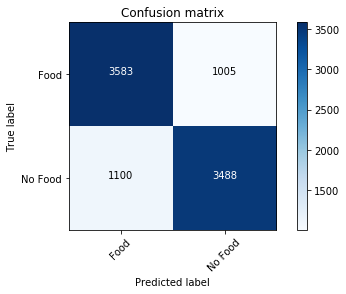



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.762969
Precision: 0.793053
Recall: 0.711639
F1 score: 0.750144
Cohens kappa: 0.525937
ROC AUC: 0.855840
F-measure = 0.7623
accuracy = 0.7630
Confusion matrix:
[[3736  852]
 [1323 3265]]


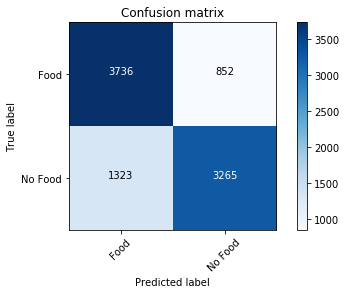



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.791303
Precision: 0.771923
Recall: 0.826940
F1 score: 0.798485
Cohens kappa: 0.582607
ROC AUC: 0.868533
F-measure = 0.7910
accuracy = 0.7913
Confusion matrix:
[[3467 1121]
 [ 794 3794]]


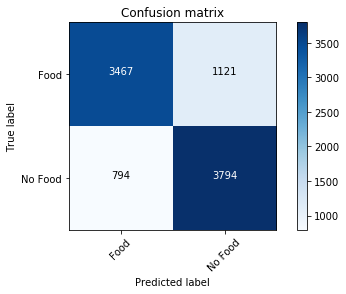



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.787707
Precision: 0.762321
Recall: 0.836094
F1 score: 0.797505
Cohens kappa: 0.575414
ROC AUC: 0.861700
F-measure = 0.7872
accuracy = 0.7877
Confusion matrix:
[[3392 1196]
 [ 752 3836]]


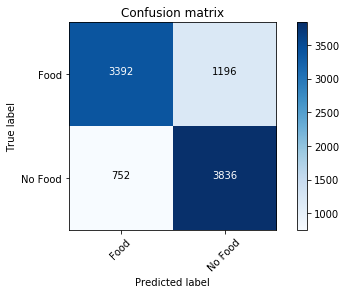



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.779207
Precision: 0.763689
Recall: 0.808631
F1 score: 0.785518
Cohens kappa: 0.558413
ROC AUC: 0.854640
F-measure = 0.7790
accuracy = 0.7792
Confusion matrix:
[[3440 1148]
 [ 878 3710]]


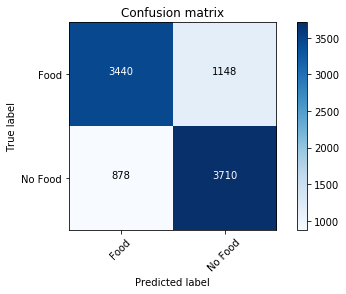



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.784111
Precision: 0.758991
Recall: 0.832607
F1 score: 0.794096
Cohens kappa: 0.568221
ROC AUC: 0.858120
F-measure = 0.7836
accuracy = 0.7841
Confusion matrix:
[[3375 1213]
 [ 768 3820]]


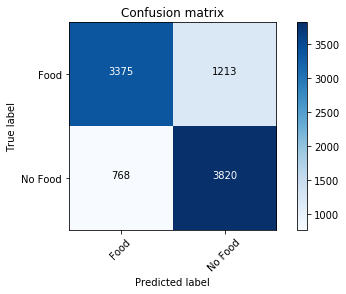



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.777790
Precision: 0.746280
Recall: 0.841761
F1 score: 0.791150
Cohens kappa: 0.555580
ROC AUC: 0.855082
F-measure = 0.7769
accuracy = 0.7778
Confusion matrix:
[[3275 1313]
 [ 726 3862]]


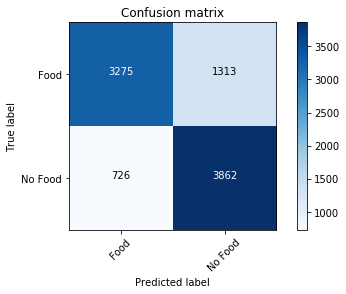



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.760789
Precision: 0.786999
Recall: 0.715126
F1 score: 0.749343
Cohens kappa: 0.521578
ROC AUC: 0.847845
F-measure = 0.7603
accuracy = 0.7608
Confusion matrix:
[[3700  888]
 [1307 3281]]


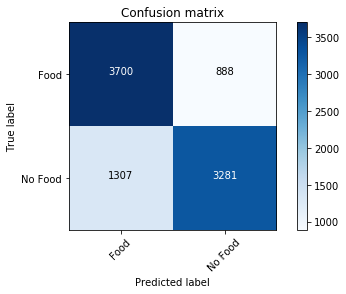



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.779861
Precision: 0.750000
Recall: 0.839582
F1 score: 0.792267
Cohens kappa: 0.559721
ROC AUC: 0.858214
F-measure = 0.7791
accuracy = 0.7799
Confusion matrix:
[[3304 1284]
 [ 736 3852]]


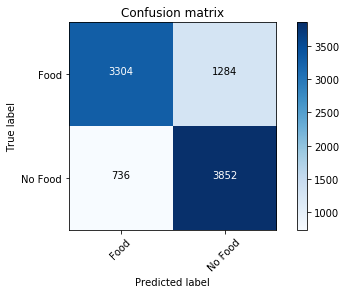



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.771578
Precision: 0.747714
Recall: 0.819747
F1 score: 0.782075
Cohens kappa: 0.543156
ROC AUC: 0.850048
F-measure = 0.7710
accuracy = 0.7716
Confusion matrix:
[[3319 1269]
 [ 827 3761]]


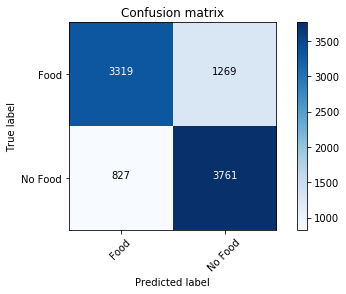



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.782585
Precision: 0.761233
Recall: 0.823452
F1 score: 0.791121
Cohens kappa: 0.565170
ROC AUC: 0.858305
F-measure = 0.7822
accuracy = 0.7826
Confusion matrix:
[[3403 1185]
 [ 810 3778]]


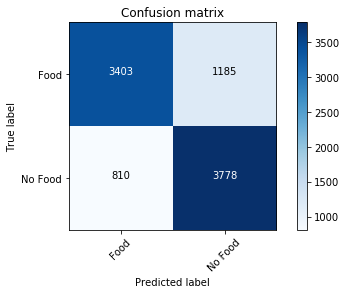



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.783239
Precision: 0.760264
Recall: 0.827376
F1 score: 0.792402
Cohens kappa: 0.566478
ROC AUC: 0.860638
F-measure = 0.7828
accuracy = 0.7832
Confusion matrix:
[[3391 1197]
 [ 792 3796]]


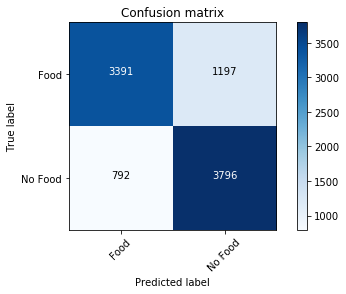



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.776918
Precision: 0.765739
Recall: 0.797951
F1 score: 0.781514
Cohens kappa: 0.553836
ROC AUC: 0.853840
F-measure = 0.7768
accuracy = 0.7769
Confusion matrix:
[[3468 1120]
 [ 927 3661]]


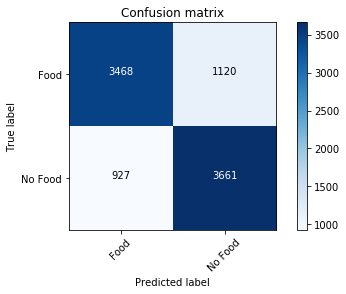



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.773540
Precision: 0.765328
Recall: 0.789015
F1 score: 0.776991
Cohens kappa: 0.547079
ROC AUC: 0.856486
F-measure = 0.7735
accuracy = 0.7735
Confusion matrix:
[[3478 1110]
 [ 968 3620]]


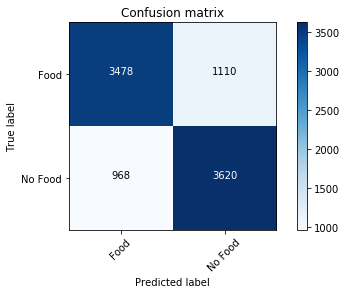



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.772995
Precision: 0.756502
Recall: 0.805144
F1 score: 0.780065
Cohens kappa: 0.545990
ROC AUC: 0.851645
F-measure = 0.7728
accuracy = 0.7730
Confusion matrix:
[[3399 1189]
 [ 894 3694]]


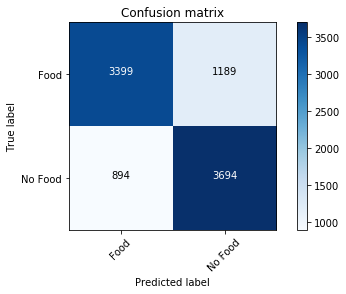



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.762642
Precision: 0.765770
Recall: 0.756757
F1 score: 0.761237
Cohens kappa: 0.525283
ROC AUC: 0.844228
F-measure = 0.7626
accuracy = 0.7626
Confusion matrix:
[[3526 1062]
 [1116 3472]]


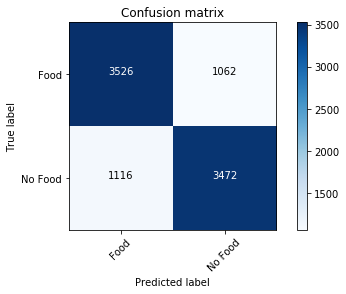



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.776809
Precision: 0.737029
Recall: 0.860724
F1 score: 0.794088
Cohens kappa: 0.553618
ROC AUC: 0.854891
F-measure = 0.7752
accuracy = 0.7768
Confusion matrix:
[[3179 1409]
 [ 639 3949]]


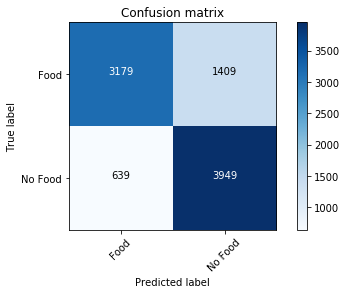



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.759917
Precision: 0.792065
Recall: 0.704882
F1 score: 0.745935
Cohens kappa: 0.519834
ROC AUC: 0.850465
F-measure = 0.7592
accuracy = 0.7599
Confusion matrix:
[[3739  849]
 [1354 3234]]


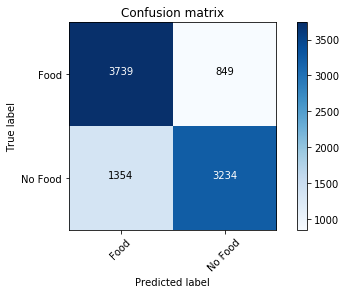



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.781386
Precision: 0.752642
Recall: 0.838274
F1 score: 0.793153
Cohens kappa: 0.562772
ROC AUC: 0.860945
F-measure = 0.7807
accuracy = 0.7814
Confusion matrix:
[[3324 1264]
 [ 742 3846]]


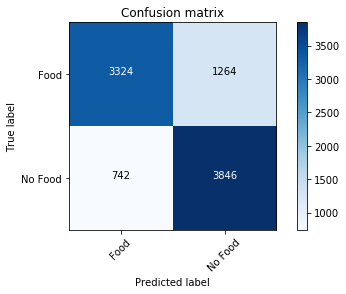



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.771796
Precision: 0.749700
Recall: 0.816042
F1 score: 0.781465
Cohens kappa: 0.543592
ROC AUC: 0.852458
F-measure = 0.7713
accuracy = 0.7718
Confusion matrix:
[[3338 1250]
 [ 844 3744]]


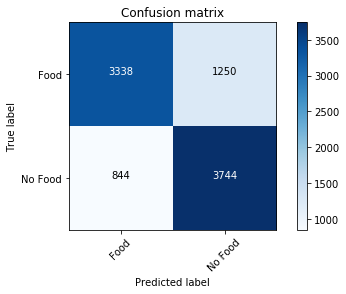



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.766565
Precision: 0.781149
Recall: 0.740628
F1 score: 0.760349
Cohens kappa: 0.533130
ROC AUC: 0.851497
F-measure = 0.7664
accuracy = 0.7666
Confusion matrix:
[[3636  952]
 [1190 3398]]


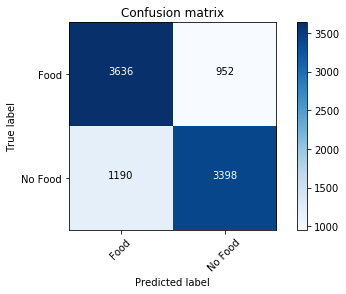



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.775283
Precision: 0.774446
Recall: 0.776809
F1 score: 0.775626
Cohens kappa: 0.550567
ROC AUC: 0.857311
F-measure = 0.7753
accuracy = 0.7753
Confusion matrix:
[[3550 1038]
 [1024 3564]]


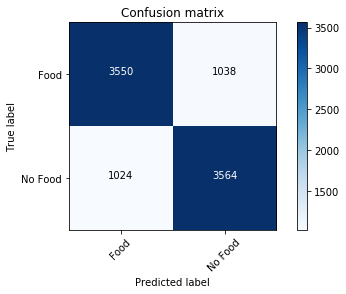



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.790214
Precision: 0.790403
Recall: 0.789887
F1 score: 0.790145
Cohens kappa: 0.580427
ROC AUC: 0.863010
F-measure = 0.7902
accuracy = 0.7902
Confusion matrix:
[[3627  961]
 [ 964 3624]]


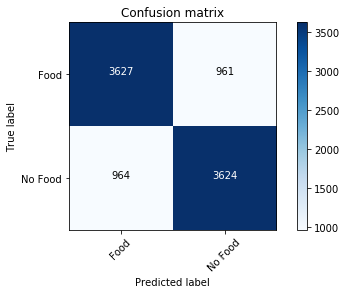



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.797188
Precision: 0.751894
Recall: 0.887097
F1 score: 0.813919
Cohens kappa: 0.594377
ROC AUC: 0.867891
F-measure = 0.7955
accuracy = 0.7972
Confusion matrix:
[[3245 1343]
 [ 518 4070]]


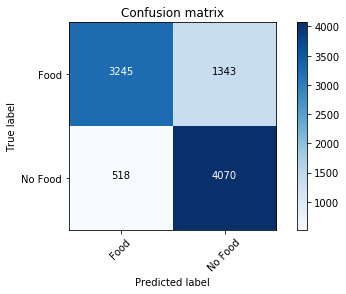



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.794791
Precision: 0.767663
Recall: 0.845466
F1 score: 0.804688
Cohens kappa: 0.589582
ROC AUC: 0.862917
F-measure = 0.7943
accuracy = 0.7948
Confusion matrix:
[[3414 1174]
 [ 709 3879]]


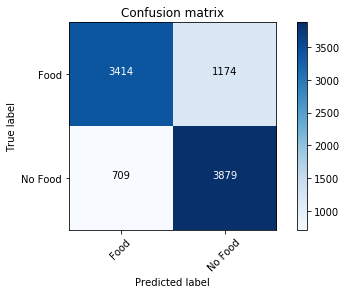



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.793919
Precision: 0.785155
Recall: 0.809285
F1 score: 0.797038
Cohens kappa: 0.587838
ROC AUC: 0.866641
F-measure = 0.7939
accuracy = 0.7939
Confusion matrix:
[[3572 1016]
 [ 875 3713]]


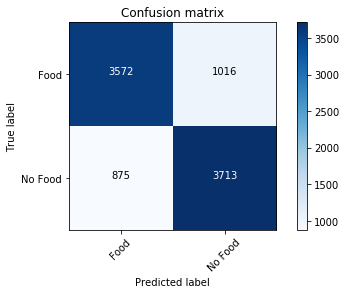



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.789996
Precision: 0.781230
Recall: 0.805580
F1 score: 0.793218
Cohens kappa: 0.579991
ROC AUC: 0.862592
F-measure = 0.7899
accuracy = 0.7900
Confusion matrix:
[[3553 1035]
 [ 892 3696]]


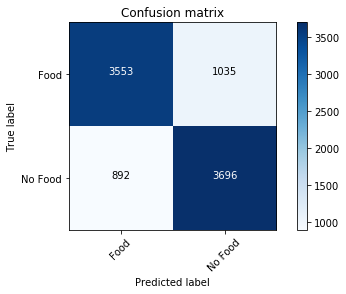



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.788361
Precision: 0.758096
Recall: 0.846992
F1 score: 0.800082
Cohens kappa: 0.576722
ROC AUC: 0.869396
F-measure = 0.7876
accuracy = 0.7884
Confusion matrix:
[[3348 1240]
 [ 702 3886]]


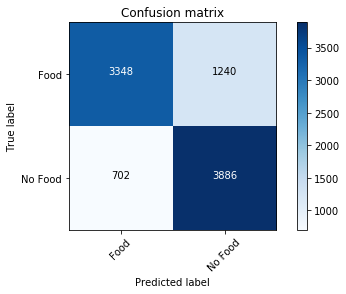



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.773867
Precision: 0.741681
Recall: 0.840453
F1 score: 0.787984
Cohens kappa: 0.547733
ROC AUC: 0.854073
F-measure = 0.7729
accuracy = 0.7739
Confusion matrix:
[[3245 1343]
 [ 732 3856]]


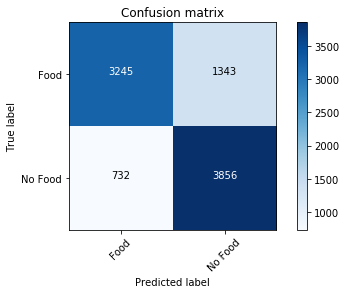



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.776918
Precision: 0.780773
Recall: 0.770052
F1 score: 0.775376
Cohens kappa: 0.553836
ROC AUC: 0.859127
F-measure = 0.7769
accuracy = 0.7769
Confusion matrix:
[[3596  992]
 [1055 3533]]


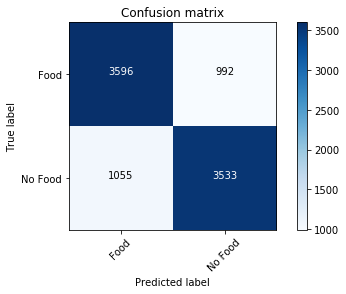



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.783566
Precision: 0.778826
Recall: 0.792066
F1 score: 0.785390
Cohens kappa: 0.567132
ROC AUC: 0.866723
F-measure = 0.7836
accuracy = 0.7836
Confusion matrix:
[[3556 1032]
 [ 954 3634]]


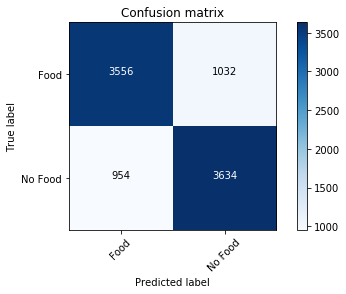



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.786835
Precision: 0.768134
Recall: 0.821709
F1 score: 0.794019
Cohens kappa: 0.573670
ROC AUC: 0.865687
F-measure = 0.7866
accuracy = 0.7868
Confusion matrix:
[[3450 1138]
 [ 818 3770]]


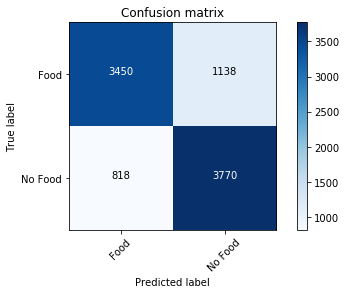



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.784547
Precision: 0.755930
Recall: 0.840453
F1 score: 0.795954
Cohens kappa: 0.569093
ROC AUC: 0.858563
F-measure = 0.7839
accuracy = 0.7845
Confusion matrix:
[[3343 1245]
 [ 732 3856]]


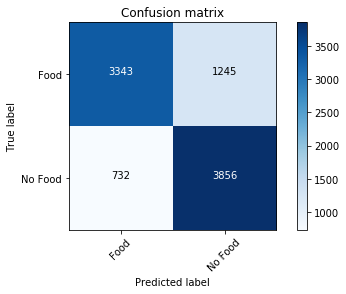



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.781713
Precision: 0.746707
Recall: 0.852659
F1 score: 0.796174
Cohens kappa: 0.563426
ROC AUC: 0.855796
F-measure = 0.7806
accuracy = 0.7817
Confusion matrix:
[[3261 1327]
 [ 676 3912]]


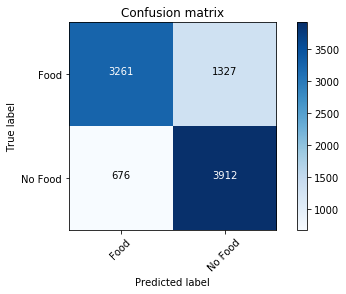



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.779969
Precision: 0.750439
Recall: 0.838928
F1 score: 0.792220
Cohens kappa: 0.559939
ROC AUC: 0.857083
F-measure = 0.7792
accuracy = 0.7800
Confusion matrix:
[[3308 1280]
 [ 739 3849]]


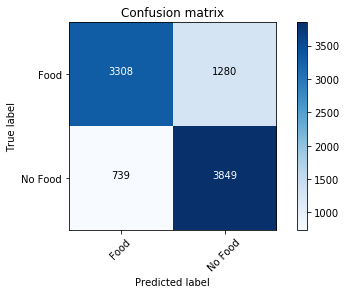



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.783348
Precision: 0.761991
Recall: 0.824106
F1 score: 0.791832
Cohens kappa: 0.566696
ROC AUC: 0.860700
F-measure = 0.7830
accuracy = 0.7833
Confusion matrix:
[[3407 1181]
 [ 807 3781]]


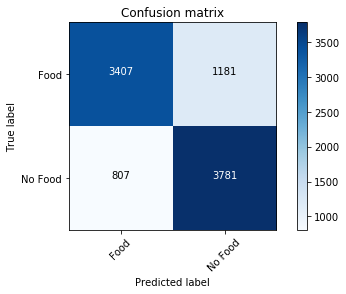



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.750545
Precision: 0.780297
Recall: 0.697472
F1 score: 0.736563
Cohens kappa: 0.501090
ROC AUC: 0.851475
F-measure = 0.7498
accuracy = 0.7505
Confusion matrix:
[[3687  901]
 [1388 3200]]


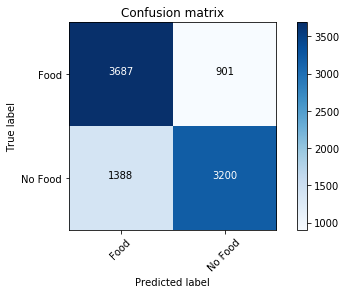



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.767655
Precision: 0.761611
Recall: 0.779207
F1 score: 0.770308
Cohens kappa: 0.535310
ROC AUC: 0.849405
F-measure = 0.7676
accuracy = 0.7677
Confusion matrix:
[[3469 1119]
 [1013 3575]]


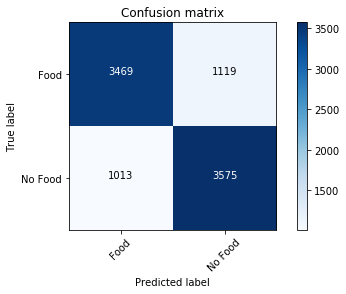



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.782040
Precision: 0.738745
Recall: 0.872711
F1 score: 0.800160
Cohens kappa: 0.564080
ROC AUC: 0.852733
F-measure = 0.7802
accuracy = 0.7820
Confusion matrix:
[[3172 1416]
 [ 584 4004]]


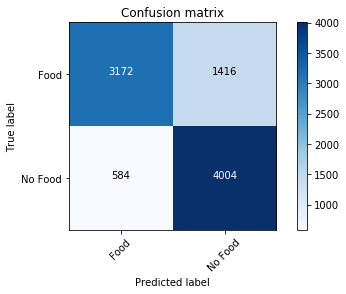



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.771142
Precision: 0.734011
Recall: 0.850480
F1 score: 0.787964
Cohens kappa: 0.542284
ROC AUC: 0.851140
F-measure = 0.7697
accuracy = 0.7711
Confusion matrix:
[[3174 1414]
 [ 686 3902]]


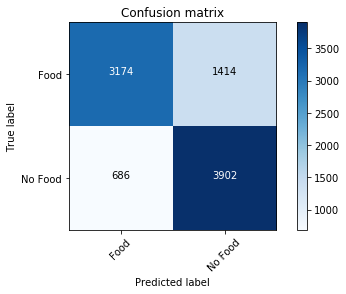



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.777572
Precision: 0.738171
Recall: 0.860288
F1 score: 0.794565
Cohens kappa: 0.555144
ROC AUC: 0.849645
F-measure = 0.7760
accuracy = 0.7776
Confusion matrix:
[[3188 1400]
 [ 641 3947]]


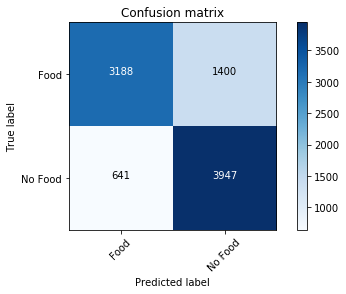



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.777245
Precision: 0.760016
Recall: 0.810375
F1 score: 0.784388
Cohens kappa: 0.554490
ROC AUC: 0.860890
F-measure = 0.7770
accuracy = 0.7772
Confusion matrix:
[[3414 1174]
 [ 870 3718]]


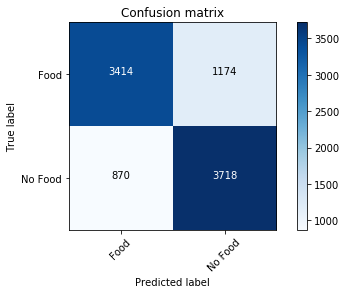



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.767982
Precision: 0.770755
Recall: 0.762860
F1 score: 0.766787
Cohens kappa: 0.535963
ROC AUC: 0.856599
F-measure = 0.7680
accuracy = 0.7680
Confusion matrix:
[[3547 1041]
 [1088 3500]]


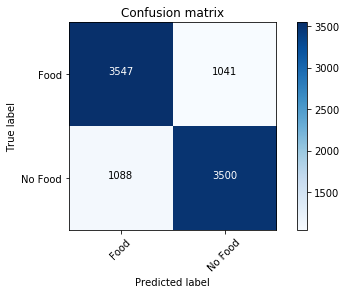



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.784765
Precision: 0.777565
Recall: 0.797733
F1 score: 0.787520
Cohens kappa: 0.569529
ROC AUC: 0.864002
F-measure = 0.7847
accuracy = 0.7848
Confusion matrix:
[[3541 1047]
 [ 928 3660]]


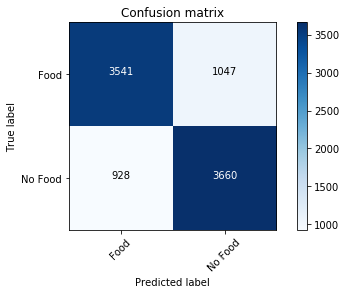



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.772668
Precision: 0.787586
Recall: 0.746731
F1 score: 0.766614
Cohens kappa: 0.545336
ROC AUC: 0.862194
F-measure = 0.7725
accuracy = 0.7727
Confusion matrix:
[[3664  924]
 [1162 3426]]


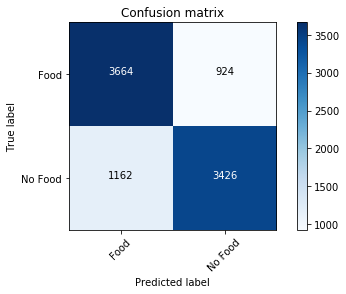



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.783675
Precision: 0.762241
Recall: 0.824542
F1 score: 0.792168
Cohens kappa: 0.567350
ROC AUC: 0.859413
F-measure = 0.7833
accuracy = 0.7837
Confusion matrix:
[[3408 1180]
 [ 805 3783]]


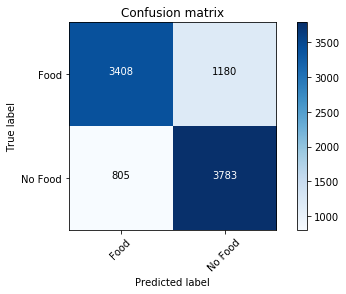



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.785963
Precision: 0.764303
Recall: 0.826940
F1 score: 0.794389
Cohens kappa: 0.571927
ROC AUC: 0.859046
F-measure = 0.7856
accuracy = 0.7860
Confusion matrix:
[[3418 1170]
 [ 794 3794]]


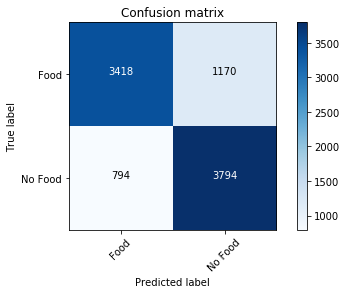



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.786072
Precision: 0.757909
Recall: 0.840671
F1 score: 0.797148
Cohens kappa: 0.572145
ROC AUC: 0.859282
F-measure = 0.7854
accuracy = 0.7861
Confusion matrix:
[[3356 1232]
 [ 731 3857]]


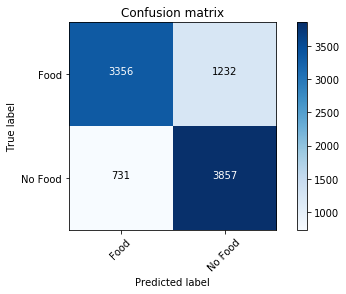



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.784874
Precision: 0.765650
Recall: 0.821055
F1 score: 0.792385
Cohens kappa: 0.569747
ROC AUC: 0.860161
F-measure = 0.7846
accuracy = 0.7849
Confusion matrix:
[[3435 1153]
 [ 821 3767]]


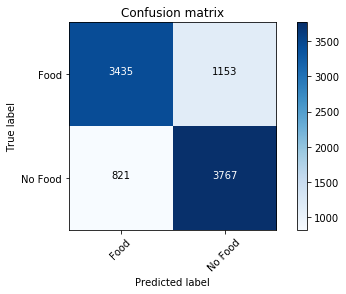



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.786181
Precision: 0.779719
Recall: 0.797733
F1 score: 0.788623
Cohens kappa: 0.572363
ROC AUC: 0.866188
F-measure = 0.7862
accuracy = 0.7862
Confusion matrix:
[[3554 1034]
 [ 928 3660]]


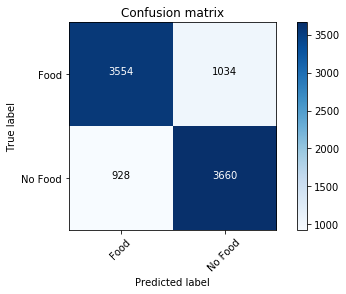



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.773104
Precision: 0.782462
Recall: 0.756539
F1 score: 0.769282
Cohens kappa: 0.546207
ROC AUC: 0.862417
F-measure = 0.7730
accuracy = 0.7731
Confusion matrix:
[[3623  965]
 [1117 3471]]


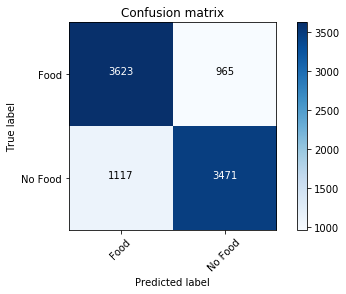



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.779969
Precision: 0.755216
Recall: 0.828466
F1 score: 0.790147
Cohens kappa: 0.559939
ROC AUC: 0.858757
F-measure = 0.7795
accuracy = 0.7800
Confusion matrix:
[[3356 1232]
 [ 787 3801]]


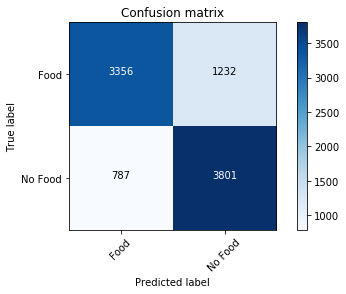



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.769616
Precision: 0.755684
Recall: 0.796861
F1 score: 0.775727
Cohens kappa: 0.539233
ROC AUC: 0.852947
F-measure = 0.7694
accuracy = 0.7696
Confusion matrix:
[[3406 1182]
 [ 932 3656]]


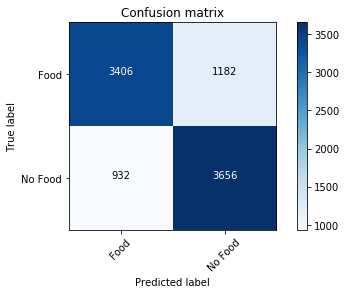



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.785745
Precision: 0.771316
Recall: 0.812337
F1 score: 0.791295
Cohens kappa: 0.571491
ROC AUC: 0.865718
F-measure = 0.7856
accuracy = 0.7857
Confusion matrix:
[[3483 1105]
 [ 861 3727]]


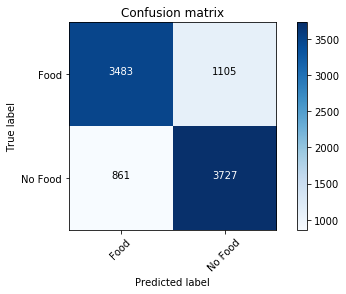



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.791739
Precision: 0.788532
Recall: 0.797297
F1 score: 0.792890
Cohens kappa: 0.583479
ROC AUC: 0.871566
F-measure = 0.7917
accuracy = 0.7917
Confusion matrix:
[[3607  981]
 [ 930 3658]]


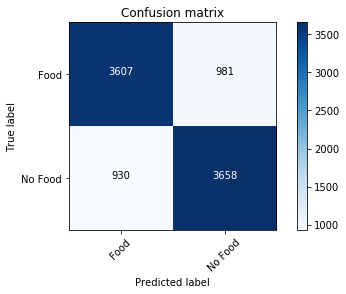



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.772232
Precision: 0.795972
Recall: 0.732127
F1 score: 0.762716
Cohens kappa: 0.544464
ROC AUC: 0.863604
F-measure = 0.7719
accuracy = 0.7722
Confusion matrix:
[[3727  861]
 [1229 3359]]


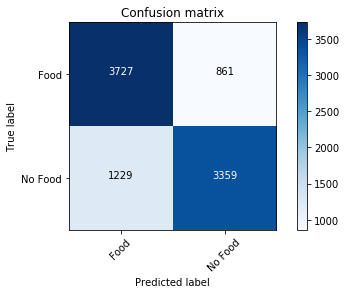



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.267982
Precision: 0.246003
Recall: 0.224717
F1 score: 0.234879
Cohens kappa: -0.464037
ROC AUC: 0.193860
F-measure = 0.2666
accuracy = 0.2680
Confusion matrix:
[[1428 3160]
 [3557 1031]]


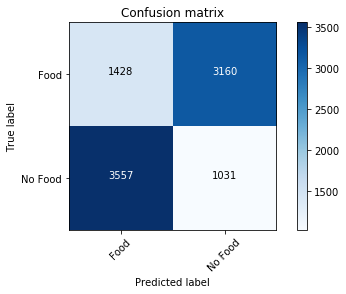



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.228204
Precision: 0.198063
Recall: 0.178291
F1 score: 0.187658
Cohens kappa: -0.543592
ROC AUC: 0.154777
F-measure = 0.2263
accuracy = 0.2282
Confusion matrix:
[[1276 3312]
 [3770  818]]


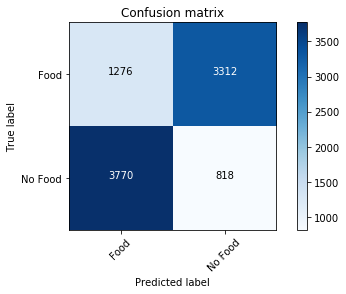



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.280405
Precision: 0.320442
Recall: 0.391892
F1 score: 0.352584
Cohens kappa: -0.439189
ROC AUC: 0.172302
F-measure = 0.2713
accuracy = 0.2804
Confusion matrix:
[[ 775 3813]
 [2790 1798]]


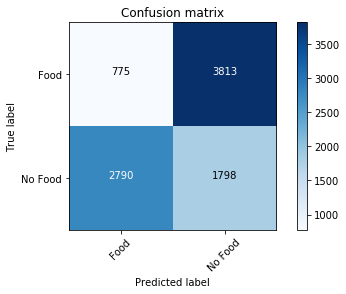



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.222755
Precision: 0.207989
Recall: 0.197472
F1 score: 0.202594
Cohens kappa: -0.554490
ROC AUC: 0.144181
F-measure = 0.2223
accuracy = 0.2228
Confusion matrix:
[[1138 3450]
 [3682  906]]


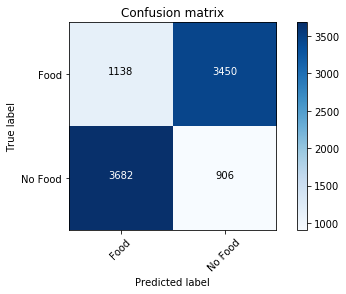



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.213165
Precision: 0.150928
Recall: 0.124019
F1 score: 0.136157
Cohens kappa: -0.573670
ROC AUC: 0.147835
F-measure = 0.2069
accuracy = 0.2132
Confusion matrix:
[[1387 3201]
 [4019  569]]


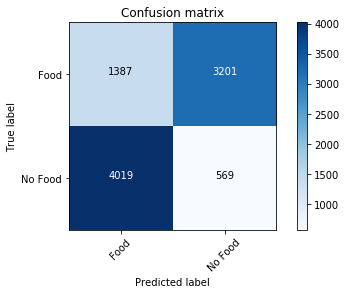



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.236813
Precision: 0.245950
Recall: 0.254795
F1 score: 0.250294
Cohens kappa: -0.526373
ROC AUC: 0.148103
F-measure = 0.2366
accuracy = 0.2368
Confusion matrix:
[[1004 3584]
 [3419 1169]]


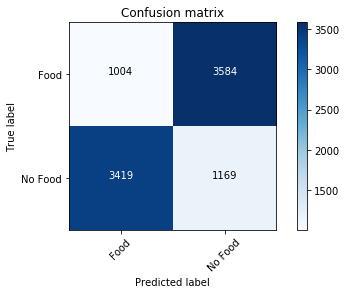



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.412707
Precision: 0.450513
Recall: 0.794682
F1 score: 0.575034
Cohens kappa: -0.174586
ROC AUC: 0.179344
F-measure = 0.3124
accuracy = 0.4127
Confusion matrix:
[[ 141 4447]
 [ 942 3646]]


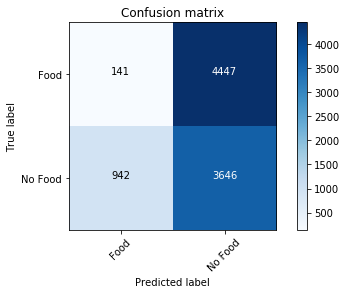



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.240737
Precision: 0.263472
Recall: 0.288797
F1 score: 0.275554
Cohens kappa: -0.518527
ROC AUC: 0.147410
F-measure = 0.2390
accuracy = 0.2407
Confusion matrix:
[[ 884 3704]
 [3263 1325]]


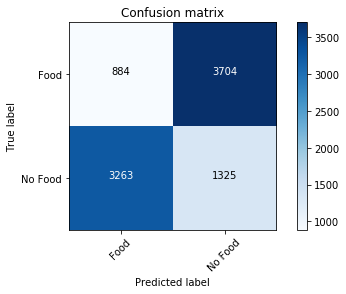



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.253814
Precision: 0.285633
Recall: 0.328030
F1 score: 0.305367
Cohens kappa: -0.492371
ROC AUC: 0.152322
F-measure = 0.2497
accuracy = 0.2538
Confusion matrix:
[[ 824 3764]
 [3083 1505]]


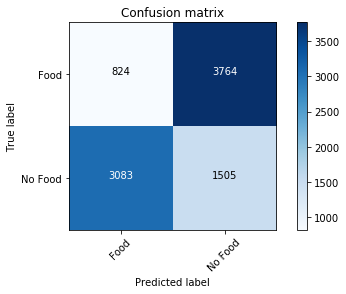



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.763078
Precision: 0.768820
Recall: 0.752398
F1 score: 0.760520
Cohens kappa: 0.526155
ROC AUC: 0.848480
F-measure = 0.7631
accuracy = 0.7631
Confusion matrix:
[[3550 1038]
 [1136 3452]]


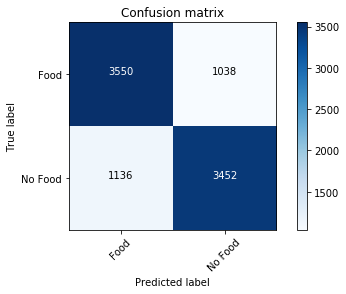



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.783893
Precision: 0.736088
Recall: 0.885135
F1 score: 0.803761
Cohens kappa: 0.567786
ROC AUC: 0.862901
F-measure = 0.7817
accuracy = 0.7839
Confusion matrix:
[[3132 1456]
 [ 527 4061]]


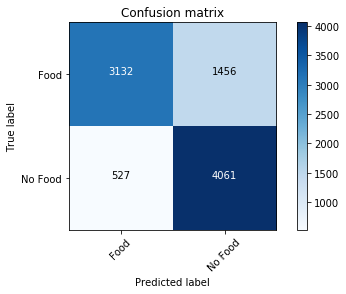



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.764058
Precision: 0.783392
Recall: 0.729948
F1 score: 0.755726
Cohens kappa: 0.528117
ROC AUC: 0.850488
F-measure = 0.7638
accuracy = 0.7641
Confusion matrix:
[[3662  926]
 [1239 3349]]


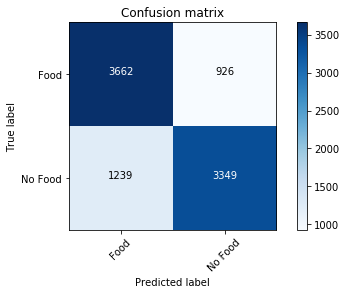



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.774085
Precision: 0.761163
Recall: 0.798823
F1 score: 0.779538
Cohens kappa: 0.548169
ROC AUC: 0.860446
F-measure = 0.7739
accuracy = 0.7741
Confusion matrix:
[[3438 1150]
 [ 923 3665]]


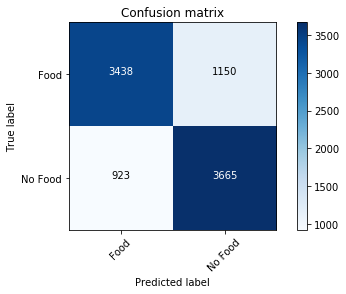



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.657912
Precision: 0.664547
Recall: 0.637751
F1 score: 0.650873
Cohens kappa: 0.315824
ROC AUC: 0.714482
F-measure = 0.6578
accuracy = 0.6579
Confusion matrix:
[[3111 1477]
 [1662 2926]]


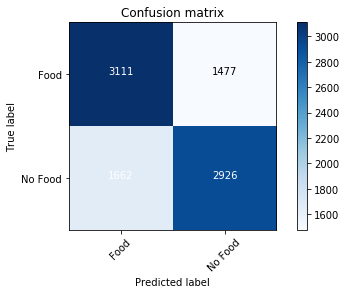



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.700741
Precision: 0.796141
Recall: 0.539669
F1 score: 0.643284
Cohens kappa: 0.401482
ROC AUC: 0.762765
F-measure = 0.6928
accuracy = 0.7007
Confusion matrix:
[[3954  634]
 [2112 2476]]


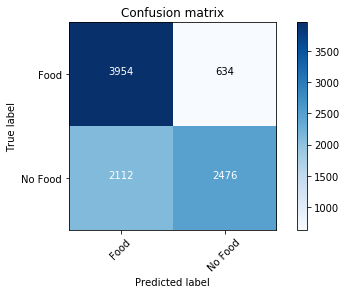



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.341979
Precision: 0.355058
Recall: 0.387097
F1 score: 0.370386
Cohens kappa: -0.316042
ROC AUC: 0.270752
F-measure = 0.3406
accuracy = 0.3420
Confusion matrix:
[[1362 3226]
 [2812 1776]]


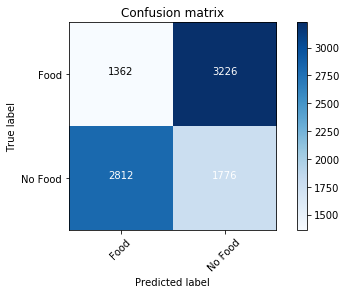



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.301656
Precision: 0.218962
Recall: 0.154534
F1 score: 0.181191
Cohens kappa: -0.396687
ROC AUC: 0.249307
F-measure = 0.2862
accuracy = 0.3017
Confusion matrix:
[[2059 2529]
 [3879  709]]


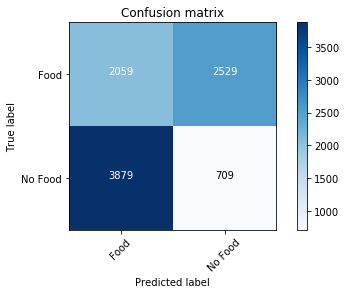



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.330536
Precision: 0.323336
Recall: 0.310157
F1 score: 0.316609
Cohens kappa: -0.338928
ROC AUC: 0.272243
F-measure = 0.3303
accuracy = 0.3305
Confusion matrix:
[[1610 2978]
 [3165 1423]]


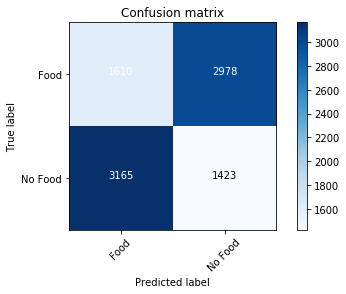



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.336203
Precision: 0.330629
Recall: 0.319747
F1 score: 0.325097
Cohens kappa: -0.327594
ROC AUC: 0.281898
F-measure = 0.3360
accuracy = 0.3362
Confusion matrix:
[[1618 2970]
 [3121 1467]]


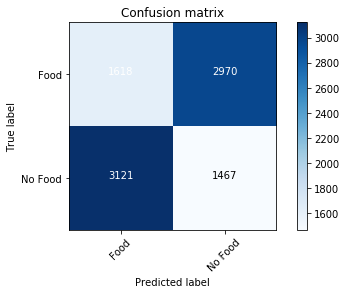



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.346338
Precision: 0.344782
Recall: 0.341325
F1 score: 0.343045
Cohens kappa: -0.307323
ROC AUC: 0.290183
F-measure = 0.3463
accuracy = 0.3463
Confusion matrix:
[[1612 2976]
 [3022 1566]]


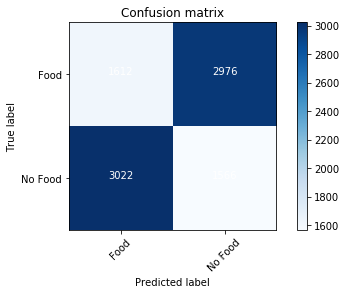



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.285527
Precision: 0.219178
Recall: 0.167393
F1 score: 0.189817
Cohens kappa: -0.428945
ROC AUC: 0.225711
F-measure = 0.2754
accuracy = 0.2855
Confusion matrix:
[[1852 2736]
 [3820  768]]


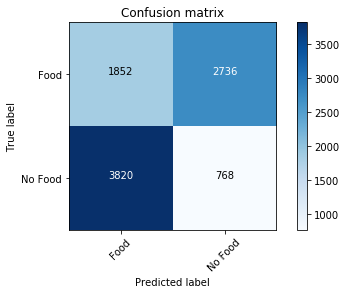



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.342088
Precision: 0.335453
Recall: 0.321927
F1 score: 0.328551
Cohens kappa: -0.315824
ROC AUC: 0.285518
F-measure = 0.3418
accuracy = 0.3421
Confusion matrix:
[[1662 2926]
 [3111 1477]]


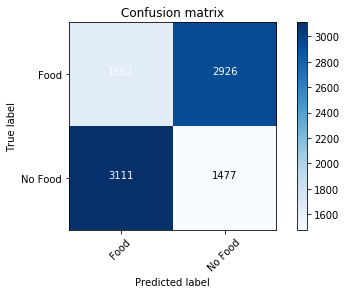



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.299259
Precision: 0.203859
Recall: 0.138187
F1 score: 0.164718
Cohens kappa: -0.401482
ROC AUC: 0.237235
F-measure = 0.2806
accuracy = 0.2993
Confusion matrix:
[[2112 2476]
 [3954  634]]


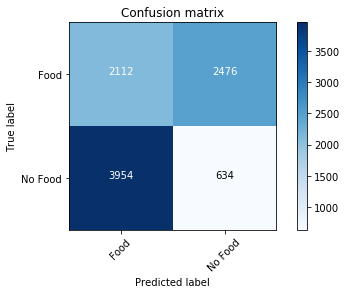



##################################################################################################




In [27]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [28]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [29]:
gc.collect()

45083

### Test Trial 2

In [30]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(TSFD3, TSNFD3, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
10707 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
10707 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 10707 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
21414 validation images will be loaded: 10707 for food, 10707 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non

In [31]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.773373
Precision: 0.777862
Recall: 0.765294
F1 score: 0.771527
Cohens kappa: 0.546745
ROC AUC: 0.858558
F-measure = 0.7734
accuracy = 0.7734
Confusion matrix:
[[8367 2340]
 [2513 8194]]


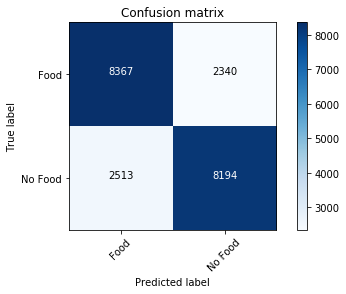



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.758196
Precision: 0.787699
Recall: 0.706921
F1 score: 0.745127
Cohens kappa: 0.516391
ROC AUC: 0.852956
F-measure = 0.7576
accuracy = 0.7582
Confusion matrix:
[[8667 2040]
 [3138 7569]]


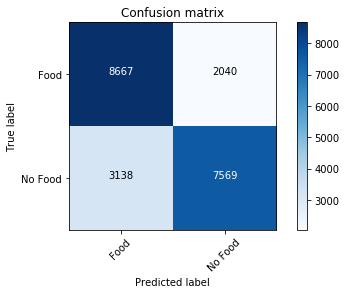



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.785934
Precision: 0.765502
Recall: 0.824414
F1 score: 0.793866
Cohens kappa: 0.571869
ROC AUC: 0.866458
F-measure = 0.7856
accuracy = 0.7859
Confusion matrix:
[[8003 2704]
 [1880 8827]]


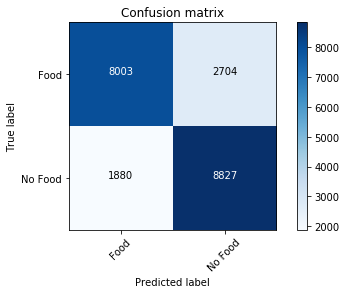



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.777949
Precision: 0.750126
Recall: 0.833567
F1 score: 0.789648
Cohens kappa: 0.555898
ROC AUC: 0.856052
F-measure = 0.7773
accuracy = 0.7779
Confusion matrix:
[[7734 2973]
 [1782 8925]]


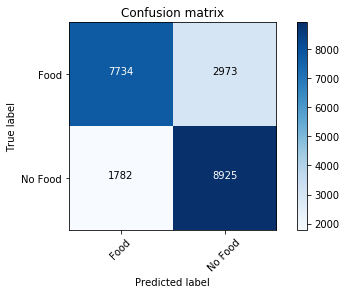



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.775240
Precision: 0.757200
Recall: 0.810311
F1 score: 0.782856
Cohens kappa: 0.550481
ROC AUC: 0.850707
F-measure = 0.7750
accuracy = 0.7752
Confusion matrix:
[[7925 2782]
 [2031 8676]]


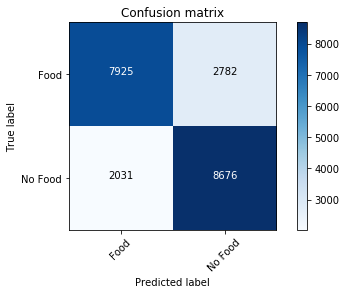



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.779023
Precision: 0.753715
Recall: 0.828897
F1 score: 0.789521
Cohens kappa: 0.558046
ROC AUC: 0.854719
F-measure = 0.7785
accuracy = 0.7790
Confusion matrix:
[[7807 2900]
 [1832 8875]]


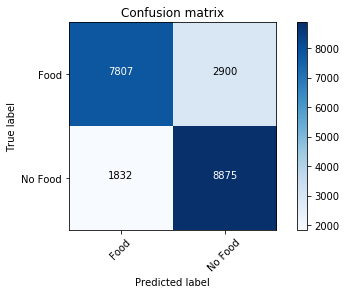



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.775054
Precision: 0.742188
Recall: 0.842907
F1 score: 0.789347
Cohens kappa: 0.550107
ROC AUC: 0.854178
F-measure = 0.7740
accuracy = 0.7751
Confusion matrix:
[[7572 3135]
 [1682 9025]]


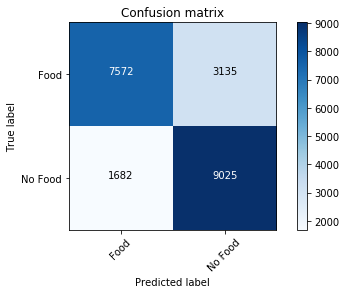



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.757402
Precision: 0.780081
Recall: 0.716914
F1 score: 0.747165
Cohens kappa: 0.514803
ROC AUC: 0.845244
F-measure = 0.7570
accuracy = 0.7574
Confusion matrix:
[[8543 2164]
 [3031 7676]]


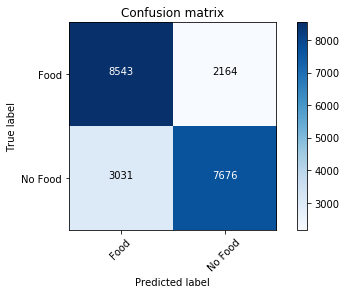



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.780050
Precision: 0.748282
Recall: 0.844027
F1 score: 0.793276
Cohens kappa: 0.560101
ROC AUC: 0.856478
F-measure = 0.7791
accuracy = 0.7801
Confusion matrix:
[[7667 3040]
 [1670 9037]]


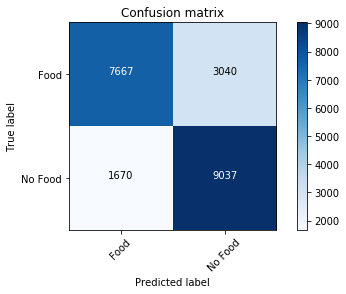



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.771318
Precision: 0.747360
Recall: 0.819744
F1 score: 0.781881
Cohens kappa: 0.542636
ROC AUC: 0.849929
F-measure = 0.7708
accuracy = 0.7713
Confusion matrix:
[[7740 2967]
 [1930 8777]]


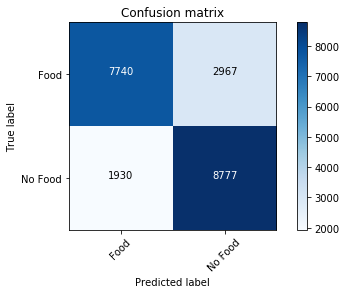



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.779677
Precision: 0.757503
Recall: 0.822733
F1 score: 0.788771
Cohens kappa: 0.559354
ROC AUC: 0.858013
F-measure = 0.7793
accuracy = 0.7797
Confusion matrix:
[[7887 2820]
 [1898 8809]]


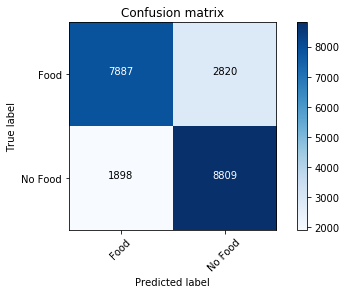



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.778463
Precision: 0.755200
Recall: 0.824040
F1 score: 0.788120
Cohens kappa: 0.556925
ROC AUC: 0.857495
F-measure = 0.7780
accuracy = 0.7785
Confusion matrix:
[[7847 2860]
 [1884 8823]]


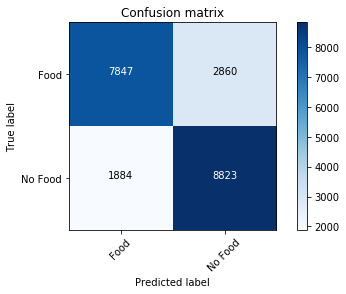



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.774400
Precision: 0.757403
Recall: 0.807416
F1 score: 0.781610
Cohens kappa: 0.548800
ROC AUC: 0.848778
F-measure = 0.7742
accuracy = 0.7744
Confusion matrix:
[[7938 2769]
 [2062 8645]]


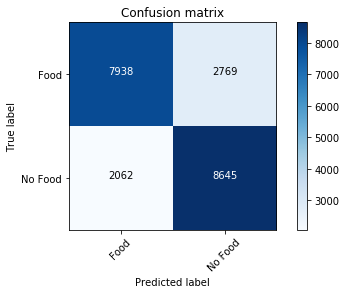



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.771738
Precision: 0.760872
Recall: 0.792566
F1 score: 0.776395
Cohens kappa: 0.543476
ROC AUC: 0.853751
F-measure = 0.7716
accuracy = 0.7717
Confusion matrix:
[[8040 2667]
 [2221 8486]]


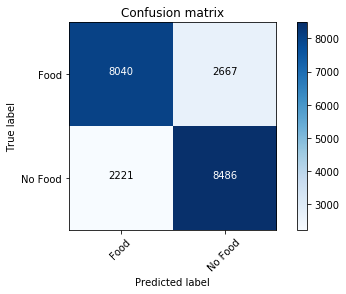



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.773139
Precision: 0.753006
Recall: 0.812926
F1 score: 0.781820
Cohens kappa: 0.546278
ROC AUC: 0.849686
F-measure = 0.7728
accuracy = 0.7731
Confusion matrix:
[[7852 2855]
 [2003 8704]]


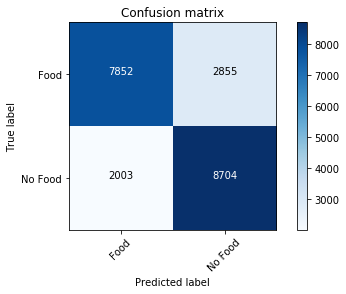



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.760484
Precision: 0.758768
Recall: 0.763799
F1 score: 0.761275
Cohens kappa: 0.520968
ROC AUC: 0.840528
F-measure = 0.7605
accuracy = 0.7605
Confusion matrix:
[[8107 2600]
 [2529 8178]]


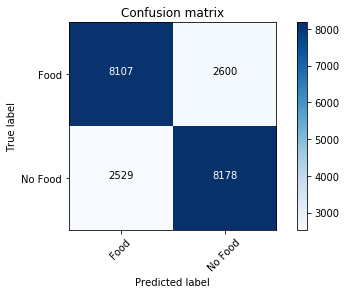



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.775988
Precision: 0.733412
Recall: 0.867190
F1 score: 0.794710
Cohens kappa: 0.551975
ROC AUC: 0.853586
F-measure = 0.7741
accuracy = 0.7760
Confusion matrix:
[[7332 3375]
 [1422 9285]]


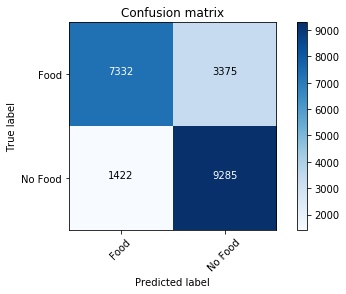



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.752732
Precision: 0.779719
Recall: 0.704492
F1 score: 0.740199
Cohens kappa: 0.505464
ROC AUC: 0.847849
F-measure = 0.7522
accuracy = 0.7527
Confusion matrix:
[[8576 2131]
 [3164 7543]]


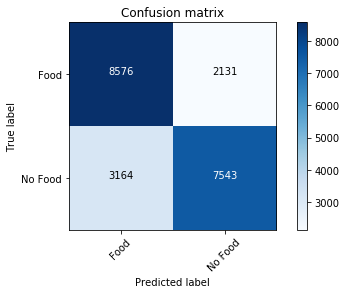



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.777716
Precision: 0.745561
Recall: 0.843187
F1 score: 0.791374
Cohens kappa: 0.555431
ROC AUC: 0.859477
F-measure = 0.7768
accuracy = 0.7777
Confusion matrix:
[[7626 3081]
 [1679 9028]]


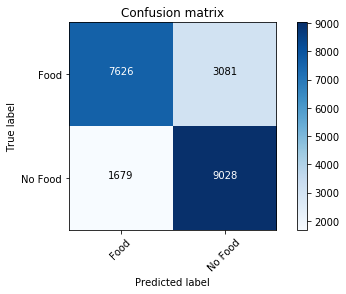



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.774493
Precision: 0.751411
Recall: 0.820398
F1 score: 0.784391
Cohens kappa: 0.548987
ROC AUC: 0.853003
F-measure = 0.7740
accuracy = 0.7745
Confusion matrix:
[[7801 2906]
 [1923 8784]]


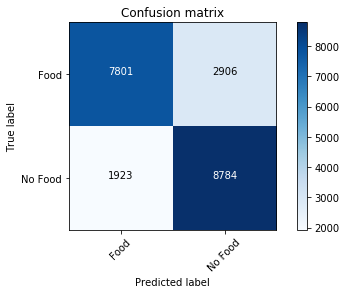



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.764360
Precision: 0.775582
Recall: 0.743999
F1 score: 0.759462
Cohens kappa: 0.528720
ROC AUC: 0.849647
F-measure = 0.7643
accuracy = 0.7644
Confusion matrix:
[[8402 2305]
 [2741 7966]]


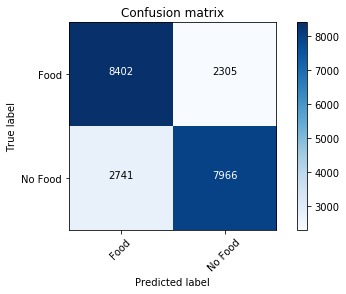



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.774587
Precision: 0.771719
Recall: 0.779864
F1 score: 0.775770
Cohens kappa: 0.549173
ROC AUC: 0.858690
F-measure = 0.7746
accuracy = 0.7746
Confusion matrix:
[[8237 2470]
 [2357 8350]]


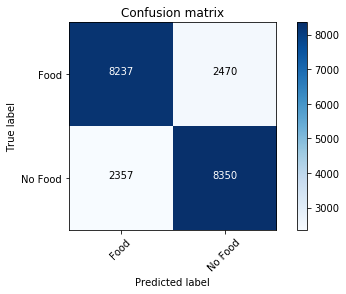



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.783179
Precision: 0.776441
Recall: 0.795368
F1 score: 0.785790
Cohens kappa: 0.566358
ROC AUC: 0.859146
F-measure = 0.7831
accuracy = 0.7832
Confusion matrix:
[[8255 2452]
 [2191 8516]]


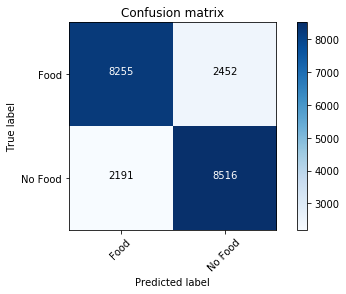



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.789717
Precision: 0.742951
Recall: 0.885962
F1 score: 0.808179
Cohens kappa: 0.579434
ROC AUC: 0.863010
F-measure = 0.7878
accuracy = 0.7897
Confusion matrix:
[[7425 3282]
 [1221 9486]]


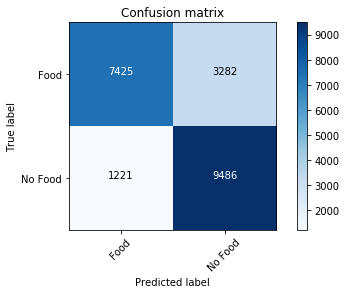



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.788596
Precision: 0.759970
Recall: 0.843654
F1 score: 0.799628
Cohens kappa: 0.577192
ROC AUC: 0.857390
F-measure = 0.7880
accuracy = 0.7886
Confusion matrix:
[[7854 2853]
 [1674 9033]]


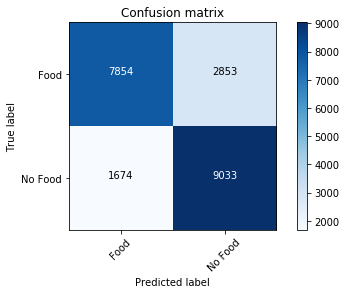



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.784814
Precision: 0.770850
Recall: 0.810591
F1 score: 0.790221
Cohens kappa: 0.569627
ROC AUC: 0.860059
F-measure = 0.7847
accuracy = 0.7848
Confusion matrix:
[[8127 2580]
 [2028 8679]]


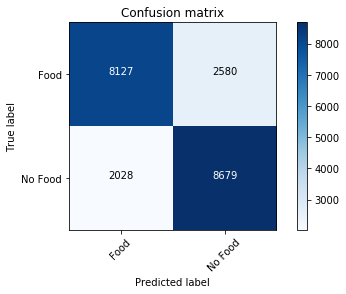



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.780471
Precision: 0.769279
Recall: 0.801252
F1 score: 0.784940
Cohens kappa: 0.560941
ROC AUC: 0.854154
F-measure = 0.7804
accuracy = 0.7805
Confusion matrix:
[[8134 2573]
 [2128 8579]]


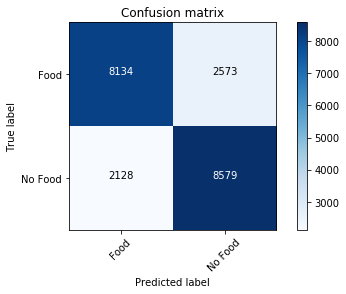



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.790137
Precision: 0.756672
Recall: 0.855328
F1 score: 0.802981
Cohens kappa: 0.580275
ROC AUC: 0.866489
F-measure = 0.7892
accuracy = 0.7901
Confusion matrix:
[[7762 2945]
 [1549 9158]]


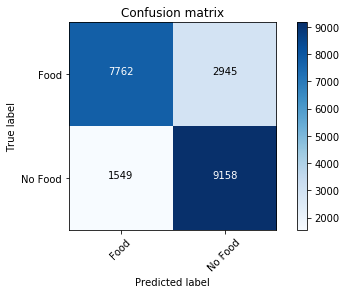



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.777902
Precision: 0.742088
Recall: 0.851873
F1 score: 0.793199
Cohens kappa: 0.555805
ROC AUC: 0.853584
F-measure = 0.7767
accuracy = 0.7779
Confusion matrix:
[[7537 3170]
 [1586 9121]]


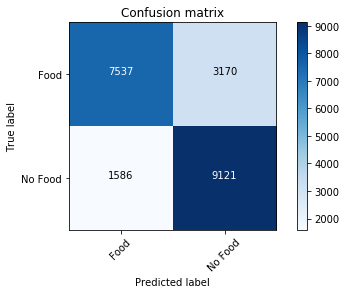



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.769356
Precision: 0.770747
Recall: 0.766788
F1 score: 0.768763
Cohens kappa: 0.538713
ROC AUC: 0.853590
F-measure = 0.7694
accuracy = 0.7694
Confusion matrix:
[[8265 2442]
 [2497 8210]]


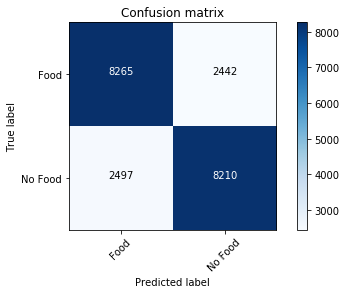



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.778743
Precision: 0.771887
Recall: 0.791351
F1 score: 0.781498
Cohens kappa: 0.557486
ROC AUC: 0.858906
F-measure = 0.7787
accuracy = 0.7787
Confusion matrix:
[[8203 2504]
 [2234 8473]]


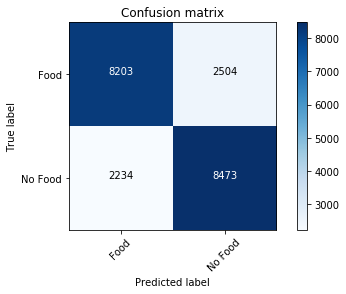



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.782385
Precision: 0.761934
Recall: 0.821425
F1 score: 0.790562
Cohens kappa: 0.564771
ROC AUC: 0.858211
F-measure = 0.7821
accuracy = 0.7824
Confusion matrix:
[[7959 2748]
 [1912 8795]]


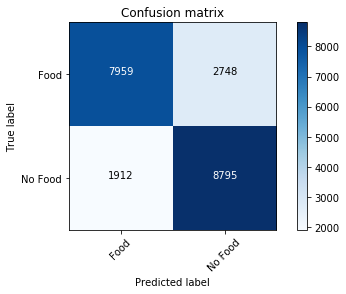



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.775334
Precision: 0.745503
Recall: 0.836089
F1 score: 0.788202
Cohens kappa: 0.550668
ROC AUC: 0.851600
F-measure = 0.7745
accuracy = 0.7753
Confusion matrix:
[[7651 3056]
 [1755 8952]]


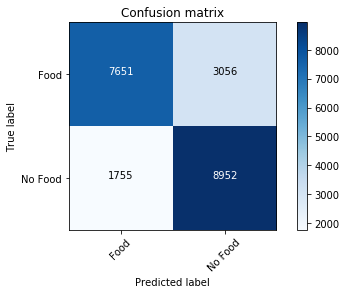



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.777108
Precision: 0.744278
Recall: 0.844307
F1 score: 0.791143
Cohens kappa: 0.554217
ROC AUC: 0.853818
F-measure = 0.7761
accuracy = 0.7771
Confusion matrix:
[[7601 3106]
 [1667 9040]]


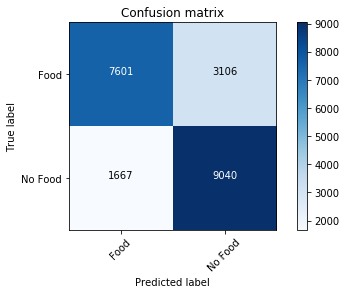



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.774120
Precision: 0.742763
Recall: 0.838704
F1 score: 0.787823
Cohens kappa: 0.548239
ROC AUC: 0.852000
F-measure = 0.7732
accuracy = 0.7741
Confusion matrix:
[[7597 3110]
 [1727 8980]]


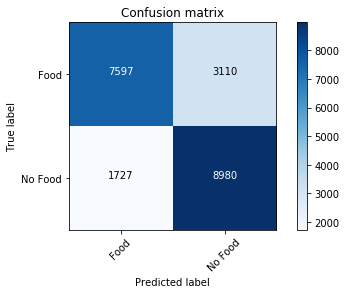



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.781825
Precision: 0.758281
Recall: 0.827403
F1 score: 0.791335
Cohens kappa: 0.563650
ROC AUC: 0.857064
F-measure = 0.7814
accuracy = 0.7818
Confusion matrix:
[[7883 2824]
 [1848 8859]]


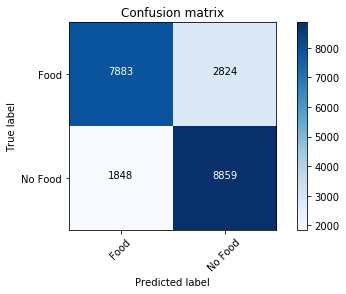



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.751331
Precision: 0.780312
Recall: 0.699636
F1 score: 0.737775
Cohens kappa: 0.502662
ROC AUC: 0.850515
F-measure = 0.7507
accuracy = 0.7513
Confusion matrix:
[[8598 2109]
 [3216 7491]]


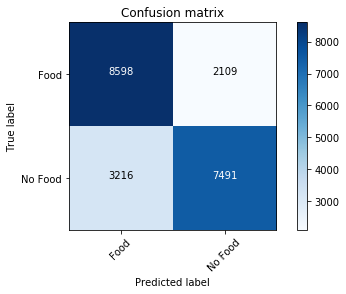



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.766461
Precision: 0.754687
Recall: 0.789577
F1 score: 0.771738
Cohens kappa: 0.532922
ROC AUC: 0.846851
F-measure = 0.7663
accuracy = 0.7665
Confusion matrix:
[[7959 2748]
 [2253 8454]]


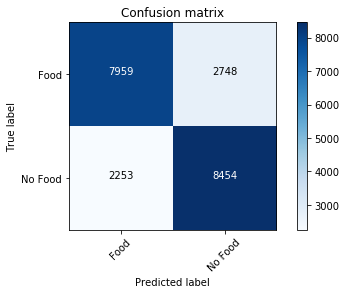



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.780191
Precision: 0.734338
Recall: 0.878024
F1 score: 0.799779
Cohens kappa: 0.560381
ROC AUC: 0.851298
F-measure = 0.7781
accuracy = 0.7802
Confusion matrix:
[[7306 3401]
 [1306 9401]]


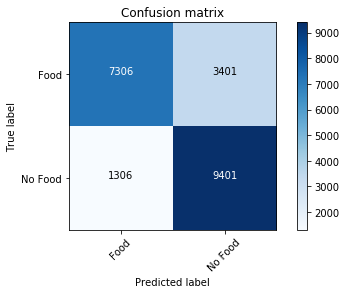



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.770804
Precision: 0.729336
Recall: 0.861212
F1 score: 0.789807
Cohens kappa: 0.541608
ROC AUC: 0.850028
F-measure = 0.7689
accuracy = 0.7708
Confusion matrix:
[[7285 3422]
 [1486 9221]]


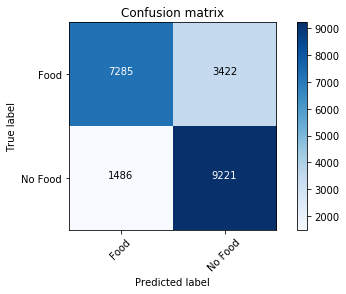



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.776922
Precision: 0.733796
Recall: 0.869151
F1 score: 0.795759
Cohens kappa: 0.553843
ROC AUC: 0.850323
F-measure = 0.7750
accuracy = 0.7769
Confusion matrix:
[[7331 3376]
 [1401 9306]]


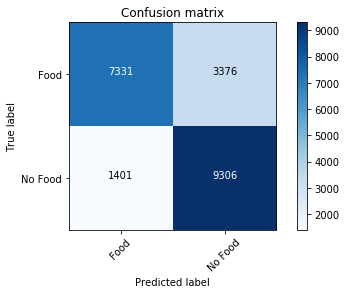



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.774493
Precision: 0.753057
Recall: 0.816849
F1 score: 0.783657
Cohens kappa: 0.548987
ROC AUC: 0.855531
F-measure = 0.7741
accuracy = 0.7745
Confusion matrix:
[[7839 2868]
 [1961 8746]]


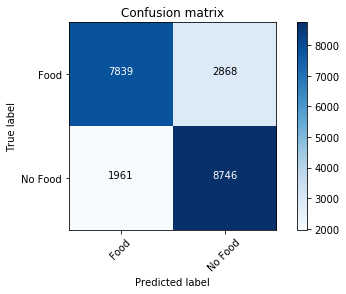



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.766881
Precision: 0.764168
Recall: 0.772018
F1 score: 0.768073
Cohens kappa: 0.533763
ROC AUC: 0.850436
F-measure = 0.7669
accuracy = 0.7669
Confusion matrix:
[[8156 2551]
 [2441 8266]]


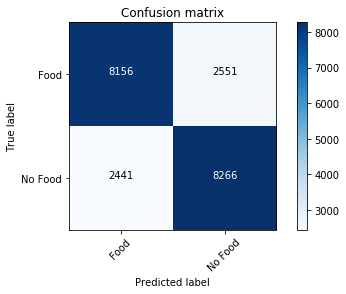



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.777435
Precision: 0.772598
Recall: 0.786308
F1 score: 0.779393
Cohens kappa: 0.554871
ROC AUC: 0.857014
F-measure = 0.7774
accuracy = 0.7774
Confusion matrix:
[[8229 2478]
 [2288 8419]]


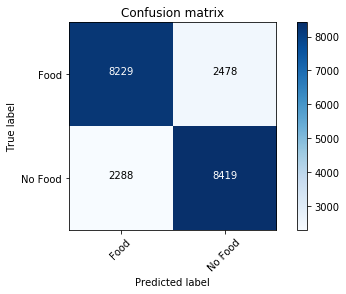



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.765387
Precision: 0.779758
Recall: 0.739703
F1 score: 0.759202
Cohens kappa: 0.530774
ROC AUC: 0.854569
F-measure = 0.7652
accuracy = 0.7654
Confusion matrix:
[[8470 2237]
 [2787 7920]]


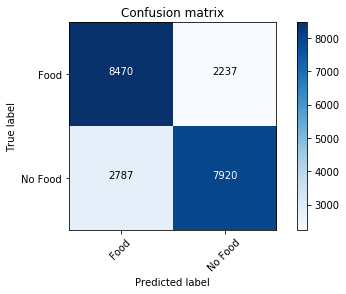



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.780611
Precision: 0.758719
Recall: 0.822920
F1 score: 0.789516
Cohens kappa: 0.561222
ROC AUC: 0.854352
F-measure = 0.7802
accuracy = 0.7806
Confusion matrix:
[[7905 2802]
 [1896 8811]]


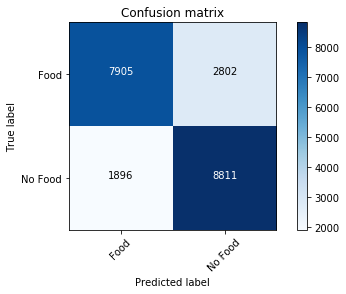



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.779023
Precision: 0.759219
Recall: 0.817222
F1 score: 0.787154
Cohens kappa: 0.558046
ROC AUC: 0.853944
F-measure = 0.7787
accuracy = 0.7790
Confusion matrix:
[[7932 2775]
 [1957 8750]]


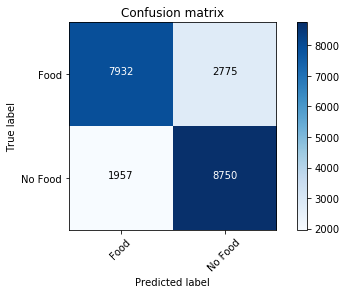



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.781031
Precision: 0.753325
Recall: 0.835715
F1 score: 0.792384
Cohens kappa: 0.562062
ROC AUC: 0.852555
F-measure = 0.7804
accuracy = 0.7810
Confusion matrix:
[[7777 2930]
 [1759 8948]]


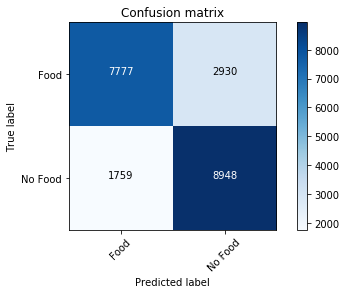



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.778603
Precision: 0.760843
Recall: 0.812646
F1 score: 0.785892
Cohens kappa: 0.557206
ROC AUC: 0.854425
F-measure = 0.7783
accuracy = 0.7786
Confusion matrix:
[[7972 2735]
 [2006 8701]]


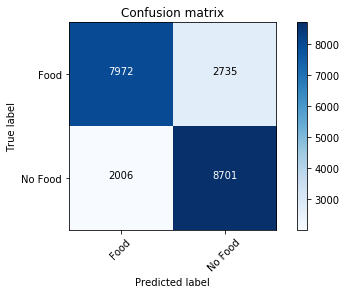



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.779770
Precision: 0.772541
Recall: 0.793033
F1 score: 0.782653
Cohens kappa: 0.559540
ROC AUC: 0.858380
F-measure = 0.7797
accuracy = 0.7798
Confusion matrix:
[[8207 2500]
 [2216 8491]]


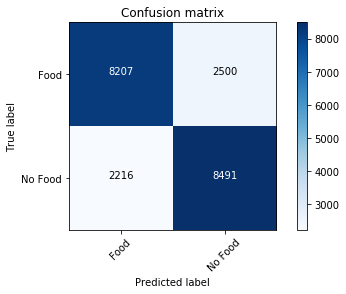



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.769030
Precision: 0.775778
Recall: 0.756795
F1 score: 0.766169
Cohens kappa: 0.538059
ROC AUC: 0.856197
F-measure = 0.7690
accuracy = 0.7690
Confusion matrix:
[[8365 2342]
 [2604 8103]]


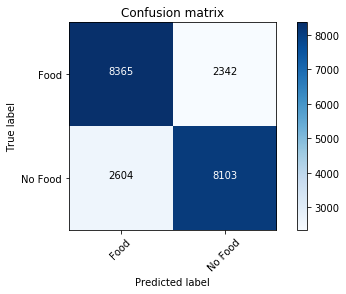



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.775521
Precision: 0.750127
Recall: 0.826282
F1 score: 0.786365
Cohens kappa: 0.551041
ROC AUC: 0.852434
F-measure = 0.7749
accuracy = 0.7755
Confusion matrix:
[[7760 2947]
 [1860 8847]]


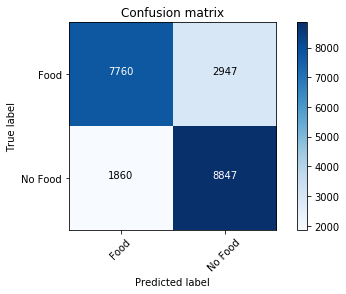



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.764733
Precision: 0.749231
Recall: 0.795835
F1 score: 0.771830
Cohens kappa: 0.529467
ROC AUC: 0.845262
F-measure = 0.7645
accuracy = 0.7647
Confusion matrix:
[[7855 2852]
 [2186 8521]]


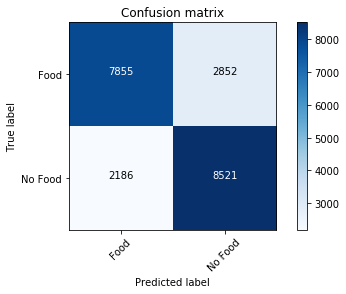



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.776361
Precision: 0.759561
Recall: 0.808723
F1 score: 0.783372
Cohens kappa: 0.552723
ROC AUC: 0.856667
F-measure = 0.7761
accuracy = 0.7764
Confusion matrix:
[[7966 2741]
 [2048 8659]]


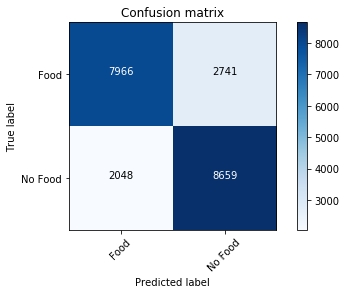



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.782712
Precision: 0.774782
Recall: 0.797142
F1 score: 0.785803
Cohens kappa: 0.565424
ROC AUC: 0.865198
F-measure = 0.7827
accuracy = 0.7827
Confusion matrix:
[[8226 2481]
 [2172 8535]]


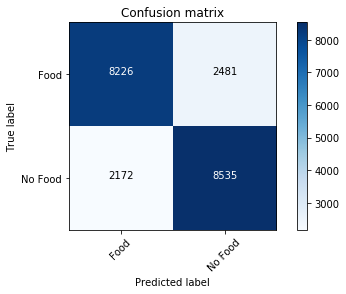



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.764640
Precision: 0.784288
Recall: 0.730083
F1 score: 0.756216
Cohens kappa: 0.529280
ROC AUC: 0.859141
F-measure = 0.7644
accuracy = 0.7646
Confusion matrix:
[[8557 2150]
 [2890 7817]]


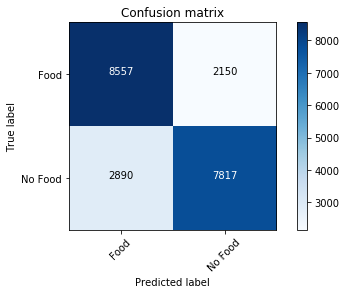



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.273746
Precision: 0.247472
Recall: 0.221724
F1 score: 0.233892
Cohens kappa: -0.452508
ROC AUC: 0.200321
F-measure = 0.2718
accuracy = 0.2737
Confusion matrix:
[[3488 7219]
 [8333 2374]]


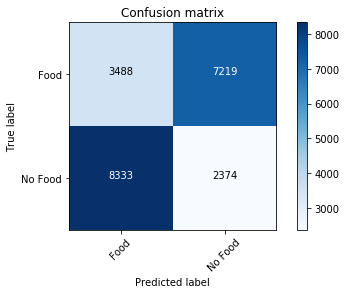



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.237041
Precision: 0.206260
Recall: 0.184646
F1 score: 0.194855
Cohens kappa: -0.525918
ROC AUC: 0.163755
F-measure = 0.2349
accuracy = 0.2370
Confusion matrix:
[[3099 7608]
 [8730 1977]]


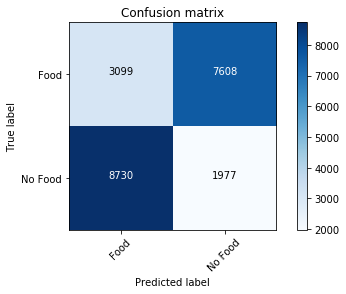



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.283600
Precision: 0.319069
Recall: 0.381620
F1 score: 0.347552
Cohens kappa: -0.432801
ROC AUC: 0.175183
F-measure = 0.2766
accuracy = 0.2836
Confusion matrix:
[[1987 8720]
 [6621 4086]]


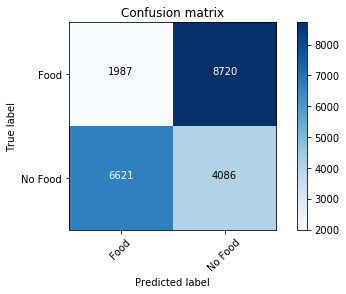



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.222565
Precision: 0.204045
Recall: 0.191277
F1 score: 0.197455
Cohens kappa: -0.554871
ROC AUC: 0.142367
F-measure = 0.2218
accuracy = 0.2226
Confusion matrix:
[[2718 7989]
 [8659 2048]]


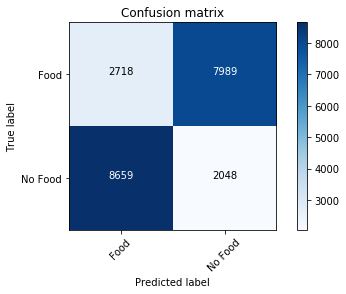



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.220930
Precision: 0.156631
Recall: 0.127300
F1 score: 0.140450
Cohens kappa: -0.558140
ROC AUC: 0.151831
F-measure = 0.2140
accuracy = 0.2209
Confusion matrix:
[[3368 7339]
 [9344 1363]]


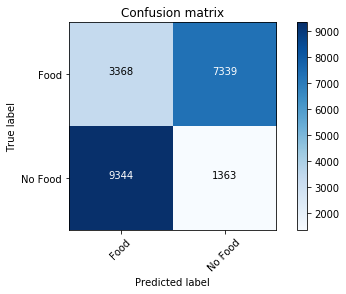



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.240357
Precision: 0.245887
Recall: 0.251238
F1 score: 0.248533
Cohens kappa: -0.519286
ROC AUC: 0.148110
F-measure = 0.2403
accuracy = 0.2404
Confusion matrix:
[[2457 8250]
 [8017 2690]]


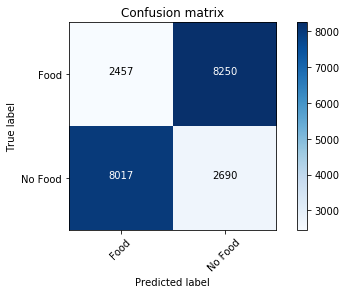



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.408705
Precision: 0.448063
Recall: 0.787616
F1 score: 0.571187
Cohens kappa: -0.182591
ROC AUC: 0.183790
F-measure = 0.3096
accuracy = 0.4087
Confusion matrix:
[[  319 10388]
 [ 2274  8433]]


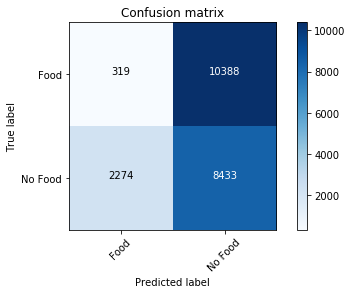



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.243999
Precision: 0.263217
Recall: 0.284580
F1 score: 0.273482
Cohens kappa: -0.512001
ROC AUC: 0.149039
F-measure = 0.2428
accuracy = 0.2440
Confusion matrix:
[[2178 8529]
 [7660 3047]]


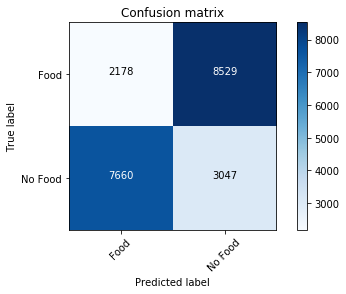



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.258663
Precision: 0.288231
Recall: 0.328477
F1 score: 0.307041
Cohens kappa: -0.482675
ROC AUC: 0.155780
F-measure = 0.2550
accuracy = 0.2587
Confusion matrix:
[[2022 8685]
 [7190 3517]]


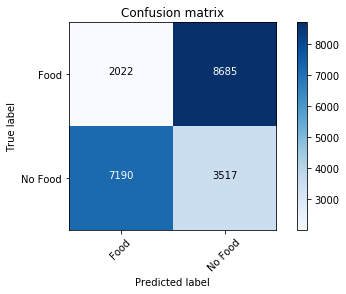



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.763939
Precision: 0.771418
Recall: 0.750163
F1 score: 0.760642
Cohens kappa: 0.527879
ROC AUC: 0.847711
F-measure = 0.7639
accuracy = 0.7639
Confusion matrix:
[[8327 2380]
 [2675 8032]]


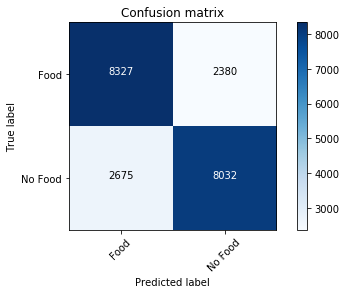



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.783273
Precision: 0.733487
Recall: 0.889885
F1 score: 0.804152
Cohens kappa: 0.566545
ROC AUC: 0.858169
F-measure = 0.7808
accuracy = 0.7833
Confusion matrix:
[[7245 3462]
 [1179 9528]]


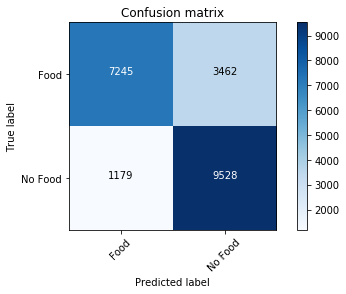



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.762679
Precision: 0.780941
Recall: 0.730177
F1 score: 0.754706
Cohens kappa: 0.525357
ROC AUC: 0.849657
F-measure = 0.7624
accuracy = 0.7627
Confusion matrix:
[[8514 2193]
 [2889 7818]]


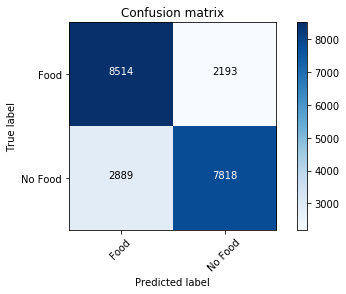



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.771598
Precision: 0.757573
Recall: 0.798823
F1 score: 0.777651
Cohens kappa: 0.543196
ROC AUC: 0.858619
F-measure = 0.7714
accuracy = 0.7716
Confusion matrix:
[[7970 2737]
 [2154 8553]]


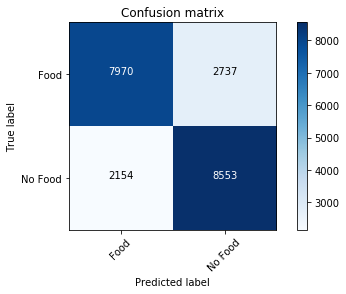



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.655085
Precision: 0.665801
Recall: 0.622770
F1 score: 0.643567
Cohens kappa: 0.310171
ROC AUC: 0.708173
F-measure = 0.6547
accuracy = 0.6551
Confusion matrix:
[[7360 3347]
 [4039 6668]]


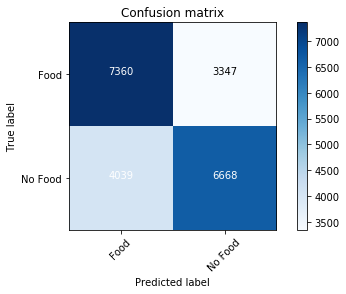



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.697441
Precision: 0.792312
Recall: 0.535164
F1 score: 0.638832
Cohens kappa: 0.394882
ROC AUC: 0.755148
F-measure = 0.6893
accuracy = 0.6974
Confusion matrix:
[[9205 1502]
 [4977 5730]]


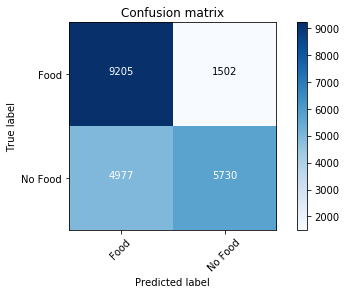



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.339591
Precision: 0.349302
Recall: 0.371813
F1 score: 0.360206
Cohens kappa: -0.320818
ROC AUC: 0.275695
F-measure = 0.3389
accuracy = 0.3396
Confusion matrix:
[[3291 7416]
 [6726 3981]]


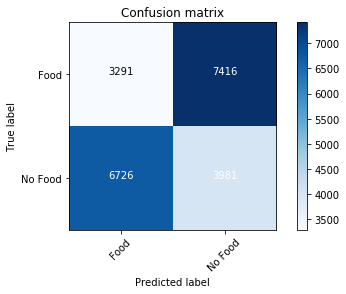



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.303540
Precision: 0.211810
Recall: 0.144392
F1 score: 0.171721
Cohens kappa: -0.392921
ROC AUC: 0.258137
F-measure = 0.2854
accuracy = 0.3035
Confusion matrix:
[[4954 5753]
 [9161 1546]]


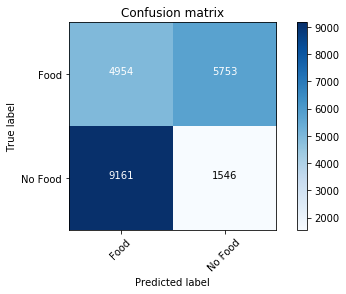



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.338890
Precision: 0.334960
Recall: 0.326982
F1 score: 0.330923
Cohens kappa: -0.322219
ROC AUC: 0.280302
F-measure = 0.3388
accuracy = 0.3389
Confusion matrix:
[[3756 6951]
 [7206 3501]]


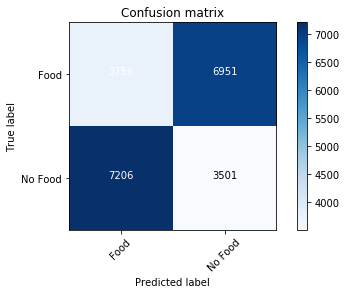



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.338003
Precision: 0.329365
Recall: 0.312693
F1 score: 0.320813
Cohens kappa: -0.323994
ROC AUC: 0.288472
F-measure = 0.3376
accuracy = 0.3380
Confusion matrix:
[[3890 6817]
 [7359 3348]]


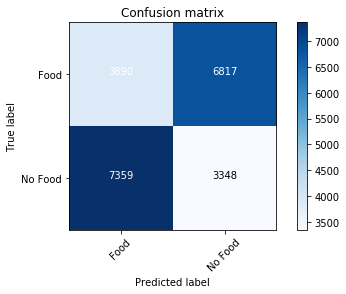



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.345568
Precision: 0.344727
Recall: 0.342860
F1 score: 0.343791
Cohens kappa: -0.308863
ROC AUC: 0.291422
F-measure = 0.3456
accuracy = 0.3456
Confusion matrix:
[[3729 6978]
 [7036 3671]]


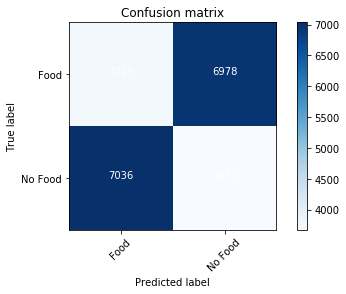



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.292332
Precision: 0.221889
Recall: 0.165686
F1 score: 0.189712
Cohens kappa: -0.415336
ROC AUC: 0.231946
F-measure = 0.2808
accuracy = 0.2923
Confusion matrix:
[[4486 6221]
 [8933 1774]]


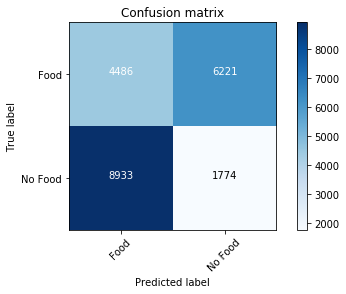



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.344915
Precision: 0.334199
Recall: 0.312599
F1 score: 0.323038
Cohens kappa: -0.310171
ROC AUC: 0.291827
F-measure = 0.3442
accuracy = 0.3449
Confusion matrix:
[[4039 6668]
 [7360 3347]]


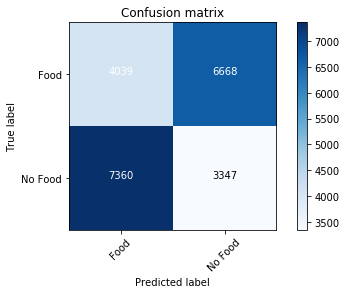



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.302559
Precision: 0.207688
Recall: 0.140282
F1 score: 0.167456
Cohens kappa: -0.394882
ROC AUC: 0.244852
F-measure = 0.2837
accuracy = 0.3026
Confusion matrix:
[[4977 5730]
 [9205 1502]]


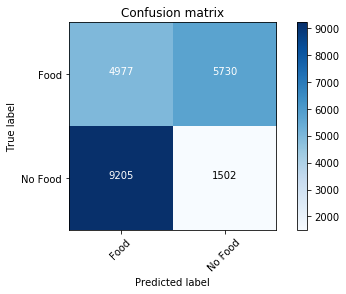



##################################################################################################




In [32]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [33]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [34]:
gc.collect()

85946

### Test Trial 3

In [35]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(TRFD3, TRNFD3, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
15296 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
15296 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 15296 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
30592 validation images will be loaded: 15296 for food, 15296 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non

In [36]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.774941
Precision: 0.781135
Recall: 0.763925
F1 score: 0.772434
Cohens kappa: 0.549882
ROC AUC: 0.860101
F-measure = 0.7749
accuracy = 0.7749
Confusion matrix:
[[12022  3274]
 [ 3611 11685]]


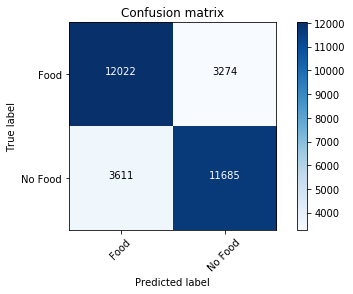



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.757682
Precision: 0.789157
Recall: 0.703256
F1 score: 0.743734
Cohens kappa: 0.515363
ROC AUC: 0.852922
F-measure = 0.7570
accuracy = 0.7577
Confusion matrix:
[[12422  2874]
 [ 4539 10757]]


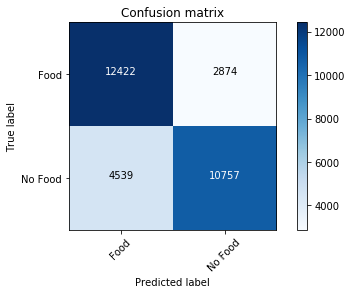



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.786905
Precision: 0.767575
Recall: 0.823026
F1 score: 0.794334
Cohens kappa: 0.573810
ROC AUC: 0.865773
F-measure = 0.7866
accuracy = 0.7869
Confusion matrix:
[[11484  3812]
 [ 2707 12589]]


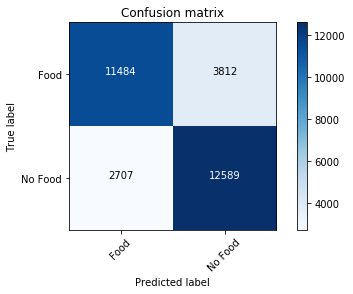



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.779844
Precision: 0.754021
Recall: 0.830675
F1 score: 0.790494
Cohens kappa: 0.559689
ROC AUC: 0.855688
F-measure = 0.7793
accuracy = 0.7798
Confusion matrix:
[[11151  4145]
 [ 2590 12706]]


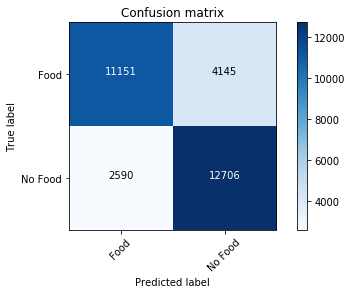



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.777785
Precision: 0.761091
Recall: 0.809754
F1 score: 0.784669
Cohens kappa: 0.555570
ROC AUC: 0.853743
F-measure = 0.7776
accuracy = 0.7778
Confusion matrix:
[[11408  3888]
 [ 2910 12386]]


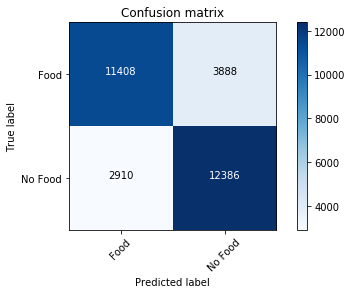



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.780171
Precision: 0.754619
Recall: 0.830348
F1 score: 0.790675
Cohens kappa: 0.560343
ROC AUC: 0.855060
F-measure = 0.7796
accuracy = 0.7802
Confusion matrix:
[[11166  4130]
 [ 2595 12701]]


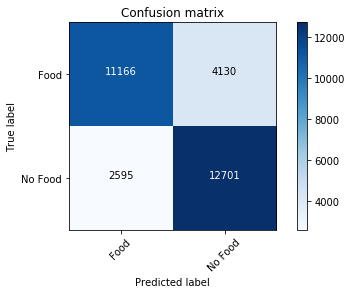



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.773209
Precision: 0.740117
Recall: 0.842116
F1 score: 0.787829
Cohens kappa: 0.546417
ROC AUC: 0.852525
F-measure = 0.7721
accuracy = 0.7732
Confusion matrix:
[[10773  4523]
 [ 2415 12881]]


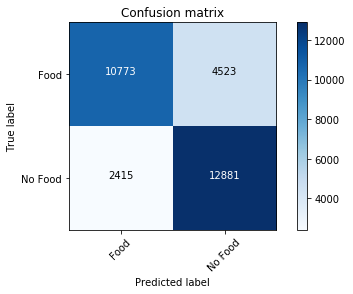



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.761637
Precision: 0.786348
Recall: 0.718488
F1 score: 0.750888
Cohens kappa: 0.523274
ROC AUC: 0.846312
F-measure = 0.7612
accuracy = 0.7616
Confusion matrix:
[[12310  2986]
 [ 4306 10990]]


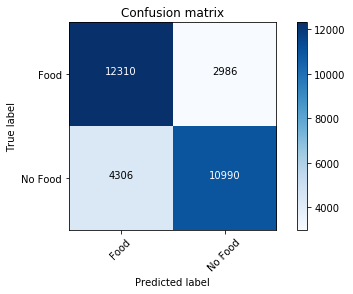



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.783179
Precision: 0.752580
Recall: 0.843750
F1 score: 0.795562
Cohens kappa: 0.566357
ROC AUC: 0.858209
F-measure = 0.7824
accuracy = 0.7832
Confusion matrix:
[[11053  4243]
 [ 2390 12906]]


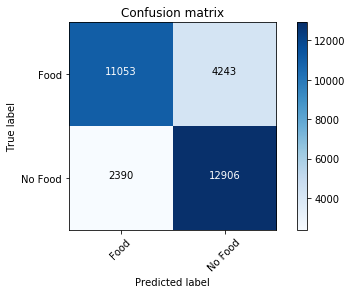



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.773405
Precision: 0.748751
Recall: 0.822960
F1 score: 0.784104
Cohens kappa: 0.546810
ROC AUC: 0.852524
F-measure = 0.7728
accuracy = 0.7734
Confusion matrix:
[[11072  4224]
 [ 2708 12588]]


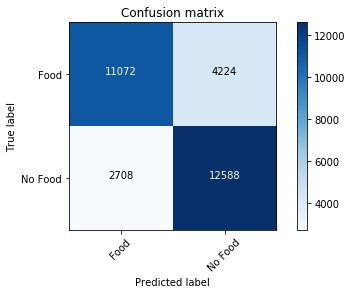



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.783832
Precision: 0.761363
Recall: 0.826817
F1 score: 0.792741
Cohens kappa: 0.567665
ROC AUC: 0.860141
F-measure = 0.7834
accuracy = 0.7838
Confusion matrix:
[[11332  3964]
 [ 2649 12647]]


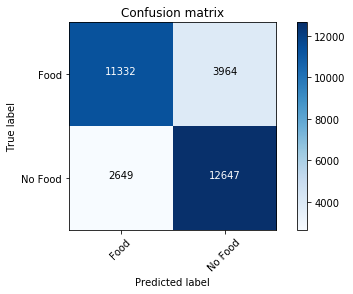



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.780727
Precision: 0.757898
Recall: 0.824987
F1 score: 0.790021
Cohens kappa: 0.561454
ROC AUC: 0.859616
F-measure = 0.7803
accuracy = 0.7807
Confusion matrix:
[[11265  4031]
 [ 2677 12619]]


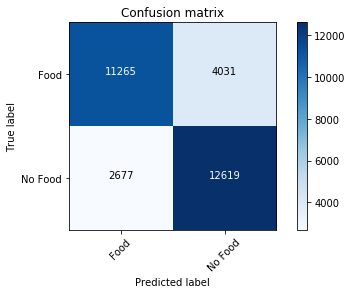



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.776249
Precision: 0.764540
Recall: 0.798379
F1 score: 0.781093
Cohens kappa: 0.552497
ROC AUC: 0.853280
F-measure = 0.7761
accuracy = 0.7762
Confusion matrix:
[[11535  3761]
 [ 3084 12212]]


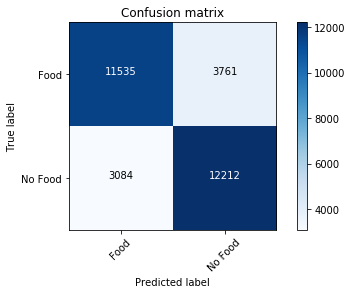



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.769221
Precision: 0.759189
Recall: 0.788572
F1 score: 0.773602
Cohens kappa: 0.538441
ROC AUC: 0.852219
F-measure = 0.7691
accuracy = 0.7692
Confusion matrix:
[[11470  3826]
 [ 3234 12062]]


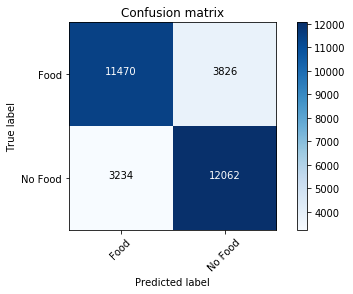



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.773241
Precision: 0.753441
Recall: 0.812304
F1 score: 0.781766
Cohens kappa: 0.546483
ROC AUC: 0.849712
F-measure = 0.7729
accuracy = 0.7732
Confusion matrix:
[[11230  4066]
 [ 2871 12425]]


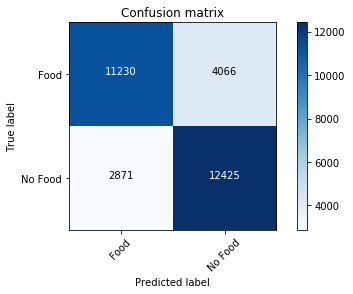



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.759578
Precision: 0.761441
Recall: 0.756015
F1 score: 0.758718
Cohens kappa: 0.519155
ROC AUC: 0.841879
F-measure = 0.7596
accuracy = 0.7596
Confusion matrix:
[[11673  3623]
 [ 3732 11564]]


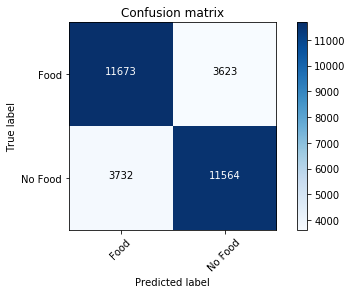



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.775954
Precision: 0.736630
Recall: 0.859048
F1 score: 0.793143
Cohens kappa: 0.551909
ROC AUC: 0.852419
F-measure = 0.7744
accuracy = 0.7760
Confusion matrix:
[[10598  4698]
 [ 2156 13140]]


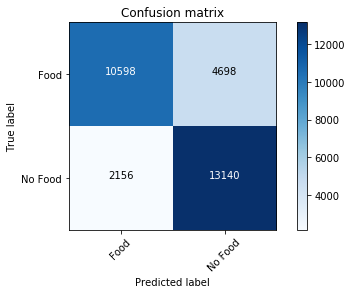



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.754249
Precision: 0.784992
Recall: 0.700314
F1 score: 0.740239
Cohens kappa: 0.508499
ROC AUC: 0.846423
F-measure = 0.7535
accuracy = 0.7542
Confusion matrix:
[[12362  2934]
 [ 4584 10712]]


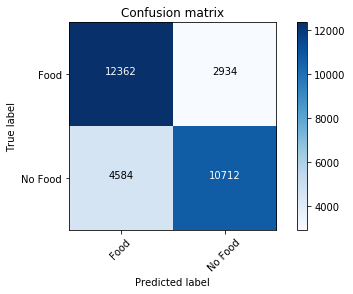



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.778864
Precision: 0.751193
Recall: 0.833944
F1 score: 0.790408
Cohens kappa: 0.557728
ROC AUC: 0.857827
F-measure = 0.7782
accuracy = 0.7789
Confusion matrix:
[[11071  4225]
 [ 2540 12756]]


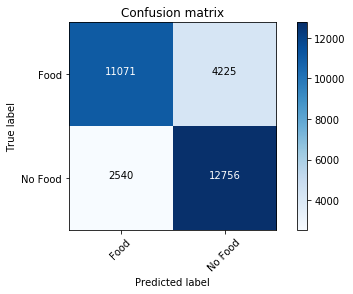



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.771149
Precision: 0.749594
Recall: 0.814331
F1 score: 0.780622
Cohens kappa: 0.542299
ROC AUC: 0.850677
F-measure = 0.7707
accuracy = 0.7711
Confusion matrix:
[[11135  4161]
 [ 2840 12456]]


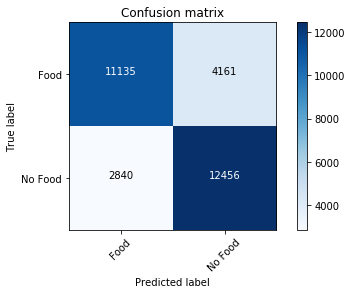



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.766573
Precision: 0.779032
Recall: 0.744247
F1 score: 0.761242
Cohens kappa: 0.533146
ROC AUC: 0.850390
F-measure = 0.7665
accuracy = 0.7666
Confusion matrix:
[[12067  3229]
 [ 3912 11384]]


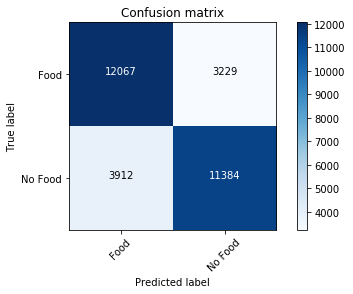



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.776281
Precision: 0.772997
Recall: 0.782296
F1 score: 0.777619
Cohens kappa: 0.552563
ROC AUC: 0.858006
F-measure = 0.7763
accuracy = 0.7763
Confusion matrix:
[[11782  3514]
 [ 3330 11966]]


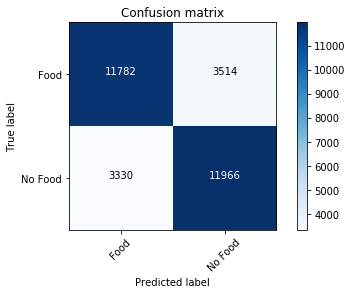



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.784976
Precision: 0.780610
Recall: 0.792756
F1 score: 0.786636
Cohens kappa: 0.569953
ROC AUC: 0.860668
F-measure = 0.7850
accuracy = 0.7850
Confusion matrix:
[[11888  3408]
 [ 3170 12126]]


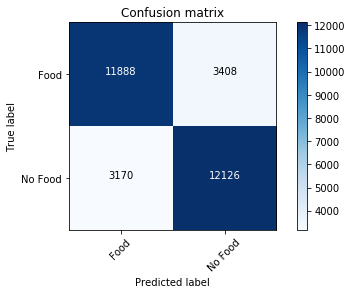



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.796319
Precision: 0.751652
Recall: 0.885068
F1 score: 0.812922
Cohens kappa: 0.592639
ROC AUC: 0.865322
F-measure = 0.7947
accuracy = 0.7963
Confusion matrix:
[[10823  4473]
 [ 1758 13538]]


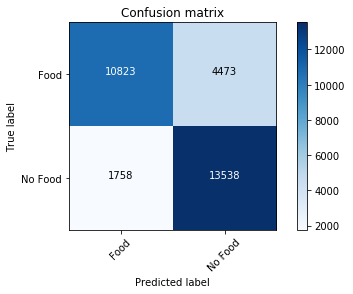



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.786219
Precision: 0.758808
Recall: 0.839174
F1 score: 0.796970
Cohens kappa: 0.572437
ROC AUC: 0.856681
F-measure = 0.7856
accuracy = 0.7862
Confusion matrix:
[[11216  4080]
 [ 2460 12836]]


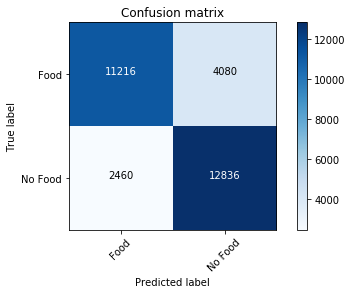



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.789716
Precision: 0.777611
Recall: 0.811519
F1 score: 0.794203
Cohens kappa: 0.579433
ROC AUC: 0.863514
F-measure = 0.7896
accuracy = 0.7897
Confusion matrix:
[[11746  3550]
 [ 2883 12413]]


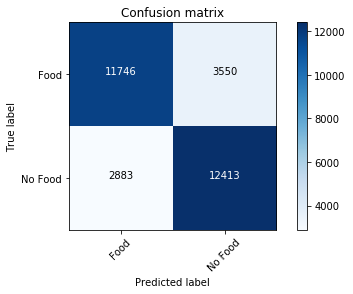



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.781217
Precision: 0.773233
Recall: 0.795829
F1 score: 0.784368
Cohens kappa: 0.562435
ROC AUC: 0.857177
F-measure = 0.7812
accuracy = 0.7812
Confusion matrix:
[[11726  3570]
 [ 3123 12173]]


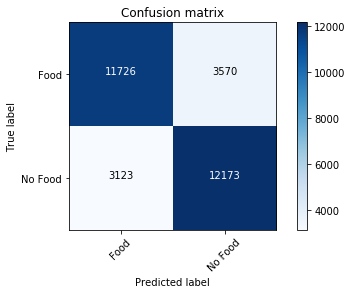



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.789978
Precision: 0.758043
Recall: 0.851857
F1 score: 0.802216
Cohens kappa: 0.579956
ROC AUC: 0.865678
F-measure = 0.7892
accuracy = 0.7900
Confusion matrix:
[[11137  4159]
 [ 2266 13030]]


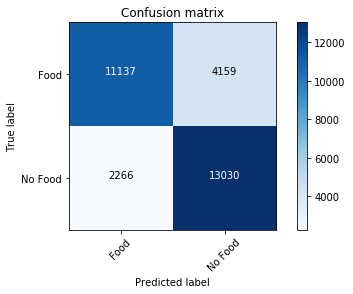



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.777556
Precision: 0.744121
Recall: 0.846038
F1 score: 0.791813
Cohens kappa: 0.555112
ROC AUC: 0.854693
F-measure = 0.7765
accuracy = 0.7776
Confusion matrix:
[[10846  4450]
 [ 2355 12941]]


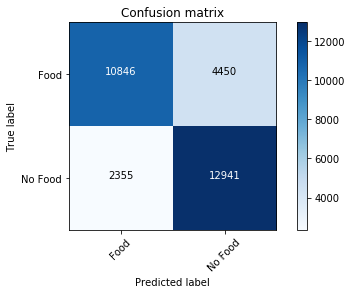



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.774287
Precision: 0.777352
Recall: 0.768763
F1 score: 0.773034
Cohens kappa: 0.548575
ROC AUC: 0.857093
F-measure = 0.7743
accuracy = 0.7743
Confusion matrix:
[[11928  3368]
 [ 3537 11759]]


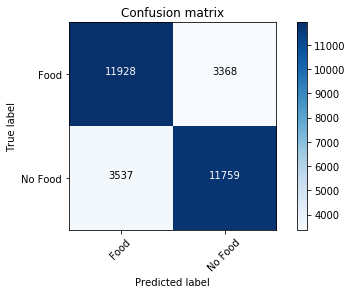



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.779256
Precision: 0.772365
Recall: 0.791906
F1 score: 0.782014
Cohens kappa: 0.558512
ROC AUC: 0.861428
F-measure = 0.7792
accuracy = 0.7793
Confusion matrix:
[[11726  3570]
 [ 3183 12113]]


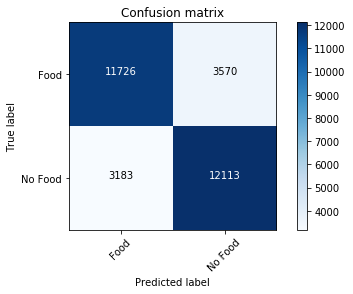



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.784519
Precision: 0.765528
Recall: 0.820280
F1 score: 0.791959
Cohens kappa: 0.569038
ROC AUC: 0.861050
F-measure = 0.7842
accuracy = 0.7845
Confusion matrix:
[[11453  3843]
 [ 2749 12547]]


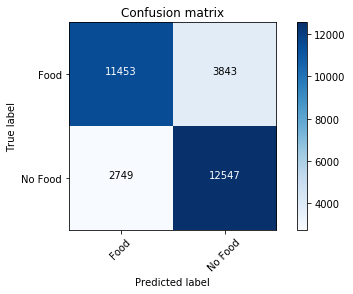



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.779681
Precision: 0.750850
Recall: 0.837147
F1 score: 0.791654
Cohens kappa: 0.559362
ROC AUC: 0.854259
F-measure = 0.7790
accuracy = 0.7797
Confusion matrix:
[[11047  4249]
 [ 2491 12805]]


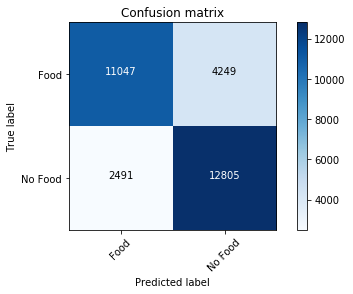



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.779387
Precision: 0.747610
Recall: 0.843554
F1 score: 0.792689
Cohens kappa: 0.558774
ROC AUC: 0.854009
F-measure = 0.7785
accuracy = 0.7794
Confusion matrix:
[[10940  4356]
 [ 2393 12903]]


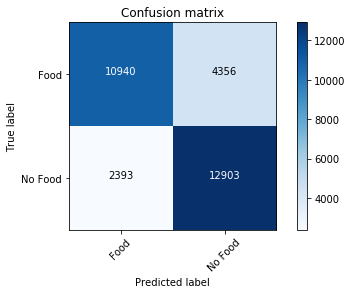



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.782688
Precision: 0.752334
Recall: 0.842835
F1 score: 0.795017
Cohens kappa: 0.565377
ROC AUC: 0.856231
F-measure = 0.7819
accuracy = 0.7827
Confusion matrix:
[[11052  4244]
 [ 2404 12892]]


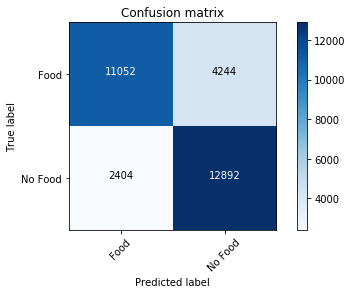



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.783832
Precision: 0.762469
Recall: 0.824529
F1 score: 0.792286
Cohens kappa: 0.567665
ROC AUC: 0.859963
F-measure = 0.7835
accuracy = 0.7838
Confusion matrix:
[[11367  3929]
 [ 2684 12612]]


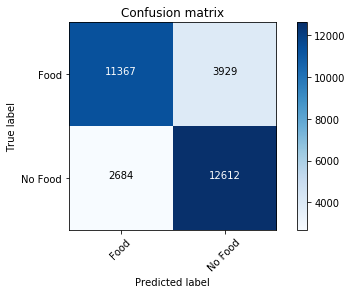



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.749444
Precision: 0.781400
Recall: 0.692665
F1 score: 0.734361
Cohens kappa: 0.498889
ROC AUC: 0.851139
F-measure = 0.7486
accuracy = 0.7494
Confusion matrix:
[[12332  2964]
 [ 4701 10595]]


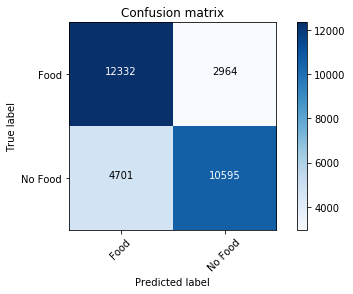



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.765363
Precision: 0.758403
Recall: 0.778831
F1 score: 0.768481
Cohens kappa: 0.530727
ROC AUC: 0.849999
F-measure = 0.7653
accuracy = 0.7654
Confusion matrix:
[[11501  3795]
 [ 3383 11913]]


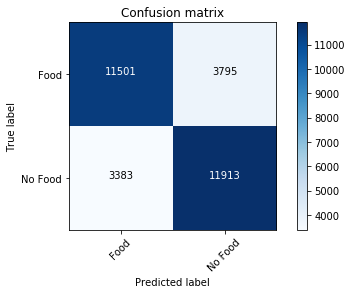



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.780858
Precision: 0.736642
Recall: 0.874281
F1 score: 0.799581
Cohens kappa: 0.561715
ROC AUC: 0.851593
F-measure = 0.7789
accuracy = 0.7809
Confusion matrix:
[[10515  4781]
 [ 1923 13373]]


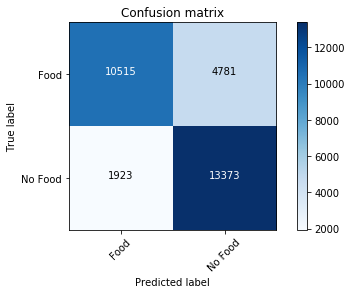



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.773405
Precision: 0.734050
Recall: 0.857479
F1 score: 0.790978
Cohens kappa: 0.546810
ROC AUC: 0.848776
F-measure = 0.7718
accuracy = 0.7734
Confusion matrix:
[[10544  4752]
 [ 2180 13116]]


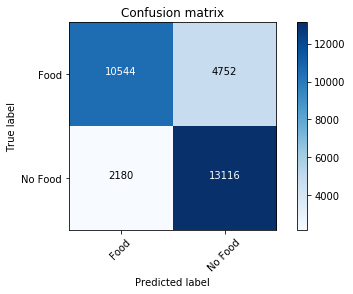



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.780335
Precision: 0.740926
Recall: 0.862121
F1 score: 0.796942
Cohens kappa: 0.560669
ROC AUC: 0.851258
F-measure = 0.7789
accuracy = 0.7803
Confusion matrix:
[[10685  4611]
 [ 2109 13187]]


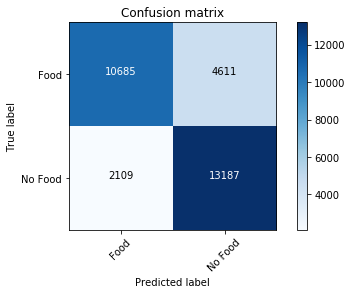



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.776706
Precision: 0.757875
Recall: 0.813219
F1 score: 0.784572
Cohens kappa: 0.553413
ROC AUC: 0.854971
F-measure = 0.7764
accuracy = 0.7767
Confusion matrix:
[[11322  3974]
 [ 2857 12439]]


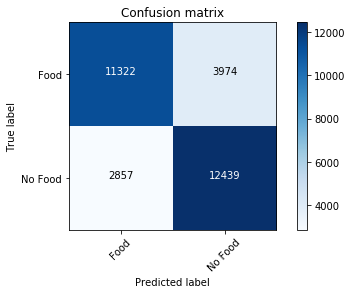



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.768763
Precision: 0.769680
Recall: 0.767063
F1 score: 0.768369
Cohens kappa: 0.537526
ROC AUC: 0.853466
F-measure = 0.7688
accuracy = 0.7688
Confusion matrix:
[[11785  3511]
 [ 3563 11733]]


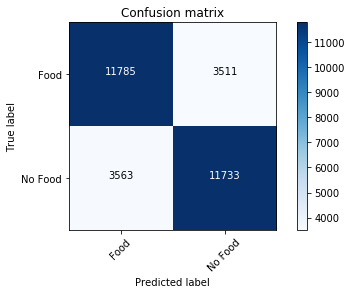



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.779518
Precision: 0.774863
Recall: 0.787984
F1 score: 0.781369
Cohens kappa: 0.559035
ROC AUC: 0.858184
F-measure = 0.7795
accuracy = 0.7795
Confusion matrix:
[[11794  3502]
 [ 3243 12053]]


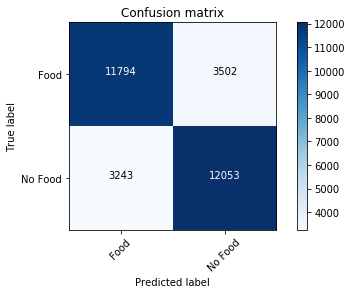



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.767129
Precision: 0.782651
Recall: 0.739671
F1 score: 0.760554
Cohens kappa: 0.534257
ROC AUC: 0.857855
F-measure = 0.7670
accuracy = 0.7671
Confusion matrix:
[[12154  3142]
 [ 3982 11314]]


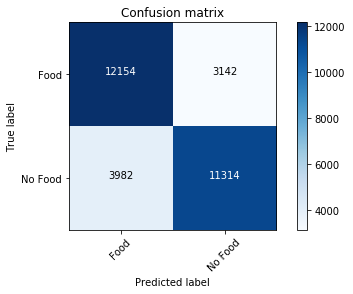



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.780531
Precision: 0.760187
Recall: 0.819626
F1 score: 0.788788
Cohens kappa: 0.561062
ROC AUC: 0.855970
F-measure = 0.7802
accuracy = 0.7805
Confusion matrix:
[[11341  3955]
 [ 2759 12537]]


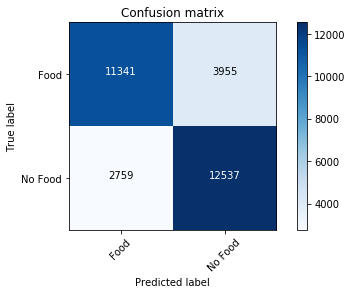



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.778079
Precision: 0.759091
Recall: 0.814723
F1 score: 0.785924
Cohens kappa: 0.556158
ROC AUC: 0.855743
F-measure = 0.7778
accuracy = 0.7781
Confusion matrix:
[[11341  3955]
 [ 2834 12462]]


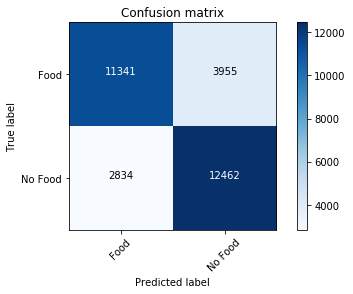



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.782558
Precision: 0.757017
Recall: 0.832244
F1 score: 0.792850
Cohens kappa: 0.565115
ROC AUC: 0.857960
F-measure = 0.7820
accuracy = 0.7826
Confusion matrix:
[[11210  4086]
 [ 2566 12730]]


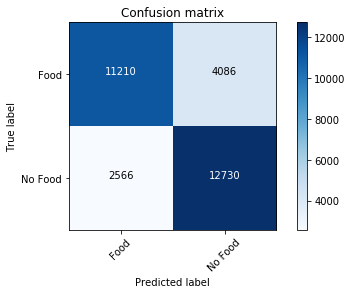



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.780792
Precision: 0.762948
Recall: 0.814723
F1 score: 0.787986
Cohens kappa: 0.561585
ROC AUC: 0.859076
F-measure = 0.7805
accuracy = 0.7808
Confusion matrix:
[[11424  3872]
 [ 2834 12462]]


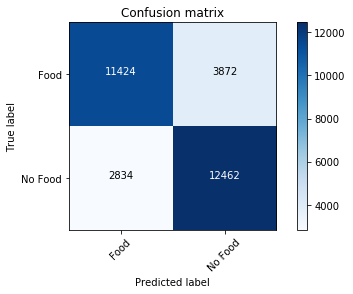



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.782525
Precision: 0.776328
Recall: 0.793737
F1 score: 0.784936
Cohens kappa: 0.565050
ROC AUC: 0.861909
F-measure = 0.7825
accuracy = 0.7825
Confusion matrix:
[[11798  3498]
 [ 3155 12141]]


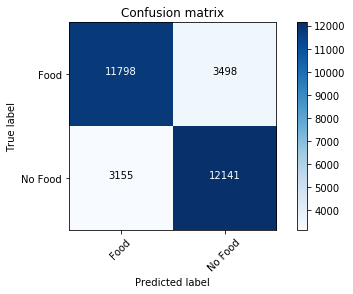



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.773013
Precision: 0.780947
Recall: 0.758891
F1 score: 0.769761
Cohens kappa: 0.546025
ROC AUC: 0.859657
F-measure = 0.7730
accuracy = 0.7730
Confusion matrix:
[[12040  3256]
 [ 3688 11608]]


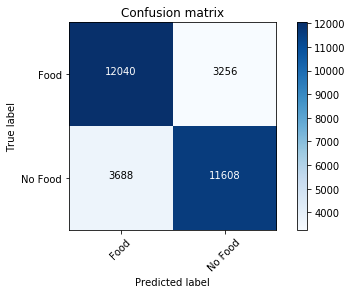



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.775333
Precision: 0.752322
Recall: 0.820934
F1 score: 0.785131
Cohens kappa: 0.550667
ROC AUC: 0.853528
F-measure = 0.7749
accuracy = 0.7753
Confusion matrix:
[[11162  4134]
 [ 2739 12557]]


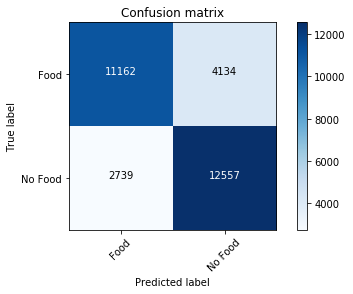



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.765887
Precision: 0.751173
Recall: 0.795175
F1 score: 0.772548
Cohens kappa: 0.531773
ROC AUC: 0.846833
F-measure = 0.7657
accuracy = 0.7659
Confusion matrix:
[[11267  4029]
 [ 3133 12163]]


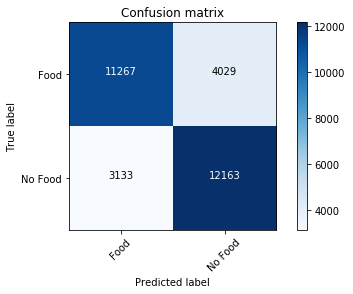



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.781446
Precision: 0.766036
Recall: 0.810408
F1 score: 0.787598
Cohens kappa: 0.562892
ROC AUC: 0.858574
F-measure = 0.7813
accuracy = 0.7814
Confusion matrix:
[[11510  3786]
 [ 2900 12396]]


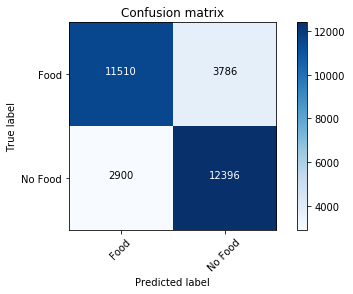



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.783342
Precision: 0.777323
Recall: 0.794195
F1 score: 0.785668
Cohens kappa: 0.566684
ROC AUC: 0.866455
F-measure = 0.7833
accuracy = 0.7833
Confusion matrix:
[[11816  3480]
 [ 3148 12148]]


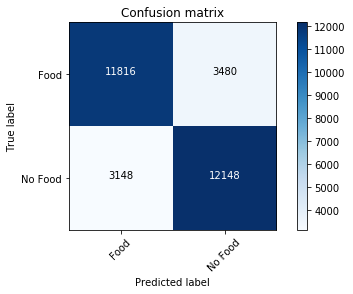



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.764252
Precision: 0.785775
Recall: 0.726595
F1 score: 0.755027
Cohens kappa: 0.528504
ROC AUC: 0.859890
F-measure = 0.7639
accuracy = 0.7643
Confusion matrix:
[[12266  3030]
 [ 4182 11114]]


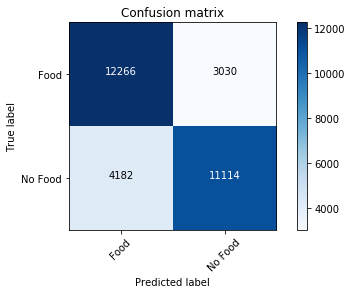



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.269253
Precision: 0.248019
Recall: 0.227118
F1 score: 0.237109
Cohens kappa: -0.461493
ROC AUC: 0.196171
F-measure = 0.2680
accuracy = 0.2693
Confusion matrix:
[[ 4763 10533]
 [11822  3474]]


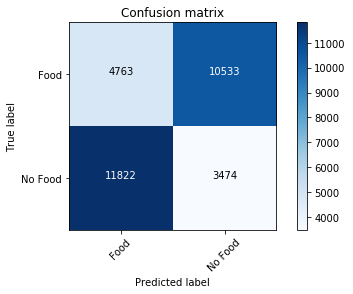



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.234375
Precision: 0.203214
Recall: 0.181878
F1 score: 0.191955
Cohens kappa: -0.531250
ROC AUC: 0.162042
F-measure = 0.2323
accuracy = 0.2344
Confusion matrix:
[[ 4388 10908]
 [12514  2782]]


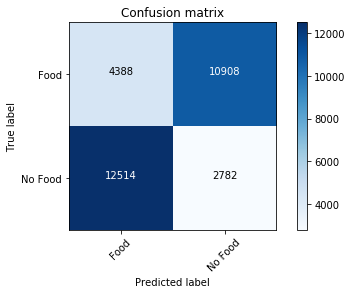



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.280237
Precision: 0.316942
Recall: 0.380492
F1 score: 0.345821
Cohens kappa: -0.439527
ROC AUC: 0.172427
F-measure = 0.2729
accuracy = 0.2802
Confusion matrix:
[[ 2753 12543]
 [ 9476  5820]]


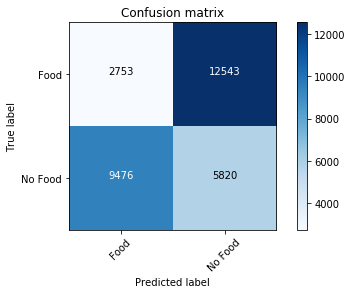



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.226562
Precision: 0.212681
Recall: 0.202406
F1 score: 0.207416
Cohens kappa: -0.546875
ROC AUC: 0.144369
F-measure = 0.2261
accuracy = 0.2266
Confusion matrix:
[[ 3835 11461]
 [12200  3096]]


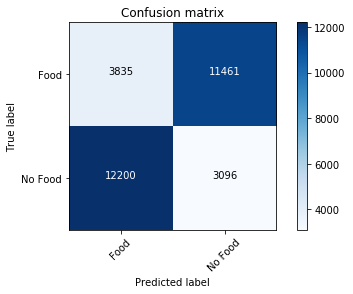



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.219404
Precision: 0.158280
Recall: 0.129969
F1 score: 0.142734
Cohens kappa: -0.561192
ROC AUC: 0.148209
F-measure = 0.2131
accuracy = 0.2194
Confusion matrix:
[[ 4724 10572]
 [13308  1988]]


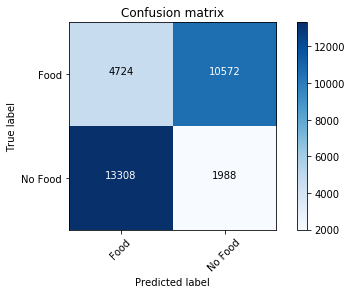



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.238853
Precision: 0.246107
Recall: 0.253138
F1 score: 0.249573
Cohens kappa: -0.522293
ROC AUC: 0.148117
F-measure = 0.2387
accuracy = 0.2389
Confusion matrix:
[[ 3435 11861]
 [11424  3872]]


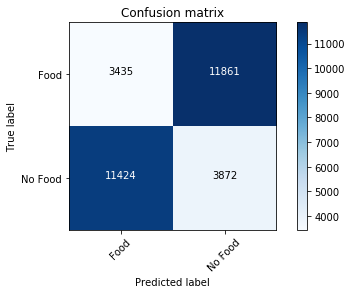



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.409519
Precision: 0.448523
Recall: 0.788376
F1 score: 0.571760
Cohens kappa: -0.180962
ROC AUC: 0.179963
F-measure = 0.3106
accuracy = 0.4095
Confusion matrix:
[[  469 14827]
 [ 3237 12059]]


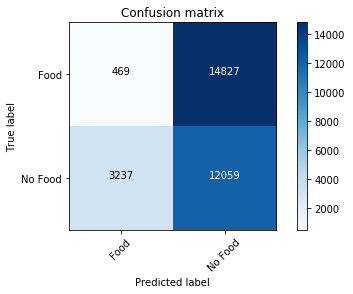



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.238134
Precision: 0.259299
Recall: 0.282100
F1 score: 0.270219
Cohens kappa: -0.523732
ROC AUC: 0.144835
F-measure = 0.2367
accuracy = 0.2381
Confusion matrix:
[[ 2970 12326]
 [10981  4315]]


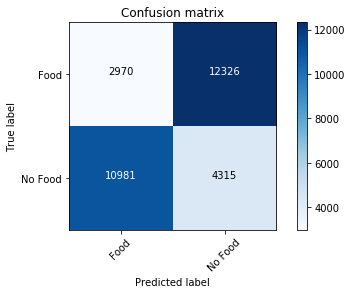



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.255688
Precision: 0.287791
Recall: 0.331328
F1 score: 0.308029
Cohens kappa: -0.488624
ROC AUC: 0.151054
F-measure = 0.2514
accuracy = 0.2557
Confusion matrix:
[[ 2754 12542]
 [10228  5068]]


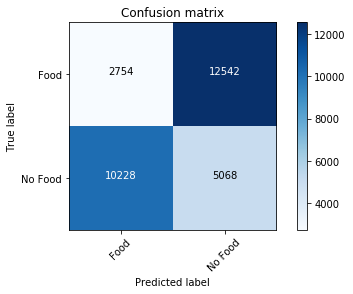



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.764546
Precision: 0.773690
Recall: 0.747843
F1 score: 0.760547
Cohens kappa: 0.529093
ROC AUC: 0.850246
F-measure = 0.7645
accuracy = 0.7645
Confusion matrix:
[[11950  3346]
 [ 3857 11439]]


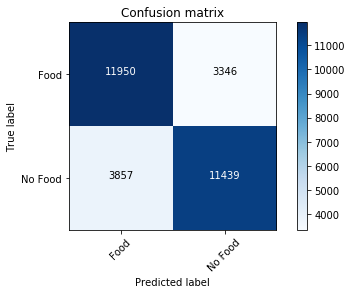



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.786742
Precision: 0.737569
Recall: 0.890233
F1 score: 0.806742
Cohens kappa: 0.573483
ROC AUC: 0.860269
F-measure = 0.7844
accuracy = 0.7867
Confusion matrix:
[[10451  4845]
 [ 1679 13617]]


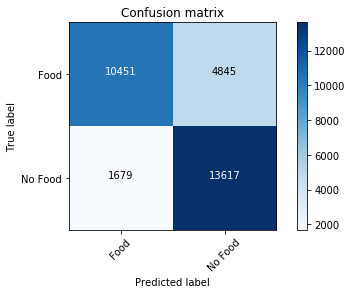



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.763860
Precision: 0.785270
Recall: 0.726334
F1 score: 0.754653
Cohens kappa: 0.527720
ROC AUC: 0.852082
F-measure = 0.7635
accuracy = 0.7639
Confusion matrix:
[[12258  3038]
 [ 4186 11110]]


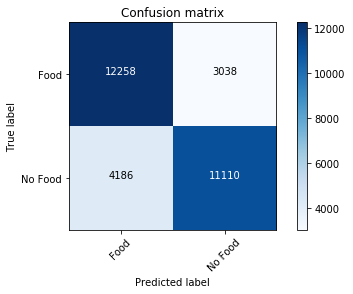



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.774778
Precision: 0.761608
Recall: 0.799948
F1 score: 0.780307
Cohens kappa: 0.549555
ROC AUC: 0.858334
F-measure = 0.7746
accuracy = 0.7748
Confusion matrix:
[[11466  3830]
 [ 3060 12236]]


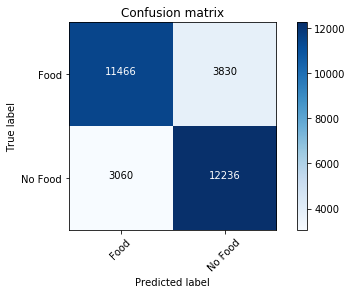



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.657754
Precision: 0.667105
Recall: 0.629772
F1 score: 0.647902
Cohens kappa: 0.315507
ROC AUC: 0.709603
F-measure = 0.6575
accuracy = 0.6578
Confusion matrix:
[[10489  4807]
 [ 5663  9633]]


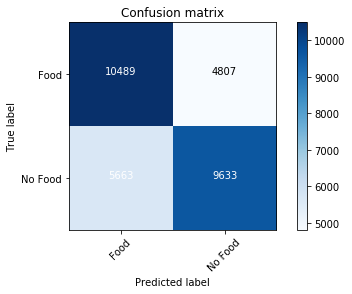



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.699006
Precision: 0.791850
Recall: 0.539945
F1 score: 0.642074
Cohens kappa: 0.398013
ROC AUC: 0.757075
F-measure = 0.6912
accuracy = 0.6990
Confusion matrix:
[[13125  2171]
 [ 7037  8259]]


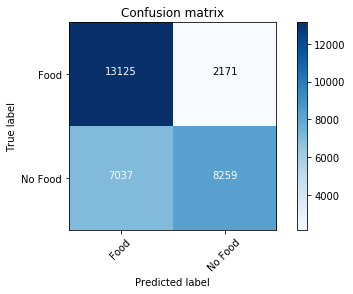



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.343750
Precision: 0.354197
Recall: 0.379576
F1 score: 0.366448
Cohens kappa: -0.312500
ROC AUC: 0.274418
F-measure = 0.3429
accuracy = 0.3438
Confusion matrix:
[[ 4710 10586]
 [ 9490  5806]]


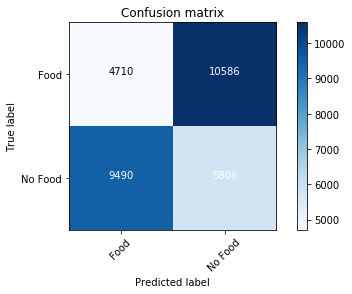



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.302072
Precision: 0.220891
Recall: 0.156642
F1 score: 0.183300
Cohens kappa: -0.395855
ROC AUC: 0.253742
F-measure = 0.2870
accuracy = 0.3021
Confusion matrix:
[[ 6845  8451]
 [12900  2396]]


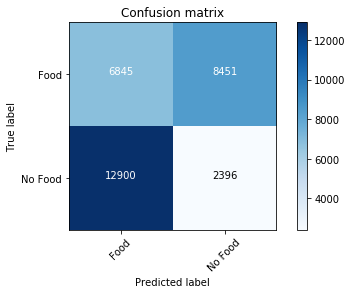



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.334467
Precision: 0.330635
Recall: 0.323156
F1 score: 0.326853
Cohens kappa: -0.331067
ROC AUC: 0.275167
F-measure = 0.3344
accuracy = 0.3345
Confusion matrix:
[[ 5289 10007]
 [10353  4943]]


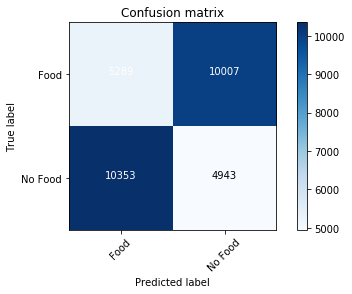



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.337539
Precision: 0.330722
Recall: 0.317403
F1 score: 0.323926
Cohens kappa: -0.324922
ROC AUC: 0.286191
F-measure = 0.3373
accuracy = 0.3375
Confusion matrix:
[[ 5471  9825]
 [10441  4855]]


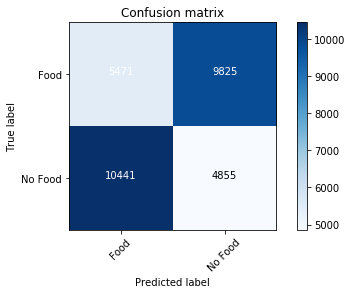



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.345809
Precision: 0.345537
Recall: 0.344927
F1 score: 0.345231
Cohens kappa: -0.308381
ROC AUC: 0.290682
F-measure = 0.3458
accuracy = 0.3458
Confusion matrix:
[[ 5303  9993]
 [10020  5276]]


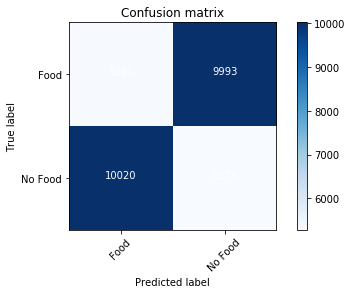



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.287592
Precision: 0.219962
Recall: 0.166841
F1 score: 0.189754
Cohens kappa: -0.424817
ROC AUC: 0.223701
F-measure = 0.2771
accuracy = 0.2876
Confusion matrix:
[[ 6246  9050]
 [12744  2552]]


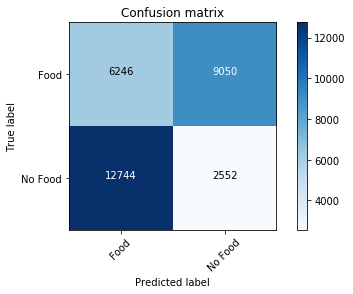



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.342246
Precision: 0.332895
Recall: 0.314265
F1 score: 0.323312
Cohens kappa: -0.315507
ROC AUC: 0.290397
F-measure = 0.3417
accuracy = 0.3422
Confusion matrix:
[[ 5663  9633]
 [10489  4807]]


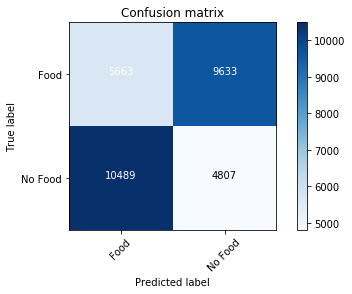



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.300994
Precision: 0.208150
Recall: 0.141933
F1 score: 0.168779
Cohens kappa: -0.398013
ROC AUC: 0.242925
F-measure = 0.2828
accuracy = 0.3010
Confusion matrix:
[[ 7037  8259]
 [13125  2171]]


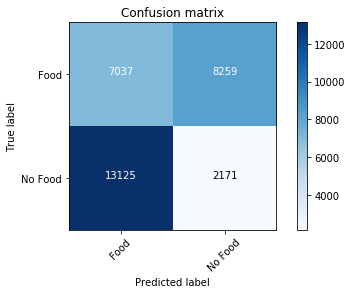



##################################################################################################




In [37]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [38]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [39]:
gc.collect()

53322

### Test Trial 4

In [40]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(VLFD2, VLNFD2, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
7354 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
7354 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 7354 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
14708 validation images will be loaded: 7354 for food, 7354 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
7354 non food

In [41]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.767813
Precision: 0.770053
Recall: 0.763666
F1 score: 0.766846
Cohens kappa: 0.535627
ROC AUC: 0.853385
F-measure = 0.7678
accuracy = 0.7678
Confusion matrix:
[[5677 1677]
 [1738 5616]]


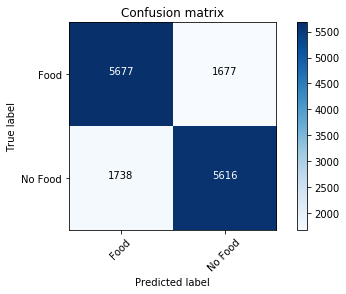



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.753400
Precision: 0.776689
Recall: 0.711314
F1 score: 0.742565
Cohens kappa: 0.506799
ROC AUC: 0.847674
F-measure = 0.7530
accuracy = 0.7534
Confusion matrix:
[[5850 1504]
 [2123 5231]]


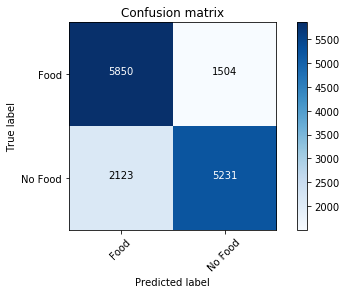



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.784539
Precision: 0.759906
Recall: 0.831928
F1 score: 0.794288
Cohens kappa: 0.569078
ROC AUC: 0.862629
F-measure = 0.7841
accuracy = 0.7845
Confusion matrix:
[[5421 1933]
 [1236 6118]]


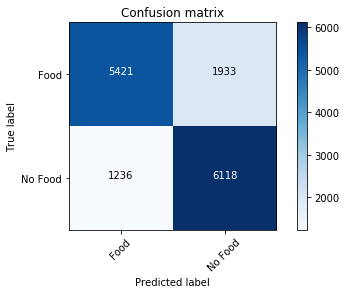



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.767745
Precision: 0.737572
Recall: 0.831248
F1 score: 0.781614
Cohens kappa: 0.535491
ROC AUC: 0.842116
F-measure = 0.7668
accuracy = 0.7677
Confusion matrix:
[[5179 2175]
 [1241 6113]]


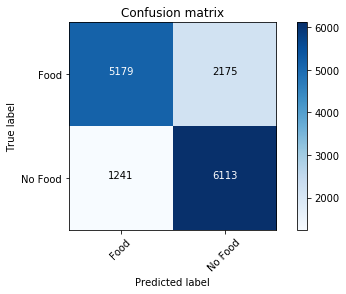



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.770669
Precision: 0.747236
Recall: 0.818058
F1 score: 0.781045
Cohens kappa: 0.541338
ROC AUC: 0.844617
F-measure = 0.7702
accuracy = 0.7707
Confusion matrix:
[[5319 2035]
 [1338 6016]]


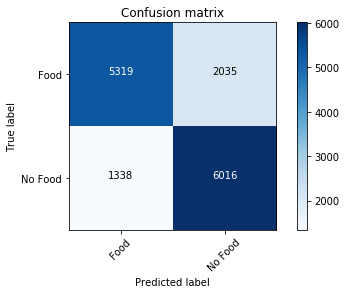



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.771961
Precision: 0.742424
Recall: 0.832880
F1 score: 0.785055
Cohens kappa: 0.543922
ROC AUC: 0.846787
F-measure = 0.7711
accuracy = 0.7720
Confusion matrix:
[[5229 2125]
 [1229 6125]]


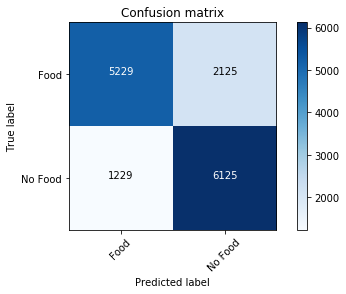



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.762646
Precision: 0.725827
Recall: 0.844166
F1 score: 0.780537
Cohens kappa: 0.525292
ROC AUC: 0.843551
F-measure = 0.7611
accuracy = 0.7626
Confusion matrix:
[[5009 2345]
 [1146 6208]]


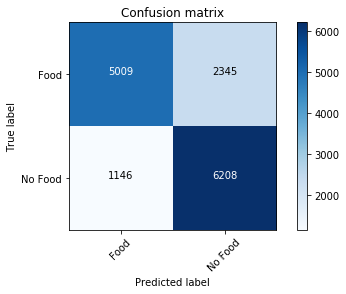



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.754555
Precision: 0.772251
Recall: 0.722056
F1 score: 0.746311
Cohens kappa: 0.509111
ROC AUC: 0.837322
F-measure = 0.7543
accuracy = 0.7546
Confusion matrix:
[[5788 1566]
 [2044 5310]]


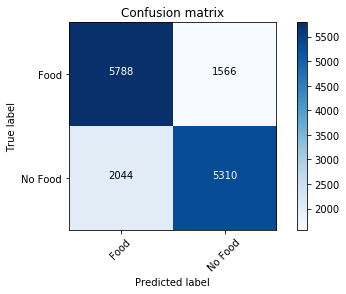



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.775088
Precision: 0.741120
Recall: 0.845526
F1 score: 0.789888
Cohens kappa: 0.550177
ROC AUC: 0.848109
F-measure = 0.7740
accuracy = 0.7751
Confusion matrix:
[[5182 2172]
 [1136 6218]]


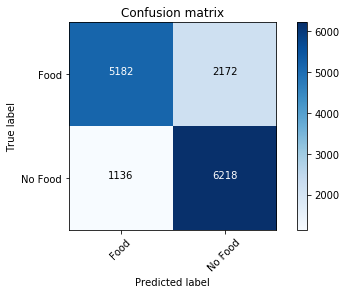



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.765978
Precision: 0.735663
Recall: 0.830296
F1 score: 0.780120
Cohens kappa: 0.531955
ROC AUC: 0.840382
F-measure = 0.7650
accuracy = 0.7660
Confusion matrix:
[[5160 2194]
 [1248 6106]]


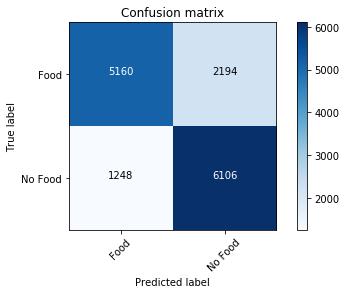



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.774273
Precision: 0.745916
Recall: 0.831928
F1 score: 0.786578
Cohens kappa: 0.548545
ROC AUC: 0.852490
F-measure = 0.7735
accuracy = 0.7743
Confusion matrix:
[[5270 2084]
 [1236 6118]]


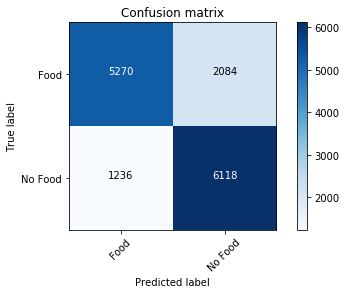



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.773593
Precision: 0.744234
Recall: 0.833696
F1 score: 0.786429
Cohens kappa: 0.547185
ROC AUC: 0.853731
F-measure = 0.7728
accuracy = 0.7736
Confusion matrix:
[[5247 2107]
 [1223 6131]]


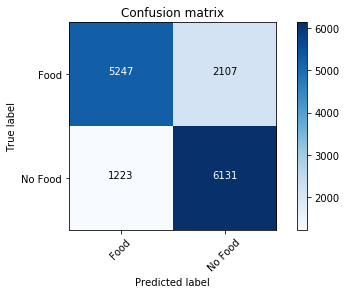



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.768901
Precision: 0.752716
Recall: 0.800925
F1 score: 0.776072
Cohens kappa: 0.537803
ROC AUC: 0.845240
F-measure = 0.7687
accuracy = 0.7689
Confusion matrix:
[[5419 1935]
 [1464 5890]]


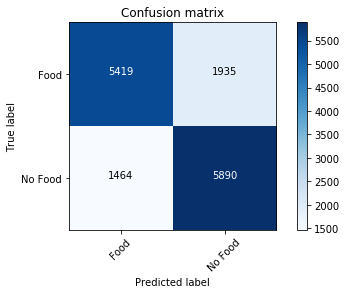



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.762510
Precision: 0.748552
Recall: 0.790590
F1 score: 0.768997
Cohens kappa: 0.525020
ROC AUC: 0.844856
F-measure = 0.7623
accuracy = 0.7625
Confusion matrix:
[[5401 1953]
 [1540 5814]]


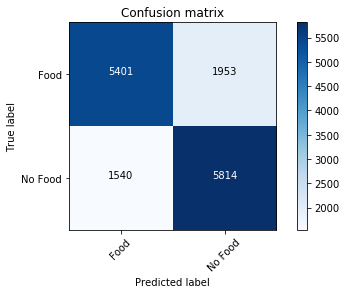



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.764142
Precision: 0.741635
Recall: 0.810715
F1 score: 0.774638
Cohens kappa: 0.528284
ROC AUC: 0.842013
F-measure = 0.7636
accuracy = 0.7641
Confusion matrix:
[[5277 2077]
 [1392 5962]]


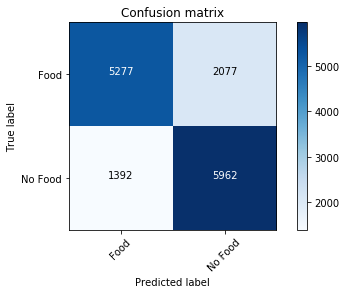



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.754487
Precision: 0.754245
Recall: 0.754963
F1 score: 0.754604
Cohens kappa: 0.508975
ROC AUC: 0.835681
F-measure = 0.7545
accuracy = 0.7545
Confusion matrix:
[[5545 1809]
 [1802 5552]]


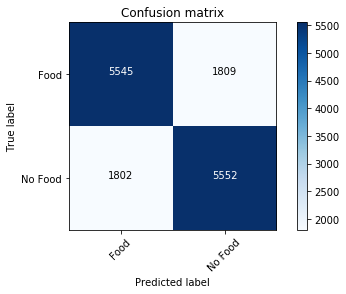



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.769989
Precision: 0.727356
Recall: 0.863748
F1 score: 0.789706
Cohens kappa: 0.539978
ROC AUC: 0.846749
F-measure = 0.7679
accuracy = 0.7700
Confusion matrix:
[[4973 2381]
 [1002 6352]]


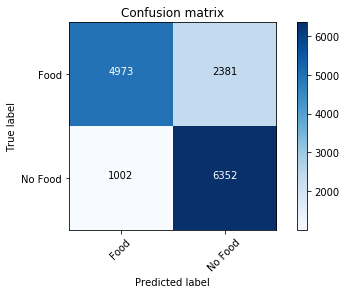



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.753807
Precision: 0.781311
Recall: 0.704922
F1 score: 0.741154
Cohens kappa: 0.507615
ROC AUC: 0.841894
F-measure = 0.7532
accuracy = 0.7538
Confusion matrix:
[[5903 1451]
 [2170 5184]]


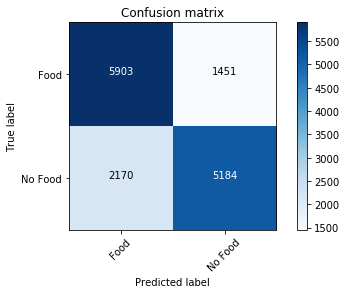



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.772097
Precision: 0.739354
Recall: 0.840495
F1 score: 0.786687
Cohens kappa: 0.544194
ROC AUC: 0.854066
F-measure = 0.7710
accuracy = 0.7721
Confusion matrix:
[[5175 2179]
 [1173 6181]]


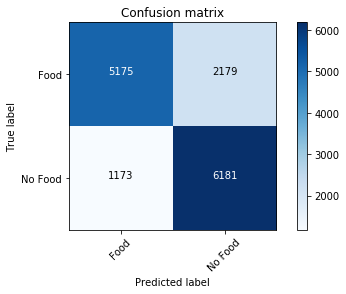



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.765298
Precision: 0.738625
Recall: 0.821186
F1 score: 0.777721
Cohens kappa: 0.530596
ROC AUC: 0.842665
F-measure = 0.7646
accuracy = 0.7653
Confusion matrix:
[[5217 2137]
 [1315 6039]]


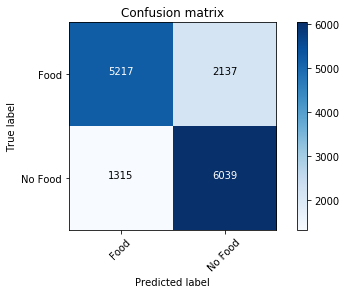



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.763802
Precision: 0.774943
Recall: 0.743541
F1 score: 0.758917
Cohens kappa: 0.527604
ROC AUC: 0.845293
F-measure = 0.7637
accuracy = 0.7638
Confusion matrix:
[[5766 1588]
 [1886 5468]]


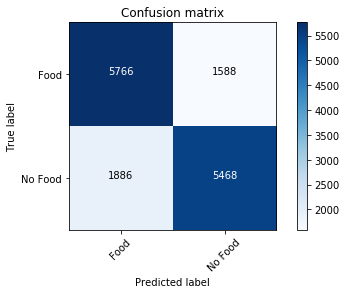



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.772641
Precision: 0.765282
Recall: 0.786511
F1 score: 0.775751
Cohens kappa: 0.545281
ROC AUC: 0.854696
F-measure = 0.7726
accuracy = 0.7726
Confusion matrix:
[[5580 1774]
 [1570 5784]]


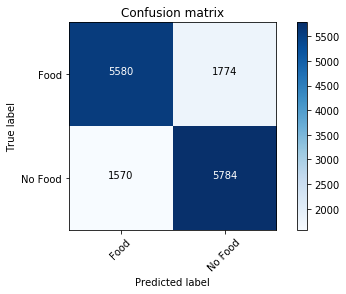



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.774748
Precision: 0.759404
Recall: 0.804324
F1 score: 0.781219
Cohens kappa: 0.549497
ROC AUC: 0.845024
F-measure = 0.7746
accuracy = 0.7747
Confusion matrix:
[[5480 1874]
 [1439 5915]]


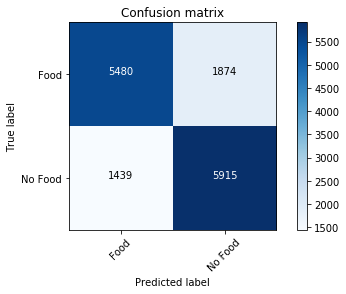



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.780460
Precision: 0.734455
Recall: 0.878569
F1 score: 0.800074
Cohens kappa: 0.560919
ROC AUC: 0.857664
F-measure = 0.7783
accuracy = 0.7805
Confusion matrix:
[[5018 2336]
 [ 893 6461]]


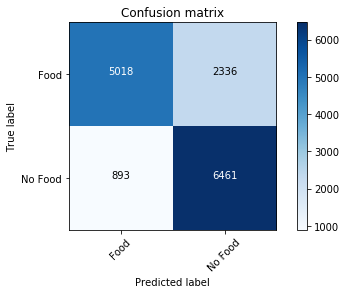



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.763190
Precision: 0.730061
Recall: 0.835192
F1 score: 0.779096
Cohens kappa: 0.526380
ROC AUC: 0.837143
F-measure = 0.7620
accuracy = 0.7632
Confusion matrix:
[[5083 2271]
 [1212 6142]]


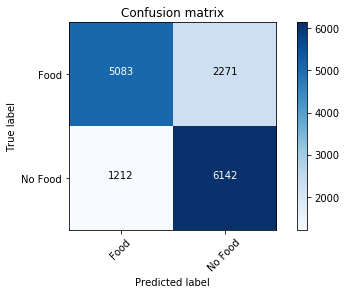



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.771281
Precision: 0.751007
Recall: 0.811667
F1 score: 0.780159
Cohens kappa: 0.542562
ROC AUC: 0.845281
F-measure = 0.7709
accuracy = 0.7713
Confusion matrix:
[[5375 1979]
 [1385 5969]]


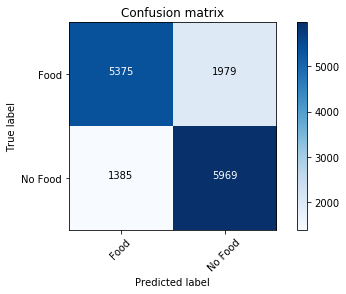



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.765842
Precision: 0.746222
Recall: 0.805684
F1 score: 0.774814
Cohens kappa: 0.531683
ROC AUC: 0.838173
F-measure = 0.7655
accuracy = 0.7658
Confusion matrix:
[[5339 2015]
 [1429 5925]]


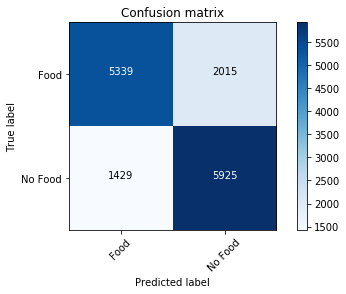



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.783519
Precision: 0.748629
Recall: 0.853685
F1 score: 0.797713
Cohens kappa: 0.567038
ROC AUC: 0.859018
F-measure = 0.7824
accuracy = 0.7835
Confusion matrix:
[[5246 2108]
 [1076 6278]]


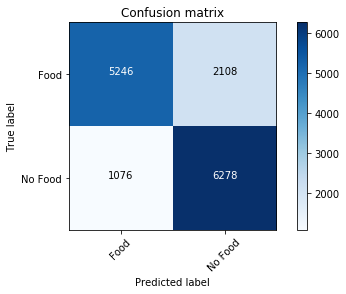



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.766522
Precision: 0.726328
Recall: 0.855317
F1 score: 0.785563
Cohens kappa: 0.533043
ROC AUC: 0.845393
F-measure = 0.7647
accuracy = 0.7665
Confusion matrix:
[[4984 2370]
 [1064 6290]]


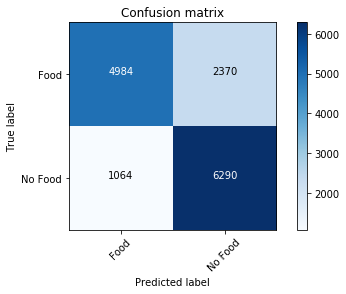



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.771349
Precision: 0.770064
Recall: 0.773729
F1 score: 0.771892
Cohens kappa: 0.542698
ROC AUC: 0.849227
F-measure = 0.7713
accuracy = 0.7713
Confusion matrix:
[[5655 1699]
 [1664 5690]]


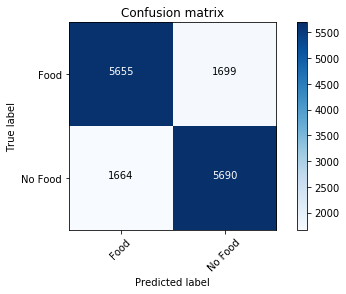



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.774408
Precision: 0.763172
Recall: 0.795757
F1 score: 0.779124
Cohens kappa: 0.548817
ROC AUC: 0.852322
F-measure = 0.7743
accuracy = 0.7744
Confusion matrix:
[[5538 1816]
 [1502 5852]]


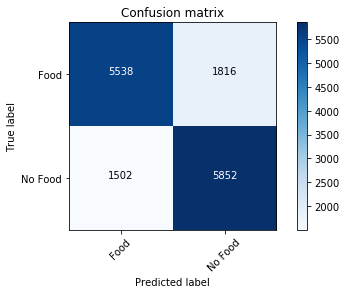



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.776924
Precision: 0.753643
Recall: 0.822818
F1 score: 0.786713
Cohens kappa: 0.553848
ROC AUC: 0.852434
F-measure = 0.7765
accuracy = 0.7769
Confusion matrix:
[[5376 1978]
 [1303 6051]]


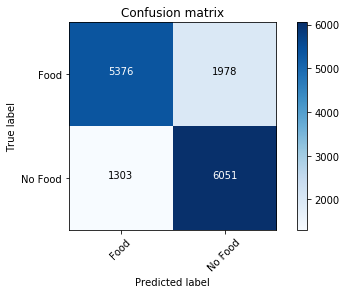



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.767949
Precision: 0.734165
Recall: 0.840087
F1 score: 0.783563
Cohens kappa: 0.535899
ROC AUC: 0.841806
F-measure = 0.7667
accuracy = 0.7679
Confusion matrix:
[[5117 2237]
 [1176 6178]]


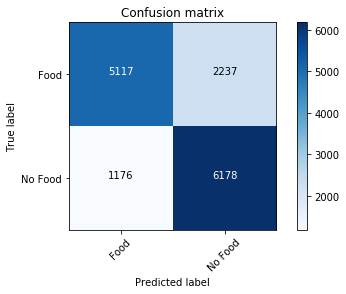



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.770873
Precision: 0.733968
Recall: 0.849742
F1 score: 0.787623
Cohens kappa: 0.541746
ROC AUC: 0.844222
F-measure = 0.7694
accuracy = 0.7709
Confusion matrix:
[[5089 2265]
 [1105 6249]]


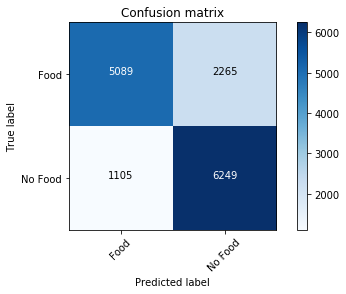



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.770805
Precision: 0.736548
Recall: 0.843215
F1 score: 0.786280
Cohens kappa: 0.541610
ROC AUC: 0.844562
F-measure = 0.7696
accuracy = 0.7708
Confusion matrix:
[[5136 2218]
 [1153 6201]]


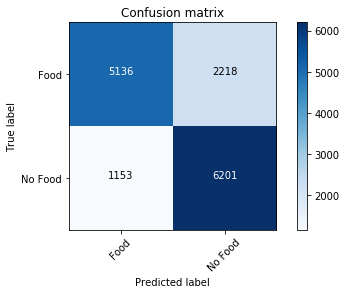



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.769921
Precision: 0.746829
Recall: 0.816698
F1 score: 0.780203
Cohens kappa: 0.539842
ROC AUC: 0.846431
F-measure = 0.7694
accuracy = 0.7699
Confusion matrix:
[[5318 2036]
 [1348 6006]]


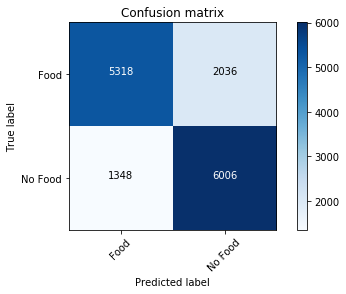



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.744561
Precision: 0.772707
Recall: 0.692956
F1 score: 0.730662
Cohens kappa: 0.489122
ROC AUC: 0.842529
F-measure = 0.7439
accuracy = 0.7446
Confusion matrix:
[[5855 1499]
 [2258 5096]]


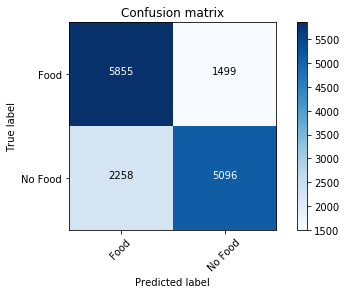



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.754147
Precision: 0.742224
Recall: 0.778760
F1 score: 0.760053
Cohens kappa: 0.508295
ROC AUC: 0.838431
F-measure = 0.7540
accuracy = 0.7541
Confusion matrix:
[[5365 1989]
 [1627 5727]]


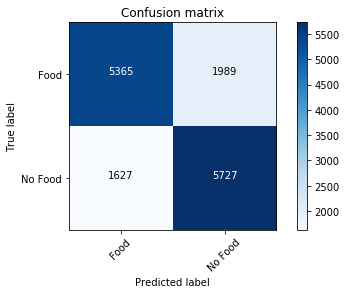



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.766930
Precision: 0.724138
Recall: 0.862388
F1 score: 0.787239
Cohens kappa: 0.533859
ROC AUC: 0.839550
F-measure = 0.7648
accuracy = 0.7669
Confusion matrix:
[[4938 2416]
 [1012 6342]]


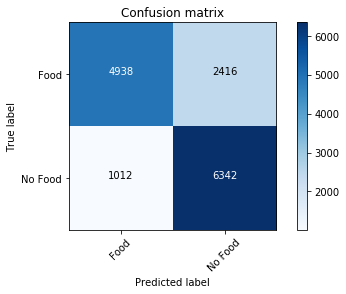



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.764074
Precision: 0.721892
Recall: 0.859124
F1 score: 0.784552
Cohens kappa: 0.528148
ROC AUC: 0.842079
F-measure = 0.7619
accuracy = 0.7641
Confusion matrix:
[[4920 2434]
 [1036 6318]]


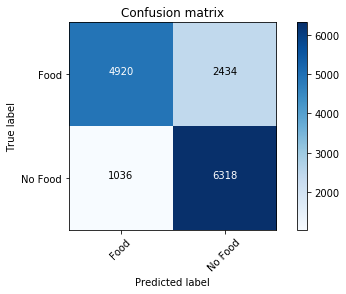



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.771077
Precision: 0.730489
Recall: 0.859124
F1 score: 0.789602
Cohens kappa: 0.542154
ROC AUC: 0.843446
F-measure = 0.7693
accuracy = 0.7711
Confusion matrix:
[[5023 2331]
 [1036 6318]]


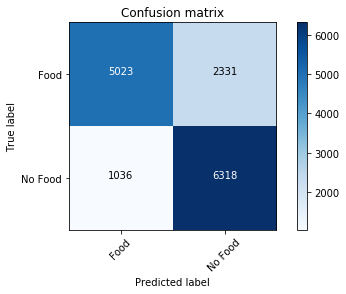



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.767202
Precision: 0.744586
Recall: 0.813435
F1 score: 0.777489
Cohens kappa: 0.534403
ROC AUC: 0.846831
F-measure = 0.7667
accuracy = 0.7672
Confusion matrix:
[[5302 2052]
 [1372 5982]]


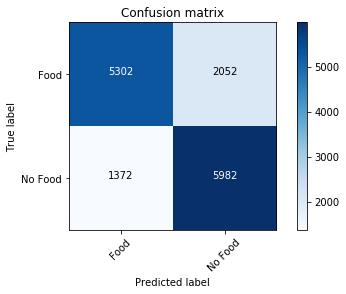



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.763054
Precision: 0.758658
Recall: 0.771553
F1 score: 0.765051
Cohens kappa: 0.526108
ROC AUC: 0.843835
F-measure = 0.7630
accuracy = 0.7631
Confusion matrix:
[[5549 1805]
 [1680 5674]]


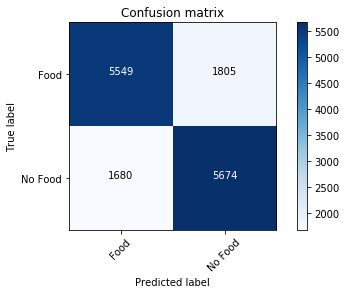



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.772709
Precision: 0.759813
Recall: 0.797525
F1 score: 0.778213
Cohens kappa: 0.545417
ROC AUC: 0.850152
F-measure = 0.7726
accuracy = 0.7727
Confusion matrix:
[[5500 1854]
 [1489 5865]]


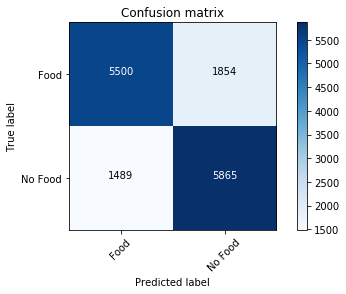



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.764006
Precision: 0.770141
Recall: 0.752652
F1 score: 0.761296
Cohens kappa: 0.528012
ROC AUC: 0.850744
F-measure = 0.7640
accuracy = 0.7640
Confusion matrix:
[[5702 1652]
 [1819 5535]]


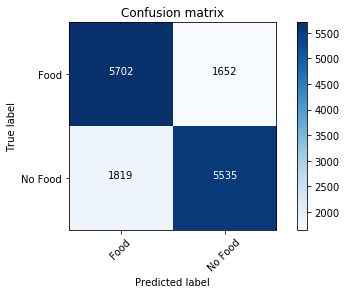



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.775700
Precision: 0.749846
Recall: 0.827441
F1 score: 0.786735
Cohens kappa: 0.551401
ROC AUC: 0.848211
F-measure = 0.7751
accuracy = 0.7757
Confusion matrix:
[[5324 2030]
 [1269 6085]]


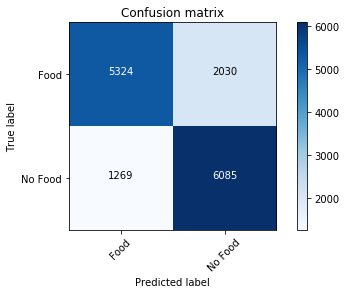



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.766454
Precision: 0.742903
Recall: 0.814931
F1 score: 0.777252
Cohens kappa: 0.532907
ROC AUC: 0.845466
F-measure = 0.7659
accuracy = 0.7665
Confusion matrix:
[[5280 2074]
 [1361 5993]]


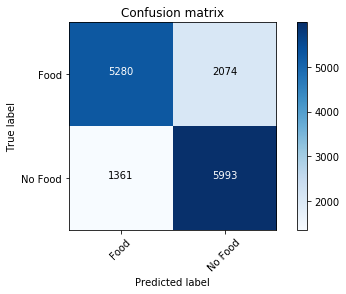



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.768085
Precision: 0.736306
Recall: 0.835328
F1 score: 0.782697
Cohens kappa: 0.536171
ROC AUC: 0.844751
F-measure = 0.7670
accuracy = 0.7681
Confusion matrix:
[[5154 2200]
 [1211 6143]]


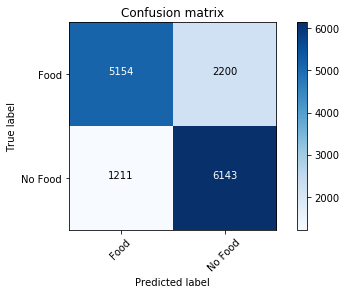



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.770669
Precision: 0.748223
Recall: 0.815883
F1 score: 0.780589
Cohens kappa: 0.541338
ROC AUC: 0.848952
F-measure = 0.7702
accuracy = 0.7707
Confusion matrix:
[[5335 2019]
 [1354 6000]]


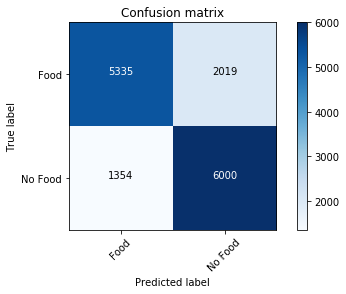



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.772369
Precision: 0.759792
Recall: 0.796573
F1 score: 0.777748
Cohens kappa: 0.544738
ROC AUC: 0.852114
F-measure = 0.7722
accuracy = 0.7724
Confusion matrix:
[[5502 1852]
 [1496 5858]]


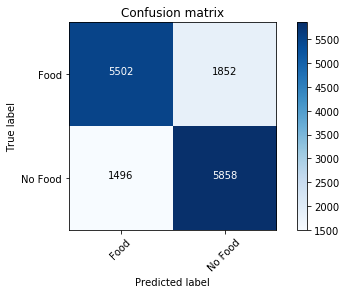



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.767949
Precision: 0.769452
Recall: 0.765162
F1 score: 0.767301
Cohens kappa: 0.535899
ROC AUC: 0.850573
F-measure = 0.7679
accuracy = 0.7679
Confusion matrix:
[[5668 1686]
 [1727 5627]]


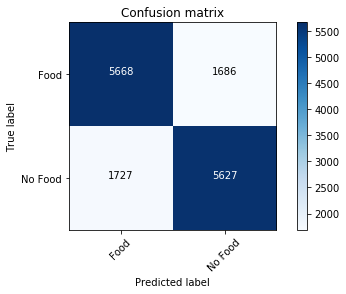



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.764618
Precision: 0.735650
Recall: 0.826081
F1 score: 0.778248
Cohens kappa: 0.529236
ROC AUC: 0.840536
F-measure = 0.7637
accuracy = 0.7646
Confusion matrix:
[[5171 2183]
 [1279 6075]]


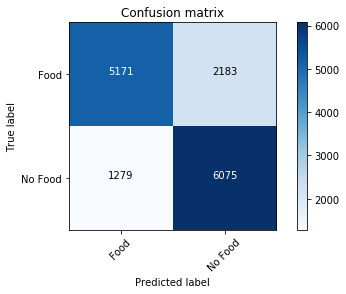



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.758567
Precision: 0.737065
Recall: 0.803916
F1 score: 0.769041
Cohens kappa: 0.517134
ROC AUC: 0.838241
F-measure = 0.7581
accuracy = 0.7586
Confusion matrix:
[[5245 2109]
 [1442 5912]]


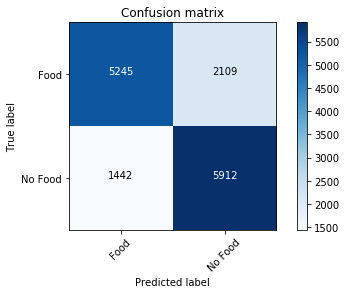



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.775768
Precision: 0.755931
Recall: 0.814523
F1 score: 0.784134
Cohens kappa: 0.551537
ROC AUC: 0.852557
F-measure = 0.7754
accuracy = 0.7758
Confusion matrix:
[[5420 1934]
 [1364 5990]]


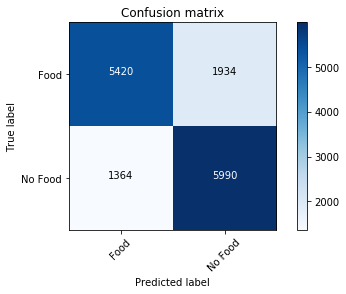



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.778420
Precision: 0.765737
Recall: 0.802284
F1 score: 0.783585
Cohens kappa: 0.556840
ROC AUC: 0.859986
F-measure = 0.7783
accuracy = 0.7784
Confusion matrix:
[[5549 1805]
 [1454 5900]]


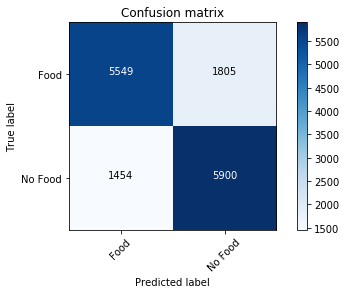



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.761694
Precision: 0.775993
Recall: 0.735790
F1 score: 0.755357
Cohens kappa: 0.523389
ROC AUC: 0.851968
F-measure = 0.7615
accuracy = 0.7617
Confusion matrix:
[[5792 1562]
 [1943 5411]]


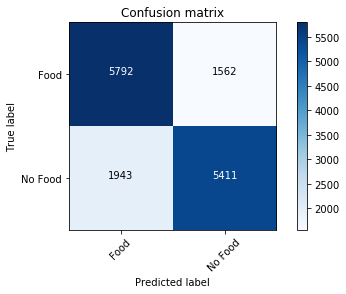



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.278692
Precision: 0.255667
Recall: 0.231575
F1 score: 0.243025
Cohens kappa: -0.442616
ROC AUC: 0.206166
F-measure = 0.2771
accuracy = 0.2787
Confusion matrix:
[[2396 4958]
 [5651 1703]]


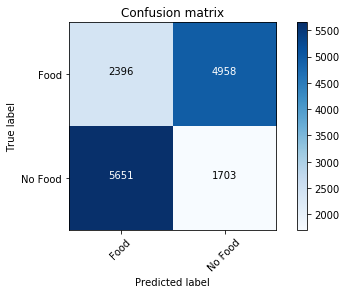



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.245513
Precision: 0.214841
Recall: 0.191732
F1 score: 0.202630
Cohens kappa: -0.508975
ROC AUC: 0.169116
F-measure = 0.2433
accuracy = 0.2455
Confusion matrix:
[[2201 5153]
 [5944 1410]]


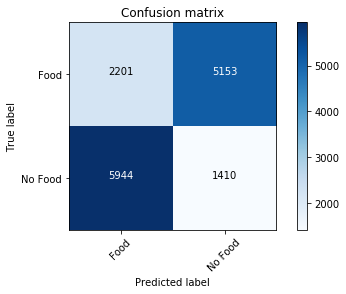



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.292562
Precision: 0.331864
Recall: 0.409437
F1 score: 0.366592
Cohens kappa: -0.414876
ROC AUC: 0.185006
F-measure = 0.2828
accuracy = 0.2926
Confusion matrix:
[[1292 6062]
 [4343 3011]]


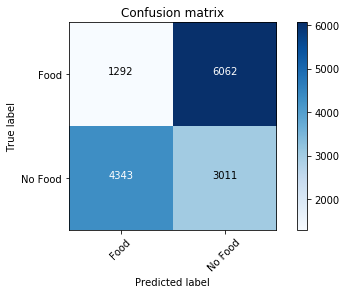



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.231779
Precision: 0.218817
Recall: 0.208730
F1 score: 0.213654
Cohens kappa: -0.536443
ROC AUC: 0.152018
F-measure = 0.2314
accuracy = 0.2318
Confusion matrix:
[[1874 5480]
 [5819 1535]]


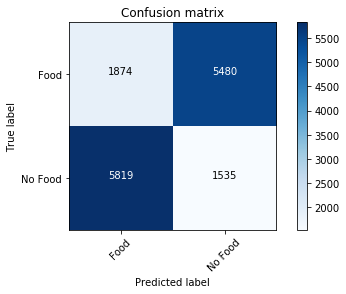



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.228039
Precision: 0.173309
Recall: 0.144275
F1 score: 0.157465
Cohens kappa: -0.543922
ROC AUC: 0.159243
F-measure = 0.2226
accuracy = 0.2280
Confusion matrix:
[[2293 5061]
 [6293 1061]]


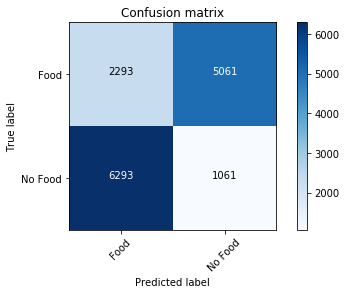



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.241229
Precision: 0.249869
Recall: 0.258499
F1 score: 0.254110
Cohens kappa: -0.517541
ROC AUC: 0.151782
F-measure = 0.2410
accuracy = 0.2412
Confusion matrix:
[[1647 5707]
 [5453 1901]]


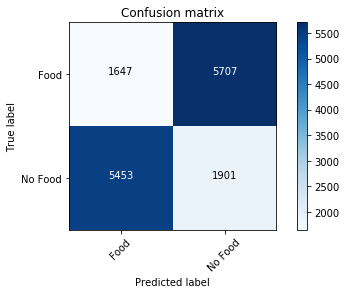



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.411613
Precision: 0.449977
Recall: 0.795078
F1 score: 0.574700
Cohens kappa: -0.176775
ROC AUC: 0.186727
F-measure = 0.3102
accuracy = 0.4116
Confusion matrix:
[[ 207 7147]
 [1507 5847]]


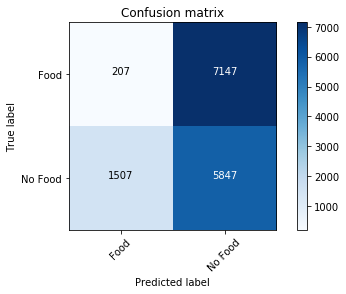



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.244833
Precision: 0.268133
Recall: 0.295078
F1 score: 0.280961
Cohens kappa: -0.510335
ROC AUC: 0.149522
F-measure = 0.2429
accuracy = 0.2448
Confusion matrix:
[[1431 5923]
 [5184 2170]]


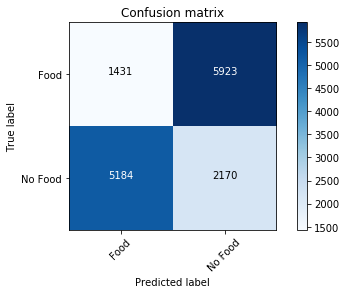



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.259111
Precision: 0.289733
Recall: 0.331928
F1 score: 0.309399
Cohens kappa: -0.481779
ROC AUC: 0.158040
F-measure = 0.2552
accuracy = 0.2591
Confusion matrix:
[[1370 5984]
 [4913 2441]]


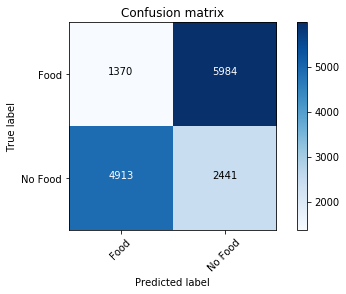



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.757139
Precision: 0.767317
Recall: 0.738102
F1 score: 0.752426
Cohens kappa: 0.514278
ROC AUC: 0.840730
F-measure = 0.7571
accuracy = 0.7571
Confusion matrix:
[[5708 1646]
 [1926 5428]]


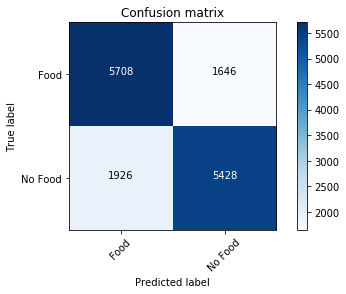



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.777536
Precision: 0.728045
Recall: 0.886048
F1 score: 0.799313
Cohens kappa: 0.555072
ROC AUC: 0.853859
F-measure = 0.7749
accuracy = 0.7775
Confusion matrix:
[[4920 2434]
 [ 838 6516]]


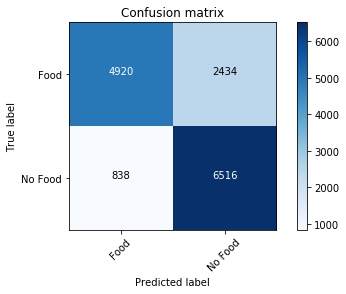



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.760878
Precision: 0.777120
Recall: 0.731575
F1 score: 0.753660
Cohens kappa: 0.521757
ROC AUC: 0.846062
F-measure = 0.7607
accuracy = 0.7609
Confusion matrix:
[[5811 1543]
 [1974 5380]]


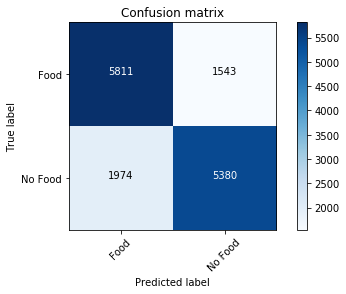



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.770465
Precision: 0.751836
Recall: 0.807452
F1 score: 0.778652
Cohens kappa: 0.540930
ROC AUC: 0.852426
F-measure = 0.7702
accuracy = 0.7705
Confusion matrix:
[[5394 1960]
 [1416 5938]]


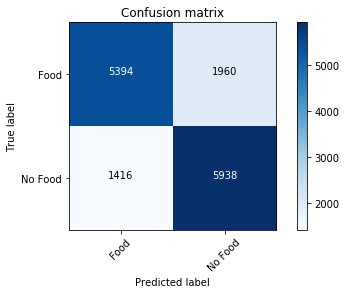



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.650530
Precision: 0.661182
Recall: 0.617487
F1 score: 0.638588
Cohens kappa: 0.301061
ROC AUC: 0.703017
F-measure = 0.6501
accuracy = 0.6505
Confusion matrix:
[[5027 2327]
 [2813 4541]]


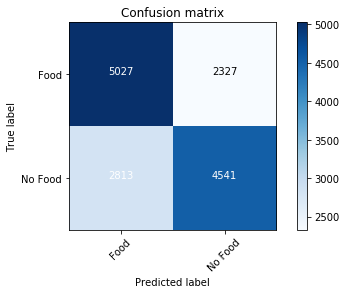



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.689421
Precision: 0.779831
Recall: 0.527876
F1 score: 0.629582
Cohens kappa: 0.378841
ROC AUC: 0.746572
F-measure = 0.6811
accuracy = 0.6894
Confusion matrix:
[[6258 1096]
 [3472 3882]]


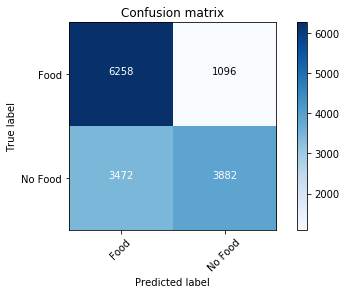



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.345322
Precision: 0.355629
Recall: 0.381017
F1 score: 0.367886
Cohens kappa: -0.309355
ROC AUC: 0.280147
F-measure = 0.3445
accuracy = 0.3453
Confusion matrix:
[[2277 5077]
 [4552 2802]]


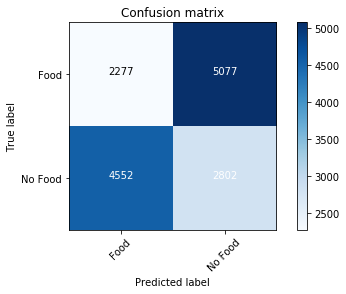



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.311667
Precision: 0.239466
Recall: 0.173103
F1 score: 0.200947
Cohens kappa: -0.376666
ROC AUC: 0.262553
F-measure = 0.2982
accuracy = 0.3117
Confusion matrix:
[[3311 4043]
 [6081 1273]]


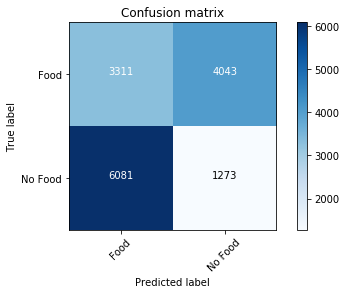



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.337027
Precision: 0.334530
Recall: 0.329481
F1 score: 0.331986
Cohens kappa: -0.325945
ROC AUC: 0.280519
F-measure = 0.3370
accuracy = 0.3370
Confusion matrix:
[[2534 4820]
 [4931 2423]]


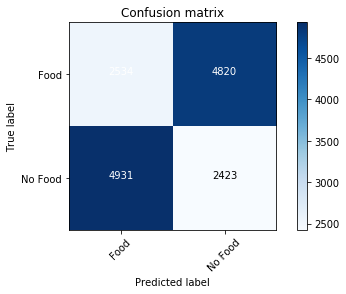



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.338591
Precision: 0.332628
Recall: 0.320778
F1 score: 0.326596
Cohens kappa: -0.322818
ROC AUC: 0.291419
F-measure = 0.3384
accuracy = 0.3386
Confusion matrix:
[[2621 4733]
 [4995 2359]]


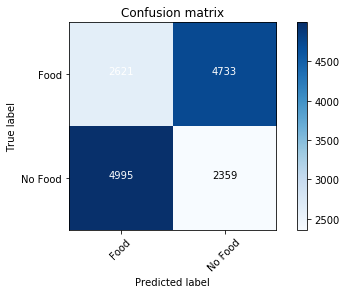



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.345118
Precision: 0.341893
Recall: 0.334920
F1 score: 0.338371
Cohens kappa: -0.309763
ROC AUC: 0.293118
F-measure = 0.3451
accuracy = 0.3451
Confusion matrix:
[[2613 4741]
 [4891 2463]]


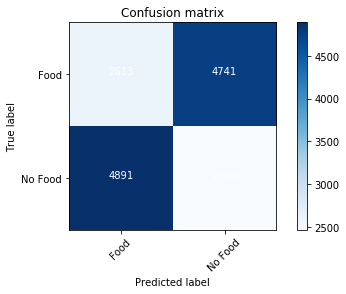



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.296777
Precision: 0.232120
Recall: 0.176095
F1 score: 0.200263
Cohens kappa: -0.406445
ROC AUC: 0.231508
F-measure = 0.2864
accuracy = 0.2968
Confusion matrix:
[[3070 4284]
 [6059 1295]]


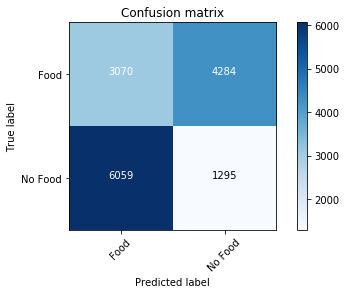



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.349470
Precision: 0.338818
Recall: 0.316426
F1 score: 0.327239
Cohens kappa: -0.301061
ROC AUC: 0.296983
F-measure = 0.3488
accuracy = 0.3495
Confusion matrix:
[[2813 4541]
 [5027 2327]]


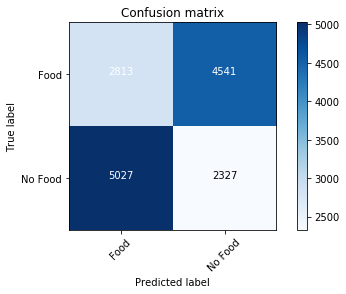



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.310579
Precision: 0.220169
Recall: 0.149035
F1 score: 0.177749
Cohens kappa: -0.378841
ROC AUC: 0.253428
F-measure = 0.2921
accuracy = 0.3106
Confusion matrix:
[[3472 3882]
 [6258 1096]]


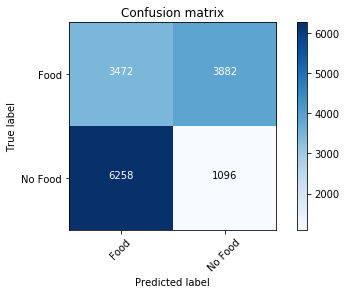



##################################################################################################




In [42]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [43]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [44]:
gc.collect()

44098

### Test Trial 5

In [45]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(TSFD2, TSNFD2, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
9192 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
9192 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 9192 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
18384 validation images will be loaded: 9192 for food, 9192 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non imag

In [46]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.767026
Precision: 0.764979
Recall: 0.770888
F1 score: 0.767922
Cohens kappa: 0.534051
ROC AUC: 0.848822
F-measure = 0.7670
accuracy = 0.7670
Confusion matrix:
[[7015 2177]
 [2106 7086]]


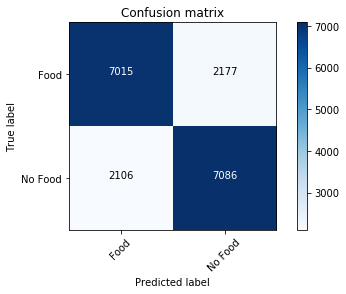



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.756527
Precision: 0.779649
Recall: 0.715187
F1 score: 0.746028
Cohens kappa: 0.513055
ROC AUC: 0.843691
F-measure = 0.7561
accuracy = 0.7565
Confusion matrix:
[[7334 1858]
 [2618 6574]]


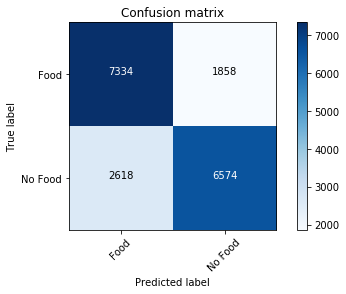



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.782093
Precision: 0.754365
Recall: 0.836597
F1 score: 0.793356
Cohens kappa: 0.564186
ROC AUC: 0.857441
F-measure = 0.7814
accuracy = 0.7821
Confusion matrix:
[[6688 2504]
 [1502 7690]]


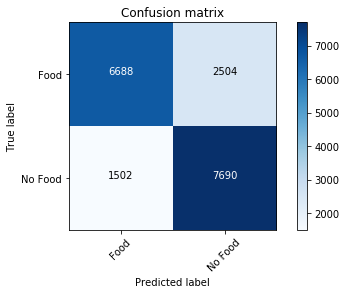



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.769147
Precision: 0.736837
Recall: 0.837359
F1 score: 0.783888
Cohens kappa: 0.538294
ROC AUC: 0.845468
F-measure = 0.7681
accuracy = 0.7691
Confusion matrix:
[[6443 2749]
 [1495 7697]]


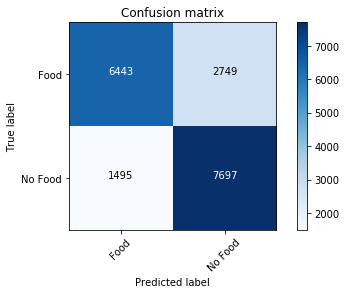



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.770181
Precision: 0.745915
Recall: 0.819517
F1 score: 0.780986
Cohens kappa: 0.540361
ROC AUC: 0.843077
F-measure = 0.7696
accuracy = 0.7702
Confusion matrix:
[[6626 2566]
 [1659 7533]]


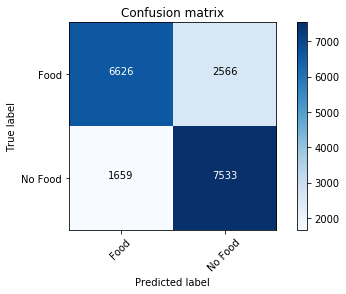



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.772737
Precision: 0.741522
Recall: 0.837359
F1 score: 0.786532
Cohens kappa: 0.545474
ROC AUC: 0.844247
F-measure = 0.7718
accuracy = 0.7727
Confusion matrix:
[[6509 2683]
 [1495 7697]]


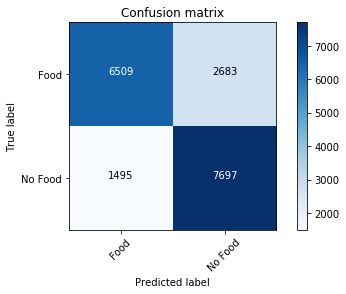



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.769310
Precision: 0.731377
Recall: 0.851284
F1 score: 0.786788
Cohens kappa: 0.538621
ROC AUC: 0.843882
F-measure = 0.7677
accuracy = 0.7693
Confusion matrix:
[[6318 2874]
 [1367 7825]]


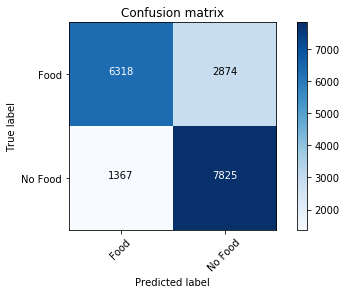



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.756963
Precision: 0.772183
Recall: 0.729003
F1 score: 0.749972
Cohens kappa: 0.513925
ROC AUC: 0.838588
F-measure = 0.7568
accuracy = 0.7570
Confusion matrix:
[[7215 1977]
 [2491 6701]]


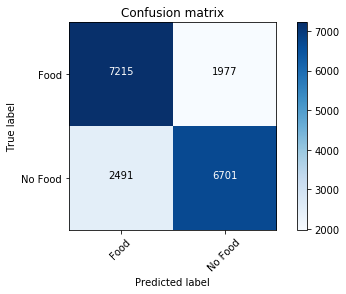



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.771160
Precision: 0.736997
Recall: 0.843233
F1 score: 0.786544
Cohens kappa: 0.542319
ROC AUC: 0.846613
F-measure = 0.7700
accuracy = 0.7712
Confusion matrix:
[[6426 2766]
 [1441 7751]]


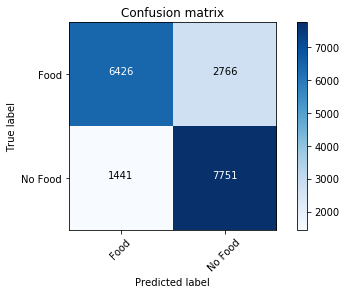



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.761695
Precision: 0.731721
Recall: 0.826371
F1 score: 0.776171
Cohens kappa: 0.523390
ROC AUC: 0.841219
F-measure = 0.7607
accuracy = 0.7617
Confusion matrix:
[[6407 2785]
 [1596 7596]]


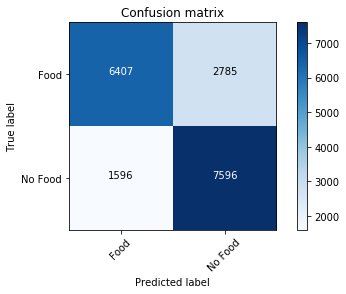



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.773227
Precision: 0.743953
Recall: 0.833225
F1 score: 0.786063
Cohens kappa: 0.546453
ROC AUC: 0.848522
F-measure = 0.7724
accuracy = 0.7732
Confusion matrix:
[[6556 2636]
 [1533 7659]]


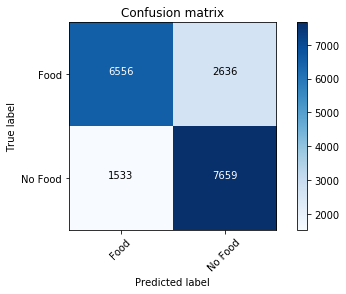



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.773825
Precision: 0.743706
Recall: 0.835618
F1 score: 0.786988
Cohens kappa: 0.547650
ROC AUC: 0.849224
F-measure = 0.7730
accuracy = 0.7738
Confusion matrix:
[[6545 2647]
 [1511 7681]]


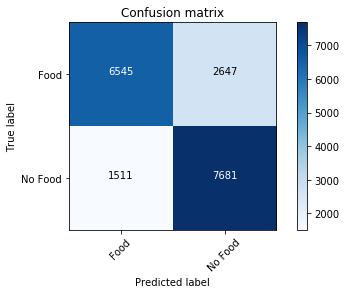



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.764959
Precision: 0.749820
Recall: 0.795257
F1 score: 0.771871
Cohens kappa: 0.529917
ROC AUC: 0.839229
F-measure = 0.7647
accuracy = 0.7650
Confusion matrix:
[[6753 2439]
 [1882 7310]]


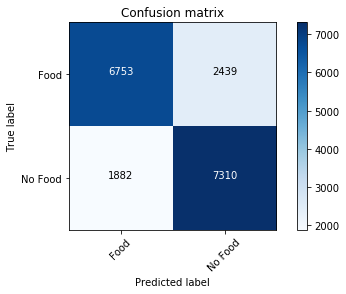



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.762511
Precision: 0.749483
Recall: 0.788621
F1 score: 0.768554
Cohens kappa: 0.525022
ROC AUC: 0.843379
F-measure = 0.7623
accuracy = 0.7625
Confusion matrix:
[[6769 2423]
 [1943 7249]]


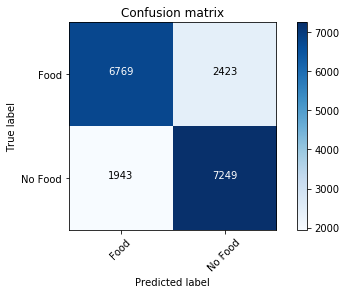



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.766591
Precision: 0.744781
Recall: 0.811140
F1 score: 0.776545
Cohens kappa: 0.533181
ROC AUC: 0.841218
F-measure = 0.7661
accuracy = 0.7666
Confusion matrix:
[[6637 2555]
 [1736 7456]]


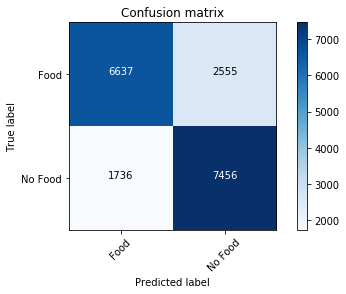



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.750762
Precision: 0.750000
Recall: 0.752285
F1 score: 0.751141
Cohens kappa: 0.501523
ROC AUC: 0.831785
F-measure = 0.7508
accuracy = 0.7508
Confusion matrix:
[[6887 2305]
 [2277 6915]]


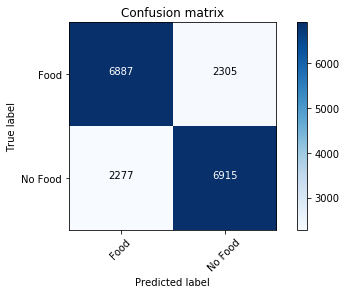



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.769800
Precision: 0.727106
Recall: 0.863795
F1 score: 0.789578
Cohens kappa: 0.539600
ROC AUC: 0.847331
F-measure = 0.7677
accuracy = 0.7698
Confusion matrix:
[[6212 2980]
 [1252 7940]]


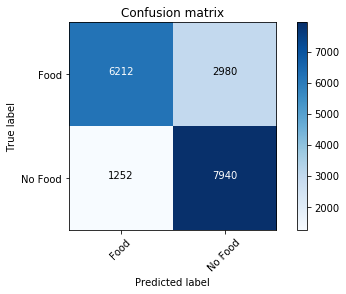



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.745268
Precision: 0.772315
Recall: 0.695605
F1 score: 0.731956
Cohens kappa: 0.490535
ROC AUC: 0.837158
F-measure = 0.7446
accuracy = 0.7453
Confusion matrix:
[[7307 1885]
 [2798 6394]]


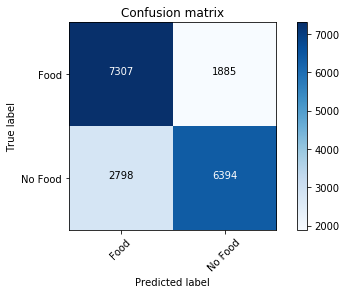



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.775294
Precision: 0.741483
Recall: 0.845300
F1 score: 0.789995
Cohens kappa: 0.550587
ROC AUC: 0.851539
F-measure = 0.7742
accuracy = 0.7753
Confusion matrix:
[[6483 2709]
 [1422 7770]]


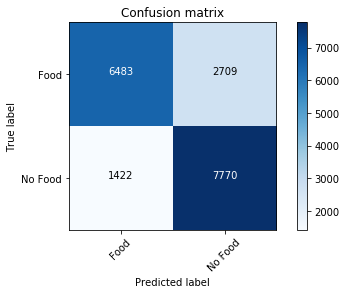



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.764252
Precision: 0.739216
Recall: 0.816580
F1 score: 0.775974
Cohens kappa: 0.528503
ROC AUC: 0.842736
F-measure = 0.7636
accuracy = 0.7643
Confusion matrix:
[[6544 2648]
 [1686 7506]]


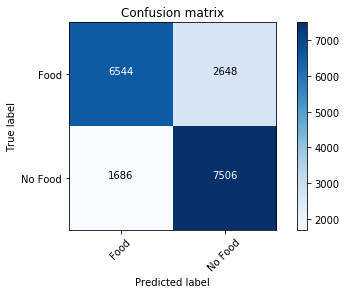



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.757235
Precision: 0.765465
Recall: 0.741732
F1 score: 0.753412
Cohens kappa: 0.514469
ROC AUC: 0.839361
F-measure = 0.7572
accuracy = 0.7572
Confusion matrix:
[[7103 2089]
 [2374 6818]]


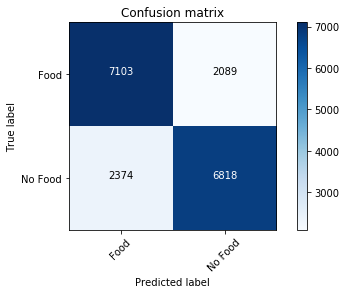



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.768494
Precision: 0.759135
Recall: 0.786554
F1 score: 0.772601
Cohens kappa: 0.536989
ROC AUC: 0.847429
F-measure = 0.7684
accuracy = 0.7685
Confusion matrix:
[[6898 2294]
 [1962 7230]]


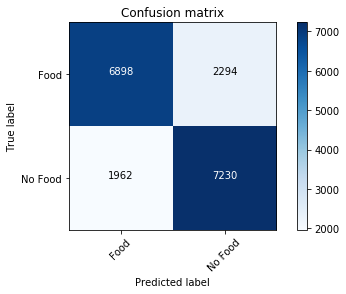



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.772520
Precision: 0.757398
Recall: 0.801893
F1 score: 0.779011
Cohens kappa: 0.545039
ROC AUC: 0.844742
F-measure = 0.7723
accuracy = 0.7725
Confusion matrix:
[[6831 2361]
 [1821 7371]]


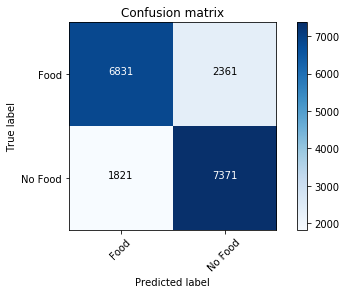



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.780352
Precision: 0.735085
Recall: 0.876632
F1 score: 0.799643
Cohens kappa: 0.560705
ROC AUC: 0.855393
F-measure = 0.7783
accuracy = 0.7804
Confusion matrix:
[[6288 2904]
 [1134 8058]]


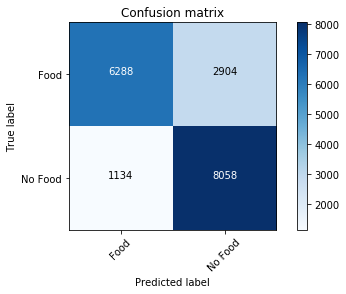



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.771160
Precision: 0.739456
Recall: 0.837359
F1 score: 0.785368
Cohens kappa: 0.542319
ROC AUC: 0.837350
F-measure = 0.7702
accuracy = 0.7712
Confusion matrix:
[[6480 2712]
 [1495 7697]]


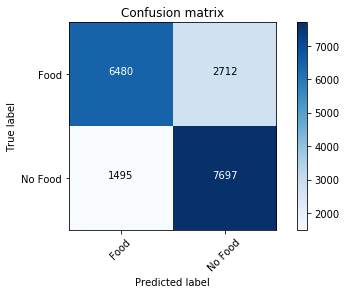



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.770235
Precision: 0.750656
Recall: 0.809291
F1 score: 0.778871
Cohens kappa: 0.540470
ROC AUC: 0.842385
F-measure = 0.7699
accuracy = 0.7702
Confusion matrix:
[[6721 2471]
 [1753 7439]]


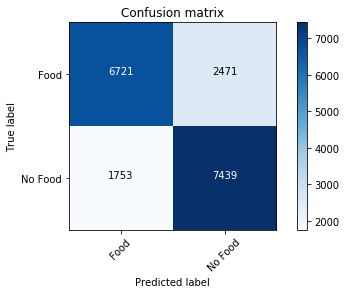



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.768331
Precision: 0.748164
Recall: 0.808964
F1 score: 0.777377
Cohens kappa: 0.536662
ROC AUC: 0.838286
F-measure = 0.7679
accuracy = 0.7683
Confusion matrix:
[[6689 2503]
 [1756 7436]]


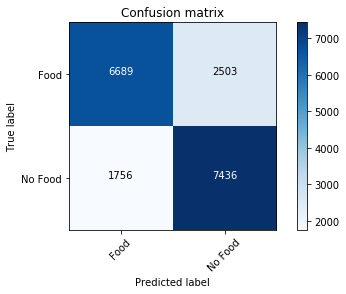



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.779972
Precision: 0.746386
Recall: 0.848129
F1 score: 0.794011
Cohens kappa: 0.559943
ROC AUC: 0.856437
F-measure = 0.7789
accuracy = 0.7800
Confusion matrix:
[[6543 2649]
 [1396 7796]]


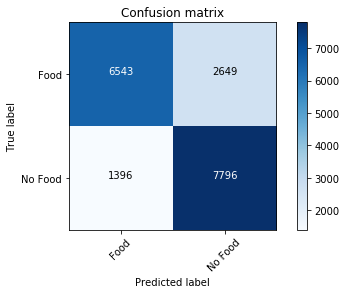



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.771486
Precision: 0.732291
Recall: 0.855853
F1 score: 0.789265
Cohens kappa: 0.542972
ROC AUC: 0.847214
F-measure = 0.7698
accuracy = 0.7715
Confusion matrix:
[[6316 2876]
 [1325 7867]]


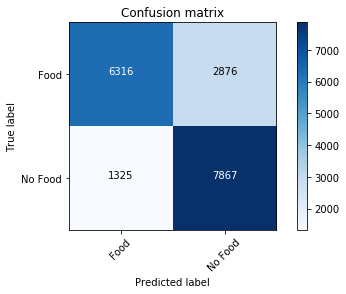



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.760879
Precision: 0.759692
Recall: 0.763164
F1 score: 0.761424
Cohens kappa: 0.521758
ROC AUC: 0.845748
F-measure = 0.7609
accuracy = 0.7609
Confusion matrix:
[[6973 2219]
 [2177 7015]]


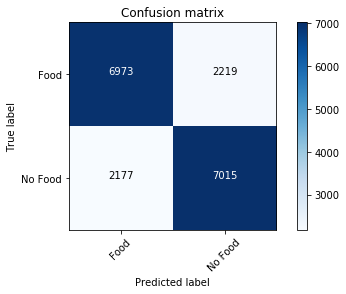



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.768658
Precision: 0.757965
Recall: 0.789382
F1 score: 0.773355
Cohens kappa: 0.537315
ROC AUC: 0.850891
F-measure = 0.7686
accuracy = 0.7687
Confusion matrix:
[[6875 2317]
 [1936 7256]]


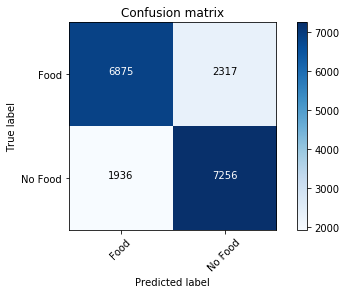



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.778122
Precision: 0.755932
Recall: 0.821475
F1 score: 0.787342
Cohens kappa: 0.556245
ROC AUC: 0.852891
F-measure = 0.7777
accuracy = 0.7781
Confusion matrix:
[[6754 2438]
 [1641 7551]]


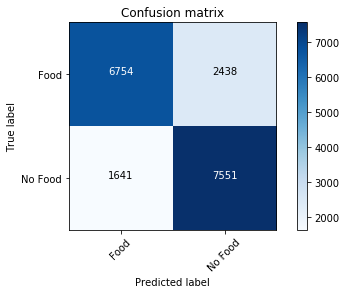



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.770017
Precision: 0.737557
Recall: 0.838338
F1 score: 0.784725
Cohens kappa: 0.540035
ROC AUC: 0.843707
F-measure = 0.7689
accuracy = 0.7700
Confusion matrix:
[[6450 2742]
 [1486 7706]]


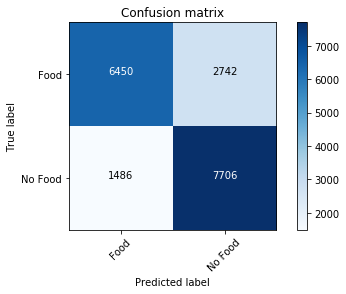



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.775566
Precision: 0.740459
Recall: 0.848564
F1 score: 0.790834
Cohens kappa: 0.551131
ROC AUC: 0.846786
F-measure = 0.7744
accuracy = 0.7756
Confusion matrix:
[[6458 2734]
 [1392 7800]]


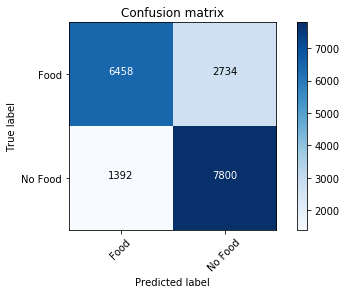



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.770888
Precision: 0.737324
Recall: 0.841601
F1 score: 0.786019
Cohens kappa: 0.541775
ROC AUC: 0.844933
F-measure = 0.7697
accuracy = 0.7709
Confusion matrix:
[[6436 2756]
 [1456 7736]]


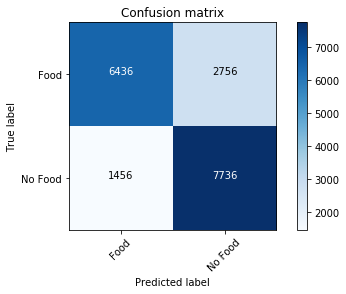



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.774097
Precision: 0.748692
Recall: 0.825174
F1 score: 0.785075
Cohens kappa: 0.548194
ROC AUC: 0.848125
F-measure = 0.7735
accuracy = 0.7741
Confusion matrix:
[[6646 2546]
 [1607 7585]]


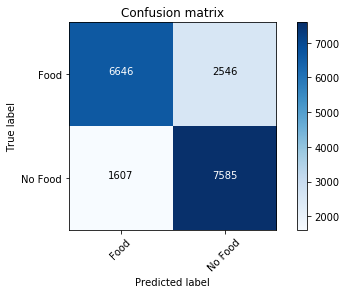



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.745866
Precision: 0.771439
Recall: 0.698760
F1 score: 0.733303
Cohens kappa: 0.491732
ROC AUC: 0.841709
F-measure = 0.7453
accuracy = 0.7459
Confusion matrix:
[[7289 1903]
 [2769 6423]]


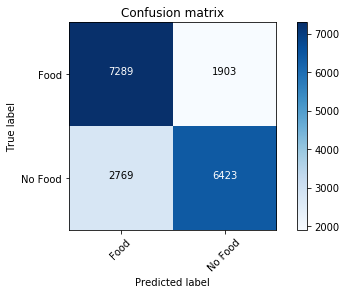



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.757615
Precision: 0.746615
Recall: 0.779917
F1 score: 0.762903
Cohens kappa: 0.515231
ROC AUC: 0.839428
F-measure = 0.7575
accuracy = 0.7576
Confusion matrix:
[[6759 2433]
 [2023 7169]]


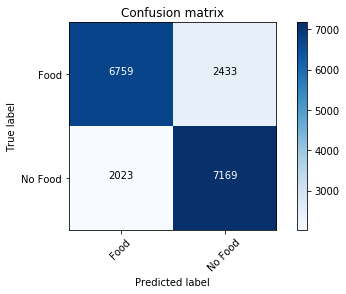



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.770017
Precision: 0.728167
Recall: 0.861728
F1 score: 0.789337
Cohens kappa: 0.540035
ROC AUC: 0.843212
F-measure = 0.7681
accuracy = 0.7700
Confusion matrix:
[[6235 2957]
 [1271 7921]]


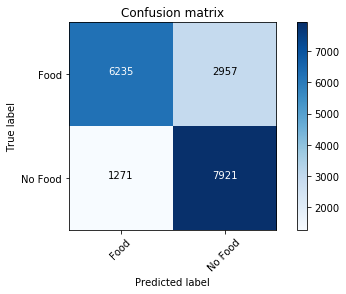



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.764523
Precision: 0.722849
Recall: 0.858029
F1 score: 0.784659
Cohens kappa: 0.529047
ROC AUC: 0.839823
F-measure = 0.7624
accuracy = 0.7645
Confusion matrix:
[[6168 3024]
 [1305 7887]]


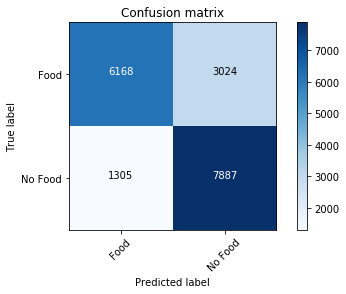



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.770561
Precision: 0.730278
Recall: 0.858029
F1 score: 0.789016
Cohens kappa: 0.541123
ROC AUC: 0.843201
F-measure = 0.7688
accuracy = 0.7706
Confusion matrix:
[[6279 2913]
 [1305 7887]]


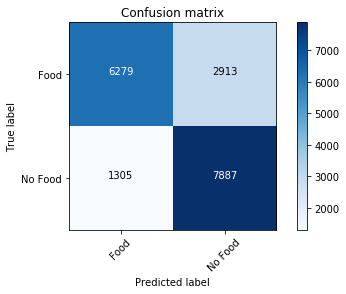



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.767624
Precision: 0.746049
Recall: 0.811466
F1 score: 0.777384
Cohens kappa: 0.535248
ROC AUC: 0.847418
F-measure = 0.7672
accuracy = 0.7676
Confusion matrix:
[[6653 2539]
 [1733 7459]]


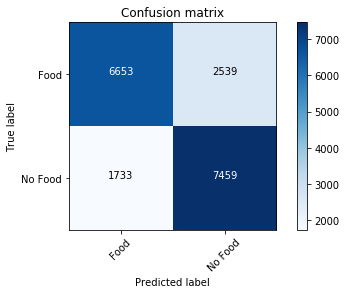



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.763164
Precision: 0.761006
Recall: 0.767298
F1 score: 0.764139
Cohens kappa: 0.526327
ROC AUC: 0.845543
F-measure = 0.7632
accuracy = 0.7632
Confusion matrix:
[[6977 2215]
 [2139 7053]]


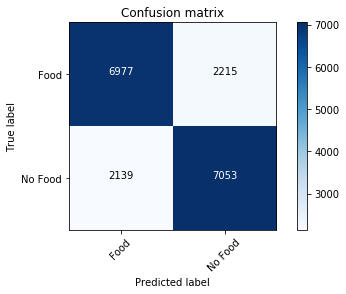



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.771704
Precision: 0.760292
Recall: 0.793625
F1 score: 0.776601
Cohens kappa: 0.543407
ROC AUC: 0.848778
F-measure = 0.7716
accuracy = 0.7717
Confusion matrix:
[[6892 2300]
 [1897 7295]]


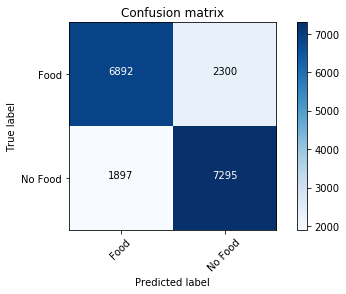



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.761967
Precision: 0.768271
Recall: 0.750218
F1 score: 0.759137
Cohens kappa: 0.523934
ROC AUC: 0.848768
F-measure = 0.7619
accuracy = 0.7620
Confusion matrix:
[[7112 2080]
 [2296 6896]]


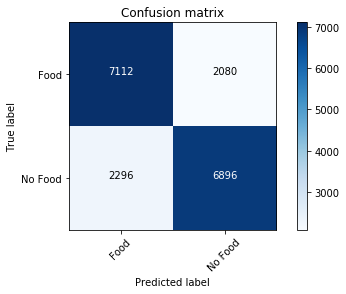



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.770235
Precision: 0.747312
Recall: 0.816580
F1 score: 0.780412
Cohens kappa: 0.540470
ROC AUC: 0.847000
F-measure = 0.7697
accuracy = 0.7702
Confusion matrix:
[[6654 2538]
 [1686 7506]]


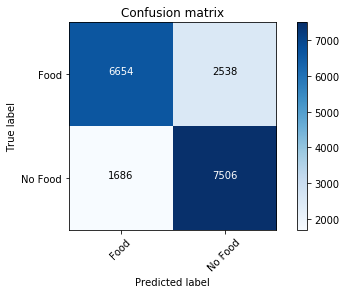



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.769473
Precision: 0.745005
Recall: 0.819408
F1 score: 0.780437
Cohens kappa: 0.538947
ROC AUC: 0.845308
F-measure = 0.7689
accuracy = 0.7695
Confusion matrix:
[[6614 2578]
 [1660 7532]]


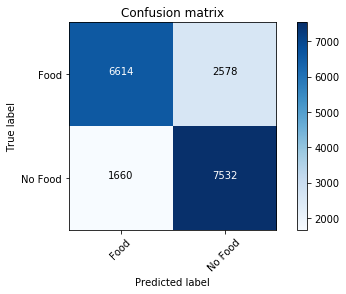



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.771105
Precision: 0.740448
Recall: 0.834856
F1 score: 0.784823
Cohens kappa: 0.542211
ROC AUC: 0.846227
F-measure = 0.7702
accuracy = 0.7711
Confusion matrix:
[[6502 2690]
 [1518 7674]]


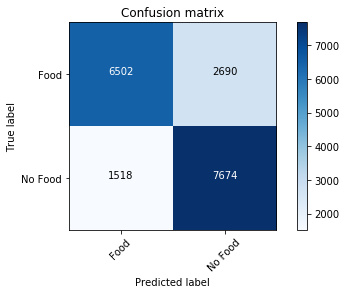



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.770779
Precision: 0.747465
Recall: 0.817885
F1 score: 0.781091
Cohens kappa: 0.541558
ROC AUC: 0.846781
F-measure = 0.7703
accuracy = 0.7708
Confusion matrix:
[[6652 2540]
 [1674 7518]]


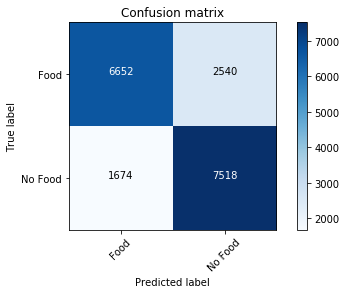



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.770670
Precision: 0.760033
Recall: 0.791123
F1 score: 0.775267
Cohens kappa: 0.541340
ROC AUC: 0.850247
F-measure = 0.7706
accuracy = 0.7707
Confusion matrix:
[[6896 2296]
 [1920 7272]]


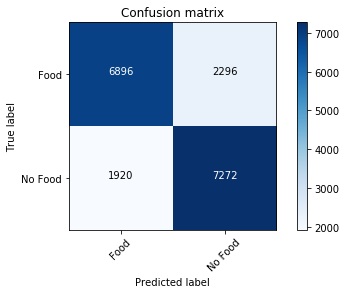



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.764143
Precision: 0.765936
Recall: 0.760770
F1 score: 0.763345
Cohens kappa: 0.528285
ROC AUC: 0.851462
F-measure = 0.7641
accuracy = 0.7641
Confusion matrix:
[[7055 2137]
 [2199 6993]]


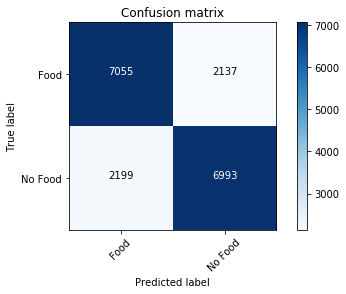



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.768277
Precision: 0.741386
Recall: 0.823977
F1 score: 0.780503
Cohens kappa: 0.536554
ROC AUC: 0.843738
F-measure = 0.7676
accuracy = 0.7683
Confusion matrix:
[[6550 2642]
 [1618 7574]]


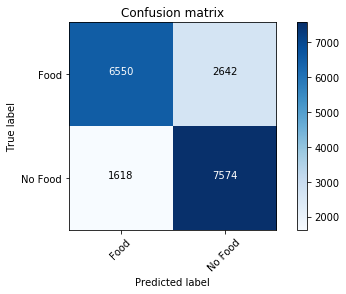



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.763164
Precision: 0.742239
Recall: 0.806353
F1 score: 0.772969
Cohens kappa: 0.526327
ROC AUC: 0.838725
F-measure = 0.7627
accuracy = 0.7632
Confusion matrix:
[[6618 2574]
 [1780 7412]]


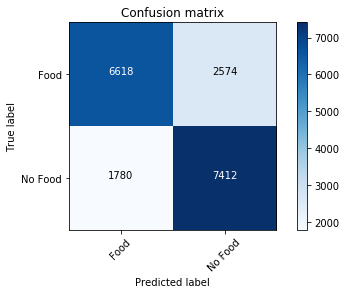



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.775239
Precision: 0.754016
Recall: 0.817015
F1 score: 0.784252
Cohens kappa: 0.550479
ROC AUC: 0.851570
F-measure = 0.7748
accuracy = 0.7752
Confusion matrix:
[[6742 2450]
 [1682 7510]]


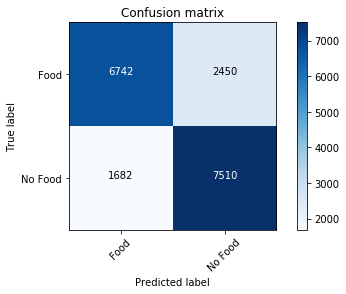



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.777524
Precision: 0.764407
Recall: 0.802328
F1 score: 0.782909
Cohens kappa: 0.555048
ROC AUC: 0.858018
F-measure = 0.7774
accuracy = 0.7775
Confusion matrix:
[[6919 2273]
 [1817 7375]]


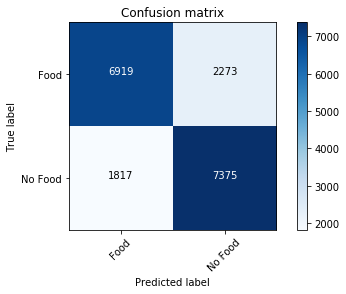



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.759682
Precision: 0.774810
Recall: 0.732158
F1 score: 0.752881
Cohens kappa: 0.519365
ROC AUC: 0.850777
F-measure = 0.7595
accuracy = 0.7597
Confusion matrix:
[[7236 1956]
 [2462 6730]]


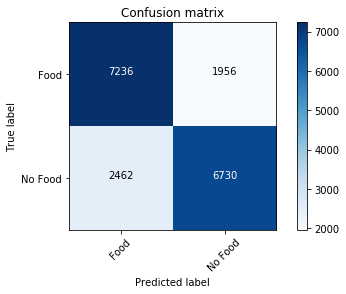



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.283290
Precision: 0.261836
Recall: 0.238251
F1 score: 0.249487
Cohens kappa: -0.433420
ROC AUC: 0.210125
F-measure = 0.2818
accuracy = 0.2833
Confusion matrix:
[[3018 6174]
 [7002 2190]]


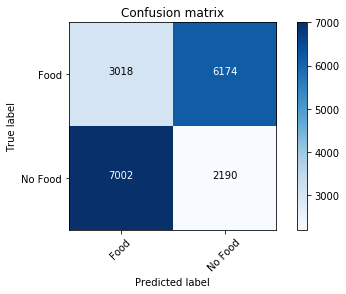



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.246192
Precision: 0.212685
Recall: 0.187881
F1 score: 0.199515
Cohens kappa: -0.507615
ROC AUC: 0.173665
F-measure = 0.2436
accuracy = 0.2462
Confusion matrix:
[[2799 6393]
 [7465 1727]]


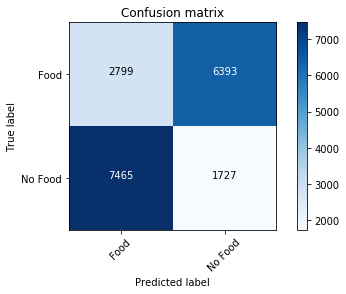



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.303742
Precision: 0.343837
Recall: 0.432115
F1 score: 0.382954
Cohens kappa: -0.392515
ROC AUC: 0.188925
F-measure = 0.2921
accuracy = 0.3037
Confusion matrix:
[[1612 7580]
 [5220 3972]]


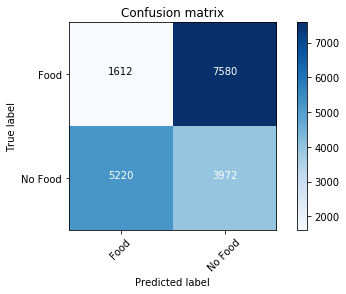



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.238468
Precision: 0.223360
Recall: 0.211162
F1 score: 0.217090
Cohens kappa: -0.523064
ROC AUC: 0.155179
F-measure = 0.2379
accuracy = 0.2385
Confusion matrix:
[[2443 6749]
 [7251 1941]]


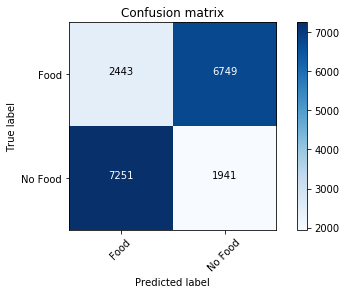



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.233355
Precision: 0.181274
Recall: 0.151654
F1 score: 0.165146
Cohens kappa: -0.533290
ROC AUC: 0.164188
F-measure = 0.2282
accuracy = 0.2334
Confusion matrix:
[[2896 6296]
 [7798 1394]]


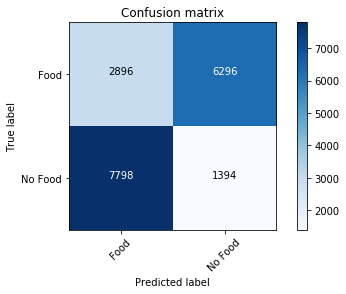



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.248640
Precision: 0.254228
Recall: 0.260009
F1 score: 0.257086
Cohens kappa: -0.502720
ROC AUC: 0.158841
F-measure = 0.2485
accuracy = 0.2486
Confusion matrix:
[[2181 7011]
 [6802 2390]]


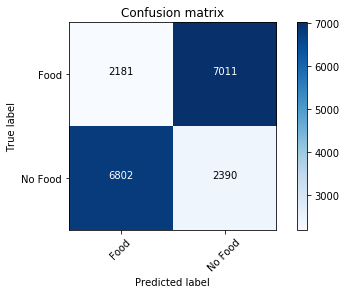



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.415688
Precision: 0.452366
Recall: 0.800696
F1 score: 0.578116
Cohens kappa: -0.168625
ROC AUC: 0.195851
F-measure = 0.3140
accuracy = 0.4157
Confusion matrix:
[[ 282 8910]
 [1832 7360]]


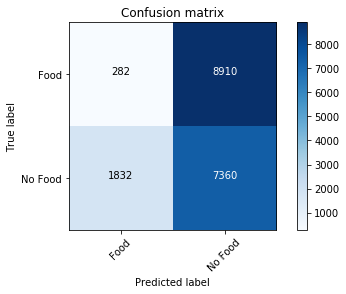



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.255657
Precision: 0.276873
Recall: 0.303198
F1 score: 0.289438
Cohens kappa: -0.488686
ROC AUC: 0.158781
F-measure = 0.2540
accuracy = 0.2557
Confusion matrix:
[[1913 7279]
 [6405 2787]]


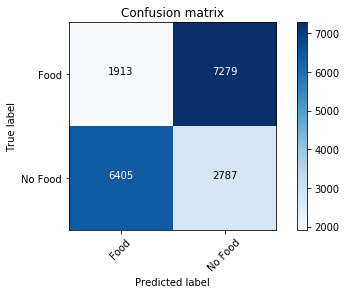



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.265992
Precision: 0.297686
Recall: 0.344321
F1 score: 0.319310
Cohens kappa: -0.468016
ROC AUC: 0.163140
F-measure = 0.2615
accuracy = 0.2660
Confusion matrix:
[[1725 7467]
 [6027 3165]]


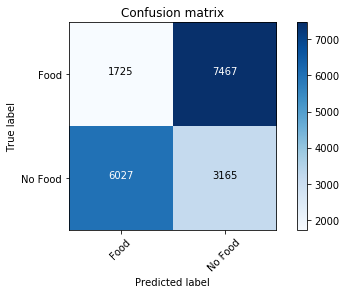



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.755711
Precision: 0.762420
Recall: 0.742929
F1 score: 0.752548
Cohens kappa: 0.511423
ROC AUC: 0.839152
F-measure = 0.7557
accuracy = 0.7557
Confusion matrix:
[[7064 2128]
 [2363 6829]]


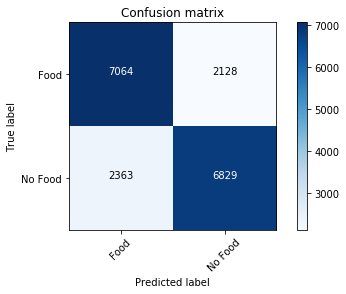



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.767787
Precision: 0.720426
Recall: 0.875218
F1 score: 0.790314
Cohens kappa: 0.535574
ROC AUC: 0.848355
F-measure = 0.7651
accuracy = 0.7678
Confusion matrix:
[[6070 3122]
 [1147 8045]]


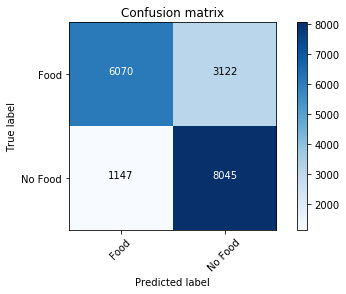



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.755004
Precision: 0.771296
Recall: 0.724978
F1 score: 0.747420
Cohens kappa: 0.510009
ROC AUC: 0.841329
F-measure = 0.7548
accuracy = 0.7550
Confusion matrix:
[[7216 1976]
 [2528 6664]]


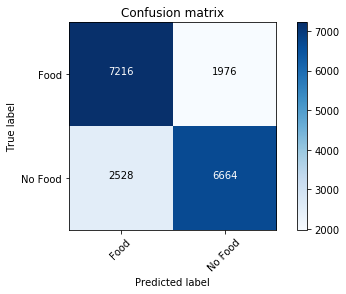



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.768059
Precision: 0.750559
Recall: 0.802981
F1 score: 0.775886
Cohens kappa: 0.536118
ROC AUC: 0.850231
F-measure = 0.7678
accuracy = 0.7681
Confusion matrix:
[[6739 2453]
 [1811 7381]]


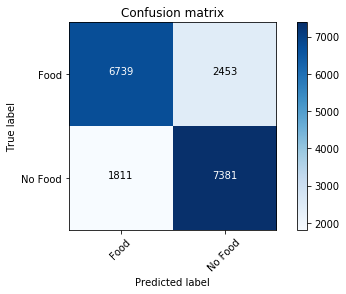



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.652143
Precision: 0.661025
Recall: 0.624565
F1 score: 0.642278
Cohens kappa: 0.304286
ROC AUC: 0.701389
F-measure = 0.6519
accuracy = 0.6521
Confusion matrix:
[[6248 2944]
 [3451 5741]]


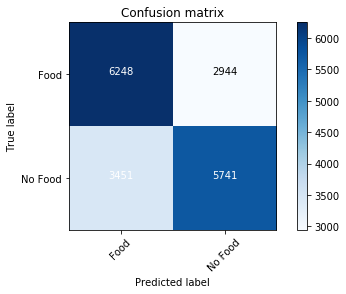



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.686086
Precision: 0.770349
Recall: 0.530244
F1 score: 0.628133
Cohens kappa: 0.372171
ROC AUC: 0.744480
F-measure = 0.6783
accuracy = 0.6861
Confusion matrix:
[[7739 1453]
 [4318 4874]]


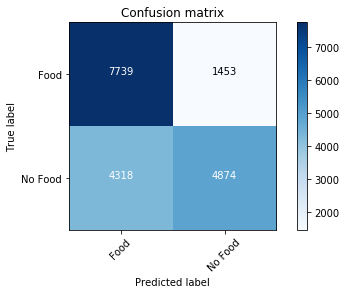



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.348673
Precision: 0.359863
Recall: 0.388599
F1 score: 0.373679
Cohens kappa: -0.302654
ROC AUC: 0.280622
F-measure = 0.3476
accuracy = 0.3487
Confusion matrix:
[[2838 6354]
 [5620 3572]]


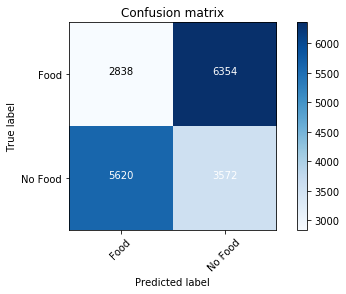



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.314404
Precision: 0.239542
Recall: 0.170692
F1 score: 0.199339
Cohens kappa: -0.371192
ROC AUC: 0.271852
F-measure = 0.2999
accuracy = 0.3144
Confusion matrix:
[[4211 4981]
 [7623 1569]]


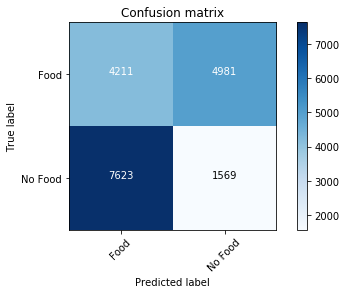



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.348292
Precision: 0.347679
Recall: 0.346279
F1 score: 0.346978
Cohens kappa: -0.303416
ROC AUC: 0.288028
F-measure = 0.3483
accuracy = 0.3483
Confusion matrix:
[[3220 5972]
 [6009 3183]]


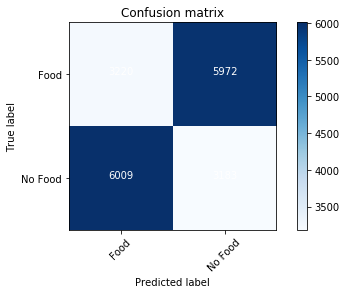



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.349162
Precision: 0.343880
Recall: 0.332245
F1 score: 0.337963
Cohens kappa: -0.301675
ROC AUC: 0.300312
F-measure = 0.3490
accuracy = 0.3492
Confusion matrix:
[[3365 5827]
 [6138 3054]]


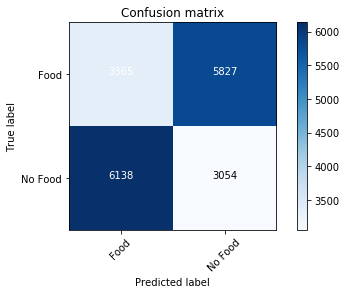



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.354493
Precision: 0.353617
Recall: 0.351501
F1 score: 0.352556
Cohens kappa: -0.291014
ROC AUC: 0.304565
F-measure = 0.3545
accuracy = 0.3545
Confusion matrix:
[[3286 5906]
 [5961 3231]]


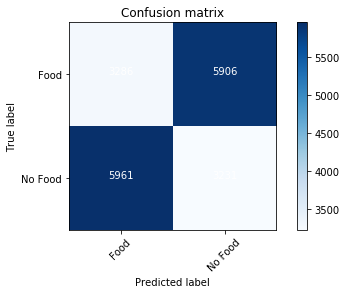



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.303742
Precision: 0.242359
Recall: 0.184617
F1 score: 0.209584
Cohens kappa: -0.392515
ROC AUC: 0.243084
F-measure = 0.2937
accuracy = 0.3037
Confusion matrix:
[[3887 5305]
 [7495 1697]]


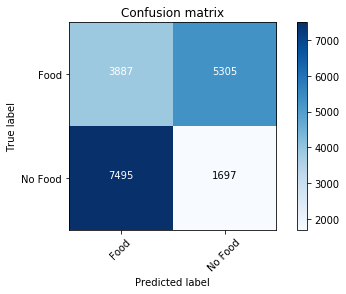



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.347857
Precision: 0.338975
Recall: 0.320279
F1 score: 0.329362
Cohens kappa: -0.304286
ROC AUC: 0.298611
F-measure = 0.3474
accuracy = 0.3479
Confusion matrix:
[[3451 5741]
 [6248 2944]]


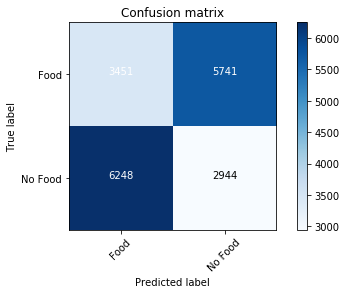



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.313914
Precision: 0.229651
Recall: 0.158072
F1 score: 0.187254
Cohens kappa: -0.372171
ROC AUC: 0.255520
F-measure = 0.2968
accuracy = 0.3139
Confusion matrix:
[[4318 4874]
 [7739 1453]]


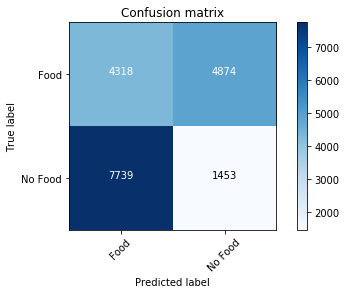



##################################################################################################




In [47]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [48]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [21]:
gc.collect()

0

### Test Trial 6

In [22]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(VLFD, VLNFD, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
10140 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
10140 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 10140 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
20280 validation images will be loaded: 10140 for food, 10140 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non

In [23]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.964398
Precision: 0.976234
Recall: 0.951972
F1 score: 0.963950
Cohens kappa: 0.928797
ROC AUC: 0.991214
F-measure = 0.9644
accuracy = 0.9644
Confusion matrix:
[[9905  235]
 [ 487 9653]]


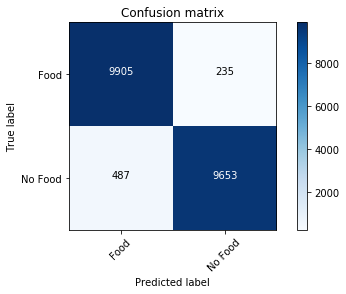



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.959270
Precision: 0.985509
Recall: 0.932249
F1 score: 0.958139
Cohens kappa: 0.918540
ROC AUC: 0.991854
F-measure = 0.9592
accuracy = 0.9593
Confusion matrix:
[[10001   139]
 [  687  9453]]


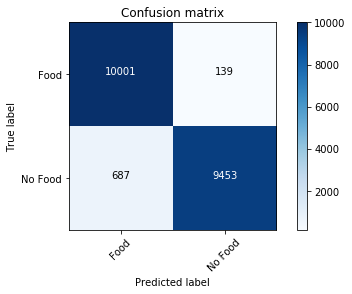



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.957692
Precision: 0.957331
Recall: 0.958087
F1 score: 0.957709
Cohens kappa: 0.915385
ROC AUC: 0.989034
F-measure = 0.9577
accuracy = 0.9577
Confusion matrix:
[[9707  433]
 [ 425 9715]]


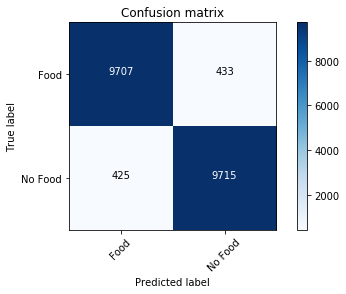



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.948915
Precision: 0.934103
Recall: 0.965976
F1 score: 0.949772
Cohens kappa: 0.897830
ROC AUC: 0.988367
F-measure = 0.9489
accuracy = 0.9489
Confusion matrix:
[[9449  691]
 [ 345 9795]]


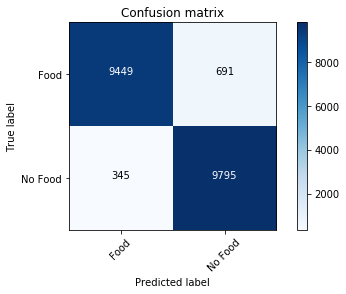



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.958777
Precision: 0.955186
Recall: 0.962722
F1 score: 0.958939
Cohens kappa: 0.917554
ROC AUC: 0.988458
F-measure = 0.9588
accuracy = 0.9588
Confusion matrix:
[[9682  458]
 [ 378 9762]]


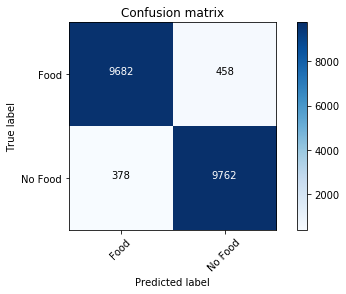



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.949655
Precision: 0.935774
Recall: 0.965582
F1 score: 0.950444
Cohens kappa: 0.899310
ROC AUC: 0.988301
F-measure = 0.9496
accuracy = 0.9497
Confusion matrix:
[[9468  672]
 [ 349 9791]]


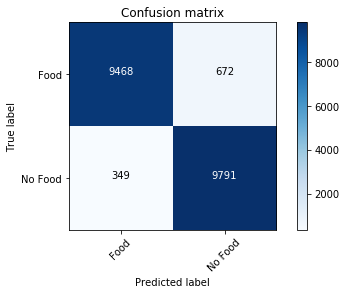



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.950888
Precision: 0.932463
Recall: 0.972189
F1 score: 0.951912
Cohens kappa: 0.901775
ROC AUC: 0.988605
F-measure = 0.9509
accuracy = 0.9509
Confusion matrix:
[[9426  714]
 [ 282 9858]]


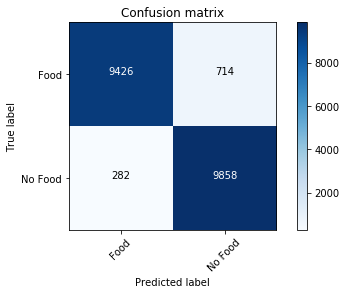



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.949901
Precision: 0.974516
Recall: 0.923964
F1 score: 0.948567
Cohens kappa: 0.899803
ROC AUC: 0.987785
F-measure = 0.9499
accuracy = 0.9499
Confusion matrix:
[[9895  245]
 [ 771 9369]]


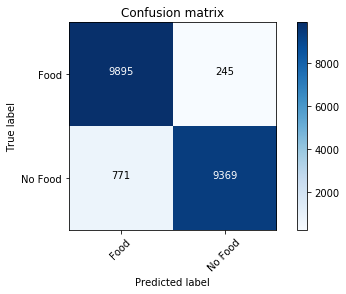



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.955720
Precision: 0.941356
Recall: 0.971992
F1 score: 0.956429
Cohens kappa: 0.911440
ROC AUC: 0.989357
F-measure = 0.9557
accuracy = 0.9557
Confusion matrix:
[[9526  614]
 [ 284 9856]]


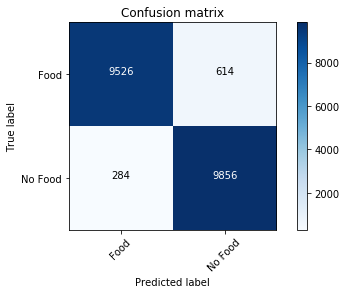



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.948274
Precision: 0.934602
Recall: 0.964004
F1 score: 0.949075
Cohens kappa: 0.896548
ROC AUC: 0.986685
F-measure = 0.9483
accuracy = 0.9483
Confusion matrix:
[[9456  684]
 [ 365 9775]]


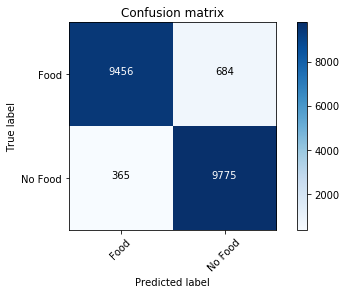



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.953501
Precision: 0.945203
Recall: 0.962821
F1 score: 0.953930
Cohens kappa: 0.907002
ROC AUC: 0.988137
F-measure = 0.9535
accuracy = 0.9535
Confusion matrix:
[[9574  566]
 [ 377 9763]]


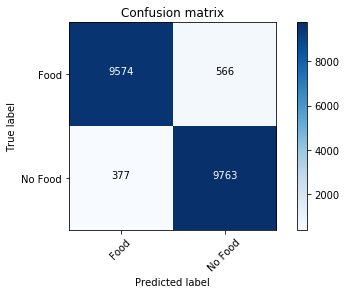



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.956558
Precision: 0.949422
Recall: 0.964497
F1 score: 0.956900
Cohens kappa: 0.913116
ROC AUC: 0.989690
F-measure = 0.9566
accuracy = 0.9566
Confusion matrix:
[[9619  521]
 [ 360 9780]]


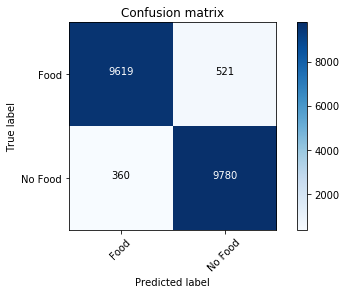



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.902367
Precision: 0.884688
Recall: 0.925345
F1 score: 0.904560
Cohens kappa: 0.804734
ROC AUC: 0.959651
F-measure = 0.9023
accuracy = 0.9024
Confusion matrix:
[[8917 1223]
 [ 757 9383]]


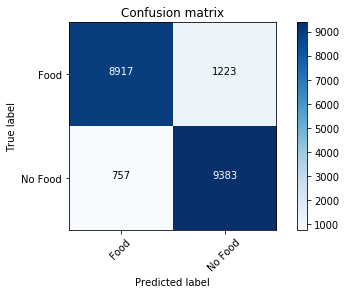



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.946252
Precision: 0.945286
Recall: 0.947337
F1 score: 0.946311
Cohens kappa: 0.892505
ROC AUC: 0.983671
F-measure = 0.9463
accuracy = 0.9463
Confusion matrix:
[[9584  556]
 [ 534 9606]]


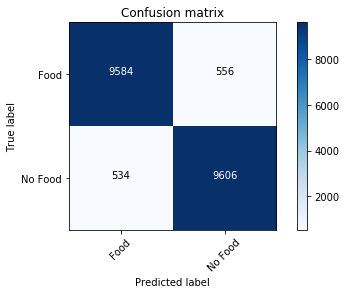



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.946006
Precision: 0.940575
Recall: 0.952170
F1 score: 0.946337
Cohens kappa: 0.892012
ROC AUC: 0.984150
F-measure = 0.9460
accuracy = 0.9460
Confusion matrix:
[[9530  610]
 [ 485 9655]]


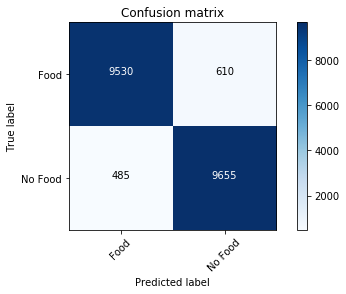



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.908876
Precision: 0.903229
Recall: 0.915878
F1 score: 0.909509
Cohens kappa: 0.817751
ROC AUC: 0.960430
F-measure = 0.9089
accuracy = 0.9089
Confusion matrix:
[[9145  995]
 [ 853 9287]]


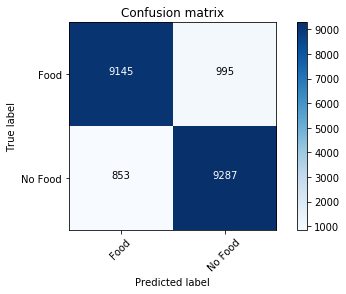



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.883777
Precision: 0.833262
Recall: 0.959566
F1 score: 0.891965
Cohens kappa: 0.767554
ROC AUC: 0.955889
F-measure = 0.8831
accuracy = 0.8838
Confusion matrix:
[[8193 1947]
 [ 410 9730]]


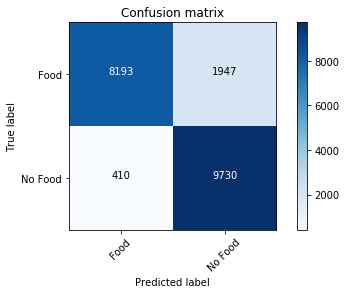



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.936391
Precision: 0.967660
Recall: 0.902959
F1 score: 0.934190
Cohens kappa: 0.872781
ROC AUC: 0.981484
F-measure = 0.9363
accuracy = 0.9364
Confusion matrix:
[[9834  306]
 [ 984 9156]]


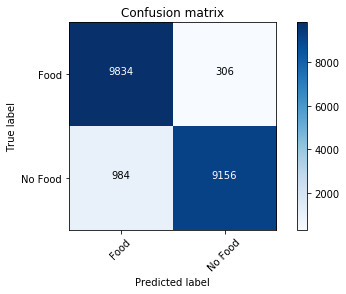



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.915976
Precision: 0.887328
Recall: 0.952959
F1 score: 0.918973
Cohens kappa: 0.831953
ROC AUC: 0.976834
F-measure = 0.9159
accuracy = 0.9160
Confusion matrix:
[[8913 1227]
 [ 477 9663]]


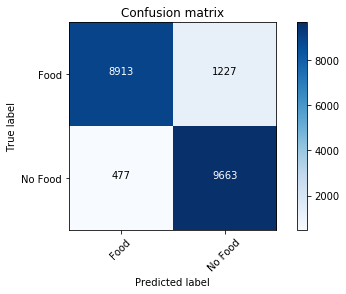



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.930276
Precision: 0.915682
Recall: 0.947830
F1 score: 0.931479
Cohens kappa: 0.860552
ROC AUC: 0.979130
F-measure = 0.9303
accuracy = 0.9303
Confusion matrix:
[[9255  885]
 [ 529 9611]]


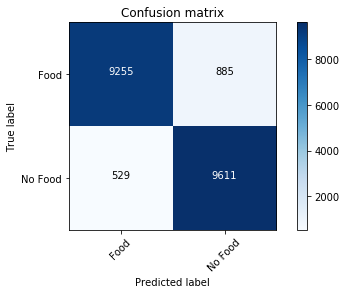



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.948373
Precision: 0.967891
Recall: 0.927515
F1 score: 0.947273
Cohens kappa: 0.896746
ROC AUC: 0.984871
F-measure = 0.9484
accuracy = 0.9484
Confusion matrix:
[[9828  312]
 [ 735 9405]]


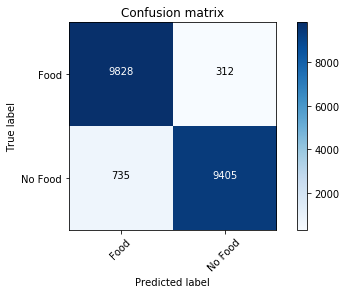



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.950789
Precision: 0.963027
Recall: 0.937574
F1 score: 0.950130
Cohens kappa: 0.901578
ROC AUC: 0.984812
F-measure = 0.9508
accuracy = 0.9508
Confusion matrix:
[[9775  365]
 [ 633 9507]]


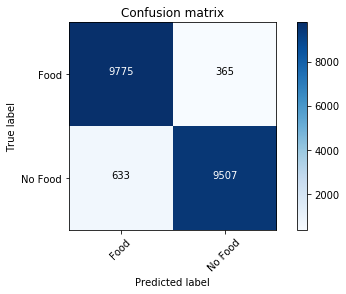



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.852663
Precision: 0.829403
Recall: 0.887968
F1 score: 0.857687
Cohens kappa: 0.705325
ROC AUC: 0.920899
F-measure = 0.8525
accuracy = 0.8527
Confusion matrix:
[[8288 1852]
 [1136 9004]]


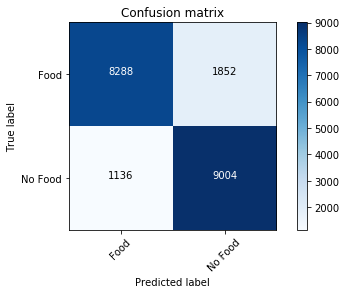



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.868294
Precision: 0.822078
Recall: 0.940039
F1 score: 0.877111
Cohens kappa: 0.736588
ROC AUC: 0.940854
F-measure = 0.8676
accuracy = 0.8683
Confusion matrix:
[[8077 2063]
 [ 608 9532]]


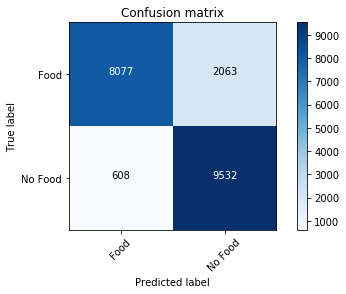



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.836588
Precision: 0.799596
Recall: 0.898323
F1 score: 0.846090
Cohens kappa: 0.673176
ROC AUC: 0.904808
F-measure = 0.8360
accuracy = 0.8366
Confusion matrix:
[[7857 2283]
 [1031 9109]]


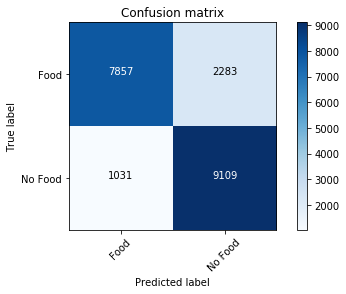



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.846302
Precision: 0.823372
Recall: 0.881755
F1 score: 0.851564
Cohens kappa: 0.692604
ROC AUC: 0.915313
F-measure = 0.8461
accuracy = 0.8463
Confusion matrix:
[[8222 1918]
 [1199 8941]]


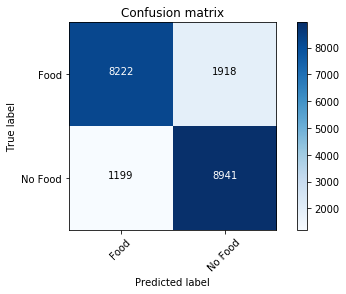



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.849852
Precision: 0.826387
Recall: 0.885799
F1 score: 0.855062
Cohens kappa: 0.699704
ROC AUC: 0.914638
F-measure = 0.8497
accuracy = 0.8499
Confusion matrix:
[[8253 1887]
 [1158 8982]]


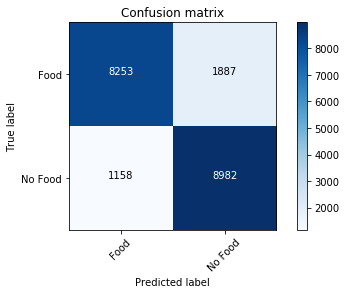



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.902860
Precision: 0.868283
Recall: 0.949803
F1 score: 0.907216
Cohens kappa: 0.805720
ROC AUC: 0.963767
F-measure = 0.9026
accuracy = 0.9029
Confusion matrix:
[[8679 1461]
 [ 509 9631]]


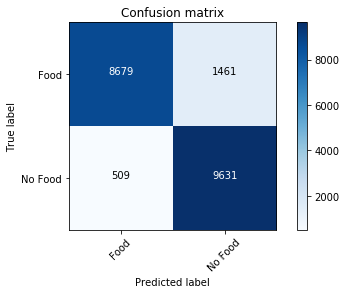



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.911193
Precision: 0.881159
Recall: 0.950592
F1 score: 0.914560
Cohens kappa: 0.822387
ROC AUC: 0.966045
F-measure = 0.9111
accuracy = 0.9112
Confusion matrix:
[[8840 1300]
 [ 501 9639]]


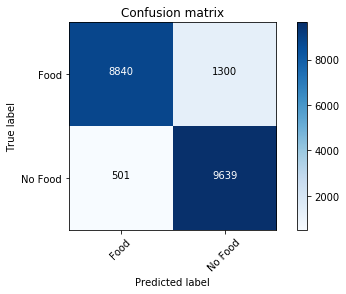



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.926085
Precision: 0.922047
Recall: 0.930868
F1 score: 0.926437
Cohens kappa: 0.852170
ROC AUC: 0.971297
F-measure = 0.9261
accuracy = 0.9261
Confusion matrix:
[[9342  798]
 [ 701 9439]]


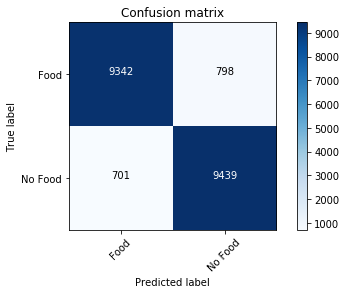



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.929783
Precision: 0.922205
Recall: 0.938757
F1 score: 0.930408
Cohens kappa: 0.859566
ROC AUC: 0.973250
F-measure = 0.9298
accuracy = 0.9298
Confusion matrix:
[[9337  803]
 [ 621 9519]]


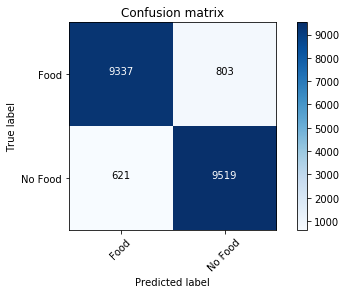



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.930917
Precision: 0.917295
Recall: 0.947239
F1 score: 0.932027
Cohens kappa: 0.861834
ROC AUC: 0.973963
F-measure = 0.9309
accuracy = 0.9309
Confusion matrix:
[[9274  866]
 [ 535 9605]]


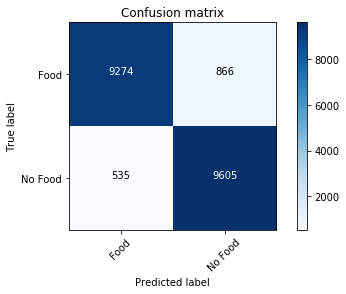



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.923077
Precision: 0.901235
Recall: 0.950296
F1 score: 0.925115
Cohens kappa: 0.846154
ROC AUC: 0.969462
F-measure = 0.9230
accuracy = 0.9231
Confusion matrix:
[[9084 1056]
 [ 504 9636]]


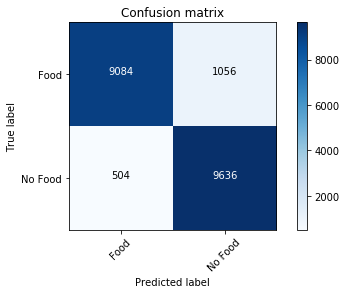



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.923915
Precision: 0.894901
Recall: 0.960651
F1 score: 0.926611
Cohens kappa: 0.847830
ROC AUC: 0.970441
F-measure = 0.9238
accuracy = 0.9239
Confusion matrix:
[[8996 1144]
 [ 399 9741]]


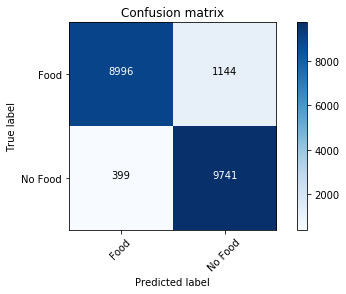



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.924458
Precision: 0.896755
Recall: 0.959369
F1 score: 0.927006
Cohens kappa: 0.848915
ROC AUC: 0.972159
F-measure = 0.9244
accuracy = 0.9245
Confusion matrix:
[[9020 1120]
 [ 412 9728]]


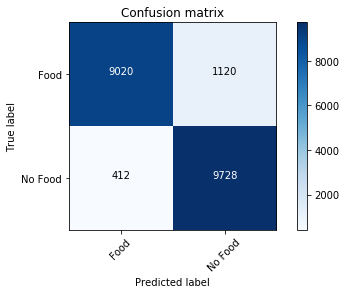



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.925493
Precision: 0.905384
Recall: 0.950296
F1 score: 0.927296
Cohens kappa: 0.850986
ROC AUC: 0.970754
F-measure = 0.9254
accuracy = 0.9255
Confusion matrix:
[[9133 1007]
 [ 504 9636]]


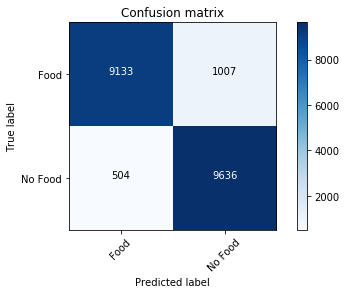



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.879290
Precision: 0.896331
Recall: 0.857791
F1 score: 0.876638
Cohens kappa: 0.758580
ROC AUC: 0.951545
F-measure = 0.8792
accuracy = 0.8793
Confusion matrix:
[[9134 1006]
 [1442 8698]]


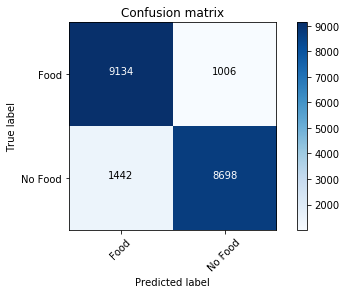



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.899310
Precision: 0.878907
Recall: 0.926233
F1 score: 0.901949
Cohens kappa: 0.798619
ROC AUC: 0.955365
F-measure = 0.8992
accuracy = 0.8993
Confusion matrix:
[[8846 1294]
 [ 748 9392]]


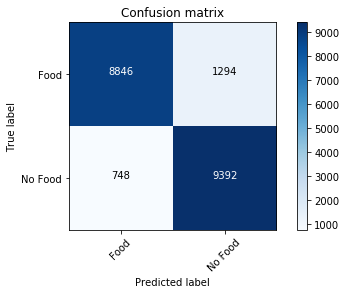



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.869379
Precision: 0.812464
Recall: 0.960454
F1 score: 0.880282
Cohens kappa: 0.738757
ROC AUC: 0.945703
F-measure = 0.8683
accuracy = 0.8694
Confusion matrix:
[[7892 2248]
 [ 401 9739]]


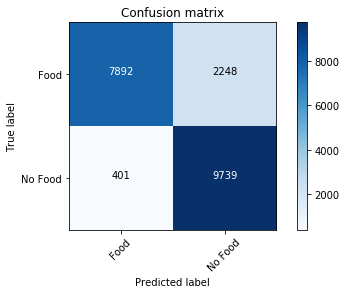



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.869576
Precision: 0.821260
Recall: 0.944773
F1 score: 0.878698
Cohens kappa: 0.739152
ROC AUC: 0.943630
F-measure = 0.8688
accuracy = 0.8696
Confusion matrix:
[[8055 2085]
 [ 560 9580]]


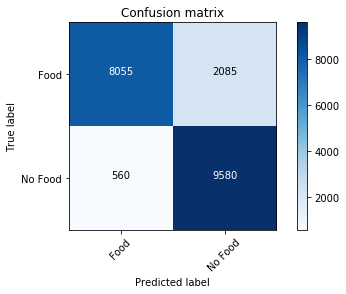



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.876183
Precision: 0.822579
Recall: 0.959270
F1 score: 0.885682
Cohens kappa: 0.752367
ROC AUC: 0.950372
F-measure = 0.8753
accuracy = 0.8762
Confusion matrix:
[[8042 2098]
 [ 413 9727]]


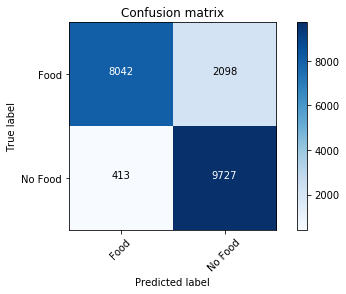



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.882840
Precision: 0.850361
Recall: 0.929191
F1 score: 0.888030
Cohens kappa: 0.765680
ROC AUC: 0.949698
F-measure = 0.8826
accuracy = 0.8828
Confusion matrix:
[[8482 1658]
 [ 718 9422]]


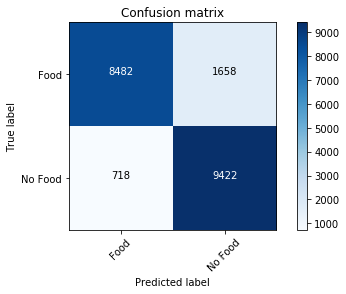



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.908925
Precision: 0.902768
Recall: 0.916568
F1 score: 0.909616
Cohens kappa: 0.817850
ROC AUC: 0.962472
F-measure = 0.9089
accuracy = 0.9089
Confusion matrix:
[[9139 1001]
 [ 846 9294]]


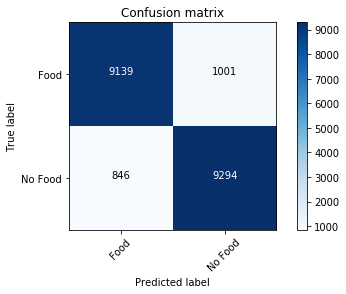



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.959615
Precision: 0.965352
Recall: 0.953452
F1 score: 0.959365
Cohens kappa: 0.919231
ROC AUC: 0.989330
F-measure = 0.9596
accuracy = 0.9596
Confusion matrix:
[[9793  347]
 [ 472 9668]]


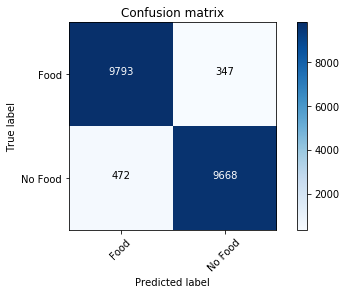



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.956114
Precision: 0.976411
Recall: 0.934813
F1 score: 0.955159
Cohens kappa: 0.912229
ROC AUC: 0.989819
F-measure = 0.9561
accuracy = 0.9561
Confusion matrix:
[[9911  229]
 [ 661 9479]]


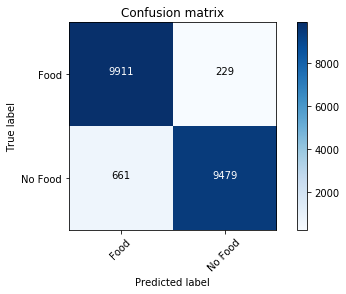



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.944724
Precision: 0.936248
Recall: 0.954438
F1 score: 0.945256
Cohens kappa: 0.889448
ROC AUC: 0.985748
F-measure = 0.9447
accuracy = 0.9447
Confusion matrix:
[[9481  659]
 [ 462 9678]]


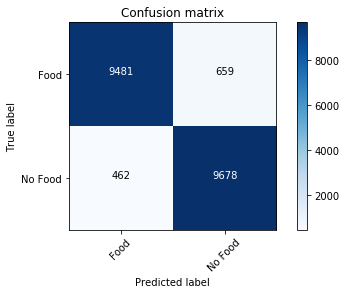



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.951874
Precision: 0.945807
Recall: 0.958679
F1 score: 0.952199
Cohens kappa: 0.903748
ROC AUC: 0.987201
F-measure = 0.9519
accuracy = 0.9519
Confusion matrix:
[[9583  557]
 [ 419 9721]]


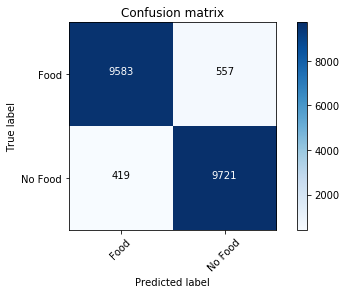



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.949458
Precision: 0.939616
Recall: 0.960651
F1 score: 0.950017
Cohens kappa: 0.898915
ROC AUC: 0.987408
F-measure = 0.9495
accuracy = 0.9495
Confusion matrix:
[[9514  626]
 [ 399 9741]]


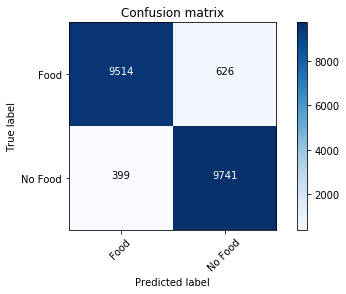



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.953254
Precision: 0.951740
Recall: 0.954931
F1 score: 0.953333
Cohens kappa: 0.906509
ROC AUC: 0.987741
F-measure = 0.9533
accuracy = 0.9533
Confusion matrix:
[[9649  491]
 [ 457 9683]]


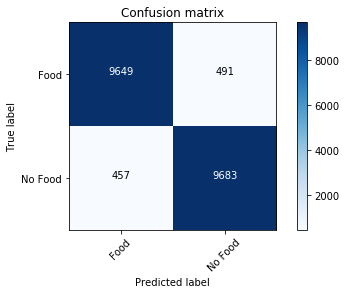



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.962525
Precision: 0.969940
Recall: 0.954635
F1 score: 0.962227
Cohens kappa: 0.925049
ROC AUC: 0.990232
F-measure = 0.9625
accuracy = 0.9625
Confusion matrix:
[[9840  300]
 [ 460 9680]]


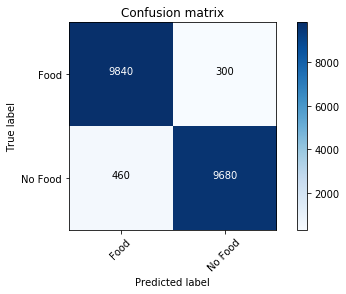



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.955621
Precision: 0.973652
Recall: 0.936588
F1 score: 0.954760
Cohens kappa: 0.911243
ROC AUC: 0.989534
F-measure = 0.9556
accuracy = 0.9556
Confusion matrix:
[[9883  257]
 [ 643 9497]]


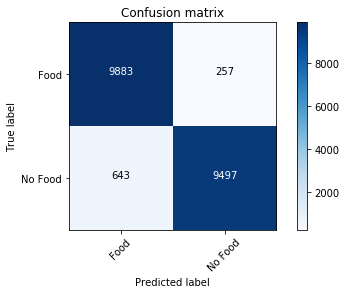



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.943639
Precision: 0.937385
Recall: 0.950789
F1 score: 0.944039
Cohens kappa: 0.887278
ROC AUC: 0.985009
F-measure = 0.9436
accuracy = 0.9436
Confusion matrix:
[[9496  644]
 [ 499 9641]]


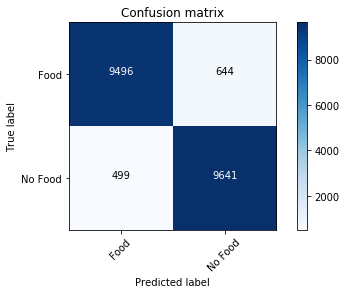



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.944280
Precision: 0.946836
Recall: 0.941420
F1 score: 0.944120
Cohens kappa: 0.888560
ROC AUC: 0.983678
F-measure = 0.9443
accuracy = 0.9443
Confusion matrix:
[[9604  536]
 [ 594 9546]]


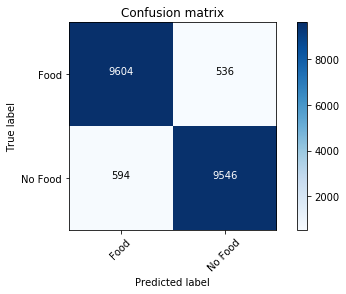



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.960799
Precision: 0.966737
Recall: 0.954438
F1 score: 0.960548
Cohens kappa: 0.921598
ROC AUC: 0.989734
F-measure = 0.9608
accuracy = 0.9608
Confusion matrix:
[[9807  333]
 [ 462 9678]]


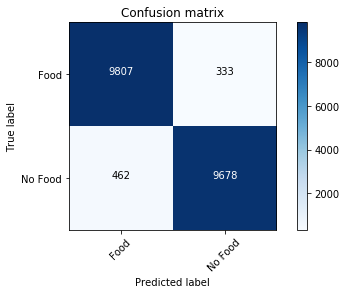



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.941223
Precision: 0.938198
Recall: 0.944675
F1 score: 0.941425
Cohens kappa: 0.882446
ROC AUC: 0.982054
F-measure = 0.9412
accuracy = 0.9412
Confusion matrix:
[[9509  631]
 [ 561 9579]]


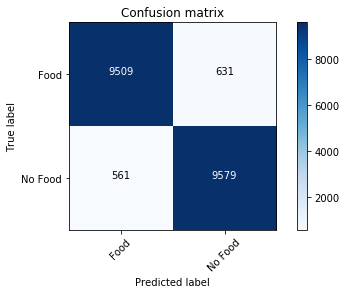



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.936933
Precision: 0.960312
Recall: 0.911538
F1 score: 0.935290
Cohens kappa: 0.873866
ROC AUC: 0.983275
F-measure = 0.9369
accuracy = 0.9369
Confusion matrix:
[[9758  382]
 [ 897 9243]]


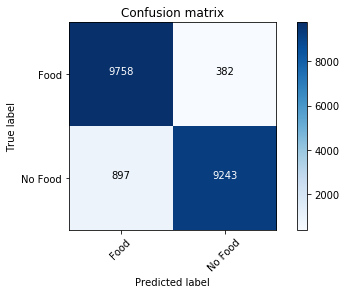



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.091223
Precision: 0.063776
Recall: 0.059763
F1 score: 0.061705
Cohens kappa: -0.817554
ROC AUC: 0.044786
F-measure = 0.0903
accuracy = 0.0912
Confusion matrix:
[[1244 8896]
 [9534  606]]


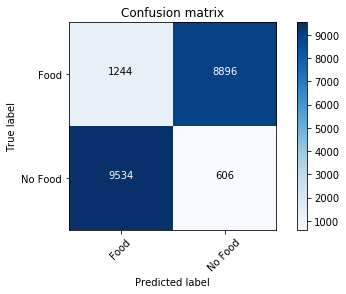



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.073077
Precision: 0.045846
Recall: 0.043097
F1 score: 0.044429
Cohens kappa: -0.853846
ROC AUC: 0.030190
F-measure = 0.0722
accuracy = 0.0731
Confusion matrix:
[[1045 9095]
 [9703  437]]


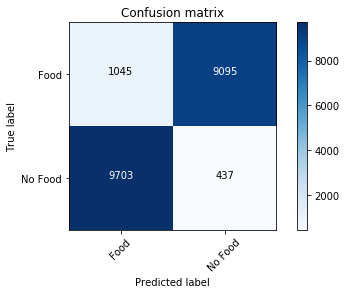



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.139152
Precision: 0.163633
Recall: 0.175542
F1 score: 0.169379
Cohens kappa: -0.721696
ROC AUC: 0.061591
F-measure = 0.1380
accuracy = 0.1392
Confusion matrix:
[[1042 9098]
 [8360 1780]]


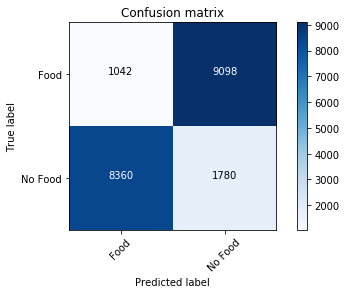



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.114645
Precision: 0.087338
Recall: 0.081558
F1 score: 0.084349
Cohens kappa: -0.770710
ROC AUC: 0.053502
F-measure = 0.1137
accuracy = 0.1146
Confusion matrix:
[[1498 8642]
 [9313  827]]


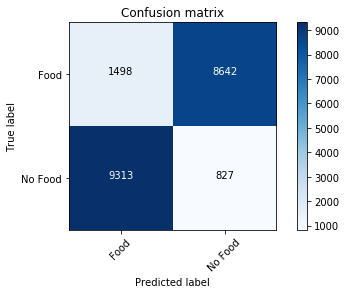



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.133777
Precision: 0.060689
Recall: 0.050592
F1 score: 0.055182
Cohens kappa: -0.732446
ROC AUC: 0.062011
F-measure = 0.1277
accuracy = 0.1338
Confusion matrix:
[[2200 7940]
 [9627  513]]


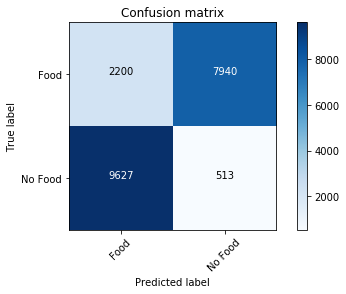



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.127465
Precision: 0.129184
Recall: 0.129783
F1 score: 0.129483
Cohens kappa: -0.745069
ROC AUC: 0.059453
F-measure = 0.1275
accuracy = 0.1275
Confusion matrix:
[[1269 8871]
 [8824 1316]]


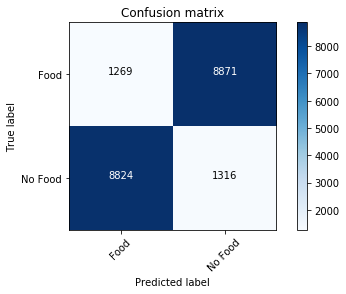



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.336933
Precision: 0.400529
Recall: 0.656607
F1 score: 0.497553
Cohens kappa: -0.326134
ROC AUC: 0.087389
F-measure = 0.2615
accuracy = 0.3369
Confusion matrix:
[[ 175 9965]
 [3482 6658]]


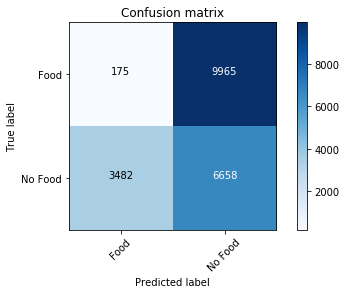



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.122436
Precision: 0.128698
Recall: 0.130868
F1 score: 0.129774
Cohens kappa: -0.755128
ROC AUC: 0.056921
F-measure = 0.1224
accuracy = 0.1224
Confusion matrix:
[[1156 8984]
 [8813 1327]]


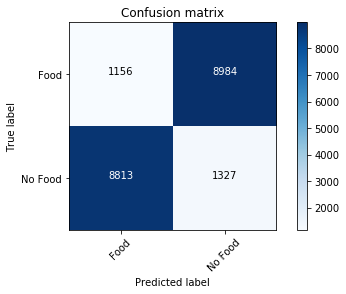



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.137623
Precision: 0.156492
Recall: 0.165089
F1 score: 0.160676
Cohens kappa: -0.724753
ROC AUC: 0.061706
F-measure = 0.1370
accuracy = 0.1376
Confusion matrix:
[[1117 9023]
 [8466 1674]]


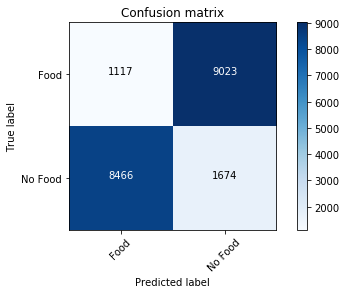



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.908284
Precision: 0.907080
Recall: 0.909763
F1 score: 0.908419
Cohens kappa: 0.816568
ROC AUC: 0.962570
F-measure = 0.9083
accuracy = 0.9083
Confusion matrix:
[[9195  945]
 [ 915 9225]]


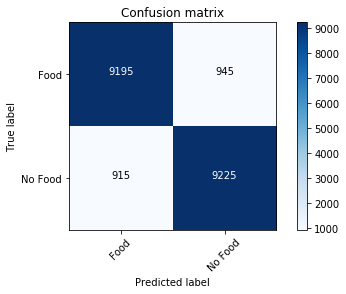



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.872091
Precision: 0.812438
Recall: 0.967554
F1 score: 0.883237
Cohens kappa: 0.744181
ROC AUC: 0.953024
F-measure = 0.8709
accuracy = 0.8721
Confusion matrix:
[[7875 2265]
 [ 329 9811]]


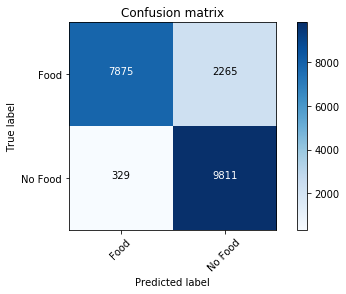



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.934467
Precision: 0.955161
Recall: 0.911736
F1 score: 0.932943
Cohens kappa: 0.868935
ROC AUC: 0.980587
F-measure = 0.9344
accuracy = 0.9345
Confusion matrix:
[[9706  434]
 [ 895 9245]]


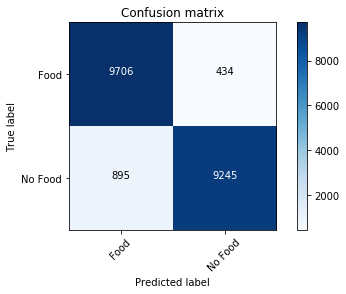



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.904931
Precision: 0.885830
Recall: 0.929684
F1 score: 0.907227
Cohens kappa: 0.809862
ROC AUC: 0.968445
F-measure = 0.9049
accuracy = 0.9049
Confusion matrix:
[[8925 1215]
 [ 713 9427]]


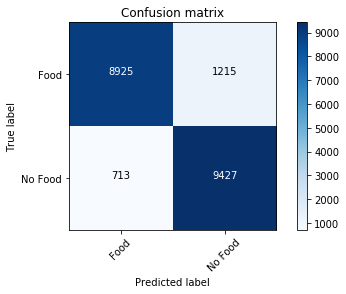



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.798718
Precision: 0.836780
Recall: 0.742209
F1 score: 0.786662
Cohens kappa: 0.597436
ROC AUC: 0.862497
F-measure = 0.7981
accuracy = 0.7987
Confusion matrix:
[[8672 1468]
 [2614 7526]]


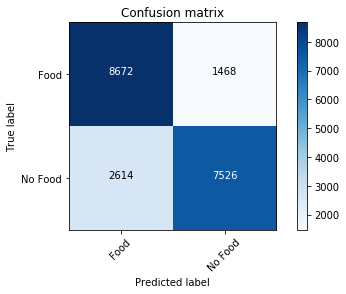



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.790927
Precision: 0.929528
Recall: 0.629586
F1 score: 0.750706
Cohens kappa: 0.581854
ROC AUC: 0.881291
F-measure = 0.7853
accuracy = 0.7909
Confusion matrix:
[[9656  484]
 [3756 6384]]


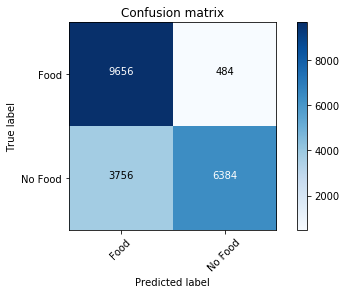



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.190434
Precision: 0.192917
Recall: 0.194477
F1 score: 0.193694
Cohens kappa: -0.619132
ROC AUC: 0.124194
F-measure = 0.1904
accuracy = 0.1904
Confusion matrix:
[[1890 8250]
 [8168 1972]]


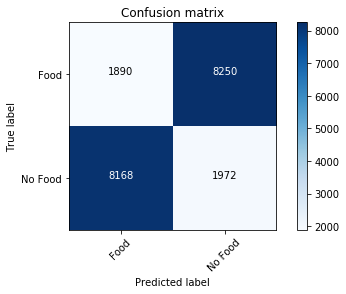



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.237130
Precision: 0.098751
Recall: 0.064694
F1 score: 0.078174
Cohens kappa: -0.525740
ROC AUC: 0.155599
F-measure = 0.2138
accuracy = 0.2371
Confusion matrix:
[[4153 5987]
 [9484  656]]


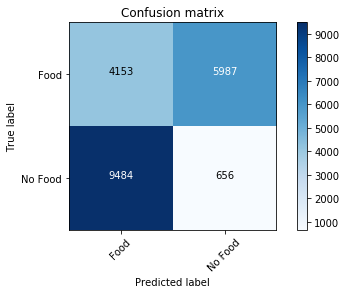



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.191223
Precision: 0.165134
Recall: 0.152268
F1 score: 0.158440
Cohens kappa: -0.617554
ROC AUC: 0.129205
F-measure = 0.1900
accuracy = 0.1912
Confusion matrix:
[[2334 7806]
 [8596 1544]]


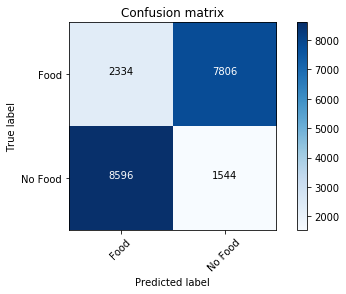



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.184813
Precision: 0.157889
Recall: 0.145464
F1 score: 0.151422
Cohens kappa: -0.630375
ROC AUC: 0.130189
F-measure = 0.1835
accuracy = 0.1848
Confusion matrix:
[[2273 7867]
 [8665 1475]]


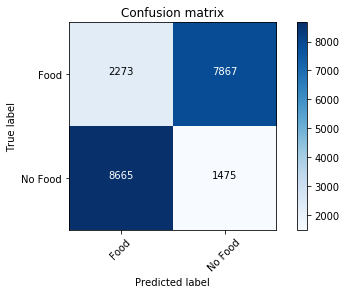



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.189990
Precision: 0.179267
Recall: 0.173274
F1 score: 0.176220
Cohens kappa: -0.620020
ROC AUC: 0.129492
F-measure = 0.1898
accuracy = 0.1900
Confusion matrix:
[[2096 8044]
 [8383 1757]]


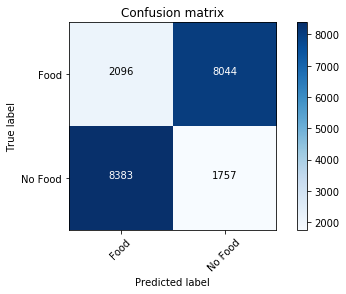



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.211440
Precision: 0.096080
Recall: 0.068639
F1 score: 0.080074
Cohens kappa: -0.577120
ROC AUC: 0.118014
F-measure = 0.1950
accuracy = 0.2114
Confusion matrix:
[[3592 6548]
 [9444  696]]


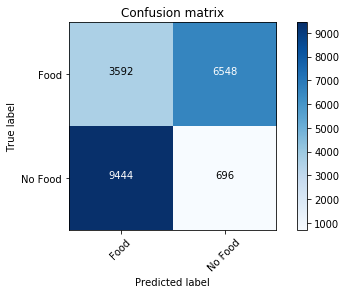



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.201282
Precision: 0.163220
Recall: 0.144773
F1 score: 0.153444
Cohens kappa: -0.597436
ROC AUC: 0.137503
F-measure = 0.1987
accuracy = 0.2013
Confusion matrix:
[[2614 7526]
 [8672 1468]]


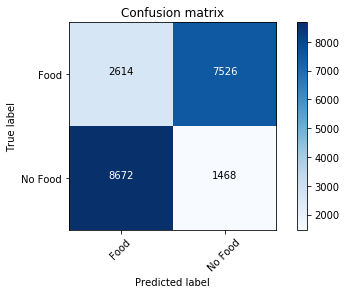



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.209073
Precision: 0.070472
Recall: 0.047732
F1 score: 0.056914
Cohens kappa: -0.581854
ROC AUC: 0.118709
F-measure = 0.1879
accuracy = 0.2091
Confusion matrix:
[[3756 6384]
 [9656  484]]


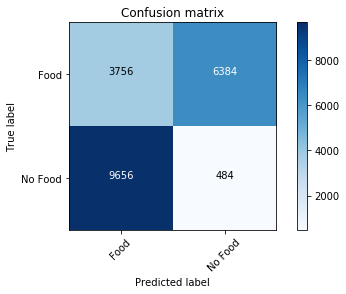



##################################################################################################




In [24]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [25]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [26]:
gc.collect()

73116

### Test Trial 7

In [27]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(TSFD, TSNFD, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
14196 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
14196 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 14196 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
28392 validation images will be loaded: 14196 for food, 14196 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non

In [28]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.963722
Precision: 0.976201
Recall: 0.950620
F1 score: 0.963241
Cohens kappa: 0.927444
ROC AUC: 0.991276
F-measure = 0.9637
accuracy = 0.9637
Confusion matrix:
[[13867   329]
 [  701 13495]]


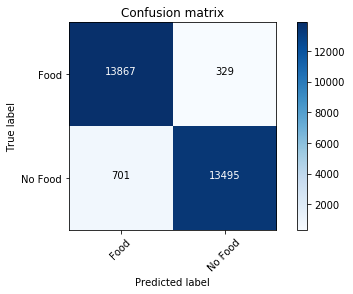



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.959742
Precision: 0.988036
Recall: 0.930755
F1 score: 0.958540
Cohens kappa: 0.919484
ROC AUC: 0.992388
F-measure = 0.9597
accuracy = 0.9597
Confusion matrix:
[[14036   160]
 [  983 13213]]


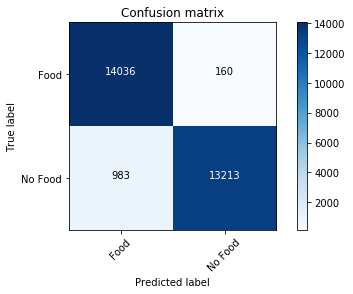



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.957911
Precision: 0.959042
Recall: 0.956678
F1 score: 0.957859
Cohens kappa: 0.915821
ROC AUC: 0.989642
F-measure = 0.9579
accuracy = 0.9579
Confusion matrix:
[[13616   580]
 [  615 13581]]


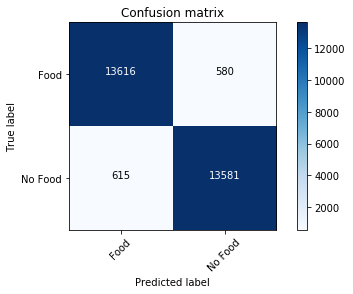



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.947661
Precision: 0.935155
Recall: 0.962032
F1 score: 0.948403
Cohens kappa: 0.895323
ROC AUC: 0.988057
F-measure = 0.9477
accuracy = 0.9477
Confusion matrix:
[[13249   947]
 [  539 13657]]


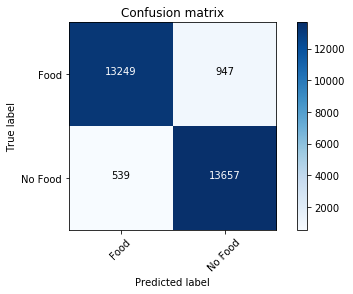



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.957911
Precision: 0.956720
Recall: 0.959214
F1 score: 0.957965
Cohens kappa: 0.915821
ROC AUC: 0.988838
F-measure = 0.9579
accuracy = 0.9579
Confusion matrix:
[[13580   616]
 [  579 13617]]


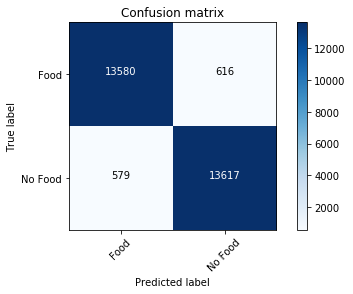



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.950972
Precision: 0.939758
Recall: 0.963722
F1 score: 0.951589
Cohens kappa: 0.901944
ROC AUC: 0.988029
F-measure = 0.9510
accuracy = 0.9510
Confusion matrix:
[[13319   877]
 [  515 13681]]


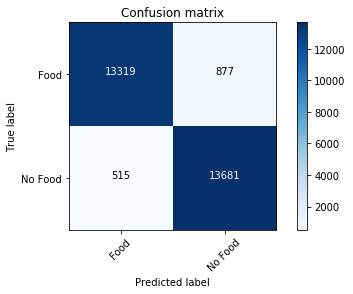



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.949634
Precision: 0.931984
Recall: 0.970062
F1 score: 0.950642
Cohens kappa: 0.899267
ROC AUC: 0.988619
F-measure = 0.9496
accuracy = 0.9496
Confusion matrix:
[[13191  1005]
 [  425 13771]]


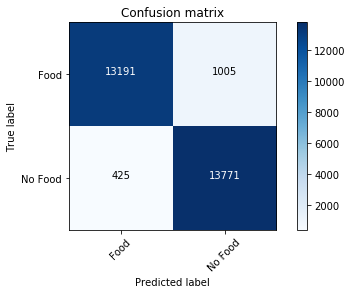



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.949317
Precision: 0.976114
Recall: 0.921175
F1 score: 0.947849
Cohens kappa: 0.898633
ROC AUC: 0.987737
F-measure = 0.9493
accuracy = 0.9493
Confusion matrix:
[[13876   320]
 [ 1119 13077]]


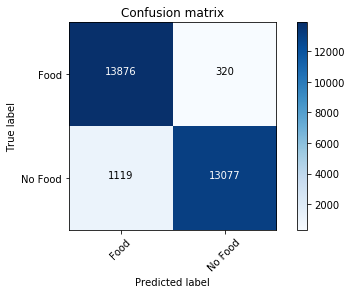



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.955269
Precision: 0.941281
Recall: 0.971119
F1 score: 0.955967
Cohens kappa: 0.910538
ROC AUC: 0.989397
F-measure = 0.9553
accuracy = 0.9553
Confusion matrix:
[[13336   860]
 [  410 13786]]


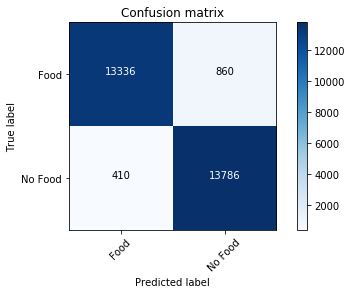



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.948964
Precision: 0.936153
Recall: 0.963652
F1 score: 0.949703
Cohens kappa: 0.897929
ROC AUC: 0.987202
F-measure = 0.9490
accuracy = 0.9490
Confusion matrix:
[[13263   933]
 [  516 13680]]


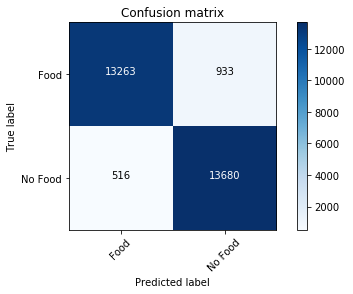



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.952451
Precision: 0.943394
Recall: 0.962666
F1 score: 0.952932
Cohens kappa: 0.904903
ROC AUC: 0.988510
F-measure = 0.9524
accuracy = 0.9525
Confusion matrix:
[[13376   820]
 [  530 13666]]


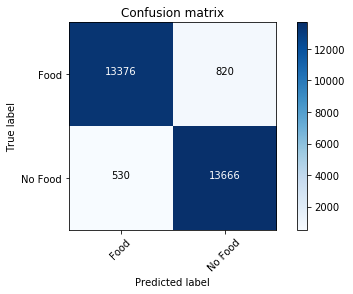



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.956784
Precision: 0.950532
Recall: 0.963722
F1 score: 0.957081
Cohens kappa: 0.913567
ROC AUC: 0.989732
F-measure = 0.9568
accuracy = 0.9568
Confusion matrix:
[[13484   712]
 [  515 13681]]


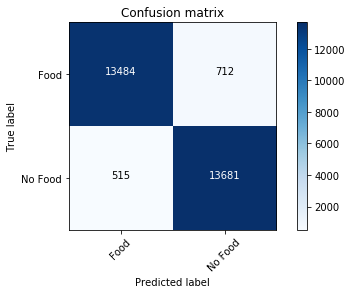



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.903283
Precision: 0.884022
Recall: 0.928360
F1 score: 0.905649
Cohens kappa: 0.806565
ROC AUC: 0.961480
F-measure = 0.9032
accuracy = 0.9033
Confusion matrix:
[[12467  1729]
 [ 1017 13179]]


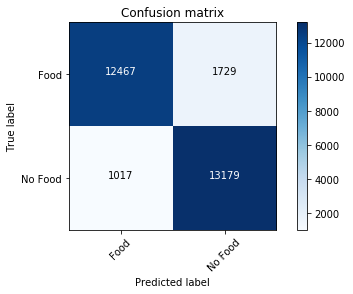



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.946992
Precision: 0.951476
Recall: 0.942026
F1 score: 0.946728
Cohens kappa: 0.893984
ROC AUC: 0.984322
F-measure = 0.9470
accuracy = 0.9470
Confusion matrix:
[[13514   682]
 [  823 13373]]


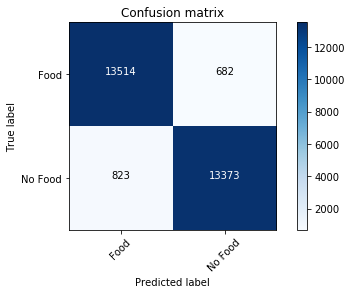



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.945161
Precision: 0.942140
Recall: 0.948577
F1 score: 0.945347
Cohens kappa: 0.890321
ROC AUC: 0.984096
F-measure = 0.9452
accuracy = 0.9452
Confusion matrix:
[[13369   827]
 [  730 13466]]


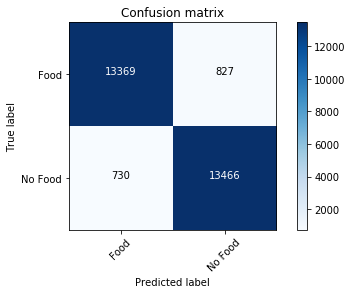



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.908636
Precision: 0.900843
Recall: 0.918357
F1 score: 0.909516
Cohens kappa: 0.817272
ROC AUC: 0.961226
F-measure = 0.9086
accuracy = 0.9086
Confusion matrix:
[[12761  1435]
 [ 1159 13037]]


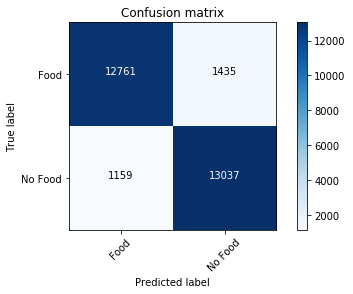



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.884721
Precision: 0.834918
Recall: 0.959073
F1 score: 0.892699
Cohens kappa: 0.769442
ROC AUC: 0.957109
F-measure = 0.8841
accuracy = 0.8847
Confusion matrix:
[[11504  2692]
 [  581 13615]]


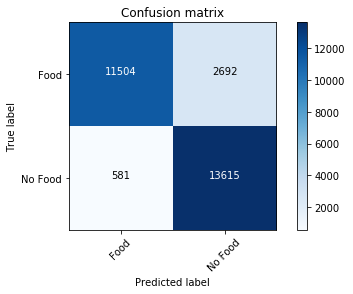



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.937201
Precision: 0.972588
Recall: 0.899760
F1 score: 0.934758
Cohens kappa: 0.874401
ROC AUC: 0.982345
F-measure = 0.9371
accuracy = 0.9372
Confusion matrix:
[[13836   360]
 [ 1423 12773]]


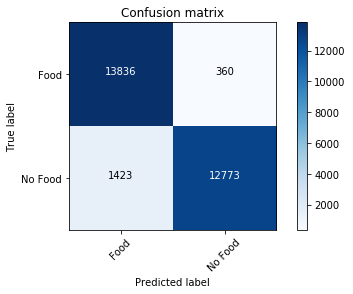



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.917899
Precision: 0.891507
Recall: 0.951606
F1 score: 0.920577
Cohens kappa: 0.835799
ROC AUC: 0.976355
F-measure = 0.9178
accuracy = 0.9179
Confusion matrix:
[[12552  1644]
 [  687 13509]]


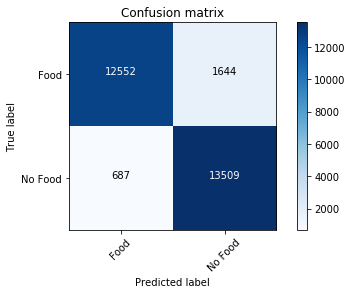



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.930544
Precision: 0.919896
Recall: 0.943223
F1 score: 0.931413
Cohens kappa: 0.861088
ROC AUC: 0.979260
F-measure = 0.9305
accuracy = 0.9305
Confusion matrix:
[[13030  1166]
 [  806 13390]]


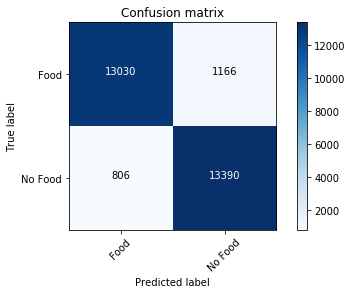



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.948507
Precision: 0.970375
Recall: 0.925261
F1 score: 0.947281
Cohens kappa: 0.897013
ROC AUC: 0.985361
F-measure = 0.9485
accuracy = 0.9485
Confusion matrix:
[[13795   401]
 [ 1061 13135]]


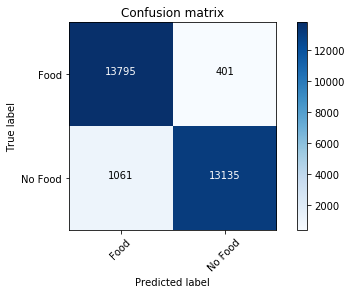



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.950127
Precision: 0.967515
Recall: 0.931530
F1 score: 0.949182
Cohens kappa: 0.900254
ROC AUC: 0.985518
F-measure = 0.9501
accuracy = 0.9501
Confusion matrix:
[[13752   444]
 [  972 13224]]


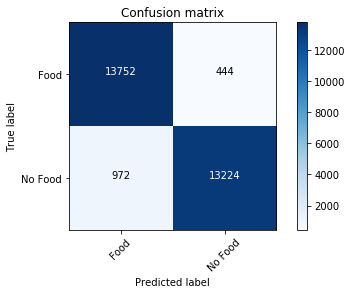



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.853374
Precision: 0.831626
Recall: 0.886165
F1 score: 0.858030
Cohens kappa: 0.706748
ROC AUC: 0.920298
F-measure = 0.8532
accuracy = 0.8534
Confusion matrix:
[[11649  2547]
 [ 1616 12580]]


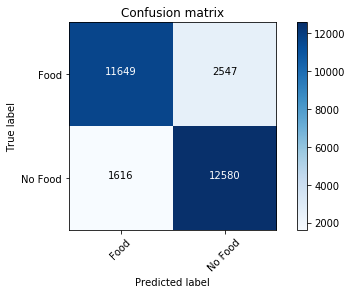



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.871372
Precision: 0.827616
Recall: 0.938152
F1 score: 0.879424
Cohens kappa: 0.742744
ROC AUC: 0.943603
F-measure = 0.8708
accuracy = 0.8714
Confusion matrix:
[[11422  2774]
 [  878 13318]]


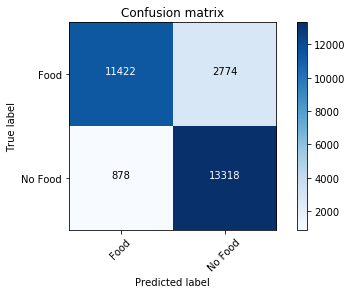



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.836433
Precision: 0.800075
Recall: 0.897013
F1 score: 0.845776
Cohens kappa: 0.672866
ROC AUC: 0.903890
F-measure = 0.8358
accuracy = 0.8364
Confusion matrix:
[[11014  3182]
 [ 1462 12734]]


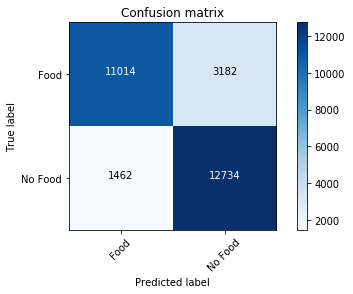



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.850416
Precision: 0.828372
Recall: 0.883981
F1 score: 0.855273
Cohens kappa: 0.700831
ROC AUC: 0.916367
F-measure = 0.8502
accuracy = 0.8504
Confusion matrix:
[[11596  2600]
 [ 1647 12549]]


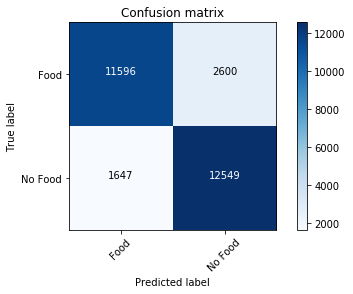



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.852881
Precision: 0.831601
Recall: 0.884968
F1 score: 0.857455
Cohens kappa: 0.705762
ROC AUC: 0.913082
F-measure = 0.8527
accuracy = 0.8529
Confusion matrix:
[[11652  2544]
 [ 1633 12563]]


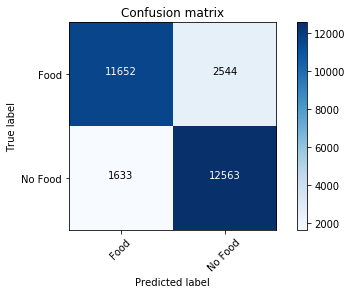



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.902156
Precision: 0.868894
Recall: 0.947239
F1 score: 0.906376
Cohens kappa: 0.804311
ROC AUC: 0.963451
F-measure = 0.9020
accuracy = 0.9022
Confusion matrix:
[[12167  2029]
 [  749 13447]]


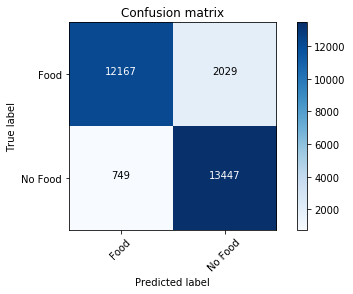



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.911137
Precision: 0.879709
Recall: 0.952522
F1 score: 0.914668
Cohens kappa: 0.822274
ROC AUC: 0.966653
F-measure = 0.9110
accuracy = 0.9111
Confusion matrix:
[[12347  1849]
 [  674 13522]]


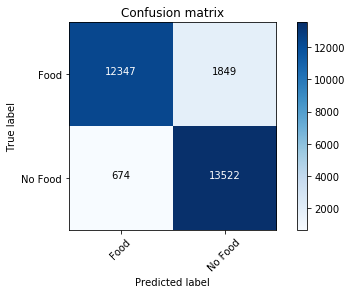



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.927937
Precision: 0.925897
Recall: 0.930332
F1 score: 0.928110
Cohens kappa: 0.855875
ROC AUC: 0.972452
F-measure = 0.9279
accuracy = 0.9279
Confusion matrix:
[[13139  1057]
 [  989 13207]]


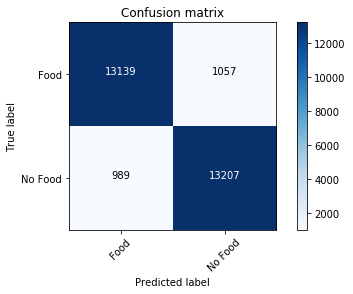



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.929945
Precision: 0.925776
Recall: 0.934841
F1 score: 0.930286
Cohens kappa: 0.859890
ROC AUC: 0.973734
F-measure = 0.9299
accuracy = 0.9299
Confusion matrix:
[[13132  1064]
 [  925 13271]]


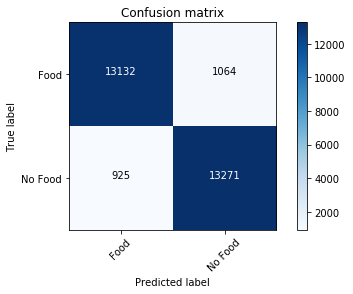



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.933784
Precision: 0.922359
Recall: 0.947309
F1 score: 0.934668
Cohens kappa: 0.867568
ROC AUC: 0.974984
F-measure = 0.9338
accuracy = 0.9338
Confusion matrix:
[[13064  1132]
 [  748 13448]]


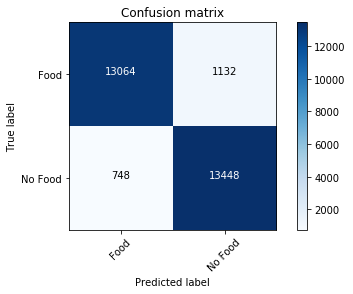



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.925719
Precision: 0.902819
Recall: 0.954142
F1 score: 0.927771
Cohens kappa: 0.851437
ROC AUC: 0.971680
F-measure = 0.9257
accuracy = 0.9257
Confusion matrix:
[[12738  1458]
 [  651 13545]]


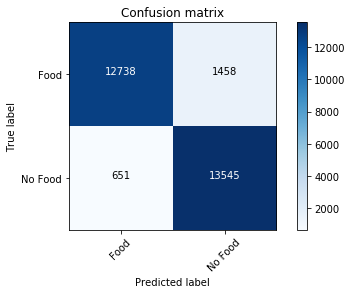



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.924803
Precision: 0.896822
Recall: 0.960059
F1 score: 0.927364
Cohens kappa: 0.849606
ROC AUC: 0.972657
F-measure = 0.9247
accuracy = 0.9248
Confusion matrix:
[[12628  1568]
 [  567 13629]]


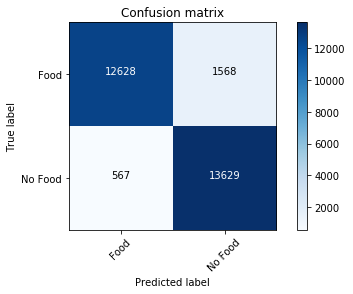



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.925190
Precision: 0.897838
Recall: 0.959566
F1 score: 0.927676
Cohens kappa: 0.850380
ROC AUC: 0.972545
F-measure = 0.9251
accuracy = 0.9252
Confusion matrix:
[[12646  1550]
 [  574 13622]]


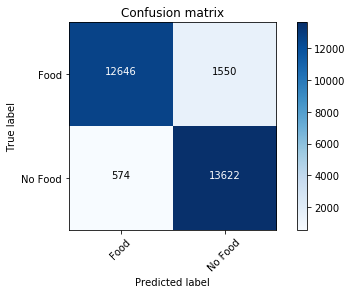



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.926388
Precision: 0.908214
Recall: 0.948648
F1 score: 0.927991
Cohens kappa: 0.852775
ROC AUC: 0.971244
F-measure = 0.9264
accuracy = 0.9264
Confusion matrix:
[[12835  1361]
 [  729 13467]]


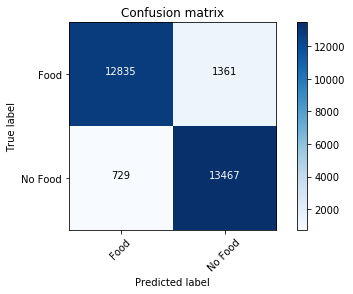



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.883136
Precision: 0.901461
Recall: 0.860313
F1 score: 0.880407
Cohens kappa: 0.766272
ROC AUC: 0.954677
F-measure = 0.8831
accuracy = 0.8831
Confusion matrix:
[[12861  1335]
 [ 1983 12213]]


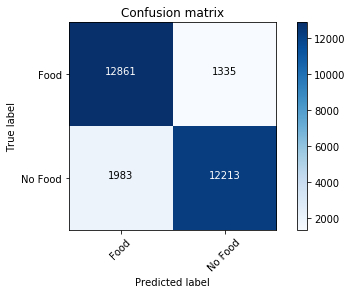



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.899901
Precision: 0.879174
Recall: 0.927233
F1 score: 0.902564
Cohens kappa: 0.799803
ROC AUC: 0.959009
F-measure = 0.8998
accuracy = 0.8999
Confusion matrix:
[[12387  1809]
 [ 1033 13163]]


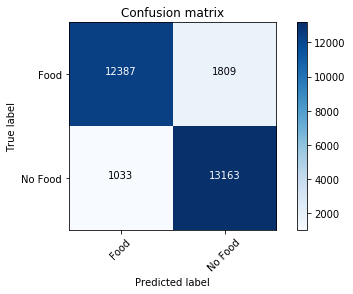



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.873204
Precision: 0.817246
Recall: 0.961398
F1 score: 0.883480
Cohens kappa: 0.746407
ROC AUC: 0.947448
F-measure = 0.8722
accuracy = 0.8732
Confusion matrix:
[[11144  3052]
 [  548 13648]]


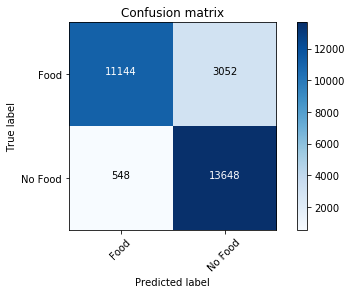



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.874014
Precision: 0.824126
Recall: 0.950972
F1 score: 0.883017
Cohens kappa: 0.748028
ROC AUC: 0.946835
F-measure = 0.8733
accuracy = 0.8740
Confusion matrix:
[[11315  2881]
 [  696 13500]]


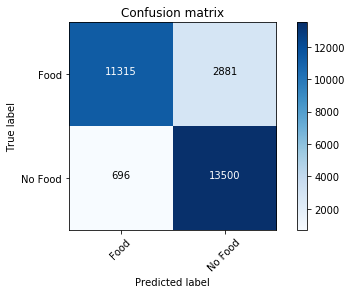



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.876162
Precision: 0.822854
Recall: 0.958721
F1 score: 0.885606
Cohens kappa: 0.752325
ROC AUC: 0.952604
F-measure = 0.8753
accuracy = 0.8762
Confusion matrix:
[[11266  2930]
 [  586 13610]]


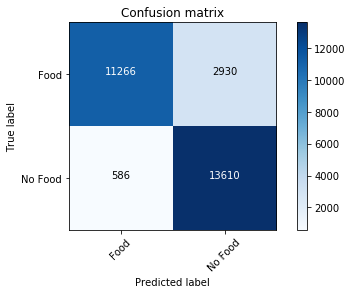



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.884122
Precision: 0.851127
Recall: 0.931107
F1 score: 0.889322
Cohens kappa: 0.768245
ROC AUC: 0.952516
F-measure = 0.8839
accuracy = 0.8841
Confusion matrix:
[[11884  2312]
 [  978 13218]]


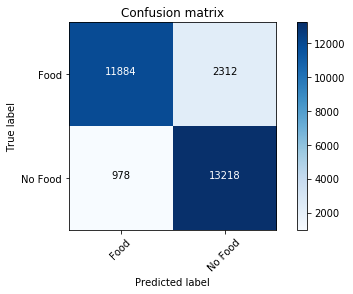



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.911524
Precision: 0.903899
Recall: 0.920964
F1 score: 0.912352
Cohens kappa: 0.823049
ROC AUC: 0.963906
F-measure = 0.9115
accuracy = 0.9115
Confusion matrix:
[[12806  1390]
 [ 1122 13074]]


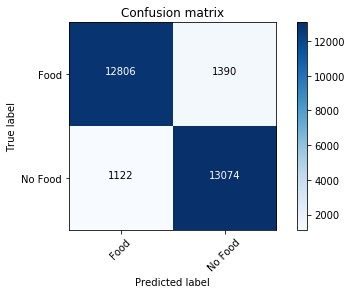



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.960024
Precision: 0.967098
Recall: 0.952451
F1 score: 0.959719
Cohens kappa: 0.920048
ROC AUC: 0.990128
F-measure = 0.9600
accuracy = 0.9600
Confusion matrix:
[[13736   460]
 [  675 13521]]


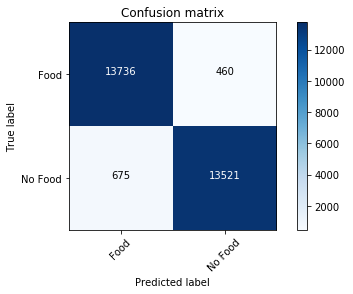



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.958263
Precision: 0.978451
Recall: 0.937165
F1 score: 0.957363
Cohens kappa: 0.916526
ROC AUC: 0.991163
F-measure = 0.9582
accuracy = 0.9583
Confusion matrix:
[[13903   293]
 [  892 13304]]


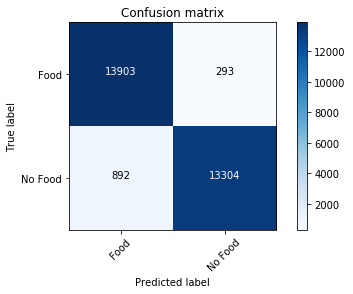



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.945618
Precision: 0.935555
Recall: 0.957171
F1 score: 0.946240
Cohens kappa: 0.891237
ROC AUC: 0.986856
F-measure = 0.9456
accuracy = 0.9456
Confusion matrix:
[[13260   936]
 [  608 13588]]


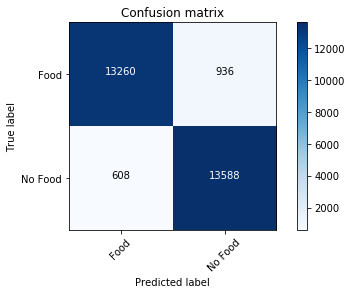



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.950303
Precision: 0.944881
Recall: 0.956396
F1 score: 0.950604
Cohens kappa: 0.900606
ROC AUC: 0.987502
F-measure = 0.9503
accuracy = 0.9503
Confusion matrix:
[[13404   792]
 [  619 13577]]


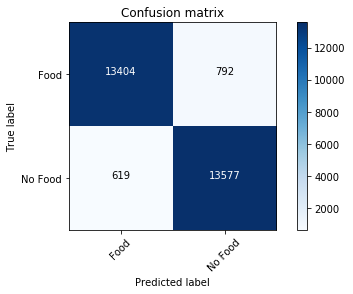



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.949915
Precision: 0.941091
Recall: 0.959918
F1 score: 0.950411
Cohens kappa: 0.899831
ROC AUC: 0.987318
F-measure = 0.9499
accuracy = 0.9499
Confusion matrix:
[[13343   853]
 [  569 13627]]


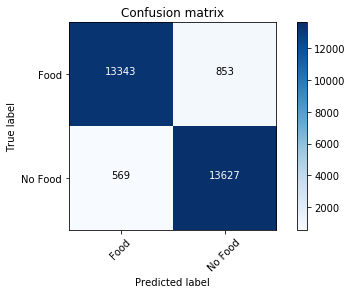



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.955128
Precision: 0.954744
Recall: 0.955551
F1 score: 0.955147
Cohens kappa: 0.910256
ROC AUC: 0.988763
F-measure = 0.9551
accuracy = 0.9551
Confusion matrix:
[[13553   643]
 [  631 13565]]


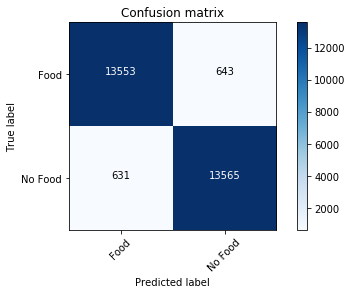



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.964039
Precision: 0.971377
Recall: 0.956255
F1 score: 0.963757
Cohens kappa: 0.928078
ROC AUC: 0.991362
F-measure = 0.9640
accuracy = 0.9640
Confusion matrix:
[[13796   400]
 [  621 13575]]


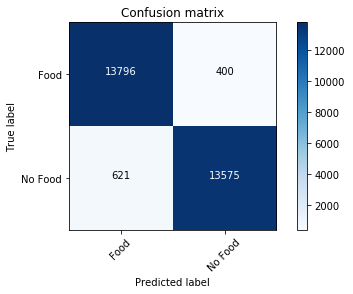



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.956291
Precision: 0.976883
Recall: 0.934700
F1 score: 0.955326
Cohens kappa: 0.912581
ROC AUC: 0.989602
F-measure = 0.9563
accuracy = 0.9563
Confusion matrix:
[[13882   314]
 [  927 13269]]


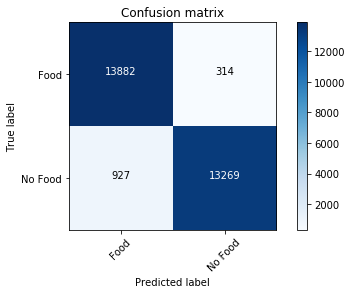



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.945583
Precision: 0.938875
Recall: 0.953226
F1 score: 0.945996
Cohens kappa: 0.891167
ROC AUC: 0.985802
F-measure = 0.9456
accuracy = 0.9456
Confusion matrix:
[[13315   881]
 [  664 13532]]


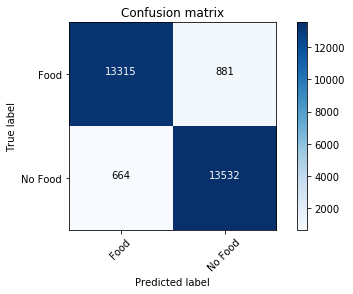



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.944703
Precision: 0.946275
Recall: 0.942942
F1 score: 0.944605
Cohens kappa: 0.889405
ROC AUC: 0.984707
F-measure = 0.9447
accuracy = 0.9447
Confusion matrix:
[[13436   760]
 [  810 13386]]


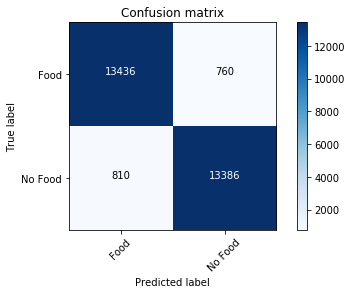



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.959883
Precision: 0.968429
Recall: 0.950761
F1 score: 0.959514
Cohens kappa: 0.919766
ROC AUC: 0.989816
F-measure = 0.9599
accuracy = 0.9599
Confusion matrix:
[[13756   440]
 [  699 13497]]


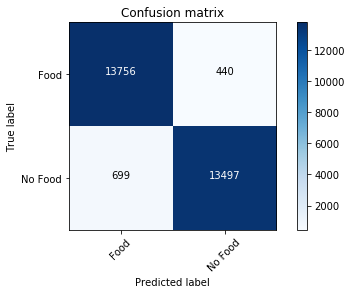



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.939420
Precision: 0.939110
Recall: 0.939772
F1 score: 0.939441
Cohens kappa: 0.878839
ROC AUC: 0.982090
F-measure = 0.9394
accuracy = 0.9394
Confusion matrix:
[[13331   865]
 [  855 13341]]


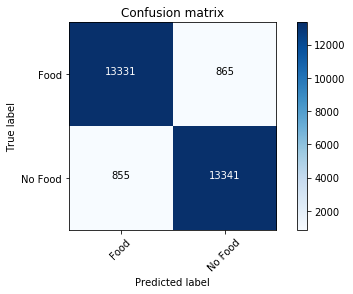



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.936813
Precision: 0.959674
Recall: 0.911947
F1 score: 0.935202
Cohens kappa: 0.873626
ROC AUC: 0.984207
F-measure = 0.9368
accuracy = 0.9368
Confusion matrix:
[[13652   544]
 [ 1250 12946]]


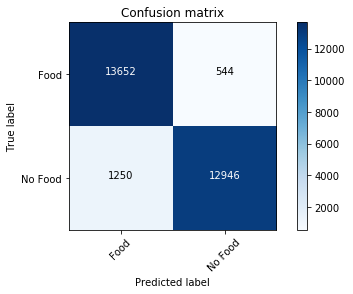



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.086433
Precision: 0.063948
Recall: 0.060651
F1 score: 0.062256
Cohens kappa: -0.827134
ROC AUC: 0.039939
F-measure = 0.0858
accuracy = 0.0864
Confusion matrix:
[[ 1593 12603]
 [13335   861]]


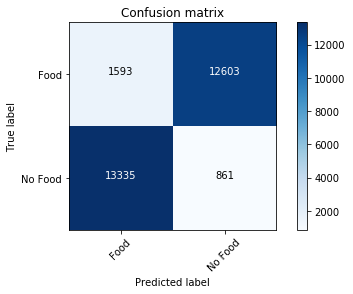



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.069597
Precision: 0.047943
Recall: 0.045647
F1 score: 0.046767
Cohens kappa: -0.860806
ROC AUC: 0.029066
F-measure = 0.0691
accuracy = 0.0696
Confusion matrix:
[[ 1328 12868]
 [13548   648]]


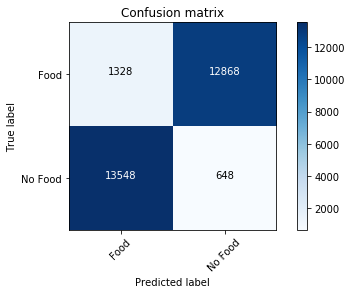



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.137363
Precision: 0.165801
Recall: 0.179910
F1 score: 0.172568
Cohens kappa: -0.725275
ROC AUC: 0.056677
F-measure = 0.1358
accuracy = 0.1374
Confusion matrix:
[[ 1346 12850]
 [11642  2554]]


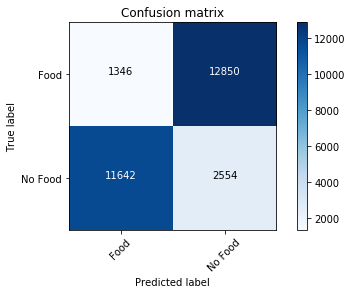



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.109045
Precision: 0.081448
Recall: 0.076078
F1 score: 0.078671
Cohens kappa: -0.781910
ROC AUC: 0.049105
F-measure = 0.1081
accuracy = 0.1090
Confusion matrix:
[[ 2016 12180]
 [13116  1080]]


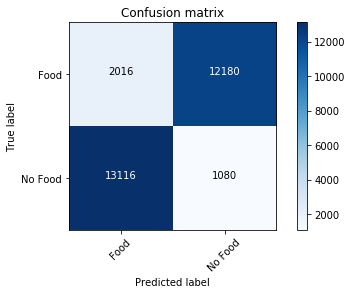



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.127677
Precision: 0.057069
Recall: 0.047971
F1 score: 0.052126
Cohens kappa: -0.744646
ROC AUC: 0.057374
F-measure = 0.1221
accuracy = 0.1277
Confusion matrix:
[[ 2944 11252]
 [13515   681]]


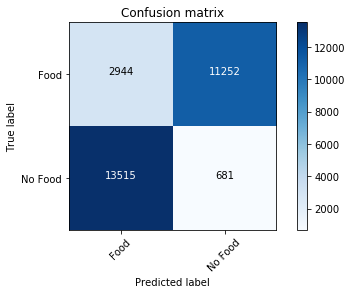



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.126796
Precision: 0.133458
Recall: 0.135883
F1 score: 0.134660
Cohens kappa: -0.746407
ROC AUC: 0.054328
F-measure = 0.1267
accuracy = 0.1268
Confusion matrix:
[[ 1671 12525]
 [12267  1929]]


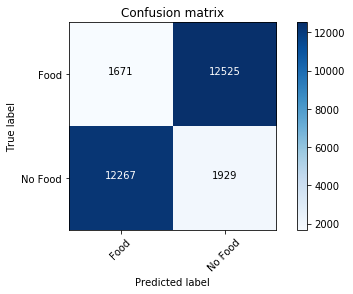



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.335306
Precision: 0.399553
Recall: 0.655114
F1 score: 0.496371
Cohens kappa: -0.329389
ROC AUC: 0.083821
F-measure = 0.2596
accuracy = 0.3353
Confusion matrix:
[[  220 13976]
 [ 4896  9300]]


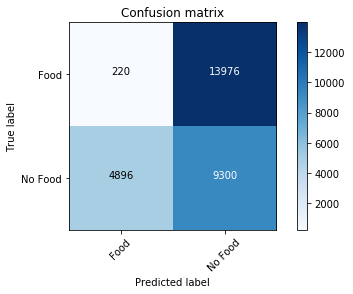



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.120210
Precision: 0.129170
Recall: 0.132291
F1 score: 0.130712
Cohens kappa: -0.759580
ROC AUC: 0.052118
F-measure = 0.1201
accuracy = 0.1202
Confusion matrix:
[[ 1535 12661]
 [12318  1878]]


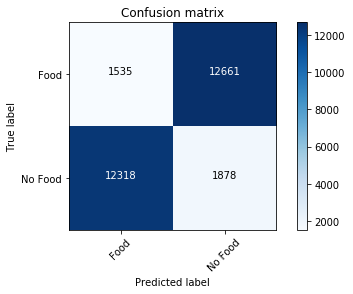



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.132220
Precision: 0.153458
Recall: 0.162863
F1 score: 0.158021
Cohens kappa: -0.735559
ROC AUC: 0.058719
F-measure = 0.1314
accuracy = 0.1322
Confusion matrix:
[[ 1442 12754]
 [11884  2312]]


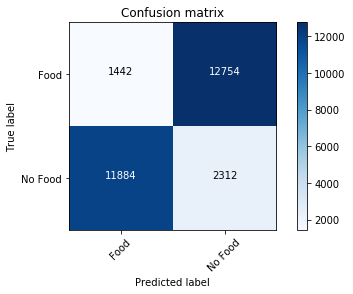



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.909622
Precision: 0.909219
Recall: 0.910116
F1 score: 0.909667
Cohens kappa: 0.819245
ROC AUC: 0.962775
F-measure = 0.9096
accuracy = 0.9096
Confusion matrix:
[[12906  1290]
 [ 1276 12920]]


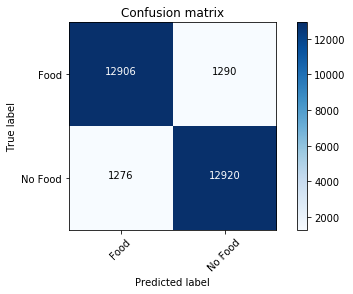



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.872429
Precision: 0.813211
Recall: 0.966963
F1 score: 0.883447
Cohens kappa: 0.744858
ROC AUC: 0.954904
F-measure = 0.8713
accuracy = 0.8724
Confusion matrix:
[[11043  3153]
 [  469 13727]]


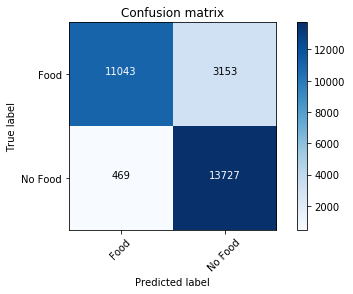



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.935440
Precision: 0.959899
Recall: 0.908848
F1 score: 0.933676
Cohens kappa: 0.870879
ROC AUC: 0.981255
F-measure = 0.9354
accuracy = 0.9354
Confusion matrix:
[[13657   539]
 [ 1294 12902]]


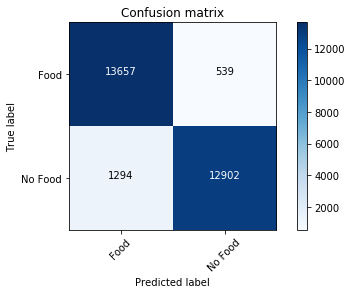



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.904163
Precision: 0.885196
Recall: 0.928783
F1 score: 0.906466
Cohens kappa: 0.808326
ROC AUC: 0.968002
F-measure = 0.9041
accuracy = 0.9042
Confusion matrix:
[[12486  1710]
 [ 1011 13185]]


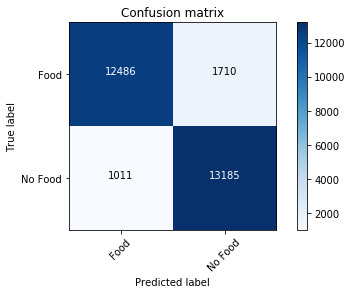



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.803466
Precision: 0.835149
Recall: 0.756199
F1 score: 0.793715
Cohens kappa: 0.606932
ROC AUC: 0.865512
F-measure = 0.8030
accuracy = 0.8035
Confusion matrix:
[[12077  2119]
 [ 3461 10735]]


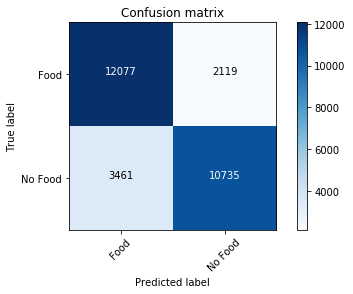



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.794801
Precision: 0.926432
Recall: 0.640462
F1 score: 0.757351
Cohens kappa: 0.589603
ROC AUC: 0.883953
F-measure = 0.7898
accuracy = 0.7948
Confusion matrix:
[[13474   722]
 [ 5104  9092]]


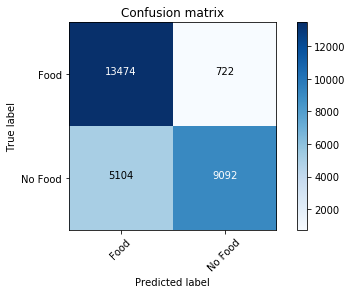



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.186813
Precision: 0.188568
Recall: 0.189631
F1 score: 0.189098
Cohens kappa: -0.626374
ROC AUC: 0.119644
F-measure = 0.1868
accuracy = 0.1868
Confusion matrix:
[[ 2612 11584]
 [11504  2692]]


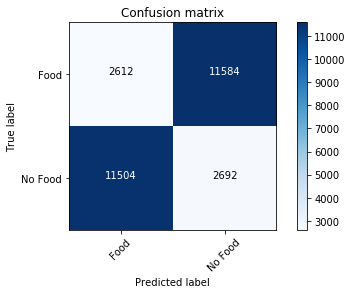



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.228550
Precision: 0.092782
Recall: 0.061848
F1 score: 0.074221
Cohens kappa: -0.542899
ROC AUC: 0.151554
F-measure = 0.2065
accuracy = 0.2286
Confusion matrix:
[[ 5611  8585]
 [13318   878]]


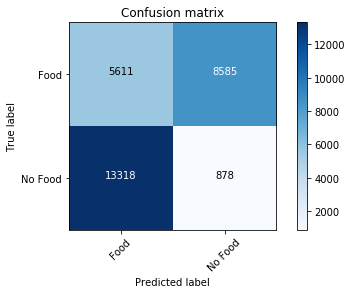



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.186214
Precision: 0.162103
Recall: 0.150535
F1 score: 0.156105
Cohens kappa: -0.627571
ROC AUC: 0.125425
F-measure = 0.1852
accuracy = 0.1862
Confusion matrix:
[[ 3150 11046]
 [12059  2137]]


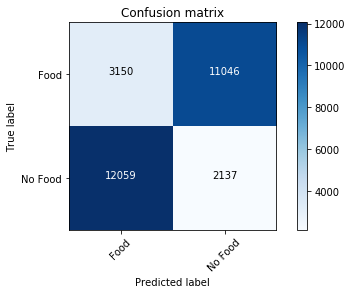



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.178360
Precision: 0.153461
Recall: 0.142434
F1 score: 0.147742
Cohens kappa: -0.643280
ROC AUC: 0.123378
F-measure = 0.1773
accuracy = 0.1784
Confusion matrix:
[[ 3042 11154]
 [12174  2022]]


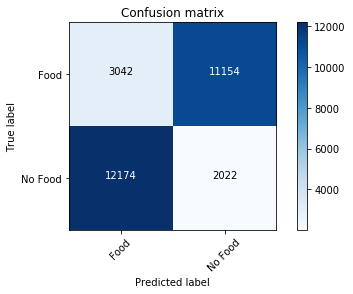



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.185440
Precision: 0.175779
Recall: 0.170541
F1 score: 0.173120
Cohens kappa: -0.629121
ROC AUC: 0.126730
F-measure = 0.1853
accuracy = 0.1854
Confusion matrix:
[[ 2844 11352]
 [11775  2421]]


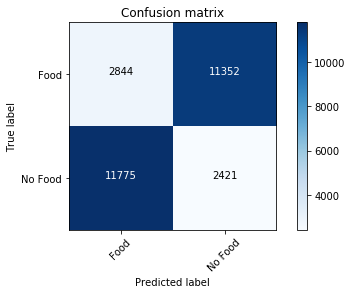



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.203719
Precision: 0.091174
Recall: 0.066075
F1 score: 0.076621
Cohens kappa: -0.592561
ROC AUC: 0.116796
F-measure = 0.1883
accuracy = 0.2037
Confusion matrix:
[[ 4846  9350]
 [13258   938]]


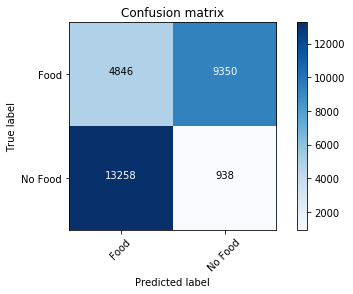



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.196534
Precision: 0.164851
Recall: 0.149267
F1 score: 0.156673
Cohens kappa: -0.606932
ROC AUC: 0.134488
F-measure = 0.1947
accuracy = 0.1965
Confusion matrix:
[[ 3461 10735]
 [12077  2119]]


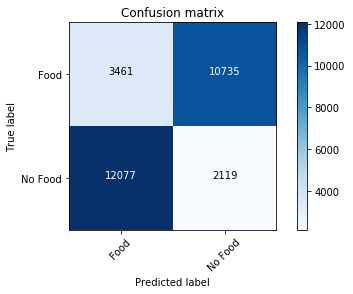



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.205199
Precision: 0.073568
Recall: 0.050859
F1 score: 0.060142
Cohens kappa: -0.589603
ROC AUC: 0.116047
F-measure = 0.1858
accuracy = 0.2052
Confusion matrix:
[[ 5104  9092]
 [13474   722]]


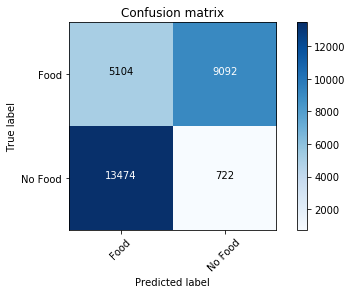



##################################################################################################




In [29]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [30]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [31]:
gc.collect()

56595

### Test Trial 8

In [32]:
x, y, xt, yt, xv, yv, s, yb, ytb, yvb = FastDatasetLoading_16bit_train_test_validation_categorical_shuffle_complex(TRFD, TRNFD, 0, 1)

print(x.shape)
print(y.shape)
print(xt.shape)
print(yt.shape)
print(xv.shape)
print(yv.shape)
print(yb.shape)
print(ytb.shape)
print(yvb.shape)

Starting stage 1 of 10:
Querying food exposure images...
16224 food images are available, 0 are Skipped...
Starting stage 2 of 10:
Querying non food exposure images...
16224 non food images are available, 0 are Skipped...
Starting stage 3 of 10:
Balancing dataset classes...
Dataset classes balanced: 16224 images each
Starting stage 4 of 10:
Initializing loading procedure...
0 training images will be loaded: 0 for food, 0 for non food.
0 testing images will be loaded: 0 for food, 0 for non food.
32448 validation images will be loaded: 16224 for food, 16224 for non food.
Loading Procedure Initialized Succesfully.
Starting stage 5 of 10:
Loading and Normalizing food exposure images...
1000 non images have been loaded so far...
2000 non images have been loaded so far...
3000 non images have been loaded so far...
4000 non images have been loaded so far...
5000 non images have been loaded so far...
6000 non images have been loaded so far...
7000 non images have been loaded so far...
8000 non

In [33]:
mobile_v1 = MOBILENET(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v3 = MOBILENET_R3(trainable_first = -1, trainable_last = -1, summary = False)
mobile_v5 = MOBILENET_R5(trainable_first = -1, trainable_last = -1, summary = False)
model_v1 = Model_224p_adam_categorical_Simple(summary = False)
model_v2 = Model_224p_adam_categorical_Simple_v2(summary = False)

All Parameters will be Trainable
All Parameters will be Trainable
All Parameters will be Trainable


mobilenet complex gen full extended v24 final Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 final Weights V24.h5
Accuracy: 0.963665
Precision: 0.975716
Recall: 0.950999
F1 score: 0.963199
Cohens kappa: 0.927330
ROC AUC: 0.991539
F-measure = 0.9637
accuracy = 0.9637
Confusion matrix:
[[15840   384]
 [  795 15429]]


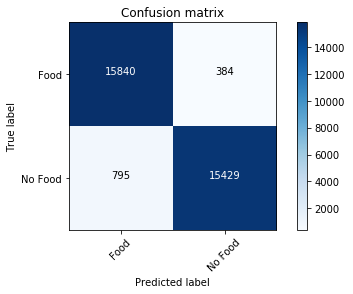



##################################################################################################


mobilenet complex gen full extended v24 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24 Weights V24.h5
Accuracy: 0.959659
Precision: 0.987005
Recall: 0.931583
F1 score: 0.958493
Cohens kappa: 0.919317
ROC AUC: 0.992264
F-measure = 0.9596
accuracy = 0.9597
Confusion matrix:
[[16025   199]
 [ 1110 15114]]


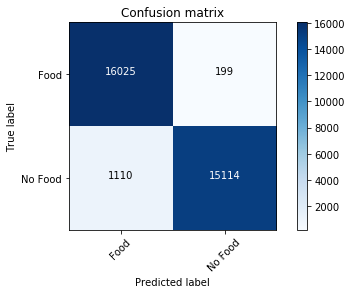



##################################################################################################


mobilenet complex gen full extended v24.0.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.0.1 Weights V24.h5
Accuracy: 0.957501
Precision: 0.960082
Recall: 0.954697
F1 score: 0.957382
Cohens kappa: 0.915002
ROC AUC: 0.989446
F-measure = 0.9575
accuracy = 0.9575
Confusion matrix:
[[15580   644]
 [  735 15489]]


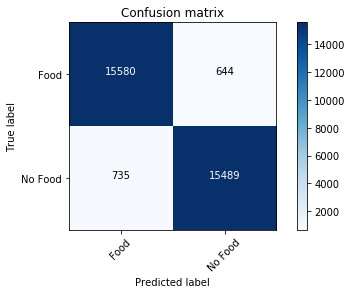



##################################################################################################


mobilenet complex gen full extended v24.1 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.1 Weights V24.h5
Accuracy: 0.947886
Precision: 0.935511
Recall: 0.962093
F1 score: 0.948616
Cohens kappa: 0.895772
ROC AUC: 0.987910
F-measure = 0.9479
accuracy = 0.9479
Confusion matrix:
[[15148  1076]
 [  615 15609]]


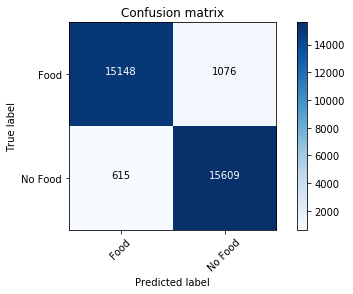



##################################################################################################


mobilenet complex gen full extended v24.10 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.10 Weights V24.h5
Accuracy: 0.960583
Precision: 0.959083
Recall: 0.962216
F1 score: 0.960647
Cohens kappa: 0.921166
ROC AUC: 0.989943
F-measure = 0.9606
accuracy = 0.9606
Confusion matrix:
[[15558   666]
 [  613 15611]]


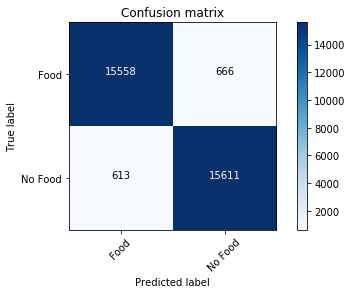



##################################################################################################


mobilenet complex gen full extended v24.2 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.2 Weights V24.h5
Accuracy: 0.949827
Precision: 0.937006
Recall: 0.964497
F1 score: 0.950553
Cohens kappa: 0.899655
ROC AUC: 0.988667
F-measure = 0.9498
accuracy = 0.9498
Confusion matrix:
[[15172  1052]
 [  576 15648]]


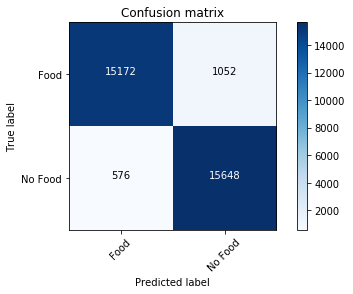



##################################################################################################


mobilenet complex gen full extended v24.3 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.3 Weights V24.h5
Accuracy: 0.951368
Precision: 0.935426
Recall: 0.969675
F1 score: 0.952243
Cohens kappa: 0.902737
ROC AUC: 0.988782
F-measure = 0.9514
accuracy = 0.9514
Confusion matrix:
[[15138  1086]
 [  492 15732]]


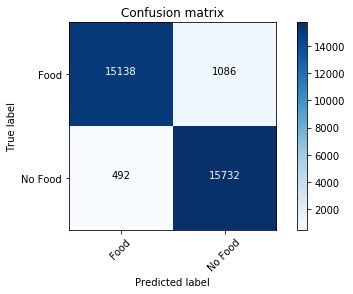



##################################################################################################


mobilenet complex gen full extended v24.5 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.5 Weights V24.h5
Accuracy: 0.951060
Precision: 0.976743
Recall: 0.924125
F1 score: 0.949705
Cohens kappa: 0.902120
ROC AUC: 0.988071
F-measure = 0.9510
accuracy = 0.9511
Confusion matrix:
[[15867   357]
 [ 1231 14993]]


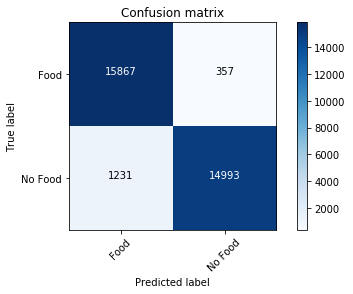



##################################################################################################


mobilenet complex gen full extended v24.6 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.6 Weights V24.h5
Accuracy: 0.955590
Precision: 0.941732
Recall: 0.971277
F1 score: 0.956276
Cohens kappa: 0.911181
ROC AUC: 0.989333
F-measure = 0.9556
accuracy = 0.9556
Confusion matrix:
[[15249   975]
 [  466 15758]]


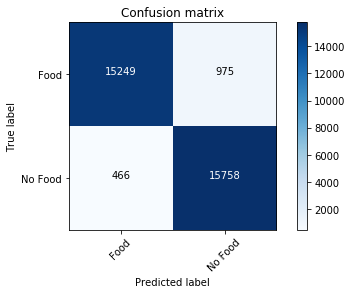



##################################################################################################


mobilenet complex gen full extended v24.7 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.7 Weights V24.h5
Accuracy: 0.949365
Precision: 0.936897
Recall: 0.963634
F1 score: 0.950077
Cohens kappa: 0.898730
ROC AUC: 0.987589
F-measure = 0.9494
accuracy = 0.9494
Confusion matrix:
[[15171  1053]
 [  590 15634]]


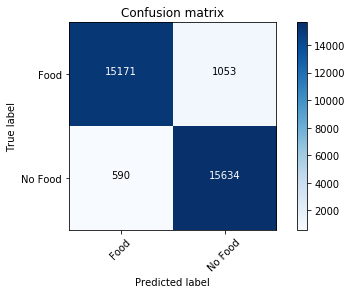



##################################################################################################


mobilenet complex gen full extended v24.8 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.8 Weights V24.h5
Accuracy: 0.955036
Precision: 0.946531
Recall: 0.964559
F1 score: 0.955460
Cohens kappa: 0.910071
ROC AUC: 0.988392
F-measure = 0.9550
accuracy = 0.9550
Confusion matrix:
[[15340   884]
 [  575 15649]]


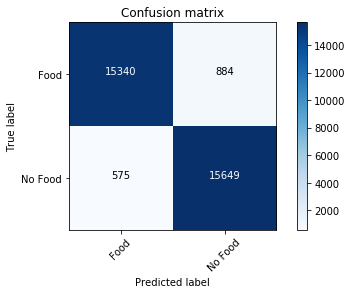



##################################################################################################


mobilenet complex gen full extended v24.9 Weights V24.h5
D:\Trained Models\Model 1\mobilenet complex gen full extended v24.9 Weights V24.h5
Accuracy: 0.957779
Precision: 0.951709
Recall: 0.964497
F1 score: 0.958060
Cohens kappa: 0.915557
ROC AUC: 0.990111
F-measure = 0.9578
accuracy = 0.9578
Confusion matrix:
[[15430   794]
 [  576 15648]]


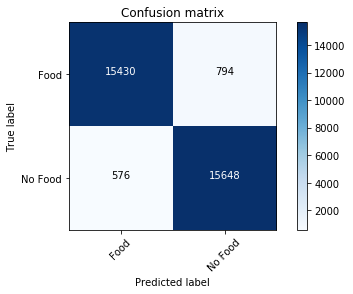



##################################################################################################


mobilenet R5 complex gen full v22.1 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.1 Weights V22.h5
Accuracy: 0.907514
Precision: 0.893004
Recall: 0.925974
F1 score: 0.909190
Cohens kappa: 0.815027
ROC AUC: 0.962422
F-measure = 0.9075
accuracy = 0.9075
Confusion matrix:
[[14424  1800]
 [ 1201 15023]]


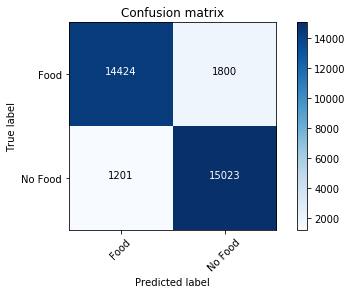



##################################################################################################


mobilenet R5 complex gen full v22.10 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.10 Weights V22.h5
Accuracy: 0.947454
Precision: 0.951827
Recall: 0.942616
F1 score: 0.947199
Cohens kappa: 0.894909
ROC AUC: 0.984337
F-measure = 0.9475
accuracy = 0.9475
Confusion matrix:
[[15450   774]
 [  931 15293]]


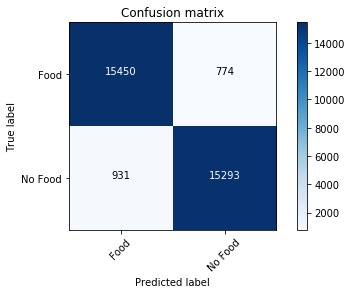



##################################################################################################


mobilenet R5 complex gen full v22.11 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.11 Weights V22.h5
Accuracy: 0.945297
Precision: 0.941838
Recall: 0.949211
F1 score: 0.945510
Cohens kappa: 0.890594
ROC AUC: 0.984231
F-measure = 0.9453
accuracy = 0.9453
Confusion matrix:
[[15273   951]
 [  824 15400]]


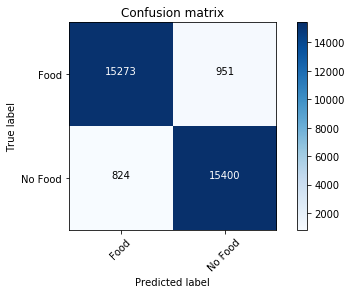



##################################################################################################


mobilenet R5 complex gen full v22.2 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.2 Weights V22.h5
Accuracy: 0.912784
Precision: 0.907608
Recall: 0.919132
F1 score: 0.913334
Cohens kappa: 0.825567
ROC AUC: 0.962923
F-measure = 0.9128
accuracy = 0.9128
Confusion matrix:
[[14706  1518]
 [ 1312 14912]]


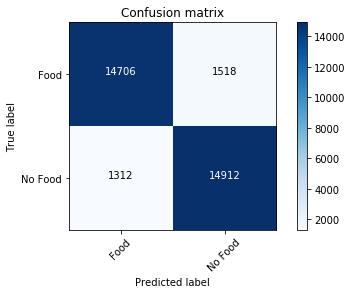



##################################################################################################


mobilenet R5 complex gen full v22.3 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.3 Weights V22.h5
Accuracy: 0.885447
Precision: 0.834573
Recall: 0.961477
F1 score: 0.893541
Cohens kappa: 0.770895
ROC AUC: 0.957647
F-measure = 0.8848
accuracy = 0.8854
Confusion matrix:
[[13132  3092]
 [  625 15599]]


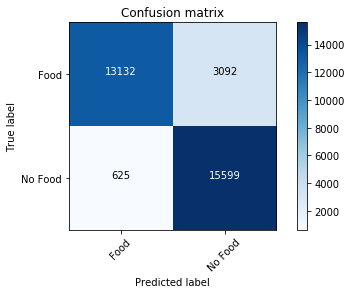



##################################################################################################


mobilenet R5 complex gen full v22.4 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.4 Weights V22.h5
Accuracy: 0.936976
Precision: 0.969783
Recall: 0.902059
F1 score: 0.934696
Cohens kappa: 0.873952
ROC AUC: 0.981296
F-measure = 0.9369
accuracy = 0.9370
Confusion matrix:
[[15768   456]
 [ 1589 14635]]


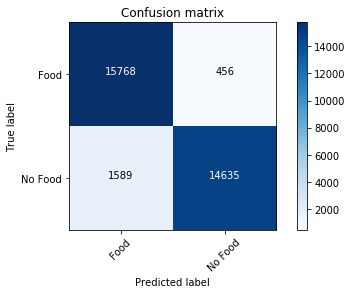



##################################################################################################


mobilenet R5 complex gen full v22.5 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.5 Weights V22.h5
Accuracy: 0.916328
Precision: 0.888569
Recall: 0.952046
F1 score: 0.919213
Cohens kappa: 0.832655
ROC AUC: 0.975545
F-measure = 0.9162
accuracy = 0.9163
Confusion matrix:
[[14287  1937]
 [  778 15446]]


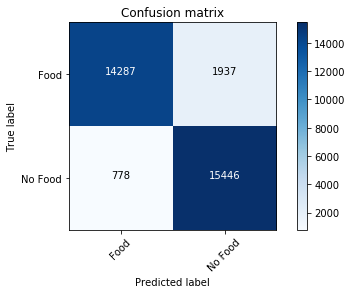



##################################################################################################


mobilenet R5 complex gen full v22.6 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.6 Weights V22.h5
Accuracy: 0.930658
Precision: 0.919539
Recall: 0.943910
F1 score: 0.931565
Cohens kappa: 0.861317
ROC AUC: 0.979136
F-measure = 0.9306
accuracy = 0.9307
Confusion matrix:
[[14884  1340]
 [  910 15314]]


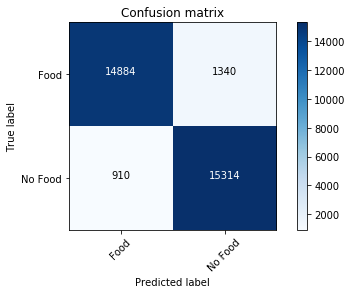



##################################################################################################


mobilenet R5 complex gen full v22.8 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.8 Weights V22.h5
Accuracy: 0.948595
Precision: 0.970216
Recall: 0.925604
F1 score: 0.947385
Cohens kappa: 0.897189
ROC AUC: 0.985841
F-measure = 0.9486
accuracy = 0.9486
Confusion matrix:
[[15763   461]
 [ 1207 15017]]


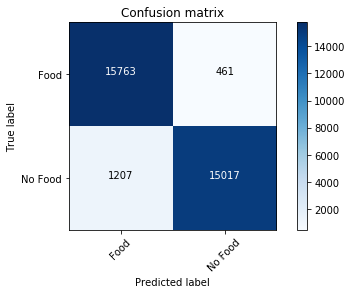



##################################################################################################


mobilenet R5 complex gen full v22.9 Weights V22.h5
D:\Trained Models\Model 1\mobilenet R5 complex gen full v22.9 Weights V22.h5
Accuracy: 0.952478
Precision: 0.967163
Recall: 0.936760
F1 score: 0.951719
Cohens kappa: 0.904956
ROC AUC: 0.985931
F-measure = 0.9525
accuracy = 0.9525
Confusion matrix:
[[15708   516]
 [ 1026 15198]]


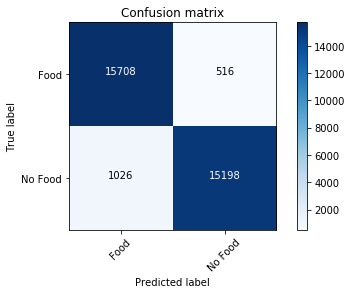



##################################################################################################


mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 extended v10.1 Weights V10.h5
Accuracy: 0.851023
Precision: 0.826286
Recall: 0.888930
F1 score: 0.856464
Cohens kappa: 0.702046
ROC AUC: 0.917870
F-measure = 0.8508
accuracy = 0.8510
Confusion matrix:
[[13192  3032]
 [ 1802 14422]]


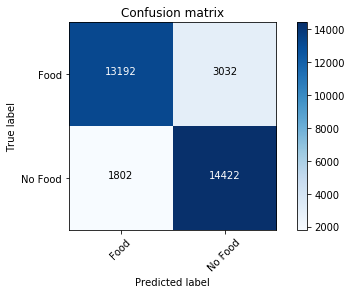



##################################################################################################


mobilenet complex gen full comp 43 v10 Weights V10.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v10 Weights V10.h5
Accuracy: 0.871363
Precision: 0.825887
Recall: 0.941137
F1 score: 0.879753
Cohens kappa: 0.742727
ROC AUC: 0.943800
F-measure = 0.8707
accuracy = 0.8714
Confusion matrix:
[[13005  3219]
 [  955 15269]]


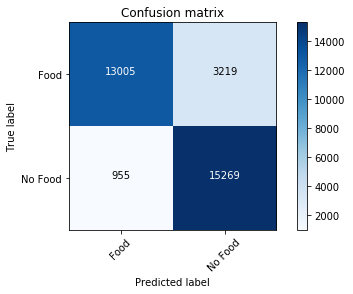



##################################################################################################


mobilenet complex gen full comp 43 v12 Weights V12.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v12 Weights V12.h5
Accuracy: 0.836569
Precision: 0.798698
Recall: 0.899963
F1 score: 0.846312
Cohens kappa: 0.673139
ROC AUC: 0.901976
F-measure = 0.8359
accuracy = 0.8366
Confusion matrix:
[[12544  3680]
 [ 1623 14601]]


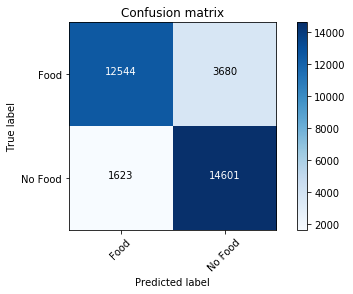



##################################################################################################


mobilenet complex gen full comp 43 v13 Weights V13.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v13 Weights V13.h5
Accuracy: 0.845938
Precision: 0.823394
Recall: 0.880794
F1 score: 0.851127
Cohens kappa: 0.691876
ROC AUC: 0.913634
F-measure = 0.8458
accuracy = 0.8459
Confusion matrix:
[[13159  3065]
 [ 1934 14290]]


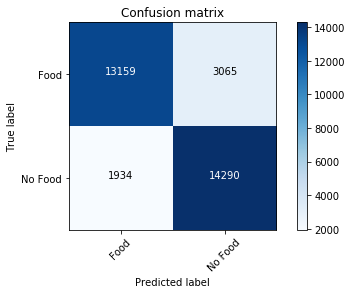



##################################################################################################


mobilenet complex gen full comp 43 v14 Weights V14.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v14 Weights V14.h5
Accuracy: 0.849020
Precision: 0.826425
Recall: 0.883629
F1 score: 0.854070
Cohens kappa: 0.698040
ROC AUC: 0.911001
F-measure = 0.8488
accuracy = 0.8490
Confusion matrix:
[[13213  3011]
 [ 1888 14336]]


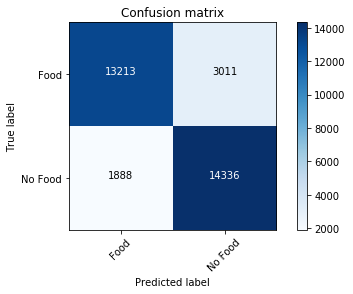



##################################################################################################


mobilenet complex gen full comp 43 v15 Weights V15.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v15 Weights V15.h5
Accuracy: 0.903785
Precision: 0.870322
Recall: 0.948964
F1 score: 0.907944
Cohens kappa: 0.807569
ROC AUC: 0.964147
F-measure = 0.9036
accuracy = 0.9038
Confusion matrix:
[[13930  2294]
 [  828 15396]]


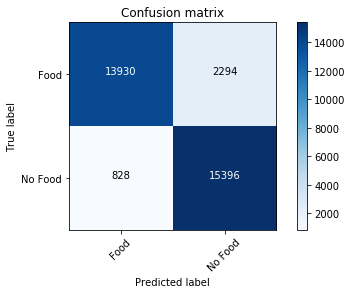



##################################################################################################


mobilenet complex gen full comp 43 v16 Weights V16.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v16 Weights V16.h5
Accuracy: 0.907698
Precision: 0.877002
Recall: 0.948410
F1 score: 0.911309
Cohens kappa: 0.815397
ROC AUC: 0.965129
F-measure = 0.9075
accuracy = 0.9077
Confusion matrix:
[[14066  2158]
 [  837 15387]]


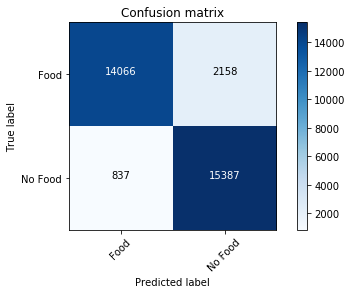



##################################################################################################


mobilenet complex gen full comp 43 v17 Weights V17.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v17 Weights V17.h5
Accuracy: 0.930134
Precision: 0.927893
Recall: 0.932754
F1 score: 0.930317
Cohens kappa: 0.860269
ROC AUC: 0.973036
F-measure = 0.9301
accuracy = 0.9301
Confusion matrix:
[[15048  1176]
 [ 1091 15133]]


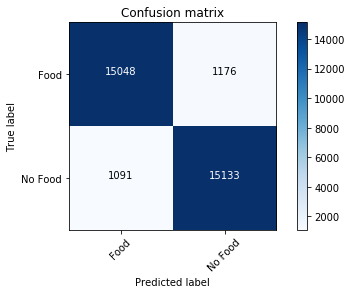



##################################################################################################


mobilenet complex gen full comp 43 v18 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18 Weights V18.h5
Accuracy: 0.932754
Precision: 0.926964
Recall: 0.939534
F1 score: 0.933207
Cohens kappa: 0.865508
ROC AUC: 0.974415
F-measure = 0.9328
accuracy = 0.9328
Confusion matrix:
[[15023  1201]
 [  981 15243]]


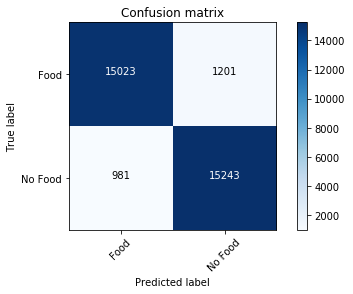



##################################################################################################


mobilenet complex gen full comp 43 v18.1 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.1 Weights V18.h5
Accuracy: 0.935065
Precision: 0.923908
Recall: 0.948225
F1 score: 0.935909
Cohens kappa: 0.870131
ROC AUC: 0.975032
F-measure = 0.9351
accuracy = 0.9351
Confusion matrix:
[[14957  1267]
 [  840 15384]]


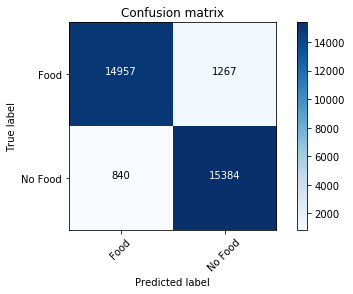



##################################################################################################


mobilenet complex gen full comp 43 v18.2 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.2 Weights V18.h5
Accuracy: 0.925481
Precision: 0.903826
Recall: 0.952293
F1 score: 0.927427
Cohens kappa: 0.850962
ROC AUC: 0.970480
F-measure = 0.9254
accuracy = 0.9255
Confusion matrix:
[[14580  1644]
 [  774 15450]]


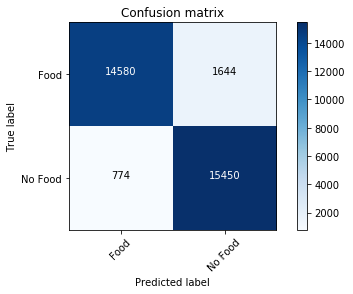



##################################################################################################


mobilenet complex gen full comp 43 v18.3 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.3 Weights V18.h5
Accuracy: 0.926282
Precision: 0.899399
Recall: 0.959936
F1 score: 0.928682
Cohens kappa: 0.852564
ROC AUC: 0.972286
F-measure = 0.9262
accuracy = 0.9263
Confusion matrix:
[[14482  1742]
 [  650 15574]]


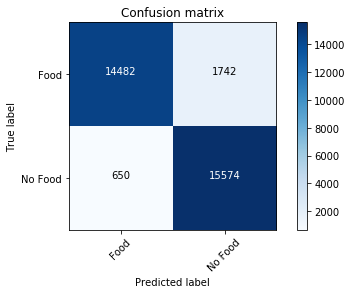



##################################################################################################


mobilenet complex gen full comp 43 v18.4 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.4 Weights V18.h5
Accuracy: 0.926159
Precision: 0.899192
Recall: 0.959936
F1 score: 0.928571
Cohens kappa: 0.852318
ROC AUC: 0.972869
F-measure = 0.9261
accuracy = 0.9262
Confusion matrix:
[[14478  1746]
 [  650 15574]]


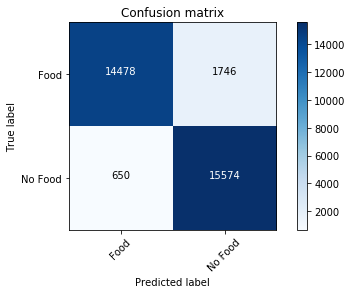



##################################################################################################


mobilenet complex gen full comp 43 v18.5 Weights V18.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp 43 v18.5 Weights V18.h5
Accuracy: 0.926097
Precision: 0.907366
Recall: 0.949088
F1 score: 0.927758
Cohens kappa: 0.852194
ROC AUC: 0.971330
F-measure = 0.9261
accuracy = 0.9261
Confusion matrix:
[[14652  1572]
 [  826 15398]]


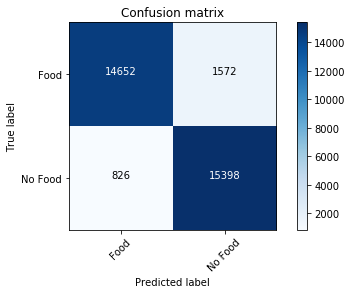



##################################################################################################


mobilenet complex gen full comp rms v19 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19 Weights V19.h5
Accuracy: 0.883568
Precision: 0.897890
Recall: 0.865570
F1 score: 0.881434
Cohens kappa: 0.767135
ROC AUC: 0.954292
F-measure = 0.8835
accuracy = 0.8836
Confusion matrix:
[[14627  1597]
 [ 2181 14043]]


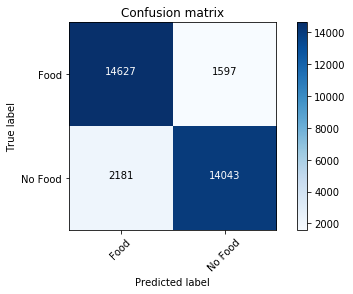



##################################################################################################


mobilenet complex gen full comp rms v19.1 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.1 Weights V19.h5
Accuracy: 0.904617
Precision: 0.884046
Recall: 0.931398
F1 score: 0.907104
Cohens kappa: 0.809233
ROC AUC: 0.960661
F-measure = 0.9045
accuracy = 0.9046
Confusion matrix:
[[14242  1982]
 [ 1113 15111]]


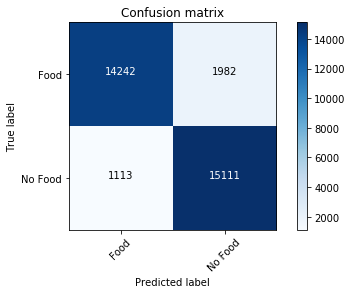



##################################################################################################


mobilenet complex gen full comp rms v19.2 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.2 Weights V19.h5
Accuracy: 0.871672
Precision: 0.815113
Recall: 0.961415
F1 score: 0.882240
Cohens kappa: 0.743343
ROC AUC: 0.948171
F-measure = 0.8706
accuracy = 0.8717
Confusion matrix:
[[12686  3538]
 [  626 15598]]


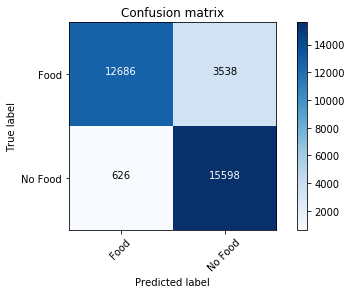



##################################################################################################


mobilenet complex gen full comp rms v19.3 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.3 Weights V19.h5
Accuracy: 0.871179
Precision: 0.822619
Recall: 0.946437
F1 score: 0.880195
Cohens kappa: 0.742357
ROC AUC: 0.945839
F-measure = 0.8704
accuracy = 0.8712
Confusion matrix:
[[12913  3311]
 [  869 15355]]


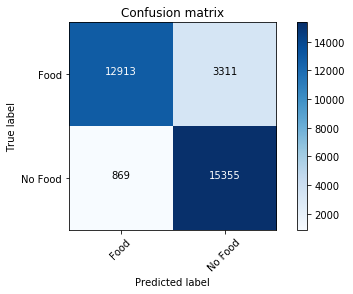



##################################################################################################


mobilenet complex gen full comp rms v19.4 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.4 Weights V19.h5
Accuracy: 0.875801
Precision: 0.822456
Recall: 0.958518
F1 score: 0.885290
Cohens kappa: 0.751603
ROC AUC: 0.952017
F-measure = 0.8749
accuracy = 0.8758
Confusion matrix:
[[12867  3357]
 [  673 15551]]


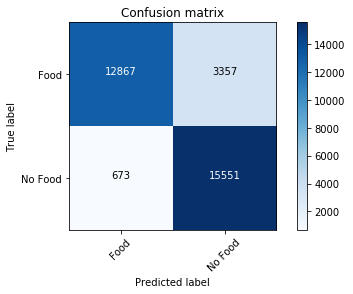



##################################################################################################


mobilenet complex gen full comp rms v19.5 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.5 Weights V19.h5
Accuracy: 0.884615
Precision: 0.852065
Recall: 0.930843
F1 score: 0.889714
Cohens kappa: 0.769231
ROC AUC: 0.952196
F-measure = 0.8844
accuracy = 0.8846
Confusion matrix:
[[13602  2622]
 [ 1122 15102]]


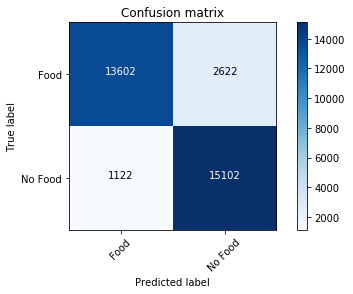



##################################################################################################


mobilenet complex gen full comp rms v19.8 Weights V19.h5
D:\Trained Models\Model 2\mobilenet complex gen full comp rms v19.8 Weights V19.h5
Accuracy: 0.912660
Precision: 0.904239
Recall: 0.923077
F1 score: 0.913561
Cohens kappa: 0.825321
ROC AUC: 0.964568
F-measure = 0.9127
accuracy = 0.9127
Confusion matrix:
[[14638  1586]
 [ 1248 14976]]


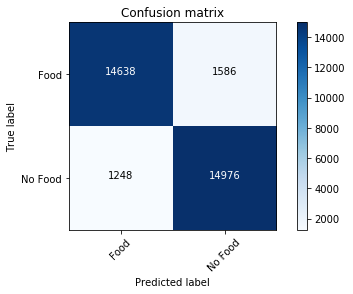



##################################################################################################


mobilenet complex gen full extended v23 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23 Weights V23.h5
Accuracy: 0.957625
Precision: 0.964467
Recall: 0.950259
F1 score: 0.957310
Cohens kappa: 0.915249
ROC AUC: 0.989428
F-measure = 0.9576
accuracy = 0.9576
Confusion matrix:
[[15656   568]
 [  807 15417]]


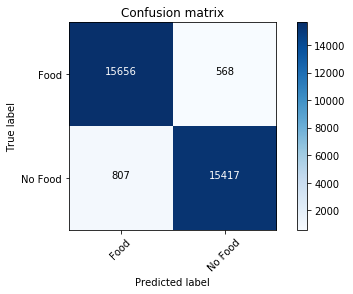



##################################################################################################


mobilenet complex gen full extended v23.1 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.1 Weights V23.h5
Accuracy: 0.956361
Precision: 0.978233
Recall: 0.933494
F1 score: 0.955340
Cohens kappa: 0.912722
ROC AUC: 0.990260
F-measure = 0.9563
accuracy = 0.9564
Confusion matrix:
[[15887   337]
 [ 1079 15145]]


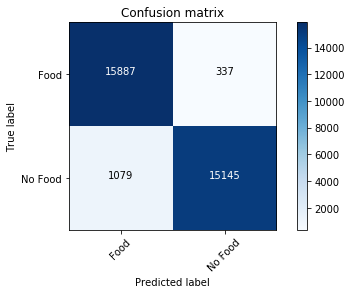



##################################################################################################


mobilenet complex gen full extended v23.2 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.2 Weights V23.h5
Accuracy: 0.947639
Precision: 0.939539
Recall: 0.956854
F1 score: 0.948117
Cohens kappa: 0.895279
ROC AUC: 0.986289
F-measure = 0.9476
accuracy = 0.9476
Confusion matrix:
[[15225   999]
 [  700 15524]]


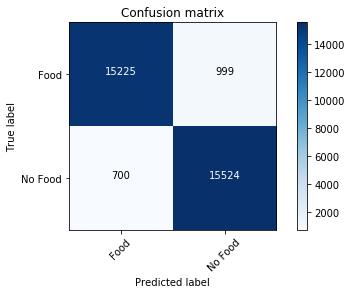



##################################################################################################


mobilenet complex gen full extended v23.3 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.3 Weights V23.h5
Accuracy: 0.948595
Precision: 0.942324
Recall: 0.955683
F1 score: 0.948956
Cohens kappa: 0.897189
ROC AUC: 0.987034
F-measure = 0.9486
accuracy = 0.9486
Confusion matrix:
[[15275   949]
 [  719 15505]]


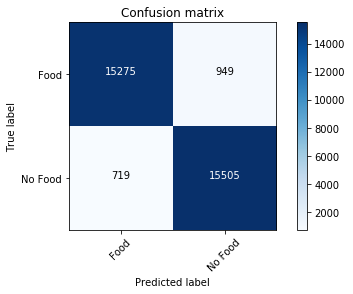



##################################################################################################


mobilenet complex gen full extended v23.4 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.4 Weights V23.h5
Accuracy: 0.950752
Precision: 0.940383
Recall: 0.962525
F1 score: 0.951325
Cohens kappa: 0.901504
ROC AUC: 0.987605
F-measure = 0.9507
accuracy = 0.9508
Confusion matrix:
[[15234   990]
 [  608 15616]]


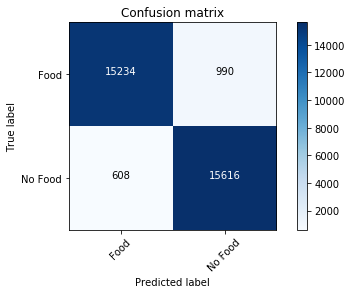



##################################################################################################


mobilenet complex gen full extended v23.5 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.5 Weights V23.h5
Accuracy: 0.954389
Precision: 0.952214
Recall: 0.956792
F1 score: 0.954498
Cohens kappa: 0.908777
ROC AUC: 0.988277
F-measure = 0.9544
accuracy = 0.9544
Confusion matrix:
[[15445   779]
 [  701 15523]]


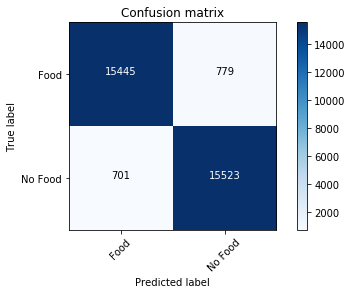



##################################################################################################


mobilenet complex gen full extended v23.6 Weights V23.h5
D:\Trained Models\Model 2\mobilenet complex gen full extended v23.6 Weights V23.h5
Accuracy: 0.963233
Precision: 0.972049
Recall: 0.953895
F1 score: 0.962887
Cohens kappa: 0.926467
ROC AUC: 0.991270
F-measure = 0.9632
accuracy = 0.9632
Confusion matrix:
[[15779   445]
 [  748 15476]]


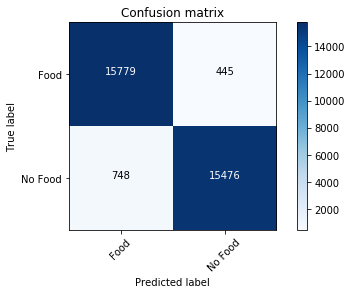



##################################################################################################


mobilenet complex gen full v20 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20 Weights V20.h5
Accuracy: 0.955529
Precision: 0.975671
Recall: 0.934357
F1 score: 0.954567
Cohens kappa: 0.911058
ROC AUC: 0.990632
F-measure = 0.9555
accuracy = 0.9555
Confusion matrix:
[[15846   378]
 [ 1065 15159]]


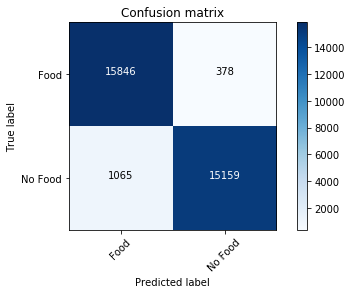



##################################################################################################


mobilenet complex gen full v20.1 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.1 Weights V20.h5
Accuracy: 0.943263
Precision: 0.936775
Recall: 0.950690
F1 score: 0.943681
Cohens kappa: 0.886526
ROC AUC: 0.985580
F-measure = 0.9433
accuracy = 0.9433
Confusion matrix:
[[15183  1041]
 [  800 15424]]


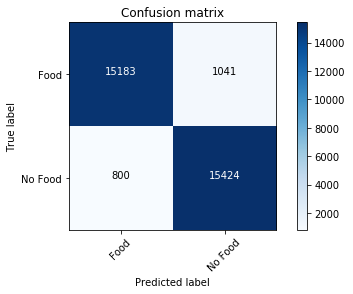



##################################################################################################


mobilenet complex gen full v20.2 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.2 Weights V20.h5
Accuracy: 0.944188
Precision: 0.945754
Recall: 0.942431
F1 score: 0.944089
Cohens kappa: 0.888375
ROC AUC: 0.984922
F-measure = 0.9442
accuracy = 0.9442
Confusion matrix:
[[15347   877]
 [  934 15290]]


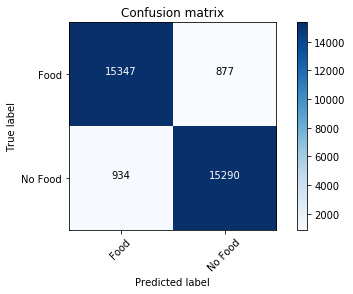



##################################################################################################


mobilenet complex gen full v20.5 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.5 Weights V20.h5
Accuracy: 0.958642
Precision: 0.967458
Recall: 0.949211
F1 score: 0.958248
Cohens kappa: 0.917283
ROC AUC: 0.989592
F-measure = 0.9586
accuracy = 0.9586
Confusion matrix:
[[15706   518]
 [  824 15400]]


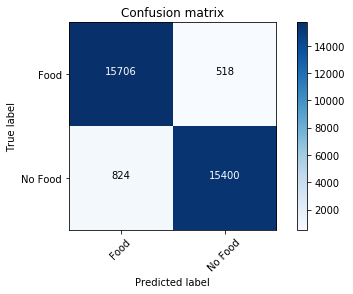



##################################################################################################


mobilenet complex gen full v20.8 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.8 Weights V20.h5
Accuracy: 0.940613
Precision: 0.939610
Recall: 0.941753
F1 score: 0.940680
Cohens kappa: 0.881225
ROC AUC: 0.982201
F-measure = 0.9406
accuracy = 0.9406
Confusion matrix:
[[15242   982]
 [  945 15279]]


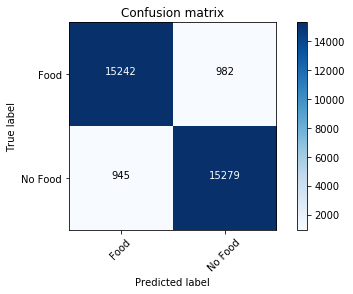



##################################################################################################


mobilenet complex gen full v20.9 Weights V20.h5
D:\Trained Models\Model 2\mobilenet complex gen full v20.9 Weights V20.h5
Accuracy: 0.937531
Precision: 0.959777
Recall: 0.913338
F1 score: 0.935982
Cohens kappa: 0.875062
ROC AUC: 0.983828
F-measure = 0.9375
accuracy = 0.9375
Confusion matrix:
[[15603   621]
 [ 1406 14818]]


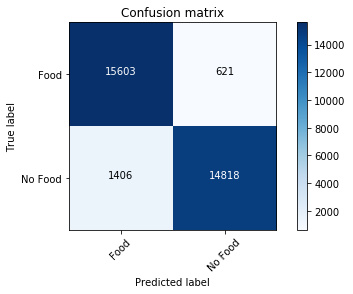



##################################################################################################


mobilenet small compressed dataset fit v1 Weights V1.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v1 Weights V1.h5
Accuracy: 0.088110
Precision: 0.064516
Recall: 0.061021
F1 score: 0.062720
Cohens kappa: -0.823780
ROC AUC: 0.039406
F-measure = 0.0874
accuracy = 0.0881
Confusion matrix:
[[ 1869 14355]
 [15234   990]]


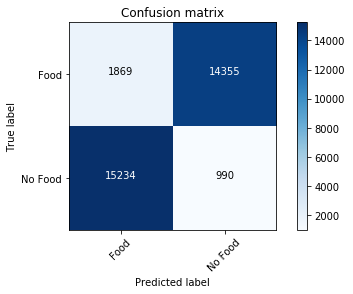



##################################################################################################


mobilenet small compressed dataset fit v2 Weights V2.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset fit v2 Weights V2.h5
Accuracy: 0.069126
Precision: 0.044385
Recall: 0.041975
F1 score: 0.043146
Cohens kappa: -0.861748
ROC AUC: 0.028990
F-measure = 0.0684
accuracy = 0.0691
Confusion matrix:
[[ 1562 14662]
 [15543   681]]


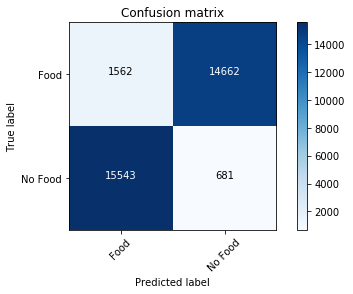



##################################################################################################


mobilenet small compressed dataset simple gen v3 Weights V3.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v3 Weights V3.h5
Accuracy: 0.136187
Precision: 0.164916
Recall: 0.179056
F1 score: 0.171695
Cohens kappa: -0.727626
ROC AUC: 0.057239
F-measure = 0.1346
accuracy = 0.1362
Confusion matrix:
[[ 1514 14710]
 [13319  2905]]


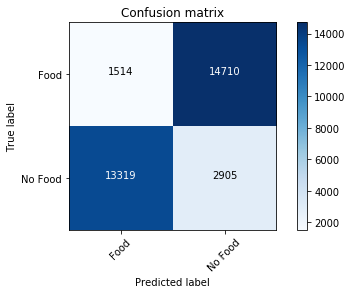



##################################################################################################


mobilenet small compressed dataset simple gen v4 Weights V4.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v4 Weights V4.h5
Accuracy: 0.108266
Precision: 0.082616
Recall: 0.077539
F1 score: 0.079997
Cohens kappa: -0.783469
ROC AUC: 0.048777
F-measure = 0.1074
accuracy = 0.1083
Confusion matrix:
[[ 2255 13969]
 [14966  1258]]


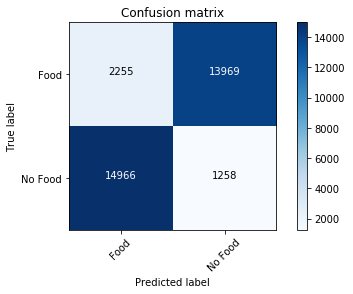



##################################################################################################


mobilenet small compressed dataset simple gen v5 Weights V5.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v5 Weights V5.h5
Accuracy: 0.126140
Precision: 0.054630
Recall: 0.045858
F1 score: 0.049861
Cohens kappa: -0.747719
ROC AUC: 0.055385
F-measure = 0.1205
accuracy = 0.1261
Confusion matrix:
[[ 3349 12875]
 [15480   744]]


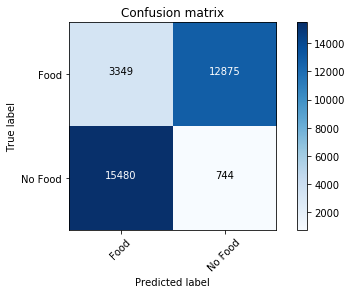



##################################################################################################


mobilenet small compressed dataset simple gen v6 Weights V6.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v6 Weights V6.h5
Accuracy: 0.125955
Precision: 0.130443
Recall: 0.132027
F1 score: 0.131230
Cohens kappa: -0.748089
ROC AUC: 0.055321
F-measure = 0.1259
accuracy = 0.1260
Confusion matrix:
[[ 1945 14279]
 [14082  2142]]


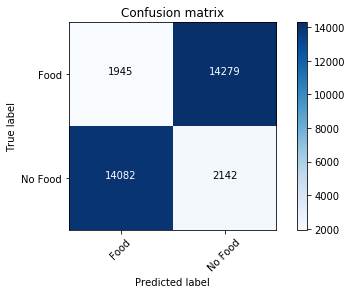



##################################################################################################


mobilenet small compressed dataset simple gen v7 Weights V7.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v7 Weights V7.h5
Accuracy: 0.335152
Precision: 0.399662
Recall: 0.656620
F1 score: 0.496887
Cohens kappa: -0.329697
ROC AUC: 0.082350
F-measure = 0.2585
accuracy = 0.3352
Confusion matrix:
[[  222 16002]
 [ 5571 10653]]


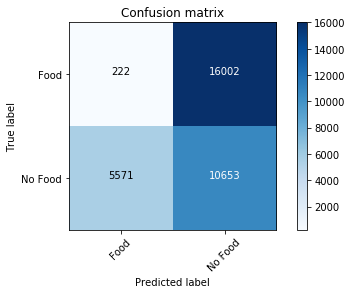



##################################################################################################


mobilenet small compressed dataset simple gen v8 Weights V8.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v8 Weights V8.h5
Accuracy: 0.117758
Precision: 0.126977
Recall: 0.130116
F1 score: 0.128528
Cohens kappa: -0.764485
ROC AUC: 0.051605
F-measure = 0.1176
accuracy = 0.1178
Confusion matrix:
[[ 1710 14514]
 [14113  2111]]


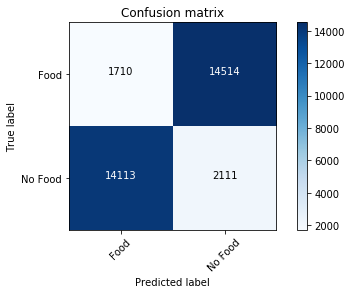



##################################################################################################


mobilenet small compressed dataset simple gen v9 Weights V9.h5
D:\Trained Models\Model 2\mobilenet small compressed dataset simple gen v9 Weights V9.h5
Accuracy: 0.130948
Precision: 0.152314
Recall: 0.161674
F1 score: 0.156855
Cohens kappa: -0.738104
ROC AUC: 0.056598
F-measure = 0.1301
accuracy = 0.1309
Confusion matrix:
[[ 1626 14598]
 [13601  2623]]


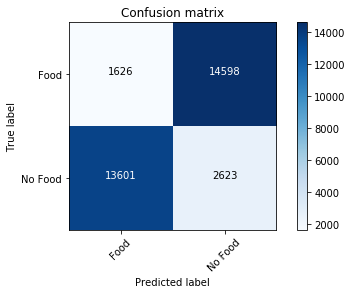



##################################################################################################


mobilenet R3 complex gen full v21 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21 Weights V21.h5
Accuracy: 0.911243
Precision: 0.910029
Recall: 0.912722
F1 score: 0.911374
Cohens kappa: 0.822485
ROC AUC: 0.963824
F-measure = 0.9112
accuracy = 0.9112
Confusion matrix:
[[14760  1464]
 [ 1416 14808]]


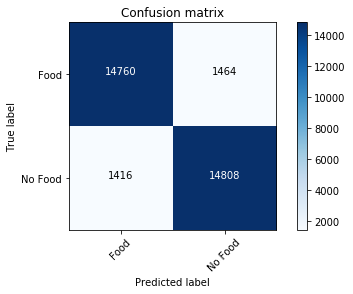



##################################################################################################


mobilenet R3 complex gen full v21.1 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.1 Weights V21.h5
Accuracy: 0.873521
Precision: 0.814838
Recall: 0.966716
F1 score: 0.884303
Cohens kappa: 0.747041
ROC AUC: 0.955052
F-measure = 0.8724
accuracy = 0.8735
Confusion matrix:
[[12660  3564]
 [  540 15684]]


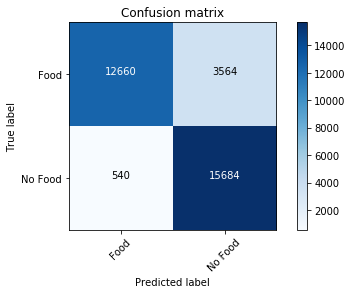



##################################################################################################


mobilenet R3 complex gen full v21.2 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.2 Weights V21.h5
Accuracy: 0.937808
Precision: 0.961473
Recall: 0.912167
F1 score: 0.936172
Cohens kappa: 0.875616
ROC AUC: 0.981392
F-measure = 0.9378
accuracy = 0.9378
Confusion matrix:
[[15631   593]
 [ 1425 14799]]


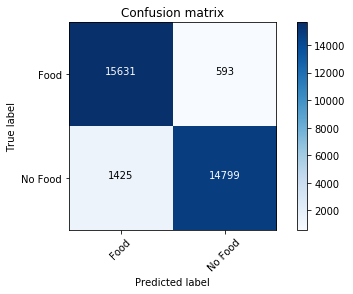



##################################################################################################


mobilenet R3 complex gen full v21.3 Weights V21.h5
D:\Trained Models\Model 3\mobilenet R3 complex gen full v21.3 Weights V21.h5
Accuracy: 0.903291
Precision: 0.883664
Recall: 0.928871
F1 score: 0.905703
Cohens kappa: 0.806583
ROC AUC: 0.967910
F-measure = 0.9032
accuracy = 0.9033
Confusion matrix:
[[14240  1984]
 [ 1154 15070]]


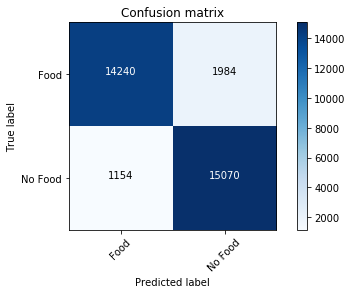



##################################################################################################


Simple Custom Model Gen Simple V3 V102.h5
D:\Trained Models\Model 4\Simple Custom Model Gen Simple V3 V102.h5
Accuracy: 0.810281
Precision: 0.843852
Recall: 0.761464
F1 score: 0.800544
Cohens kappa: 0.620562
ROC AUC: 0.867845
F-measure = 0.8098
accuracy = 0.8103
Confusion matrix:
[[13938  2286]
 [ 3870 12354]]


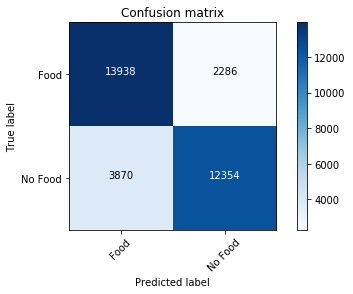



##################################################################################################


Simple Custom Model V2 V101.h5
D:\Trained Models\Model 4\Simple Custom Model V2 V101.h5
Accuracy: 0.795581
Precision: 0.930051
Recall: 0.639238
F1 score: 0.757699
Cohens kappa: 0.591161
ROC AUC: 0.886018
F-measure = 0.7905
accuracy = 0.7956
Confusion matrix:
[[15444   780]
 [ 5853 10371]]


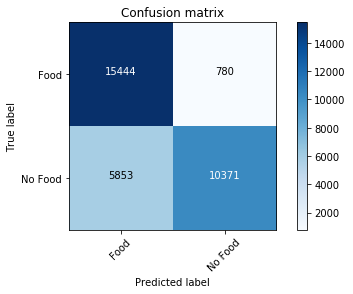



##################################################################################################


Simple Custom Model Gen Simple V4 Weights V103.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V4 Weights V103.h5
Accuracy: 0.182908
Precision: 0.184986
Recall: 0.186206
F1 score: 0.185594
Cohens kappa: -0.634184
ROC AUC: 0.119123
F-measure = 0.1829
accuracy = 0.1829
Confusion matrix:
[[ 2914 13310]
 [13203  3021]]


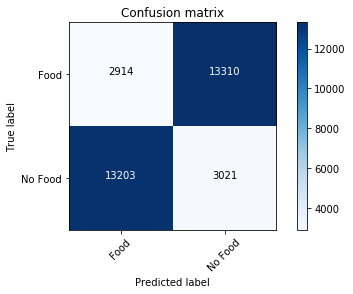



##################################################################################################


Simple Custom Model Gen Simple V5 Weights V104.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V5 Weights V104.h5
Accuracy: 0.228735
Precision: 0.092047
Recall: 0.061206
F1 score: 0.073523
Cohens kappa: -0.542530
ROC AUC: 0.148939
F-measure = 0.2065
accuracy = 0.2287
Confusion matrix:
[[ 6429  9795]
 [15231   993]]


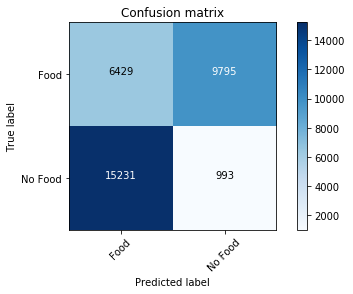



##################################################################################################


Simple Custom Model Gen Simple V6 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V6 Weights V105.h5
Accuracy: 0.182970
Precision: 0.159484
Recall: 0.148484
F1 score: 0.153787
Cohens kappa: -0.634061
ROC AUC: 0.122229
F-measure = 0.1820
accuracy = 0.1830
Confusion matrix:
[[ 3528 12696]
 [13815  2409]]


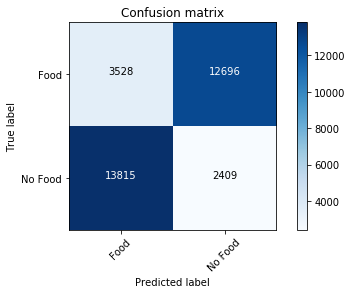



##################################################################################################


Simple Custom Model Gen Simple V7 Weights V105.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V7 Weights V105.h5
Accuracy: 0.179179
Precision: 0.157024
Recall: 0.146881
F1 score: 0.151783
Cohens kappa: -0.641642
ROC AUC: 0.124371
F-measure = 0.1783
accuracy = 0.1792
Confusion matrix:
[[ 3431 12793]
 [13841  2383]]


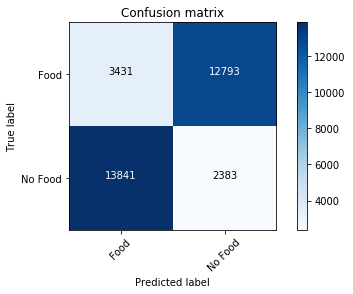



##################################################################################################


Simple Custom Model Gen Simple V8 Weights V107.h5
D:\Trained Models\Model 5\Simple Custom Model Gen Simple V8 Weights V107.h5
Accuracy: 0.183863
Precision: 0.174349
Recall: 0.169255
F1 score: 0.171765
Cohens kappa: -0.632273
ROC AUC: 0.123359
F-measure = 0.1837
accuracy = 0.1839
Confusion matrix:
[[ 3220 13004]
 [13478  2746]]


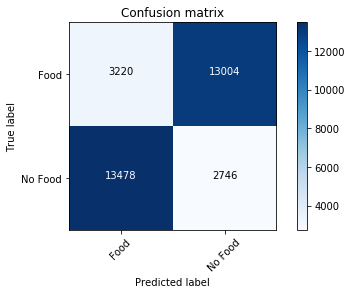



##################################################################################################


Simple Custom Model V1 Weights V100.h5
D:\Trained Models\Model 5\Simple Custom Model V1 Weights V100.h5
Accuracy: 0.202046
Precision: 0.088386
Recall: 0.063979
F1 score: 0.074228
Cohens kappa: -0.595907
ROC AUC: 0.114112
F-measure = 0.1865
accuracy = 0.2020
Confusion matrix:
[[ 5518 10706]
 [15186  1038]]


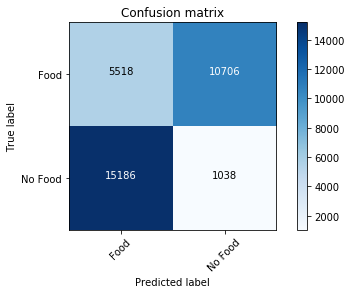



##################################################################################################


Simple Custom Model Gen Simple V3 Weights V102.h5
D:\Trained Models\Model 6\Simple Custom Model Gen Simple V3 Weights V102.h5
Accuracy: 0.189719
Precision: 0.156148
Recall: 0.140902
F1 score: 0.148134
Cohens kappa: -0.620562
ROC AUC: 0.132155
F-measure = 0.1878
accuracy = 0.1897
Confusion matrix:
[[ 3870 12354]
 [13938  2286]]


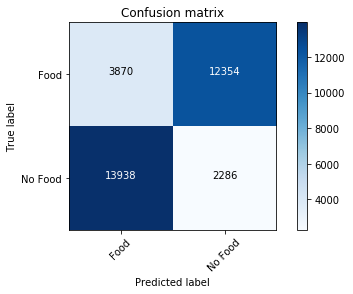



##################################################################################################


Simple Custom Model V2 Weights V101.h5
D:\Trained Models\Model 6\Simple Custom Model V2 Weights V101.h5
Accuracy: 0.204419
Precision: 0.069949
Recall: 0.048077
F1 score: 0.056986
Cohens kappa: -0.591161
ROC AUC: 0.113982
F-measure = 0.1845
accuracy = 0.2044
Confusion matrix:
[[ 5853 10371]
 [15444   780]]


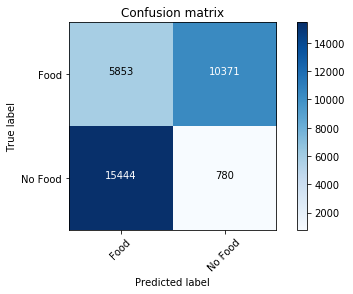



##################################################################################################




In [34]:
for filename in os.listdir(M1_DIR):
    print(filename)
    model_path = os.path.join(M1_DIR, filename)
    print(model_path)
    mobile_v5.load_weights(model_path)
    testPerformance2(mobile_v5, xv, yv)
    testPerformance(mobile_v5, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M2_DIR):
    print(filename)
    model_path = os.path.join(M2_DIR, filename)
    print(model_path)
    mobile_v1.load_weights(model_path)
    testPerformance2(mobile_v1, xv, yv)
    testPerformance(mobile_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M3_DIR):
    print(filename)
    model_path = os.path.join(M3_DIR, filename)
    print(model_path)
    mobile_v3.load_weights(model_path)
    testPerformance2(mobile_v3, xv, yv)
    testPerformance(mobile_v3, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M4_DIR):
    print(filename)
    model_path = os.path.join(M4_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2std(model_v2, xv, yv)
    testPerformancestd(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M5_DIR):
    print(filename)
    model_path = os.path.join(M5_DIR, filename)
    print(model_path)
    model_v1.load_weights(model_path)
    testPerformance2(model_v1, xv, yv)
    testPerformance(model_v1, xv, yv) 
    print('\n\n##################################################################################################\n\n')
    
for filename in os.listdir(M6_DIR):
    print(filename)
    model_path = os.path.join(M6_DIR, filename)
    print(model_path)
    model_v2.load_weights(model_path)
    testPerformance2(model_v2, xv, yv)
    testPerformance(model_v2, xv, yv) 
    print('\n\n##################################################################################################\n\n')

In [35]:
del x
del y
del xt
del yt
del xv
del yv
del s
del yb
del ytb
del yvb
del model_v1
del model_v2
del mobile_v1
del mobile_v3
del mobile_v5

In [37]:
gc.collect()

0